In [7]:
#hide
from fastbook import *
from kaggle import api
from pandas.api.types import is_string_dtype, is_numeric_dtype, is_categorical_dtype
from fastai.tabular.all import *
from IPython.display import Image, display_svg, SVG
from fastai.vision.core import *
from fastai.vision.data import *
import torch
pd.options.display.max_rows = 20
pd.options.display.max_columns = 8

In [8]:
path = URLs.path('titanic')
train_path = path/'train.csv'
test_path = path/'test.csv'
df = pd.read_csv(train_path, low_memory=False,skipinitialspace=True)

In [9]:
#sizes = 'S', 'C', 'Q'
#df['Embarked'] = df['Embarked'].astype('category')
#df['Embarked'].cat.set_categories(sizes, ordered=True, inplace=True)

dep_var = 'Survived'


In [10]:
df.head()

,PassengerId,Survived,Pclass,Name,...,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",...,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Thayer)",...,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",...,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",...,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",...,373450,8.0500,NaN,S


In [11]:
df.columns
#df.dtypes

Index(['PassengerId', 'Survived', 'Pclass', 'Name', 'Sex', 'Age', 'SibSp',
       'Parch', 'Ticket', 'Fare', 'Cabin', 'Embarked'],
      dtype='object')

In [12]:
cat_names = [ 'Pclass', 'SibSp',
       'Parch', 'Fare', 'Cabin', 'Embarked', 'Sex']
cont_names = ['Age','PassengerId']
procs = [Categorify, FillMissing, Normalize]
dls = TabularDataLoaders.from_csv(train_path, path, procs=procs, cat_names=cat_names, cont_names=cont_names, 
                                 y_names=dep_var, valid_idx=list(range(600,800)), bs=64,y_block = CategoryBlock)
n_train = len(df)
list_dls =np.empty([n_train], dtype = object, order = 'C')

for i in range(0,n_train):
    dls_temp = TabularDataLoaders.from_csv(train_path, path, procs=procs, cat_names=cat_names, cont_names=cont_names, 
                                 y_names=dep_var, 
                                    valid_idx=list(range(200,201)), bs=32,y_block = CategoryBlock)
    list_dls[i] = dls_temp

In [ ]:
dls.show_batch()
#dls.one_batch

* cat_names 离散值
* cont_names 连续值

epoch,train_loss,valid_loss,accuracy,time
0,0.044941,0.037583,0.000000,00:00
1,0.034182,0.004830,1.000000,00:00
2,0.026530,0.011339,1.000000,00:00
3,0.022105,0.013650,1.000000,00:00
4,0.018064,0.045059,0.000000,00:00
5,0.014420,0.028762,0.000000,00:00
6,0.011765,0.045554,0.000000,00:00
7,0.010080,0.047839,0.000000,00:00
8,0.008989,0.057637,0.000000,00:00
9,0.008041,0.062790,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.037766,0.005053,1.000000,00:00
1,0.028505,0.006694,1.000000,00:00
2,0.030024,0.002156,1.000000,00:00
3,0.024163,0.007465,1.000000,00:00
4,0.018335,0.005896,1.000000,00:00
5,0.014236,0.009671,1.000000,00:00
6,0.011785,0.014748,1.000000,00:00
7,0.009993,0.011033,1.000000,00:00
8,0.008578,0.013300,1.000000,00:00
9,0.007833,0.014211,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.041742,0.015990,1.000000,00:00
1,0.033861,0.013476,1.000000,00:00
2,0.030281,0.007779,1.000000,00:00
3,0.023148,0.010931,1.000000,00:00
4,0.017782,0.006493,1.000000,00:00
5,0.014656,0.017500,1.000000,00:00
6,0.012578,0.047473,0.000000,00:00
7,0.010745,0.026822,0.000000,00:00
8,0.009515,0.024486,0.000000,00:00
9,0.008566,0.025414,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.052400,0.081433,0.000000,00:00
1,0.036238,0.026215,0.000000,00:00
2,0.026814,0.009954,1.000000,00:00
3,0.021813,0.006469,1.000000,00:00
4,0.017452,0.005597,1.000000,00:00
5,0.014428,0.020319,1.000000,00:00
6,0.011866,0.032555,0.000000,00:00
7,0.010590,0.024012,0.000000,00:00
8,0.009238,0.022150,0.000000,00:00
9,0.008010,0.025468,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.030500,0.055248,0.000000,00:00
1,0.031113,0.025450,0.000000,00:00
2,0.027266,0.021687,0.000000,00:00
3,0.021821,0.009174,1.000000,00:00
4,0.017387,0.016146,1.000000,00:00
5,0.014265,0.027430,0.000000,00:00
6,0.012036,0.016949,1.000000,00:00
7,0.010223,0.033400,0.000000,00:00
8,0.008878,0.028731,0.000000,00:00
9,0.007918,0.024095,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.065747,0.018230,1.000000,00:00
1,0.044053,0.012605,1.000000,00:00
2,0.031782,0.010628,1.000000,00:00
3,0.026443,0.016948,1.000000,00:00
4,0.020625,0.008215,1.000000,00:00
5,0.015949,0.028501,0.000000,00:00
6,0.012968,0.019094,1.000000,00:00
7,0.010886,0.009967,1.000000,00:00
8,0.009511,0.020669,1.000000,00:00
9,0.008146,0.017263,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.038155,0.041379,0.000000,00:00
1,0.029963,0.015097,1.000000,00:00
2,0.026611,0.008169,1.000000,00:00
3,0.020496,0.024171,0.000000,00:00
4,0.017314,0.010467,1.000000,00:00
5,0.015541,0.028258,0.000000,00:00
6,0.012771,0.015306,1.000000,00:00
7,0.011070,0.043464,0.000000,00:00
8,0.009993,0.041798,0.000000,00:00
9,0.008575,0.035831,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.032892,0.005365,1.000000,00:00
1,0.026144,0.006601,1.000000,00:00
2,0.026826,0.023597,0.000000,00:00
3,0.021912,0.021581,1.000000,00:00
4,0.017185,0.024452,0.000000,00:00
5,0.014044,0.022182,0.000000,00:00
6,0.011771,0.020054,1.000000,00:00
7,0.009670,0.028393,0.000000,00:00
8,0.008476,0.025725,0.000000,00:00
9,0.007758,0.028598,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.036428,0.013805,1.000000,00:00
1,0.031997,0.005314,1.000000,00:00
2,0.026930,0.003727,1.000000,00:00
3,0.021885,0.026913,0.000000,00:00
4,0.017438,0.022977,0.000000,00:00
5,0.013990,0.032765,0.000000,00:00
6,0.011886,0.039481,0.000000,00:00
7,0.010245,0.051802,0.000000,00:00
8,0.008992,0.032139,0.000000,00:00
9,0.007831,0.036219,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.035583,0.028101,0.000000,00:00
1,0.032033,0.009823,1.000000,00:00
2,0.027534,0.006350,1.000000,00:00
3,0.022025,0.105355,0.000000,00:00
4,0.018526,0.017551,1.000000,00:00
5,0.015027,0.013504,1.000000,00:00
6,0.012210,0.023115,0.000000,00:00
7,0.010442,0.021828,0.000000,00:00
8,0.008885,0.034143,0.000000,00:00
9,0.007955,0.034106,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.035305,0.012831,1.000000,00:00
1,0.029446,0.017847,1.000000,00:00
2,0.025109,0.017192,1.000000,00:00
3,0.020311,0.008791,1.000000,00:00
4,0.016798,0.032353,0.000000,00:00
5,0.015054,0.002561,1.000000,00:00
6,0.012597,0.012923,1.000000,00:00
7,0.010475,0.008229,1.000000,00:00
8,0.008965,0.018837,1.000000,00:00
9,0.007916,0.017922,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.059089,0.014578,1.000000,00:00
1,0.037960,0.011363,1.000000,00:00
2,0.027175,0.020569,1.000000,00:00
3,0.023450,0.075135,0.000000,00:00
4,0.020043,0.009864,1.000000,00:00
5,0.015412,0.044264,0.000000,00:00
6,0.012394,0.044229,0.000000,00:00
7,0.010532,0.035015,0.000000,00:00
8,0.008832,0.036672,0.000000,00:00
9,0.007968,0.042573,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.071765,0.176049,0.000000,00:00
1,0.043888,0.034596,0.000000,00:00
2,0.031653,0.009088,1.000000,00:00
3,0.024723,0.005118,1.000000,00:00
4,0.020638,0.008325,1.000000,00:00
5,0.016750,0.016910,1.000000,00:00
6,0.013680,0.015268,1.000000,00:00
7,0.011293,0.025904,0.000000,00:00
8,0.009483,0.019287,1.000000,00:00
9,0.008486,0.020720,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.037554,0.014664,1.000000,00:00
1,0.033256,0.017350,1.000000,00:00
2,0.026367,0.005032,1.000000,00:00
3,0.020791,0.022315,0.000000,00:00
4,0.016515,0.021074,1.000000,00:00
5,0.014657,0.017525,1.000000,00:00
6,0.012403,0.018182,1.000000,00:00
7,0.010705,0.012582,1.000000,00:00
8,0.009588,0.029509,0.000000,00:00
9,0.008487,0.024394,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.046087,0.020577,1.000000,00:00
1,0.032518,0.006871,1.000000,00:00
2,0.026923,0.005207,1.000000,00:00
3,0.022173,0.011196,1.000000,00:00
4,0.018617,0.018257,1.000000,00:00
5,0.015803,0.012593,1.000000,00:00
6,0.012948,0.021538,1.000000,00:00
7,0.010779,0.031687,0.000000,00:00
8,0.009090,0.019759,1.000000,00:00
9,0.008032,0.019600,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.046550,0.006876,1.000000,00:00
1,0.033440,0.005180,1.000000,00:00
2,0.027562,0.093203,0.000000,00:00
3,0.023685,0.008012,1.000000,00:00
4,0.018674,0.013300,1.000000,00:00
5,0.014979,0.022926,0.000000,00:00
6,0.012521,0.050378,0.000000,00:00
7,0.010458,0.025865,0.000000,00:00
8,0.008986,0.035601,0.000000,00:00
9,0.007669,0.039222,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.028070,0.027900,0.000000,00:00
1,0.037410,0.006638,1.000000,00:00
2,0.030098,0.008245,1.000000,00:00
3,0.023846,0.010993,1.000000,00:00
4,0.018998,0.015904,1.000000,00:00
5,0.015296,0.018303,1.000000,00:00
6,0.012568,0.016394,1.000000,00:00
7,0.011065,0.017915,1.000000,00:00
8,0.009566,0.016974,1.000000,00:00
9,0.008758,0.020090,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.043903,0.029031,0.000000,00:00
1,0.035992,0.008316,1.000000,00:00
2,0.027692,0.007384,1.000000,00:00
3,0.021716,0.009398,1.000000,00:00
4,0.018323,0.020080,1.000000,00:00
5,0.014709,0.016906,1.000000,00:00
6,0.012271,0.019467,1.000000,00:00
7,0.010338,0.018066,1.000000,00:00
8,0.009040,0.025729,0.000000,00:00
9,0.007785,0.031742,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.035369,0.016799,1.000000,00:00
1,0.035384,0.004154,1.000000,00:00
2,0.028875,0.005107,1.000000,00:00
3,0.023329,0.016122,1.000000,00:00
4,0.018546,0.006021,1.000000,00:00
5,0.014821,0.013189,1.000000,00:00
6,0.011861,0.023031,0.000000,00:00
7,0.010433,0.021447,1.000000,00:00
8,0.008894,0.013634,1.000000,00:00
9,0.008066,0.020696,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.031406,0.063921,0.000000,00:00
1,0.036467,0.008902,1.000000,00:00
2,0.027213,0.009553,1.000000,00:00
3,0.021808,0.030223,0.000000,00:00
4,0.017499,0.108467,0.000000,00:00
5,0.015628,0.006134,1.000000,00:00
6,0.012781,0.012579,1.000000,00:00
7,0.010873,0.015472,1.000000,00:00
8,0.009496,0.017060,1.000000,00:00
9,0.008285,0.021748,0.000000,00:00


D:\anaconda\envs\tensorflow\lib\site-packages\fastai\callback\schedule.py:262: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(1,1)


epoch,train_loss,valid_loss,accuracy,time
0,0.046775,0.089567,0.000000,00:00
1,0.035736,0.050832,0.000000,00:00
2,0.036191,0.001852,1.000000,00:00
3,0.026748,0.028540,0.000000,00:00
4,0.019862,0.054476,0.000000,00:00
5,0.015174,0.012318,1.000000,00:00
6,0.012282,0.028017,0.000000,00:00
7,0.010259,0.051975,0.000000,00:00
8,0.009131,0.042690,0.000000,00:00
9,0.008178,0.043487,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.031088,0.050189,0.000000,00:00
1,0.031623,0.034970,0.000000,00:00
2,0.028573,0.002663,1.000000,00:00
3,0.022073,0.002099,1.000000,00:00
4,0.017351,0.017030,1.000000,00:00
5,0.013811,0.034901,0.000000,00:00
6,0.011441,0.029026,0.000000,00:00
7,0.009875,0.019300,1.000000,00:00
8,0.008581,0.024351,0.000000,00:00
9,0.007714,0.024998,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.032685,0.038965,0.000000,00:00
1,0.030126,0.017541,1.000000,00:00
2,0.029551,0.017661,1.000000,00:00
3,0.024130,0.002558,1.000000,00:00
4,0.018920,0.011555,1.000000,00:00
5,0.014926,0.018876,1.000000,00:00
6,0.012779,0.018831,1.000000,00:00
7,0.010980,0.014564,1.000000,00:00
8,0.009704,0.014841,1.000000,00:00
9,0.008764,0.018018,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.044073,0.069213,0.000000,00:00
1,0.034502,0.059631,0.000000,00:00
2,0.027402,0.006074,1.000000,00:00
3,0.023144,0.025727,0.000000,00:00
4,0.018141,0.010398,1.000000,00:00
5,0.014636,0.020285,1.000000,00:00
6,0.012450,0.015189,1.000000,00:00
7,0.010333,0.023868,0.000000,00:00
8,0.008976,0.022355,0.000000,00:00
9,0.008056,0.023876,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.054942,0.001929,1.000000,00:00
1,0.035503,0.003896,1.000000,00:00
2,0.025677,0.008904,1.000000,00:00
3,0.025700,0.001215,1.000000,00:00
4,0.020714,0.007496,1.000000,00:00
5,0.016524,0.010758,1.000000,00:00
6,0.013033,0.013613,1.000000,00:00
7,0.010707,0.013593,1.000000,00:00
8,0.009426,0.018749,1.000000,00:00
9,0.008454,0.017255,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.043545,0.059607,0.000000,00:00
1,0.032162,0.022308,0.000000,00:00
2,0.025196,0.003361,1.000000,00:00
3,0.024756,0.001998,1.000000,00:00
4,0.019446,0.014268,1.000000,00:00
5,0.015876,0.018632,1.000000,00:00
6,0.012673,0.026500,0.000000,00:00
7,0.010630,0.035109,0.000000,00:00
8,0.009227,0.039742,0.000000,00:00
9,0.008224,0.034457,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.034019,0.070576,0.000000,00:00
1,0.030480,0.017326,1.000000,00:00
2,0.023712,0.004655,1.000000,00:00
3,0.019785,0.004610,1.000000,00:00
4,0.016224,0.011581,1.000000,00:00
5,0.013780,0.008088,1.000000,00:00
6,0.011507,0.019807,1.000000,00:00
7,0.009877,0.016908,1.000000,00:00
8,0.008564,0.018511,1.000000,00:00
9,0.007731,0.018346,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.034095,0.087203,0.000000,00:00
1,0.029901,0.034619,0.000000,00:00
2,0.024714,0.013014,1.000000,00:00
3,0.020662,0.046178,0.000000,00:00
4,0.016963,0.043998,0.000000,00:00
5,0.014198,0.015196,1.000000,00:00
6,0.012024,0.030781,0.000000,00:00
7,0.010444,0.009354,1.000000,00:00
8,0.009080,0.028411,0.000000,00:00
9,0.008723,0.024439,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.056009,0.032596,0.000000,00:00
1,0.035914,0.019277,1.000000,00:00
2,0.031751,0.000860,1.000000,00:00
3,0.023884,0.034466,0.000000,00:00
4,0.018747,0.017977,1.000000,00:00
5,0.014840,0.020208,1.000000,00:00
6,0.012421,0.035792,0.000000,00:00
7,0.010418,0.025737,0.000000,00:00
8,0.009319,0.035904,0.000000,00:00
9,0.008769,0.029808,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.039117,0.079594,0.000000,00:00
1,0.030140,0.036907,0.000000,00:00
2,0.023978,0.007258,1.000000,00:00
3,0.020438,0.017738,1.000000,00:00
4,0.018037,0.017090,1.000000,00:00
5,0.015182,0.024887,0.000000,00:00
6,0.012484,0.030239,0.000000,00:00
7,0.010365,0.032529,0.000000,00:00
8,0.009207,0.032752,0.000000,00:00
9,0.008257,0.030120,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.040551,0.027657,0.000000,00:00
1,0.035071,0.029883,0.000000,00:00
2,0.033652,0.001302,1.000000,00:00
3,0.025587,0.005926,1.000000,00:00
4,0.019321,0.084267,0.000000,00:00
5,0.015232,0.031261,0.000000,00:00
6,0.012537,0.052464,0.000000,00:00
7,0.010403,0.044416,0.000000,00:00
8,0.009193,0.044901,0.000000,00:00
9,0.008103,0.047355,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.038798,0.034381,0.000000,00:00
1,0.030007,0.008758,1.000000,00:00
2,0.029264,0.009288,1.000000,00:00
3,0.023676,0.008860,1.000000,00:00
4,0.018953,0.010512,1.000000,00:00
5,0.014794,0.025329,0.000000,00:00
6,0.012492,0.026335,0.000000,00:00
7,0.010556,0.030426,0.000000,00:00
8,0.009090,0.032392,0.000000,00:00
9,0.008024,0.031467,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.040860,0.006600,1.000000,00:00
1,0.030862,0.005677,1.000000,00:00
2,0.029724,0.003986,1.000000,00:00
3,0.022911,0.021389,1.000000,00:00
4,0.018178,0.047275,0.000000,00:00
5,0.014578,0.028924,0.000000,00:00
6,0.011984,0.025549,0.000000,00:00
7,0.010610,0.015387,1.000000,00:00
8,0.009453,0.031567,0.000000,00:00
9,0.008614,0.032266,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.035977,0.034746,0.000000,00:00
1,0.031686,0.022360,0.000000,00:00
2,0.028521,0.008532,1.000000,00:00
3,0.025614,0.001795,1.000000,00:00
4,0.019687,0.018754,1.000000,00:00
5,0.015674,0.017447,1.000000,00:00
6,0.013017,0.030701,0.000000,00:00
7,0.011173,0.022718,0.000000,00:00
8,0.009814,0.023801,0.000000,00:00
9,0.008953,0.023302,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.035751,0.003433,1.000000,00:00
1,0.030739,0.010010,1.000000,00:00
2,0.025178,0.019163,1.000000,00:00
3,0.021145,0.027911,0.000000,00:00
4,0.016862,0.050157,0.000000,00:00
5,0.013568,0.048557,0.000000,00:00
6,0.012913,0.025891,0.000000,00:00
7,0.010646,0.032895,0.000000,00:00
8,0.009078,0.041070,0.000000,00:00
9,0.008201,0.045414,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.050463,0.054032,0.000000,00:00
1,0.039011,0.022154,0.000000,00:00
2,0.028703,0.022815,0.000000,00:00
3,0.022703,0.002053,1.000000,00:00
4,0.018885,0.026271,0.000000,00:00
5,0.014835,0.060752,0.000000,00:00
6,0.012240,0.056329,0.000000,00:00
7,0.010430,0.024818,0.000000,00:00
8,0.009323,0.021575,1.000000,00:00
9,0.008321,0.032058,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.041361,0.021892,0.000000,00:00
1,0.033732,0.006642,1.000000,00:00
2,0.025229,0.005705,1.000000,00:00
3,0.020665,0.027304,0.000000,00:00
4,0.018207,0.014646,1.000000,00:00
5,0.015160,0.057218,0.000000,00:00
6,0.012481,0.024355,0.000000,00:00
7,0.010516,0.019395,1.000000,00:00
8,0.009281,0.026865,0.000000,00:00
9,0.008119,0.026151,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.034028,0.060530,0.000000,00:00
1,0.031457,0.026078,0.000000,00:00
2,0.026112,0.023367,0.000000,00:00
3,0.021479,0.015814,1.000000,00:00
4,0.017229,0.028507,0.000000,00:00
5,0.013678,0.011789,1.000000,00:00
6,0.011202,0.016089,1.000000,00:00
7,0.009651,0.014977,1.000000,00:00
8,0.008570,0.021581,1.000000,00:00
9,0.007730,0.020919,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.030183,0.069510,0.000000,00:00
1,0.028059,0.007260,1.000000,00:00
2,0.026210,0.010301,1.000000,00:00
3,0.021361,0.010034,1.000000,00:00
4,0.018079,0.024228,0.000000,00:00
5,0.015294,0.019490,1.000000,00:00
6,0.012730,0.013571,1.000000,00:00
7,0.010935,0.024258,0.000000,00:00
8,0.009494,0.017441,1.000000,00:00
9,0.008529,0.019794,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.049082,0.005105,1.000000,00:00
1,0.033680,0.004504,1.000000,00:00
2,0.031098,0.008075,1.000000,00:00
3,0.025307,0.024758,0.000000,00:00
4,0.021625,0.006493,1.000000,00:00
5,0.017748,0.024491,0.000000,00:00
6,0.013586,0.018000,1.000000,00:00
7,0.011168,0.024970,0.000000,00:00
8,0.009859,0.026117,0.000000,00:00
9,0.008691,0.020622,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.037796,0.025934,0.000000,00:00
1,0.029662,0.009835,1.000000,00:00
2,0.033879,0.000817,1.000000,00:00
3,0.026933,0.011832,1.000000,00:00
4,0.019874,0.012213,1.000000,00:00
5,0.015219,0.042776,0.000000,00:00
6,0.012891,0.031457,0.000000,00:00
7,0.010853,0.026881,0.000000,00:00
8,0.009183,0.030762,0.000000,00:00
9,0.008123,0.032823,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.034301,0.008668,1.000000,00:00
1,0.032248,0.009454,1.000000,00:00
2,0.025468,0.036579,0.000000,00:00
3,0.022218,0.005218,1.000000,00:00
4,0.017560,0.012713,1.000000,00:00
5,0.013922,0.011911,1.000000,00:00
6,0.011737,0.012493,1.000000,00:00
7,0.010602,0.019308,1.000000,00:00
8,0.009270,0.023628,0.000000,00:00
9,0.008049,0.023106,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.032688,0.010223,1.000000,00:00
1,0.035246,0.008871,1.000000,00:00
2,0.031714,0.015019,1.000000,00:00
3,0.023370,0.028240,0.000000,00:00
4,0.018058,0.018361,1.000000,00:00
5,0.014659,0.017833,1.000000,00:00
6,0.012563,0.013998,1.000000,00:00
7,0.010465,0.021302,1.000000,00:00
8,0.009115,0.020239,1.000000,00:00
9,0.008144,0.019369,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.068576,0.034810,0.000000,00:00
1,0.043366,0.018991,1.000000,00:00
2,0.029463,0.008591,1.000000,00:00
3,0.021592,0.012925,1.000000,00:00
4,0.017196,0.088314,0.000000,00:00
5,0.014061,0.033090,0.000000,00:00
6,0.012079,0.053940,0.000000,00:00
7,0.010425,0.033557,0.000000,00:00
8,0.009222,0.036448,0.000000,00:00
9,0.008279,0.035583,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.066129,0.024384,0.000000,00:00
1,0.040504,0.025340,0.000000,00:00
2,0.032460,0.009422,1.000000,00:00
3,0.024826,0.017847,1.000000,00:00
4,0.019169,0.059109,0.000000,00:00
5,0.016607,0.006187,1.000000,00:00
6,0.014712,0.014637,1.000000,00:00
7,0.012283,0.024367,0.000000,00:00
8,0.010557,0.038505,0.000000,00:00
9,0.009182,0.039076,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.066361,0.003224,1.000000,00:00
1,0.042659,0.001377,1.000000,00:00
2,0.030238,0.012388,1.000000,00:00
3,0.022445,0.019605,1.000000,00:00
4,0.018026,0.039711,0.000000,00:00
5,0.015331,0.091882,0.000000,00:00
6,0.013483,0.011719,1.000000,00:00
7,0.011107,0.030259,0.000000,00:00
8,0.009681,0.024461,0.000000,00:00
9,0.008492,0.027981,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.030829,0.018459,1.000000,00:00
1,0.027390,0.021490,1.000000,00:00
2,0.030573,0.008564,1.000000,00:00
3,0.024152,0.007354,1.000000,00:00
4,0.019669,0.009357,1.000000,00:00
5,0.015673,0.025975,0.000000,00:00
6,0.013061,0.035614,0.000000,00:00
7,0.011273,0.023431,0.000000,00:00
8,0.009787,0.035333,0.000000,00:00
9,0.008726,0.034019,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.045372,0.010667,1.000000,00:00
1,0.037020,0.024553,0.000000,00:00
2,0.028285,0.011517,1.000000,00:00
3,0.022381,0.007557,1.000000,00:00
4,0.017263,0.018899,1.000000,00:00
5,0.014554,0.010417,1.000000,00:00
6,0.011883,0.007396,1.000000,00:00
7,0.010495,0.015147,1.000000,00:00
8,0.009523,0.017006,1.000000,00:00
9,0.008405,0.013583,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.032621,0.060676,0.000000,00:00
1,0.030970,0.015719,1.000000,00:00
2,0.025896,0.015448,1.000000,00:00
3,0.020485,0.006800,1.000000,00:00
4,0.016614,0.039018,0.000000,00:00
5,0.013809,0.021911,0.000000,00:00
6,0.011896,0.048492,0.000000,00:00
7,0.010365,0.033744,0.000000,00:00
8,0.008787,0.038490,0.000000,00:00
9,0.007887,0.037752,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.036082,0.007298,1.000000,00:00
1,0.027527,0.014198,1.000000,00:00
2,0.025881,0.005776,1.000000,00:00
3,0.019836,0.009668,1.000000,00:00
4,0.015800,0.013986,1.000000,00:00
5,0.013373,0.011825,1.000000,00:00
6,0.011246,0.013478,1.000000,00:00
7,0.009972,0.020039,1.000000,00:00
8,0.008635,0.018023,1.000000,00:00
9,0.007955,0.021163,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.039088,0.030175,0.000000,00:00
1,0.031113,0.014484,1.000000,00:00
2,0.030234,0.001880,1.000000,00:00
3,0.024911,0.004130,1.000000,00:00
4,0.019247,0.013670,1.000000,00:00
5,0.014849,0.006763,1.000000,00:00
6,0.012353,0.016730,1.000000,00:00
7,0.010477,0.016328,1.000000,00:00
8,0.008967,0.014004,1.000000,00:00
9,0.008249,0.014441,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.043368,0.003715,1.000000,00:00
1,0.035636,0.006839,1.000000,00:00
2,0.027491,0.011756,1.000000,00:00
3,0.021746,0.005912,1.000000,00:00
4,0.018380,0.015216,1.000000,00:00
5,0.016100,0.012365,1.000000,00:00
6,0.013505,0.019713,1.000000,00:00
7,0.011472,0.043103,0.000000,00:00
8,0.010064,0.031811,0.000000,00:00
9,0.008879,0.046645,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.067001,0.008710,1.000000,00:00
1,0.038686,0.013474,1.000000,00:00
2,0.035505,0.074923,0.000000,00:00
3,0.028338,0.008750,1.000000,00:00
4,0.021787,0.006575,1.000000,00:00
5,0.016727,0.026114,0.000000,00:00
6,0.013610,0.024827,0.000000,00:00
7,0.011088,0.028286,0.000000,00:00
8,0.009592,0.020073,1.000000,00:00
9,0.008821,0.022797,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.030971,0.013899,1.000000,00:00
1,0.028759,0.011226,1.000000,00:00
2,0.025302,0.002955,1.000000,00:00
3,0.019958,0.024314,0.000000,00:00
4,0.016490,0.012280,1.000000,00:00
5,0.013712,0.018699,1.000000,00:00
6,0.011419,0.031882,0.000000,00:00
7,0.010035,0.031004,0.000000,00:00
8,0.008772,0.030098,0.000000,00:00
9,0.008062,0.033298,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.034241,0.084763,0.000000,00:00
1,0.030382,0.034494,0.000000,00:00
2,0.031140,0.003843,1.000000,00:00
3,0.026218,0.006049,1.000000,00:00
4,0.019998,0.016543,1.000000,00:00
5,0.015664,0.016157,1.000000,00:00
6,0.012873,0.053802,0.000000,00:00
7,0.011106,0.026417,0.000000,00:00
8,0.009665,0.033370,0.000000,00:00
9,0.008697,0.032860,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.032926,0.009429,1.000000,00:00
1,0.030847,0.014065,1.000000,00:00
2,0.034002,0.002113,1.000000,00:00
3,0.025581,0.004101,1.000000,00:00
4,0.019169,0.043753,0.000000,00:00
5,0.015323,0.024741,0.000000,00:00
6,0.012713,0.014532,1.000000,00:00
7,0.010987,0.022934,0.000000,00:00
8,0.009746,0.028684,0.000000,00:00
9,0.008740,0.027527,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.042719,0.008630,1.000000,00:00
1,0.033011,0.011716,1.000000,00:00
2,0.026860,0.019919,1.000000,00:00
3,0.022952,0.019789,1.000000,00:00
4,0.018809,0.053625,0.000000,00:00
5,0.015171,0.026153,0.000000,00:00
6,0.012201,0.014731,1.000000,00:00
7,0.009957,0.044195,0.000000,00:00
8,0.008722,0.043168,0.000000,00:00
9,0.007766,0.039950,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.035326,0.002292,1.000000,00:00
1,0.034616,0.000195,1.000000,00:00
2,0.031130,0.015716,1.000000,00:00
3,0.023118,0.006545,1.000000,00:00
4,0.018069,0.014310,1.000000,00:00
5,0.014420,0.033725,0.000000,00:00
6,0.012224,0.043403,0.000000,00:00
7,0.010183,0.034126,0.000000,00:00
8,0.008816,0.038927,0.000000,00:00
9,0.008167,0.040040,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.048228,0.013017,1.000000,00:00
1,0.033347,0.005335,1.000000,00:00
2,0.026258,0.013001,1.000000,00:00
3,0.020784,0.015046,1.000000,00:00
4,0.016892,0.030295,0.000000,00:00
5,0.013624,0.053487,0.000000,00:00
6,0.011231,0.054050,0.000000,00:00
7,0.010624,0.090459,0.000000,00:00
8,0.009928,0.047719,0.000000,00:00
9,0.008524,0.060996,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.053231,0.027417,0.000000,00:00
1,0.035197,0.013640,1.000000,00:00
2,0.027773,0.028933,0.000000,00:00
3,0.023571,0.023584,0.000000,00:00
4,0.019911,0.026532,0.000000,00:00
5,0.016286,0.040088,0.000000,00:00
6,0.013715,0.019240,1.000000,00:00
7,0.011247,0.014371,1.000000,00:00
8,0.009417,0.024616,0.000000,00:00
9,0.008351,0.027875,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.030360,0.003100,1.000000,00:00
1,0.031051,0.000449,1.000000,00:00
2,0.026541,0.005375,1.000000,00:00
3,0.020959,0.006265,1.000000,00:00
4,0.017074,0.021326,1.000000,00:00
5,0.014467,0.046055,0.000000,00:00
6,0.012486,0.016056,1.000000,00:00
7,0.010433,0.026801,0.000000,00:00
8,0.009036,0.023904,0.000000,00:00
9,0.008219,0.021479,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.038955,0.014164,1.000000,00:00
1,0.031006,0.004827,1.000000,00:00
2,0.029353,0.008685,1.000000,00:00
3,0.022456,0.004244,1.000000,00:00
4,0.017423,0.013532,1.000000,00:00
5,0.014140,0.033451,0.000000,00:00
6,0.011896,0.008986,1.000000,00:00
7,0.010326,0.069834,0.000000,00:00
8,0.009136,0.037080,0.000000,00:00
9,0.008345,0.035516,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.063800,0.007913,1.000000,00:00
1,0.038385,0.002406,1.000000,00:00
2,0.027345,0.004732,1.000000,00:00
3,0.021916,0.011169,1.000000,00:00
4,0.017238,0.008362,1.000000,00:00
5,0.014160,0.010978,1.000000,00:00
6,0.012234,0.006196,1.000000,00:00
7,0.010301,0.012124,1.000000,00:00
8,0.009154,0.018138,1.000000,00:00
9,0.008189,0.024251,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.031263,0.011683,1.000000,00:00
1,0.027871,0.008629,1.000000,00:00
2,0.027006,0.011589,1.000000,00:00
3,0.021571,0.003340,1.000000,00:00
4,0.017377,0.021625,1.000000,00:00
5,0.014317,0.047871,0.000000,00:00
6,0.011914,0.024462,0.000000,00:00
7,0.010166,0.023750,0.000000,00:00
8,0.008668,0.034824,0.000000,00:00
9,0.007875,0.029584,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.047836,0.014141,1.000000,00:00
1,0.034056,0.009886,1.000000,00:00
2,0.030264,0.027912,0.000000,00:00
3,0.023408,0.018044,1.000000,00:00
4,0.018094,0.032319,0.000000,00:00
5,0.014229,0.041665,0.000000,00:00
6,0.011946,0.040762,0.000000,00:00
7,0.010156,0.029477,0.000000,00:00
8,0.008970,0.032490,0.000000,00:00
9,0.008099,0.031165,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.037690,0.016032,1.000000,00:00
1,0.028023,0.006070,1.000000,00:00
2,0.024113,0.003091,1.000000,00:00
3,0.020770,0.016291,1.000000,00:00
4,0.017566,0.035154,0.000000,00:00
5,0.014602,0.018408,1.000000,00:00
6,0.013024,0.018799,1.000000,00:00
7,0.010980,0.022491,0.000000,00:00
8,0.009177,0.026281,0.000000,00:00
9,0.008097,0.029246,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.041251,0.082347,0.000000,00:00
1,0.032881,0.036042,0.000000,00:00
2,0.029616,0.045322,0.000000,00:00
3,0.026553,0.025003,0.000000,00:00
4,0.020317,0.016831,1.000000,00:00
5,0.016096,0.021660,1.000000,00:00
6,0.012955,0.020644,1.000000,00:00
7,0.010728,0.017436,1.000000,00:00
8,0.009304,0.025791,0.000000,00:00
9,0.008391,0.024855,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.047071,0.012149,1.000000,00:00
1,0.032651,0.008935,1.000000,00:00
2,0.028215,0.005879,1.000000,00:00
3,0.024954,0.005837,1.000000,00:00
4,0.022006,0.023428,0.000000,00:00
5,0.016924,0.008603,1.000000,00:00
6,0.013472,0.032530,0.000000,00:00
7,0.011280,0.013318,1.000000,00:00
8,0.009668,0.021893,0.000000,00:00
9,0.009056,0.022067,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.059899,0.009792,1.000000,00:00
1,0.036386,0.010124,1.000000,00:00
2,0.026864,0.009421,1.000000,00:00
3,0.020547,0.024719,0.000000,00:00
4,0.016455,0.024372,0.000000,00:00
5,0.013443,0.016679,1.000000,00:00
6,0.011726,0.029565,0.000000,00:00
7,0.010223,0.012578,1.000000,00:00
8,0.008872,0.022908,0.000000,00:00
9,0.007516,0.025728,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.041134,0.070133,0.000000,00:00
1,0.033017,0.028961,0.000000,00:00
2,0.028861,0.008964,1.000000,00:00
3,0.022697,0.015860,1.000000,00:00
4,0.018209,0.013771,1.000000,00:00
5,0.014644,0.019262,1.000000,00:00
6,0.012209,0.037478,0.000000,00:00
7,0.010501,0.016420,1.000000,00:00
8,0.009169,0.033392,0.000000,00:00
9,0.008179,0.026729,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.048495,0.047363,0.000000,00:00
1,0.032402,0.021210,1.000000,00:00
2,0.026290,0.019871,1.000000,00:00
3,0.022197,0.039385,0.000000,00:00
4,0.017999,0.019529,1.000000,00:00
5,0.015233,0.023077,0.000000,00:00
6,0.012765,0.031784,0.000000,00:00
7,0.010255,0.025280,0.000000,00:00
8,0.008969,0.028041,0.000000,00:00
9,0.008082,0.025409,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.033022,0.028302,0.000000,00:00
1,0.031755,0.004608,1.000000,00:00
2,0.025529,0.004200,1.000000,00:00
3,0.022038,0.015204,1.000000,00:00
4,0.018036,0.014497,1.000000,00:00
5,0.014375,0.009248,1.000000,00:00
6,0.012056,0.019535,1.000000,00:00
7,0.010708,0.036765,0.000000,00:00
8,0.009314,0.033581,0.000000,00:00
9,0.008230,0.036456,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.063141,0.014853,1.000000,00:00
1,0.039349,0.013021,1.000000,00:00
2,0.028319,0.006309,1.000000,00:00
3,0.021807,0.014951,1.000000,00:00
4,0.018267,0.020112,1.000000,00:00
5,0.015086,0.014380,1.000000,00:00
6,0.012703,0.021517,1.000000,00:00
7,0.010845,0.035895,0.000000,00:00
8,0.009088,0.019928,1.000000,00:00
9,0.008277,0.019737,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.033859,0.017287,1.000000,00:00
1,0.038332,0.018585,1.000000,00:00
2,0.028725,0.003471,1.000000,00:00
3,0.022630,0.033456,0.000000,00:00
4,0.018881,0.048215,0.000000,00:00
5,0.015876,0.027126,0.000000,00:00
6,0.012760,0.028335,0.000000,00:00
7,0.010447,0.018916,1.000000,00:00
8,0.009119,0.026651,0.000000,00:00
9,0.008301,0.027864,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.042526,0.012487,1.000000,00:00
1,0.034171,0.037395,0.000000,00:00
2,0.027232,0.008071,1.000000,00:00
3,0.022955,0.002221,1.000000,00:00
4,0.021934,0.002833,1.000000,00:00
5,0.016927,0.024348,0.000000,00:00
6,0.013799,0.054236,0.000000,00:00
7,0.011145,0.034621,0.000000,00:00
8,0.009717,0.037869,0.000000,00:00
9,0.008701,0.043396,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.039793,0.006783,1.000000,00:00
1,0.035298,0.010514,1.000000,00:00
2,0.030875,0.017281,1.000000,00:00
3,0.022280,0.029991,0.000000,00:00
4,0.017560,0.056308,0.000000,00:00
5,0.014147,0.039955,0.000000,00:00
6,0.011550,0.045748,0.000000,00:00
7,0.009813,0.040890,0.000000,00:00
8,0.008662,0.042758,0.000000,00:00
9,0.007706,0.039832,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.038212,0.028690,0.000000,00:00
1,0.029132,0.009259,1.000000,00:00
2,0.030688,0.012411,1.000000,00:00
3,0.022478,0.007547,1.000000,00:00
4,0.017809,0.005069,1.000000,00:00
5,0.014225,0.015086,1.000000,00:00
6,0.012038,0.025418,0.000000,00:00
7,0.010493,0.017757,1.000000,00:00
8,0.009061,0.027804,0.000000,00:00
9,0.008030,0.027017,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.039200,0.017906,1.000000,00:00
1,0.034209,0.021001,1.000000,00:00
2,0.026849,0.005513,1.000000,00:00
3,0.022988,0.030462,0.000000,00:00
4,0.020787,0.076567,0.000000,00:00
5,0.016477,0.056680,0.000000,00:00
6,0.013093,0.055848,0.000000,00:00
7,0.010720,0.046833,0.000000,00:00
8,0.009175,0.058206,0.000000,00:00
9,0.008551,0.052716,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.062171,0.008257,1.000000,00:00
1,0.040586,0.009703,1.000000,00:00
2,0.030282,0.012014,1.000000,00:00
3,0.025497,0.004019,1.000000,00:00
4,0.020529,0.006746,1.000000,00:00
5,0.016262,0.030062,0.000000,00:00
6,0.013332,0.027923,0.000000,00:00
7,0.011242,0.024926,0.000000,00:00
8,0.009837,0.029619,0.000000,00:00
9,0.008332,0.033036,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.037589,0.046941,0.000000,00:00
1,0.030584,0.024562,0.000000,00:00
2,0.027033,0.006197,1.000000,00:00
3,0.022335,0.003893,1.000000,00:00
4,0.017341,0.041850,0.000000,00:00
5,0.014121,0.023708,0.000000,00:00
6,0.011581,0.012562,1.000000,00:00
7,0.009846,0.030682,0.000000,00:00
8,0.008570,0.028631,0.000000,00:00
9,0.008061,0.030221,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.039336,0.035548,0.000000,00:00
1,0.029110,0.013352,1.000000,00:00
2,0.024596,0.003134,1.000000,00:00
3,0.019309,0.006885,1.000000,00:00
4,0.016615,0.012722,1.000000,00:00
5,0.013905,0.024541,0.000000,00:00
6,0.011772,0.037695,0.000000,00:00
7,0.009964,0.018124,1.000000,00:00
8,0.009082,0.022611,0.000000,00:00
9,0.008248,0.027832,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.039362,0.037971,0.000000,00:00
1,0.029671,0.013609,1.000000,00:00
2,0.024495,0.010131,1.000000,00:00
3,0.019927,0.008069,1.000000,00:00
4,0.016962,0.051842,0.000000,00:00
5,0.013950,0.024037,0.000000,00:00
6,0.012357,0.020461,1.000000,00:00
7,0.011434,0.048305,0.000000,00:00
8,0.009643,0.032107,0.000000,00:00
9,0.008398,0.035606,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.032770,0.041072,0.000000,00:00
1,0.030395,0.020003,1.000000,00:00
2,0.029747,0.015229,1.000000,00:00
3,0.023101,0.021600,1.000000,00:00
4,0.017920,0.014442,1.000000,00:00
5,0.014239,0.038958,0.000000,00:00
6,0.011715,0.023902,0.000000,00:00
7,0.010321,0.022968,0.000000,00:00
8,0.009062,0.043171,0.000000,00:00
9,0.008168,0.041733,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.034759,0.155840,0.000000,00:00
1,0.032531,0.053369,0.000000,00:00
2,0.029147,0.009473,1.000000,00:00
3,0.022527,0.008390,1.000000,00:00
4,0.017460,0.030598,0.000000,00:00
5,0.014424,0.014393,1.000000,00:00
6,0.011857,0.027104,0.000000,00:00
7,0.009801,0.038650,0.000000,00:00
8,0.008505,0.032517,0.000000,00:00
9,0.007413,0.030444,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.043852,0.006715,1.000000,00:00
1,0.033351,0.008627,1.000000,00:00
2,0.026349,0.006674,1.000000,00:00
3,0.023310,0.008124,1.000000,00:00
4,0.017957,0.050551,0.000000,00:00
5,0.014361,0.106629,0.000000,00:00
6,0.012279,0.041105,0.000000,00:00
7,0.010983,0.068602,0.000000,00:00
8,0.009733,0.043123,0.000000,00:00
9,0.008541,0.046895,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.034886,0.124084,0.000000,00:00
1,0.032630,0.036177,0.000000,00:00
2,0.029879,0.016287,1.000000,00:00
3,0.022843,0.018742,1.000000,00:00
4,0.018334,0.011779,1.000000,00:00
5,0.014765,0.046657,0.000000,00:00
6,0.012101,0.042664,0.000000,00:00
7,0.010241,0.026520,0.000000,00:00
8,0.008903,0.022738,0.000000,00:00
9,0.008159,0.024270,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.057827,0.003767,1.000000,00:00
1,0.038356,0.008480,1.000000,00:00
2,0.027760,0.028931,0.000000,00:00
3,0.023151,0.003543,1.000000,00:00
4,0.020305,0.066798,0.000000,00:00
5,0.015860,0.033197,0.000000,00:00
6,0.012926,0.012822,1.000000,00:00
7,0.010830,0.020498,1.000000,00:00
8,0.009523,0.013964,1.000000,00:00
9,0.008714,0.016874,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.030296,0.028687,0.000000,00:00
1,0.029032,0.008857,1.000000,00:00
2,0.024364,0.006625,1.000000,00:00
3,0.021194,0.018271,1.000000,00:00
4,0.017444,0.032389,0.000000,00:00
5,0.014545,0.037157,0.000000,00:00
6,0.011805,0.017052,1.000000,00:00
7,0.010236,0.024244,0.000000,00:00
8,0.009058,0.016366,1.000000,00:00
9,0.008048,0.019423,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.037346,0.047370,0.000000,00:00
1,0.031889,0.024872,0.000000,00:00
2,0.026202,0.003931,1.000000,00:00
3,0.020854,0.018820,1.000000,00:00
4,0.018778,0.017739,1.000000,00:00
5,0.015117,0.021924,0.000000,00:00
6,0.012382,0.024480,0.000000,00:00
7,0.010541,0.013083,1.000000,00:00
8,0.008828,0.020149,1.000000,00:00
9,0.008246,0.019884,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.060967,0.006839,1.000000,00:00
1,0.039288,0.022586,0.000000,00:00
2,0.030574,0.007199,1.000000,00:00
3,0.030377,0.014305,1.000000,00:00
4,0.023201,0.020301,1.000000,00:00
5,0.017705,0.009557,1.000000,00:00
6,0.013963,0.021827,0.000000,00:00
7,0.011723,0.027106,0.000000,00:00
8,0.009848,0.022093,0.000000,00:00
9,0.008913,0.025469,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.034834,0.004779,1.000000,00:00
1,0.029432,0.009791,1.000000,00:00
2,0.029873,0.042357,0.000000,00:00
3,0.023298,0.012740,1.000000,00:00
4,0.018217,0.017243,1.000000,00:00
5,0.014303,0.014278,1.000000,00:00
6,0.012089,0.017657,1.000000,00:00
7,0.010038,0.020687,1.000000,00:00
8,0.008842,0.017344,1.000000,00:00
9,0.008008,0.020452,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.051060,0.046284,0.000000,00:00
1,0.036602,0.072224,0.000000,00:00
2,0.026164,0.013348,1.000000,00:00
3,0.021180,0.016378,1.000000,00:00
4,0.017444,0.025935,0.000000,00:00
5,0.014271,0.027000,0.000000,00:00
6,0.011961,0.031548,0.000000,00:00
7,0.010358,0.032796,0.000000,00:00
8,0.009057,0.036927,0.000000,00:00
9,0.008058,0.035603,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.034528,0.005080,1.000000,00:00
1,0.030328,0.003193,1.000000,00:00
2,0.029959,0.007800,1.000000,00:00
3,0.023767,0.007470,1.000000,00:00
4,0.018198,0.011193,1.000000,00:00
5,0.015143,0.026004,0.000000,00:00
6,0.012301,0.031060,0.000000,00:00
7,0.010262,0.036840,0.000000,00:00
8,0.009281,0.038760,0.000000,00:00
9,0.008335,0.037156,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.067636,0.014549,1.000000,00:00
1,0.044831,0.010404,1.000000,00:00
2,0.030163,0.007872,1.000000,00:00
3,0.023285,0.009965,1.000000,00:00
4,0.018278,0.017336,1.000000,00:00
5,0.014831,0.074455,0.000000,00:00
6,0.012464,0.020046,1.000000,00:00
7,0.011026,0.044633,0.000000,00:00
8,0.009305,0.024740,0.000000,00:00
9,0.008203,0.022634,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.042137,0.006801,1.000000,00:00
1,0.031132,0.001187,1.000000,00:00
2,0.025392,0.013888,1.000000,00:00
3,0.021978,0.012326,1.000000,00:00
4,0.017840,0.052738,0.000000,00:00
5,0.014899,0.019923,1.000000,00:00
6,0.013061,0.042789,0.000000,00:00
7,0.011531,0.035668,0.000000,00:00
8,0.009912,0.024481,0.000000,00:00
9,0.008696,0.026094,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.031678,0.061388,0.000000,00:00
1,0.027403,0.014824,1.000000,00:00
2,0.028079,0.003077,1.000000,00:00
3,0.023542,0.012591,1.000000,00:00
4,0.018019,0.007736,1.000000,00:00
5,0.014303,0.028246,0.000000,00:00
6,0.011986,0.023983,0.000000,00:00
7,0.010335,0.034482,0.000000,00:00
8,0.008899,0.025562,0.000000,00:00
9,0.008152,0.027793,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.038783,0.000879,1.000000,00:00
1,0.035243,0.001363,1.000000,00:00
2,0.026482,0.029462,0.000000,00:00
3,0.020410,0.033661,0.000000,00:00
4,0.018754,0.011295,1.000000,00:00
5,0.017771,0.001529,1.000000,00:00
6,0.014063,0.009772,1.000000,00:00
7,0.011308,0.019428,1.000000,00:00
8,0.009369,0.017401,1.000000,00:00
9,0.008468,0.022693,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.036815,0.002946,1.000000,00:00
1,0.027672,0.006485,1.000000,00:00
2,0.025503,0.012797,1.000000,00:00
3,0.021084,0.005145,1.000000,00:00
4,0.018806,0.003843,1.000000,00:00
5,0.015721,0.014098,1.000000,00:00
6,0.012758,0.018737,1.000000,00:00
7,0.010826,0.018770,1.000000,00:00
8,0.009132,0.027694,0.000000,00:00
9,0.008173,0.022042,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.043270,0.009925,1.000000,00:00
1,0.030926,0.004384,1.000000,00:00
2,0.026755,0.011898,1.000000,00:00
3,0.021063,0.007167,1.000000,00:00
4,0.017115,0.021227,1.000000,00:00
5,0.013699,0.029537,0.000000,00:00
6,0.011323,0.031738,0.000000,00:00
7,0.009924,0.019028,1.000000,00:00
8,0.009154,0.033151,0.000000,00:00
9,0.008367,0.030426,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.031524,0.009873,1.000000,00:00
1,0.028878,0.001792,1.000000,00:00
2,0.030761,0.044758,0.000000,00:00
3,0.024038,0.049257,0.000000,00:00
4,0.018219,0.006982,1.000000,00:00
5,0.014809,0.034689,0.000000,00:00
6,0.012254,0.017523,1.000000,00:00
7,0.010481,0.029882,0.000000,00:00
8,0.009019,0.024885,0.000000,00:00
9,0.007984,0.022851,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.038774,0.004261,1.000000,00:00
1,0.030902,0.002522,1.000000,00:00
2,0.027689,0.000808,1.000000,00:00
3,0.022997,0.032591,0.000000,00:00
4,0.018238,0.022769,0.000000,00:00
5,0.014795,0.018724,1.000000,00:00
6,0.012355,0.025159,0.000000,00:00
7,0.010421,0.020724,1.000000,00:00
8,0.009091,0.037864,0.000000,00:00
9,0.008152,0.032688,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.031403,0.008903,1.000000,00:00
1,0.031477,0.001506,1.000000,00:00
2,0.027511,0.004810,1.000000,00:00
3,0.020832,0.005449,1.000000,00:00
4,0.016276,0.012172,1.000000,00:00
5,0.013977,0.034314,0.000000,00:00
6,0.012012,0.008819,1.000000,00:00
7,0.010099,0.016338,1.000000,00:00
8,0.008820,0.013393,1.000000,00:00
9,0.008074,0.013541,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.043635,0.014597,1.000000,00:00
1,0.033696,0.011931,1.000000,00:00
2,0.031843,0.010338,1.000000,00:00
3,0.024026,0.010598,1.000000,00:00
4,0.018705,0.022566,0.000000,00:00
5,0.014653,0.016430,1.000000,00:00
6,0.012205,0.039309,0.000000,00:00
7,0.010399,0.029966,0.000000,00:00
8,0.009431,0.044944,0.000000,00:00
9,0.008356,0.037127,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.050315,0.014248,1.000000,00:00
1,0.033664,0.007020,1.000000,00:00
2,0.029563,0.010535,1.000000,00:00
3,0.026036,0.013225,1.000000,00:00
4,0.019940,0.008090,1.000000,00:00
5,0.016314,0.009081,1.000000,00:00
6,0.013838,0.019706,1.000000,00:00
7,0.011451,0.022909,0.000000,00:00
8,0.009832,0.025302,0.000000,00:00
9,0.008805,0.031774,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.039036,0.015884,1.000000,00:00
1,0.033610,0.017261,1.000000,00:00
2,0.027727,0.005693,1.000000,00:00
3,0.021509,0.017206,1.000000,00:00
4,0.017250,0.022930,0.000000,00:00
5,0.014212,0.009677,1.000000,00:00
6,0.012412,0.018030,1.000000,00:00
7,0.010321,0.033861,0.000000,00:00
8,0.008906,0.026771,0.000000,00:00
9,0.008155,0.025496,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.053221,0.014079,1.000000,00:00
1,0.035117,0.007379,1.000000,00:00
2,0.027769,0.017483,1.000000,00:00
3,0.025009,0.003668,1.000000,00:00
4,0.020502,0.039539,0.000000,00:00
5,0.016108,0.009970,1.000000,00:00
6,0.013246,0.023835,0.000000,00:00
7,0.010961,0.023507,0.000000,00:00
8,0.009690,0.023220,0.000000,00:00
9,0.008665,0.026747,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.046317,0.024527,0.000000,00:00
1,0.032725,0.022006,0.000000,00:00
2,0.027656,0.009412,1.000000,00:00
3,0.020887,0.015921,1.000000,00:00
4,0.020133,0.019947,1.000000,00:00
5,0.016193,0.010322,1.000000,00:00
6,0.013164,0.014138,1.000000,00:00
7,0.011265,0.033111,0.000000,00:00
8,0.009900,0.019583,1.000000,00:00
9,0.008925,0.015608,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.038263,0.072072,0.000000,00:00
1,0.032320,0.019408,1.000000,00:00
2,0.028957,0.045004,0.000000,00:00
3,0.024402,0.010554,1.000000,00:00
4,0.018491,0.017695,1.000000,00:00
5,0.014851,0.021825,0.000000,00:00
6,0.012489,0.021585,1.000000,00:00
7,0.010418,0.013748,1.000000,00:00
8,0.009159,0.021360,1.000000,00:00
9,0.008079,0.023184,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.044590,0.010913,1.000000,00:00
1,0.032497,0.005706,1.000000,00:00
2,0.026849,0.019216,1.000000,00:00
3,0.020853,0.022502,0.000000,00:00
4,0.016625,0.005998,1.000000,00:00
5,0.013160,0.037458,0.000000,00:00
6,0.011268,0.016281,1.000000,00:00
7,0.010235,0.028467,0.000000,00:00
8,0.008952,0.020425,1.000000,00:00
9,0.007688,0.019402,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.042048,0.021857,0.000000,00:00
1,0.031870,0.021690,0.000000,00:00
2,0.029800,0.003525,1.000000,00:00
3,0.027026,0.002615,1.000000,00:00
4,0.020863,0.027094,0.000000,00:00
5,0.016245,0.015753,1.000000,00:00
6,0.012933,0.036423,0.000000,00:00
7,0.010752,0.018965,1.000000,00:00
8,0.009253,0.018816,1.000000,00:00
9,0.008483,0.019071,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.046359,0.152197,0.000000,00:00
1,0.035248,0.060620,0.000000,00:00
2,0.028874,0.002977,1.000000,00:00
3,0.023189,0.005719,1.000000,00:00
4,0.019003,0.014475,1.000000,00:00
5,0.016042,0.022209,0.000000,00:00
6,0.013325,0.035587,0.000000,00:00
7,0.011211,0.022629,0.000000,00:00
8,0.010040,0.039085,0.000000,00:00
9,0.008761,0.032173,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.029911,0.022304,0.000000,00:00
1,0.025851,0.020081,1.000000,00:00
2,0.024003,0.025623,0.000000,00:00
3,0.020538,0.013635,1.000000,00:00
4,0.016595,0.016178,1.000000,00:00
5,0.013657,0.038127,0.000000,00:00
6,0.011583,0.031763,0.000000,00:00
7,0.009937,0.046734,0.000000,00:00
8,0.008818,0.036386,0.000000,00:00
9,0.007884,0.037078,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.054364,0.026478,0.000000,00:00
1,0.039193,0.022436,0.000000,00:00
2,0.029052,0.006788,1.000000,00:00
3,0.022692,0.017596,1.000000,00:00
4,0.021251,0.010462,1.000000,00:00
5,0.019537,0.007451,1.000000,00:00
6,0.015306,0.014477,1.000000,00:00
7,0.012419,0.025339,0.000000,00:00
8,0.010233,0.029515,0.000000,00:00
9,0.008844,0.026938,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.047779,0.004007,1.000000,00:00
1,0.033733,0.001548,1.000000,00:00
2,0.030888,0.015309,1.000000,00:00
3,0.026781,0.019752,1.000000,00:00
4,0.020912,0.027373,0.000000,00:00
5,0.015795,0.025948,0.000000,00:00
6,0.013347,0.083123,0.000000,00:00
7,0.010723,0.049807,0.000000,00:00
8,0.009282,0.044796,0.000000,00:00
9,0.008388,0.039693,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.048360,0.047732,0.000000,00:00
1,0.035586,0.043931,0.000000,00:00
2,0.027070,0.010431,1.000000,00:00
3,0.021901,0.026299,0.000000,00:00
4,0.017616,0.112464,0.000000,00:00
5,0.014667,0.064032,0.000000,00:00
6,0.012690,0.029791,0.000000,00:00
7,0.010888,0.065456,0.000000,00:00
8,0.009086,0.037448,0.000000,00:00
9,0.007962,0.039027,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.039352,0.025280,0.000000,00:00
1,0.031941,0.035571,0.000000,00:00
2,0.025854,0.008834,1.000000,00:00
3,0.022790,0.029429,0.000000,00:00
4,0.018479,0.083661,0.000000,00:00
5,0.014887,0.043669,0.000000,00:00
6,0.012620,0.032054,0.000000,00:00
7,0.010494,0.041412,0.000000,00:00
8,0.009138,0.032618,0.000000,00:00
9,0.007852,0.033129,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.038031,0.065222,0.000000,00:00
1,0.033880,0.024198,0.000000,00:00
2,0.027521,0.024641,0.000000,00:00
3,0.022136,0.005225,1.000000,00:00
4,0.018462,0.024486,0.000000,00:00
5,0.015934,0.007830,1.000000,00:00
6,0.013222,0.019841,1.000000,00:00
7,0.011080,0.019475,1.000000,00:00
8,0.009352,0.024258,0.000000,00:00
9,0.008694,0.024089,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.052846,0.007193,1.000000,00:00
1,0.036524,0.006989,1.000000,00:00
2,0.026976,0.028956,0.000000,00:00
3,0.027617,0.016841,1.000000,00:00
4,0.021306,0.008955,1.000000,00:00
5,0.016873,0.022498,0.000000,00:00
6,0.013262,0.011983,1.000000,00:00
7,0.011142,0.022715,0.000000,00:00
8,0.009525,0.011483,1.000000,00:00
9,0.008530,0.013333,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.033702,0.005601,1.000000,00:00
1,0.031821,0.020946,1.000000,00:00
2,0.029191,0.019013,1.000000,00:00
3,0.023584,0.010835,1.000000,00:00
4,0.017894,0.029907,0.000000,00:00
5,0.014433,0.028213,0.000000,00:00
6,0.011733,0.020701,1.000000,00:00
7,0.009937,0.060388,0.000000,00:00
8,0.008959,0.037280,0.000000,00:00
9,0.007987,0.045850,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.036651,0.007084,1.000000,00:00
1,0.029424,0.003779,1.000000,00:00
2,0.030786,0.007440,1.000000,00:00
3,0.023792,0.010880,1.000000,00:00
4,0.018382,0.050975,0.000000,00:00
5,0.015265,0.036434,0.000000,00:00
6,0.012704,0.063901,0.000000,00:00
7,0.010971,0.022330,0.000000,00:00
8,0.009669,0.033992,0.000000,00:00
9,0.008825,0.031522,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.037385,0.001740,1.000000,00:00
1,0.030996,0.002073,1.000000,00:00
2,0.033823,0.004311,1.000000,00:00
3,0.024645,0.013151,1.000000,00:00
4,0.018299,0.033370,0.000000,00:00
5,0.014699,0.026193,0.000000,00:00
6,0.011998,0.020830,1.000000,00:00
7,0.009963,0.049539,0.000000,00:00
8,0.008939,0.026070,0.000000,00:00
9,0.008034,0.028844,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.029197,0.025909,0.000000,00:00
1,0.027195,0.008075,1.000000,00:00
2,0.027361,0.007486,1.000000,00:00
3,0.020956,0.008201,1.000000,00:00
4,0.017226,0.018281,1.000000,00:00
5,0.015128,0.008804,1.000000,00:00
6,0.012222,0.010450,1.000000,00:00
7,0.010707,0.019930,1.000000,00:00
8,0.009311,0.023941,0.000000,00:00
9,0.008307,0.024016,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.031038,0.003530,1.000000,00:00
1,0.032219,0.012980,1.000000,00:00
2,0.026937,0.005405,1.000000,00:00
3,0.020928,0.011904,1.000000,00:00
4,0.017845,0.030341,0.000000,00:00
5,0.015758,0.049121,0.000000,00:00
6,0.013000,0.008721,1.000000,00:00
7,0.011263,0.018047,1.000000,00:00
8,0.009680,0.015435,1.000000,00:00
9,0.008913,0.014449,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.037277,0.074540,0.000000,00:00
1,0.035339,0.009676,1.000000,00:00
2,0.031280,0.004294,1.000000,00:00
3,0.023472,0.008523,1.000000,00:00
4,0.018862,0.011486,1.000000,00:00
5,0.015338,0.017569,1.000000,00:00
6,0.013306,0.022725,0.000000,00:00
7,0.011219,0.019564,1.000000,00:00
8,0.009528,0.022058,0.000000,00:00
9,0.008603,0.026402,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.034727,0.010096,1.000000,00:00
1,0.036570,0.008637,1.000000,00:00
2,0.027182,0.010915,1.000000,00:00
3,0.021360,0.003117,1.000000,00:00
4,0.016689,0.017733,1.000000,00:00
5,0.013569,0.006808,1.000000,00:00
6,0.012004,0.036771,0.000000,00:00
7,0.010451,0.017802,1.000000,00:00
8,0.009165,0.029612,0.000000,00:00
9,0.008109,0.028485,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.031832,0.015995,1.000000,00:00
1,0.031080,0.014406,1.000000,00:00
2,0.026986,0.007562,1.000000,00:00
3,0.021560,0.011926,1.000000,00:00
4,0.017337,0.006042,1.000000,00:00
5,0.014396,0.029765,0.000000,00:00
6,0.012352,0.026854,0.000000,00:00
7,0.010600,0.021085,1.000000,00:00
8,0.009639,0.026937,0.000000,00:00
9,0.008792,0.034447,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.036801,0.017596,1.000000,00:00
1,0.032086,0.011366,1.000000,00:00
2,0.025979,0.003723,1.000000,00:00
3,0.023168,0.029555,0.000000,00:00
4,0.019353,0.007797,1.000000,00:00
5,0.015363,0.026171,0.000000,00:00
6,0.012836,0.017093,1.000000,00:00
7,0.011048,0.014025,1.000000,00:00
8,0.009649,0.014818,1.000000,00:00
9,0.008610,0.012573,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.036423,0.015031,1.000000,00:00
1,0.032746,0.002329,1.000000,00:00
2,0.029039,0.043364,0.000000,00:00
3,0.022759,0.010786,1.000000,00:00
4,0.018447,0.017667,1.000000,00:00
5,0.014640,0.039896,0.000000,00:00
6,0.012394,0.050165,0.000000,00:00
7,0.010745,0.019266,1.000000,00:00
8,0.009628,0.031243,0.000000,00:00
9,0.008725,0.036562,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.035755,0.020373,1.000000,00:00
1,0.031068,0.019720,1.000000,00:00
2,0.026655,0.005209,1.000000,00:00
3,0.020232,0.057957,0.000000,00:00
4,0.019411,0.020133,1.000000,00:00
5,0.015326,0.014399,1.000000,00:00
6,0.012234,0.044852,0.000000,00:00
7,0.010166,0.011709,1.000000,00:00
8,0.008836,0.024139,0.000000,00:00
9,0.007617,0.024213,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.042247,0.010755,1.000000,00:00
1,0.034041,0.011604,1.000000,00:00
2,0.027265,0.010613,1.000000,00:00
3,0.021949,0.019935,1.000000,00:00
4,0.019307,0.024064,0.000000,00:00
5,0.016191,0.015921,1.000000,00:00
6,0.012968,0.004884,1.000000,00:00
7,0.011265,0.019350,1.000000,00:00
8,0.009434,0.016015,1.000000,00:00
9,0.008499,0.017629,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.034900,0.040638,0.000000,00:00
1,0.030375,0.049293,0.000000,00:00
2,0.025733,0.002256,1.000000,00:00
3,0.022078,0.020614,1.000000,00:00
4,0.018337,0.031849,0.000000,00:00
5,0.014966,0.021124,1.000000,00:00
6,0.012278,0.014751,1.000000,00:00
7,0.010428,0.023947,0.000000,00:00
8,0.009128,0.018472,1.000000,00:00
9,0.008188,0.020135,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.045833,0.019296,1.000000,00:00
1,0.034487,0.009195,1.000000,00:00
2,0.025846,0.007628,1.000000,00:00
3,0.021165,0.016228,1.000000,00:00
4,0.017707,0.002093,1.000000,00:00
5,0.015297,0.005452,1.000000,00:00
6,0.012909,0.023757,0.000000,00:00
7,0.011065,0.030639,0.000000,00:00
8,0.009523,0.026194,0.000000,00:00
9,0.008455,0.025359,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.036307,0.004755,1.000000,00:00
1,0.033581,0.014738,1.000000,00:00
2,0.027335,0.009486,1.000000,00:00
3,0.022132,0.005904,1.000000,00:00
4,0.017206,0.019342,1.000000,00:00
5,0.014440,0.021004,1.000000,00:00
6,0.013089,0.032077,0.000000,00:00
7,0.010915,0.020349,1.000000,00:00
8,0.009474,0.034360,0.000000,00:00
9,0.008203,0.035617,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.038025,0.062572,0.000000,00:00
1,0.038612,0.023472,0.000000,00:00
2,0.033173,0.007676,1.000000,00:00
3,0.024310,0.005931,1.000000,00:00
4,0.020043,0.012033,1.000000,00:00
5,0.016479,0.021411,1.000000,00:00
6,0.013332,0.024695,0.000000,00:00
7,0.011224,0.034348,0.000000,00:00
8,0.009446,0.025589,0.000000,00:00
9,0.008380,0.025246,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.036716,0.008418,1.000000,00:00
1,0.032422,0.011803,1.000000,00:00
2,0.026627,0.036931,0.000000,00:00
3,0.022846,0.006272,1.000000,00:00
4,0.018574,0.018074,1.000000,00:00
5,0.015225,0.031056,0.000000,00:00
6,0.013325,0.058914,0.000000,00:00
7,0.011323,0.039385,0.000000,00:00
8,0.009608,0.051120,0.000000,00:00
9,0.008675,0.048266,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.032302,0.031274,0.000000,00:00
1,0.028835,0.018722,1.000000,00:00
2,0.027517,0.002564,1.000000,00:00
3,0.022886,0.005007,1.000000,00:00
4,0.018943,0.018546,1.000000,00:00
5,0.014718,0.014941,1.000000,00:00
6,0.012142,0.015463,1.000000,00:00
7,0.010085,0.030712,0.000000,00:00
8,0.008756,0.025570,0.000000,00:00
9,0.008123,0.031971,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.034685,0.009314,1.000000,00:00
1,0.029690,0.007714,1.000000,00:00
2,0.024973,0.008386,1.000000,00:00
3,0.020966,0.101253,0.000000,00:00
4,0.020142,0.014488,1.000000,00:00
5,0.015848,0.012528,1.000000,00:00
6,0.013221,0.020066,1.000000,00:00
7,0.011207,0.017397,1.000000,00:00
8,0.009542,0.018485,1.000000,00:00
9,0.008352,0.021764,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.036129,0.014083,1.000000,00:00
1,0.033463,0.005879,1.000000,00:00
2,0.027093,0.011338,1.000000,00:00
3,0.022203,0.076678,0.000000,00:00
4,0.017982,0.052801,0.000000,00:00
5,0.014980,0.022661,0.000000,00:00
6,0.012399,0.045072,0.000000,00:00
7,0.010544,0.022104,0.000000,00:00
8,0.009100,0.027185,0.000000,00:00
9,0.007882,0.024532,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.035169,0.009925,1.000000,00:00
1,0.026267,0.011011,1.000000,00:00
2,0.025440,0.010839,1.000000,00:00
3,0.022564,0.006305,1.000000,00:00
4,0.017454,0.014029,1.000000,00:00
5,0.014325,0.039327,0.000000,00:00
6,0.011974,0.060265,0.000000,00:00
7,0.010221,0.035224,0.000000,00:00
8,0.008803,0.054456,0.000000,00:00
9,0.007891,0.058102,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.043861,0.026085,0.000000,00:00
1,0.034974,0.028363,0.000000,00:00
2,0.027639,0.007800,1.000000,00:00
3,0.022674,0.029278,0.000000,00:00
4,0.017836,0.009218,1.000000,00:00
5,0.013937,0.009867,1.000000,00:00
6,0.011411,0.023198,0.000000,00:00
7,0.009866,0.023363,0.000000,00:00
8,0.008774,0.022625,0.000000,00:00
9,0.007860,0.023952,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.052757,0.167740,0.000000,00:00
1,0.034483,0.042894,0.000000,00:00
2,0.027084,0.001054,1.000000,00:00
3,0.022067,0.051907,0.000000,00:00
4,0.018810,0.021260,1.000000,00:00
5,0.015969,0.014892,1.000000,00:00
6,0.013199,0.038806,0.000000,00:00
7,0.011038,0.045819,0.000000,00:00
8,0.009307,0.033340,0.000000,00:00
9,0.008337,0.034315,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.039037,0.007441,1.000000,00:00
1,0.029192,0.008255,1.000000,00:00
2,0.026246,0.014715,1.000000,00:00
3,0.020470,0.008268,1.000000,00:00
4,0.017132,0.007552,1.000000,00:00
5,0.014447,0.013402,1.000000,00:00
6,0.012405,0.016213,1.000000,00:00
7,0.010886,0.011458,1.000000,00:00
8,0.009459,0.016447,1.000000,00:00
9,0.008539,0.013888,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.035372,0.024770,0.000000,00:00
1,0.030637,0.029408,0.000000,00:00
2,0.027427,0.005386,1.000000,00:00
3,0.021021,0.017534,1.000000,00:00
4,0.017378,0.009868,1.000000,00:00
5,0.014705,0.016953,1.000000,00:00
6,0.012401,0.029122,0.000000,00:00
7,0.010323,0.011686,1.000000,00:00
8,0.009063,0.013514,1.000000,00:00
9,0.008239,0.013581,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.059233,0.028503,0.000000,00:00
1,0.038757,0.024506,0.000000,00:00
2,0.028614,0.010795,1.000000,00:00
3,0.022881,0.000855,1.000000,00:00
4,0.018208,0.012345,1.000000,00:00
5,0.014704,0.005317,1.000000,00:00
6,0.012591,0.010716,1.000000,00:00
7,0.011135,0.009613,1.000000,00:00
8,0.009614,0.011760,1.000000,00:00
9,0.008297,0.015828,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.045479,0.081475,0.000000,00:00
1,0.036848,0.012827,1.000000,00:00
2,0.027544,0.011747,1.000000,00:00
3,0.023649,0.018885,1.000000,00:00
4,0.021272,0.031326,0.000000,00:00
5,0.016555,0.034080,0.000000,00:00
6,0.013144,0.034365,0.000000,00:00
7,0.010599,0.043240,0.000000,00:00
8,0.009139,0.032386,0.000000,00:00
9,0.008498,0.026290,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.040391,0.011901,1.000000,00:00
1,0.030821,0.002173,1.000000,00:00
2,0.029342,0.001642,1.000000,00:00
3,0.023976,0.006493,1.000000,00:00
4,0.018708,0.012461,1.000000,00:00
5,0.014927,0.035056,0.000000,00:00
6,0.012545,0.013438,1.000000,00:00
7,0.010699,0.015631,1.000000,00:00
8,0.009352,0.018443,1.000000,00:00
9,0.008607,0.018537,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.032819,0.007259,1.000000,00:00
1,0.037710,0.001966,1.000000,00:00
2,0.029512,0.019348,1.000000,00:00
3,0.022159,0.019356,1.000000,00:00
4,0.017536,0.047763,0.000000,00:00
5,0.014878,0.100550,0.000000,00:00
6,0.013038,0.067158,0.000000,00:00
7,0.011276,0.032552,0.000000,00:00
8,0.009547,0.044453,0.000000,00:00
9,0.008756,0.043605,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.029970,0.008875,1.000000,00:00
1,0.029353,0.016288,1.000000,00:00
2,0.026928,0.005349,1.000000,00:00
3,0.020669,0.028865,0.000000,00:00
4,0.017299,0.011699,1.000000,00:00
5,0.014232,0.026850,0.000000,00:00
6,0.011867,0.022063,0.000000,00:00
7,0.010333,0.022515,0.000000,00:00
8,0.009024,0.027273,0.000000,00:00
9,0.008324,0.026667,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.057259,0.043114,0.000000,00:00
1,0.039621,0.027662,0.000000,00:00
2,0.030276,0.018529,1.000000,00:00
3,0.024673,0.008481,1.000000,00:00
4,0.019485,0.032455,0.000000,00:00
5,0.015368,0.022476,0.000000,00:00
6,0.012387,0.042086,0.000000,00:00
7,0.010722,0.025414,0.000000,00:00
8,0.009070,0.031562,0.000000,00:00
9,0.007800,0.029828,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.038693,0.073672,0.000000,00:00
1,0.031488,0.010545,1.000000,00:00
2,0.027618,0.014664,1.000000,00:00
3,0.022253,0.022437,0.000000,00:00
4,0.018087,0.010731,1.000000,00:00
5,0.014777,0.008354,1.000000,00:00
6,0.012405,0.019796,1.000000,00:00
7,0.010372,0.019653,1.000000,00:00
8,0.009043,0.024561,0.000000,00:00
9,0.008132,0.025802,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.039070,0.040575,0.000000,00:00
1,0.028967,0.018275,1.000000,00:00
2,0.026604,0.003791,1.000000,00:00
3,0.021072,0.009648,1.000000,00:00
4,0.017086,0.023179,0.000000,00:00
5,0.013862,0.021556,1.000000,00:00
6,0.011419,0.028902,0.000000,00:00
7,0.009719,0.035950,0.000000,00:00
8,0.008511,0.025389,0.000000,00:00
9,0.007510,0.027629,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.042842,0.009580,1.000000,00:00
1,0.029634,0.005037,1.000000,00:00
2,0.025757,0.017749,1.000000,00:00
3,0.024814,0.004139,1.000000,00:00
4,0.019911,0.035940,0.000000,00:00
5,0.015863,0.019821,1.000000,00:00
6,0.012618,0.008385,1.000000,00:00
7,0.010708,0.027204,0.000000,00:00
8,0.009199,0.029971,0.000000,00:00
9,0.008217,0.028856,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.039006,0.025899,0.000000,00:00
1,0.030542,0.007357,1.000000,00:00
2,0.026428,0.109000,0.000000,00:00
3,0.023889,0.008835,1.000000,00:00
4,0.020652,0.021515,1.000000,00:00
5,0.015676,0.021703,0.000000,00:00
6,0.012795,0.031623,0.000000,00:00
7,0.010515,0.021049,1.000000,00:00
8,0.009361,0.024491,0.000000,00:00
9,0.008691,0.025712,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.033475,0.030889,0.000000,00:00
1,0.028214,0.023749,0.000000,00:00
2,0.026265,0.003526,1.000000,00:00
3,0.021038,0.016611,1.000000,00:00
4,0.017195,0.022660,0.000000,00:00
5,0.014869,0.013925,1.000000,00:00
6,0.012443,0.030483,0.000000,00:00
7,0.010194,0.019546,1.000000,00:00
8,0.008921,0.022314,0.000000,00:00
9,0.008039,0.022001,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.043180,0.006232,1.000000,00:00
1,0.031166,0.001780,1.000000,00:00
2,0.027900,0.004382,1.000000,00:00
3,0.023614,0.008939,1.000000,00:00
4,0.018681,0.011277,1.000000,00:00
5,0.015251,0.028510,0.000000,00:00
6,0.012221,0.023773,0.000000,00:00
7,0.010240,0.019417,1.000000,00:00
8,0.009369,0.036819,0.000000,00:00
9,0.008439,0.029952,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.040403,0.036622,0.000000,00:00
1,0.036129,0.022369,0.000000,00:00
2,0.030741,0.020921,1.000000,00:00
3,0.023624,0.011345,1.000000,00:00
4,0.018248,0.018024,1.000000,00:00
5,0.015190,0.035017,0.000000,00:00
6,0.012767,0.020587,1.000000,00:00
7,0.010893,0.018008,1.000000,00:00
8,0.009278,0.030084,0.000000,00:00
9,0.008450,0.024411,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.033751,0.009676,1.000000,00:00
1,0.028153,0.006979,1.000000,00:00
2,0.022139,0.005002,1.000000,00:00
3,0.018610,0.021016,1.000000,00:00
4,0.016731,0.008901,1.000000,00:00
5,0.015771,0.018663,1.000000,00:00
6,0.013386,0.032880,0.000000,00:00
7,0.010981,0.037367,0.000000,00:00
8,0.009606,0.038299,0.000000,00:00
9,0.008339,0.038687,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.047958,0.094124,0.000000,00:00
1,0.033751,0.038330,0.000000,00:00
2,0.027103,0.002754,1.000000,00:00
3,0.021086,0.022862,0.000000,00:00
4,0.017190,0.010394,1.000000,00:00
5,0.014568,0.009766,1.000000,00:00
6,0.012398,0.046001,0.000000,00:00
7,0.010749,0.027791,0.000000,00:00
8,0.009325,0.029197,0.000000,00:00
9,0.008196,0.025620,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.040324,0.005513,1.000000,00:00
1,0.031467,0.002442,1.000000,00:00
2,0.025100,0.013840,1.000000,00:00
3,0.020722,0.003998,1.000000,00:00
4,0.017818,0.014762,1.000000,00:00
5,0.014214,0.016152,1.000000,00:00
6,0.011930,0.023794,0.000000,00:00
7,0.010154,0.023115,0.000000,00:00
8,0.009105,0.023199,0.000000,00:00
9,0.007954,0.022787,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.029926,0.006167,1.000000,00:00
1,0.025737,0.012987,1.000000,00:00
2,0.032933,0.027558,0.000000,00:00
3,0.026065,0.017424,1.000000,00:00
4,0.019890,0.018162,1.000000,00:00
5,0.015663,0.011702,1.000000,00:00
6,0.012744,0.016282,1.000000,00:00
7,0.010599,0.017792,1.000000,00:00
8,0.009222,0.019218,1.000000,00:00
9,0.008207,0.017571,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.054802,0.021029,1.000000,00:00
1,0.036441,0.006087,1.000000,00:00
2,0.028715,0.012112,1.000000,00:00
3,0.022325,0.018625,1.000000,00:00
4,0.017907,0.028580,0.000000,00:00
5,0.014369,0.024090,0.000000,00:00
6,0.011961,0.028923,0.000000,00:00
7,0.010107,0.042302,0.000000,00:00
8,0.008666,0.032906,0.000000,00:00
9,0.007838,0.024295,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.041234,0.003902,1.000000,00:00
1,0.031650,0.006644,1.000000,00:00
2,0.030474,0.007626,1.000000,00:00
3,0.027231,0.008415,1.000000,00:00
4,0.020928,0.011018,1.000000,00:00
5,0.015853,0.033991,0.000000,00:00
6,0.012497,0.018193,1.000000,00:00
7,0.010287,0.024292,0.000000,00:00
8,0.009176,0.021123,1.000000,00:00
9,0.008285,0.022176,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.038338,0.012357,1.000000,00:00
1,0.034074,0.002740,1.000000,00:00
2,0.028442,0.011406,1.000000,00:00
3,0.023134,0.024389,0.000000,00:00
4,0.019404,0.022456,0.000000,00:00
5,0.016238,0.012598,1.000000,00:00
6,0.013509,0.012367,1.000000,00:00
7,0.011615,0.017295,1.000000,00:00
8,0.009609,0.028794,0.000000,00:00
9,0.008469,0.026989,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.029315,0.021918,0.000000,00:00
1,0.036354,0.011672,1.000000,00:00
2,0.027361,0.018882,1.000000,00:00
3,0.020354,0.010625,1.000000,00:00
4,0.016302,0.017319,1.000000,00:00
5,0.013601,0.034008,0.000000,00:00
6,0.011723,0.028129,0.000000,00:00
7,0.009884,0.037457,0.000000,00:00
8,0.008720,0.028150,0.000000,00:00
9,0.007524,0.027194,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.036234,0.019217,1.000000,00:00
1,0.030799,0.016418,1.000000,00:00
2,0.025573,0.014113,1.000000,00:00
3,0.019885,0.005269,1.000000,00:00
4,0.016409,0.012681,1.000000,00:00
5,0.013184,0.022352,0.000000,00:00
6,0.010812,0.035702,0.000000,00:00
7,0.009140,0.014277,1.000000,00:00
8,0.008129,0.034744,0.000000,00:00
9,0.007458,0.036639,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.031709,0.011272,1.000000,00:00
1,0.026322,0.013583,1.000000,00:00
2,0.025312,0.009893,1.000000,00:00
3,0.022175,0.010430,1.000000,00:00
4,0.017402,0.031480,0.000000,00:00
5,0.014171,0.040888,0.000000,00:00
6,0.012501,0.025167,0.000000,00:00
7,0.010617,0.030301,0.000000,00:00
8,0.009064,0.028341,0.000000,00:00
9,0.008247,0.028366,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.067822,0.005599,1.000000,00:00
1,0.041195,0.010186,1.000000,00:00
2,0.030129,0.017128,1.000000,00:00
3,0.022336,0.029478,0.000000,00:00
4,0.017691,0.017012,1.000000,00:00
5,0.014933,0.012536,1.000000,00:00
6,0.012230,0.013950,1.000000,00:00
7,0.010309,0.013359,1.000000,00:00
8,0.008649,0.030812,0.000000,00:00
9,0.007782,0.024794,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.042634,0.008712,1.000000,00:00
1,0.034944,0.010927,1.000000,00:00
2,0.028538,0.039282,0.000000,00:00
3,0.021914,0.024167,0.000000,00:00
4,0.017859,0.014938,1.000000,00:00
5,0.014871,0.008575,1.000000,00:00
6,0.012562,0.015481,1.000000,00:00
7,0.010788,0.019537,1.000000,00:00
8,0.009362,0.015116,1.000000,00:00
9,0.008499,0.015025,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.028471,0.028013,0.000000,00:00
1,0.032401,0.021334,1.000000,00:00
2,0.029011,0.011855,1.000000,00:00
3,0.023037,0.010109,1.000000,00:00
4,0.017515,0.006280,1.000000,00:00
5,0.014093,0.021376,1.000000,00:00
6,0.011733,0.024244,0.000000,00:00
7,0.009906,0.027184,0.000000,00:00
8,0.008469,0.030621,0.000000,00:00
9,0.007611,0.030657,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.040462,0.015339,1.000000,00:00
1,0.032490,0.012866,1.000000,00:00
2,0.026498,0.001214,1.000000,00:00
3,0.021724,0.020511,1.000000,00:00
4,0.018394,0.024332,0.000000,00:00
5,0.015239,0.025173,0.000000,00:00
6,0.012944,0.027597,0.000000,00:00
7,0.010956,0.018146,1.000000,00:00
8,0.009610,0.036962,0.000000,00:00
9,0.008317,0.030068,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.033893,0.014425,1.000000,00:00
1,0.031663,0.008602,1.000000,00:00
2,0.023829,0.015468,1.000000,00:00
3,0.018804,0.011698,1.000000,00:00
4,0.016230,0.024614,0.000000,00:00
5,0.014536,0.034454,0.000000,00:00
6,0.013180,0.023307,0.000000,00:00
7,0.011276,0.046082,0.000000,00:00
8,0.009854,0.041930,0.000000,00:00
9,0.008860,0.040880,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.035184,0.018563,1.000000,00:00
1,0.030401,0.023175,0.000000,00:00
2,0.030205,0.008577,1.000000,00:00
3,0.023835,0.012832,1.000000,00:00
4,0.018000,0.025439,0.000000,00:00
5,0.014281,0.025549,0.000000,00:00
6,0.012182,0.024545,0.000000,00:00
7,0.010321,0.028544,0.000000,00:00
8,0.008879,0.036933,0.000000,00:00
9,0.008117,0.035581,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.030172,0.035921,0.000000,00:00
1,0.029683,0.059824,0.000000,00:00
2,0.023725,0.032543,0.000000,00:00
3,0.019242,0.038137,0.000000,00:00
4,0.016143,0.007139,1.000000,00:00
5,0.013886,0.028473,0.000000,00:00
6,0.011932,0.015015,1.000000,00:00
7,0.009920,0.026673,0.000000,00:00
8,0.008313,0.027162,0.000000,00:00
9,0.007470,0.023201,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.031055,0.007572,1.000000,00:00
1,0.027739,0.020972,1.000000,00:00
2,0.026057,0.018445,1.000000,00:00
3,0.022621,0.005980,1.000000,00:00
4,0.017832,0.019600,1.000000,00:00
5,0.014195,0.029415,0.000000,00:00
6,0.012062,0.021938,0.000000,00:00
7,0.010123,0.019694,1.000000,00:00
8,0.008979,0.023009,0.000000,00:00
9,0.008342,0.020120,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.041859,0.020893,1.000000,00:00
1,0.033993,0.011635,1.000000,00:00
2,0.031262,0.053677,0.000000,00:00
3,0.024475,0.004739,1.000000,00:00
4,0.018284,0.010110,1.000000,00:00
5,0.014778,0.035701,0.000000,00:00
6,0.012152,0.042791,0.000000,00:00
7,0.010289,0.020475,1.000000,00:00
8,0.009170,0.025345,0.000000,00:00
9,0.008243,0.023104,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.028695,0.023883,0.000000,00:00
1,0.030196,0.020889,1.000000,00:00
2,0.027167,0.009470,1.000000,00:00
3,0.021214,0.005246,1.000000,00:00
4,0.018364,0.024370,0.000000,00:00
5,0.015413,0.022636,0.000000,00:00
6,0.012731,0.021800,0.000000,00:00
7,0.010585,0.027826,0.000000,00:00
8,0.009091,0.024006,0.000000,00:00
9,0.008348,0.022723,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.039603,0.020597,1.000000,00:00
1,0.029335,0.015450,1.000000,00:00
2,0.027382,0.004166,1.000000,00:00
3,0.021081,0.034651,0.000000,00:00
4,0.017304,0.034371,0.000000,00:00
5,0.016984,0.034305,0.000000,00:00
6,0.015617,0.025002,0.000000,00:00
7,0.012492,0.030223,0.000000,00:00
8,0.010230,0.020427,1.000000,00:00
9,0.008941,0.020950,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.032482,0.006813,1.000000,00:00
1,0.030354,0.008162,1.000000,00:00
2,0.027859,0.010331,1.000000,00:00
3,0.021595,0.010924,1.000000,00:00
4,0.017342,0.009977,1.000000,00:00
5,0.015425,0.008578,1.000000,00:00
6,0.013035,0.011809,1.000000,00:00
7,0.011280,0.019338,1.000000,00:00
8,0.009489,0.025977,0.000000,00:00
9,0.008297,0.021559,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.048665,0.015184,1.000000,00:00
1,0.038936,0.012999,1.000000,00:00
2,0.028851,0.001358,1.000000,00:00
3,0.023192,0.010796,1.000000,00:00
4,0.019564,0.021804,0.000000,00:00
5,0.016840,0.014422,1.000000,00:00
6,0.014897,0.011709,1.000000,00:00
7,0.012688,0.013525,1.000000,00:00
8,0.010931,0.034695,0.000000,00:00
9,0.009245,0.035525,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.044025,0.003255,1.000000,00:00
1,0.032799,0.003857,1.000000,00:00
2,0.025080,0.001536,1.000000,00:00
3,0.020444,0.004759,1.000000,00:00
4,0.017243,0.004276,1.000000,00:00
5,0.015767,0.002652,1.000000,00:00
6,0.013974,0.004618,1.000000,00:00
7,0.011555,0.009911,1.000000,00:00
8,0.009627,0.009294,1.000000,00:00
9,0.008331,0.010216,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.035088,0.042131,0.000000,00:00
1,0.027965,0.017068,1.000000,00:00
2,0.025336,0.015625,1.000000,00:00
3,0.021136,0.008284,1.000000,00:00
4,0.017755,0.016007,1.000000,00:00
5,0.014198,0.018134,1.000000,00:00
6,0.011605,0.025707,0.000000,00:00
7,0.009687,0.033640,0.000000,00:00
8,0.008745,0.035392,0.000000,00:00
9,0.007708,0.028720,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.049404,0.056611,0.000000,00:00
1,0.031873,0.032551,0.000000,00:00
2,0.026236,0.017685,1.000000,00:00
3,0.021571,0.017861,1.000000,00:00
4,0.017164,0.020817,1.000000,00:00
5,0.014156,0.034743,0.000000,00:00
6,0.011882,0.017056,1.000000,00:00
7,0.010368,0.023813,0.000000,00:00
8,0.008837,0.028449,0.000000,00:00
9,0.007970,0.029571,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.037823,0.019375,1.000000,00:00
1,0.029636,0.010457,1.000000,00:00
2,0.030295,0.004404,1.000000,00:00
3,0.023666,0.030284,0.000000,00:00
4,0.018463,0.033034,0.000000,00:00
5,0.015032,0.064425,0.000000,00:00
6,0.012369,0.039557,0.000000,00:00
7,0.010685,0.066809,0.000000,00:00
8,0.009125,0.039879,0.000000,00:00
9,0.008410,0.029518,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.029994,0.046865,0.000000,00:00
1,0.035796,0.018266,1.000000,00:00
2,0.032969,0.031693,0.000000,00:00
3,0.024869,0.036350,0.000000,00:00
4,0.018669,0.018373,1.000000,00:00
5,0.014867,0.018661,1.000000,00:00
6,0.012490,0.017305,1.000000,00:00
7,0.010778,0.034082,0.000000,00:00
8,0.009360,0.026443,0.000000,00:00
9,0.008447,0.025274,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.035815,0.015077,1.000000,00:00
1,0.035438,0.006317,1.000000,00:00
2,0.030365,0.039166,0.000000,00:00
3,0.022708,0.017428,1.000000,00:00
4,0.017125,0.009079,1.000000,00:00
5,0.014020,0.091063,0.000000,00:00
6,0.012174,0.063099,0.000000,00:00
7,0.010414,0.040153,0.000000,00:00
8,0.008896,0.043504,0.000000,00:00
9,0.008199,0.050459,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.065084,0.021888,0.000000,00:00
1,0.038689,0.007266,1.000000,00:00
2,0.031266,0.008874,1.000000,00:00
3,0.024510,0.002689,1.000000,00:00
4,0.018781,0.027449,0.000000,00:00
5,0.015121,0.017012,1.000000,00:00
6,0.012471,0.037776,0.000000,00:00
7,0.010539,0.044208,0.000000,00:00
8,0.009278,0.027529,0.000000,00:00
9,0.008413,0.023414,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.039883,0.020186,1.000000,00:00
1,0.034920,0.027213,0.000000,00:00
2,0.029460,0.018540,1.000000,00:00
3,0.022130,0.014127,1.000000,00:00
4,0.017170,0.016136,1.000000,00:00
5,0.013606,0.013636,1.000000,00:00
6,0.011848,0.014372,1.000000,00:00
7,0.010179,0.018197,1.000000,00:00
8,0.009091,0.024616,0.000000,00:00
9,0.007855,0.031395,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.033070,0.100253,0.000000,00:00
1,0.027987,0.028048,0.000000,00:00
2,0.024611,0.002152,1.000000,00:00
3,0.022685,0.012672,1.000000,00:00
4,0.018315,0.037704,0.000000,00:00
5,0.014947,0.024477,0.000000,00:00
6,0.012103,0.018265,1.000000,00:00
7,0.010553,0.016051,1.000000,00:00
8,0.009188,0.021691,0.000000,00:00
9,0.008230,0.022426,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.030959,0.049388,0.000000,00:00
1,0.029482,0.015100,1.000000,00:00
2,0.025790,0.021411,1.000000,00:00
3,0.020638,0.032926,0.000000,00:00
4,0.016723,0.072945,0.000000,00:00
5,0.014607,0.039921,0.000000,00:00
6,0.012919,0.036282,0.000000,00:00
7,0.010734,0.027840,0.000000,00:00
8,0.009398,0.047426,0.000000,00:00
9,0.008217,0.034331,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.036216,0.014503,1.000000,00:00
1,0.029630,0.013132,1.000000,00:00
2,0.025136,0.019469,1.000000,00:00
3,0.020544,0.014640,1.000000,00:00
4,0.015868,0.046663,0.000000,00:00
5,0.014094,0.007632,1.000000,00:00
6,0.012237,0.020570,1.000000,00:00
7,0.010383,0.014937,1.000000,00:00
8,0.009287,0.028856,0.000000,00:00
9,0.008235,0.026488,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.031199,0.017537,1.000000,00:00
1,0.030661,0.010885,1.000000,00:00
2,0.025321,0.003902,1.000000,00:00
3,0.022678,0.032621,0.000000,00:00
4,0.018307,0.048089,0.000000,00:00
5,0.014623,0.022827,0.000000,00:00
6,0.011990,0.024339,0.000000,00:00
7,0.010122,0.015135,1.000000,00:00
8,0.008787,0.025629,0.000000,00:00
9,0.008174,0.024935,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.064073,0.089470,0.000000,00:00
1,0.041723,0.011238,1.000000,00:00
2,0.030478,0.005746,1.000000,00:00
3,0.023674,0.002894,1.000000,00:00
4,0.018349,0.004691,1.000000,00:00
5,0.015469,0.017645,1.000000,00:00
6,0.013100,0.028632,0.000000,00:00
7,0.010760,0.046066,0.000000,00:00
8,0.009249,0.025075,0.000000,00:00
9,0.008214,0.031953,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.036579,0.047601,0.000000,00:00
1,0.028226,0.028848,0.000000,00:00
2,0.025555,0.036038,0.000000,00:00
3,0.020364,0.014172,1.000000,00:00
4,0.016936,0.025109,0.000000,00:00
5,0.014253,0.014441,1.000000,00:00
6,0.012661,0.011564,1.000000,00:00
7,0.011003,0.018296,1.000000,00:00
8,0.009710,0.026301,0.000000,00:00
9,0.008377,0.024560,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.039205,0.005902,1.000000,00:00
1,0.034183,0.002687,1.000000,00:00
2,0.025044,0.005064,1.000000,00:00
3,0.019536,0.008612,1.000000,00:00
4,0.017194,0.010339,1.000000,00:00
5,0.014011,0.011451,1.000000,00:00
6,0.011221,0.007740,1.000000,00:00
7,0.009497,0.017783,1.000000,00:00
8,0.008708,0.016397,1.000000,00:00
9,0.007970,0.024137,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.036021,0.047418,0.000000,00:00
1,0.033522,0.018901,1.000000,00:00
2,0.028062,0.009696,1.000000,00:00
3,0.021311,0.006964,1.000000,00:00
4,0.017381,0.010863,1.000000,00:00
5,0.015173,0.019147,1.000000,00:00
6,0.012594,0.020946,1.000000,00:00
7,0.010562,0.027483,0.000000,00:00
8,0.009205,0.043502,0.000000,00:00
9,0.008444,0.037611,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.046902,0.058996,0.000000,00:00
1,0.034379,0.025444,0.000000,00:00
2,0.027395,0.087315,0.000000,00:00
3,0.027245,0.029291,0.000000,00:00
4,0.020251,0.009791,1.000000,00:00
5,0.016233,0.040698,0.000000,00:00
6,0.012981,0.014307,1.000000,00:00
7,0.010666,0.024839,0.000000,00:00
8,0.009193,0.021811,0.000000,00:00
9,0.008356,0.020523,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.049236,0.006572,1.000000,00:00
1,0.035505,0.009276,1.000000,00:00
2,0.025742,0.013946,1.000000,00:00
3,0.022292,0.004311,1.000000,00:00
4,0.018908,0.010811,1.000000,00:00
5,0.015466,0.029818,0.000000,00:00
6,0.012669,0.036884,0.000000,00:00
7,0.010642,0.021804,0.000000,00:00
8,0.009154,0.030297,0.000000,00:00
9,0.008480,0.032101,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.034775,0.013212,1.000000,00:00
1,0.027206,0.015940,1.000000,00:00
2,0.025375,0.006800,1.000000,00:00
3,0.021099,0.002608,1.000000,00:00
4,0.017316,0.022367,0.000000,00:00
5,0.013861,0.029410,0.000000,00:00
6,0.011230,0.034999,0.000000,00:00
7,0.009498,0.045690,0.000000,00:00
8,0.008587,0.034319,0.000000,00:00
9,0.007644,0.037181,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.047500,0.008398,1.000000,00:00
1,0.035284,0.002278,1.000000,00:00
2,0.030689,0.026764,0.000000,00:00
3,0.025311,0.005770,1.000000,00:00
4,0.019643,0.006121,1.000000,00:00
5,0.016151,0.031634,0.000000,00:00
6,0.013184,0.023620,0.000000,00:00
7,0.010683,0.031753,0.000000,00:00
8,0.009319,0.026394,0.000000,00:00
9,0.008346,0.025159,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.031434,0.041804,0.000000,00:00
1,0.028248,0.009219,1.000000,00:00
2,0.023984,0.007978,1.000000,00:00
3,0.019578,0.042114,0.000000,00:00
4,0.015545,0.010420,1.000000,00:00
5,0.013170,0.049216,0.000000,00:00
6,0.010841,0.019673,1.000000,00:00
7,0.009531,0.047428,0.000000,00:00
8,0.008140,0.045809,0.000000,00:00
9,0.007402,0.050022,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.055891,0.004727,1.000000,00:00
1,0.035988,0.010042,1.000000,00:00
2,0.030348,0.009464,1.000000,00:00
3,0.022609,0.020970,1.000000,00:00
4,0.017865,0.006658,1.000000,00:00
5,0.014525,0.010031,1.000000,00:00
6,0.012184,0.004852,1.000000,00:00
7,0.010277,0.025040,0.000000,00:00
8,0.009080,0.014800,1.000000,00:00
9,0.008014,0.016097,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.031932,0.081921,0.000000,00:00
1,0.030119,0.028154,0.000000,00:00
2,0.028926,0.014182,1.000000,00:00
3,0.023049,0.013113,1.000000,00:00
4,0.018599,0.009058,1.000000,00:00
5,0.015089,0.043251,0.000000,00:00
6,0.012487,0.028453,0.000000,00:00
7,0.010546,0.028822,0.000000,00:00
8,0.009241,0.033540,0.000000,00:00
9,0.008149,0.035991,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.044091,0.034011,0.000000,00:00
1,0.033265,0.017481,1.000000,00:00
2,0.026868,0.006517,1.000000,00:00
3,0.021319,0.006646,1.000000,00:00
4,0.017678,0.002629,1.000000,00:00
5,0.014838,0.019987,1.000000,00:00
6,0.012325,0.014140,1.000000,00:00
7,0.010214,0.018404,1.000000,00:00
8,0.009028,0.027486,0.000000,00:00
9,0.008144,0.024731,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.036627,0.013030,1.000000,00:00
1,0.031762,0.010071,1.000000,00:00
2,0.025095,0.015433,1.000000,00:00
3,0.024054,0.007013,1.000000,00:00
4,0.019904,0.042560,0.000000,00:00
5,0.015730,0.026105,0.000000,00:00
6,0.012556,0.033327,0.000000,00:00
7,0.010290,0.032979,0.000000,00:00
8,0.009021,0.036621,0.000000,00:00
9,0.008056,0.035164,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.049230,0.007735,1.000000,00:00
1,0.033974,0.009973,1.000000,00:00
2,0.027366,0.008247,1.000000,00:00
3,0.024718,0.018654,1.000000,00:00
4,0.019327,0.045877,0.000000,00:00
5,0.015492,0.031275,0.000000,00:00
6,0.012331,0.032419,0.000000,00:00
7,0.010207,0.023871,0.000000,00:00
8,0.008796,0.028044,0.000000,00:00
9,0.008146,0.027481,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.029330,0.023968,0.000000,00:00
1,0.029372,0.004438,1.000000,00:00
2,0.026653,0.005876,1.000000,00:00
3,0.021382,0.020388,1.000000,00:00
4,0.017899,0.011831,1.000000,00:00
5,0.014505,0.010774,1.000000,00:00
6,0.011738,0.013423,1.000000,00:00
7,0.010055,0.018120,1.000000,00:00
8,0.008879,0.025360,0.000000,00:00
9,0.008108,0.022447,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.049233,0.049575,0.000000,00:00
1,0.035029,0.014753,1.000000,00:00
2,0.027274,0.081861,0.000000,00:00
3,0.023400,0.006185,1.000000,00:00
4,0.018377,0.008266,1.000000,00:00
5,0.015777,0.015755,1.000000,00:00
6,0.012759,0.020481,1.000000,00:00
7,0.010342,0.034452,0.000000,00:00
8,0.008905,0.034983,0.000000,00:00
9,0.008029,0.032573,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.032112,0.038146,0.000000,00:00
1,0.028290,0.021520,1.000000,00:00
2,0.024779,0.004848,1.000000,00:00
3,0.022551,0.012273,1.000000,00:00
4,0.019407,0.011607,1.000000,00:00
5,0.016458,0.027995,0.000000,00:00
6,0.013818,0.021025,1.000000,00:00
7,0.011767,0.016082,1.000000,00:00
8,0.010092,0.025641,0.000000,00:00
9,0.008818,0.028371,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.050082,0.011010,1.000000,00:00
1,0.036737,0.009392,1.000000,00:00
2,0.027505,0.007225,1.000000,00:00
3,0.021903,0.004043,1.000000,00:00
4,0.019250,0.010649,1.000000,00:00
5,0.016561,0.022866,0.000000,00:00
6,0.012934,0.031303,0.000000,00:00
7,0.010852,0.015838,1.000000,00:00
8,0.009304,0.021759,0.000000,00:00
9,0.008140,0.025294,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.071250,0.014208,1.000000,00:00
1,0.045449,0.027885,0.000000,00:00
2,0.032297,0.010967,1.000000,00:00
3,0.024397,0.006400,1.000000,00:00
4,0.019461,0.032354,0.000000,00:00
5,0.015593,0.019197,1.000000,00:00
6,0.012661,0.008593,1.000000,00:00
7,0.011160,0.014149,1.000000,00:00
8,0.009425,0.020756,1.000000,00:00
9,0.008236,0.020965,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.041184,0.020466,1.000000,00:00
1,0.030748,0.011677,1.000000,00:00
2,0.026486,0.006581,1.000000,00:00
3,0.023393,0.024161,0.000000,00:00
4,0.020728,0.020904,1.000000,00:00
5,0.016912,0.008266,1.000000,00:00
6,0.013362,0.014250,1.000000,00:00
7,0.010923,0.024048,0.000000,00:00
8,0.009444,0.016371,1.000000,00:00
9,0.008520,0.015820,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.047203,0.009991,1.000000,00:00
1,0.033801,0.010488,1.000000,00:00
2,0.030294,0.034716,0.000000,00:00
3,0.025213,0.010350,1.000000,00:00
4,0.019791,0.024540,0.000000,00:00
5,0.015287,0.013341,1.000000,00:00
6,0.012400,0.027371,0.000000,00:00
7,0.010490,0.034998,0.000000,00:00
8,0.009686,0.024614,0.000000,00:00
9,0.008597,0.019914,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.027871,0.026107,0.000000,00:00
1,0.039735,0.008815,1.000000,00:00
2,0.028884,0.002775,1.000000,00:00
3,0.021577,0.021278,1.000000,00:00
4,0.017387,0.018238,1.000000,00:00
5,0.014667,0.008331,1.000000,00:00
6,0.012533,0.028087,0.000000,00:00
7,0.010749,0.047284,0.000000,00:00
8,0.009439,0.061990,0.000000,00:00
9,0.008663,0.050171,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.038222,0.016761,1.000000,00:00
1,0.030020,0.014705,1.000000,00:00
2,0.024733,0.015825,1.000000,00:00
3,0.020861,0.016955,1.000000,00:00
4,0.016086,0.008208,1.000000,00:00
5,0.013849,0.018158,1.000000,00:00
6,0.012223,0.026875,0.000000,00:00
7,0.010475,0.027099,0.000000,00:00
8,0.009041,0.027134,0.000000,00:00
9,0.007948,0.023208,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.058268,0.012623,1.000000,00:00
1,0.040934,0.013314,1.000000,00:00
2,0.030547,0.003509,1.000000,00:00
3,0.023420,0.011215,1.000000,00:00
4,0.018138,0.059734,0.000000,00:00
5,0.014271,0.015592,1.000000,00:00
6,0.012715,0.032100,0.000000,00:00
7,0.010620,0.042727,0.000000,00:00
8,0.009322,0.040577,0.000000,00:00
9,0.008015,0.035431,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.036125,0.002737,1.000000,00:00
1,0.033474,0.005893,1.000000,00:00
2,0.027148,0.005009,1.000000,00:00
3,0.020469,0.006865,1.000000,00:00
4,0.017277,0.003545,1.000000,00:00
5,0.014649,0.017727,1.000000,00:00
6,0.013175,0.019241,1.000000,00:00
7,0.010878,0.024250,0.000000,00:00
8,0.009512,0.024295,0.000000,00:00
9,0.008307,0.022222,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.053706,0.052708,0.000000,00:00
1,0.034895,0.033290,0.000000,00:00
2,0.025786,0.016056,1.000000,00:00
3,0.020610,0.007244,1.000000,00:00
4,0.017164,0.014704,1.000000,00:00
5,0.014838,0.038995,0.000000,00:00
6,0.012617,0.023613,0.000000,00:00
7,0.010637,0.032562,0.000000,00:00
8,0.009215,0.033867,0.000000,00:00
9,0.008099,0.029397,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.039187,0.003100,1.000000,00:00
1,0.031421,0.008111,1.000000,00:00
2,0.033413,0.074240,0.000000,00:00
3,0.024964,0.010647,1.000000,00:00
4,0.019651,0.007525,1.000000,00:00
5,0.015208,0.020835,1.000000,00:00
6,0.012072,0.014637,1.000000,00:00
7,0.009884,0.024095,0.000000,00:00
8,0.008941,0.014412,1.000000,00:00
9,0.008280,0.020767,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.062362,0.002952,1.000000,00:00
1,0.037985,0.007072,1.000000,00:00
2,0.028173,0.008493,1.000000,00:00
3,0.021528,0.049948,0.000000,00:00
4,0.017723,0.007990,1.000000,00:00
5,0.014342,0.027721,0.000000,00:00
6,0.011800,0.026530,0.000000,00:00
7,0.010168,0.055960,0.000000,00:00
8,0.008677,0.046703,0.000000,00:00
9,0.007822,0.048895,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.050747,0.010537,1.000000,00:00
1,0.037140,0.021234,1.000000,00:00
2,0.027099,0.010681,1.000000,00:00
3,0.022247,0.021936,0.000000,00:00
4,0.018503,0.048947,0.000000,00:00
5,0.016528,0.019885,1.000000,00:00
6,0.013423,0.015965,1.000000,00:00
7,0.011077,0.027348,0.000000,00:00
8,0.009359,0.019224,1.000000,00:00
9,0.008303,0.021755,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.073003,0.045108,0.000000,00:00
1,0.043998,0.017017,1.000000,00:00
2,0.029668,0.013183,1.000000,00:00
3,0.021934,0.004913,1.000000,00:00
4,0.017610,0.024142,0.000000,00:00
5,0.014323,0.031232,0.000000,00:00
6,0.012615,0.046003,0.000000,00:00
7,0.010818,0.039240,0.000000,00:00
8,0.009178,0.047670,0.000000,00:00
9,0.008154,0.042759,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.030917,0.019417,1.000000,00:00
1,0.031658,0.013274,1.000000,00:00
2,0.029070,0.000512,1.000000,00:00
3,0.022687,0.004543,1.000000,00:00
4,0.018105,0.020740,1.000000,00:00
5,0.014450,0.016385,1.000000,00:00
6,0.012056,0.010579,1.000000,00:00
7,0.010638,0.025206,0.000000,00:00
8,0.009301,0.014809,1.000000,00:00
9,0.008321,0.020370,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.038364,0.017720,1.000000,00:00
1,0.029749,0.020939,1.000000,00:00
2,0.025865,0.022629,0.000000,00:00
3,0.020271,0.015544,1.000000,00:00
4,0.018287,0.011581,1.000000,00:00
5,0.016055,0.013832,1.000000,00:00
6,0.012808,0.026214,0.000000,00:00
7,0.010729,0.029510,0.000000,00:00
8,0.008987,0.030448,0.000000,00:00
9,0.007791,0.028594,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.046790,0.037310,0.000000,00:00
1,0.033582,0.022741,0.000000,00:00
2,0.028800,0.017142,1.000000,00:00
3,0.023342,0.006896,1.000000,00:00
4,0.019229,0.005719,1.000000,00:00
5,0.015559,0.019980,1.000000,00:00
6,0.012500,0.013735,1.000000,00:00
7,0.010967,0.031698,0.000000,00:00
8,0.009191,0.020701,1.000000,00:00
9,0.008216,0.020863,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.036740,0.001753,1.000000,00:00
1,0.031801,0.001892,1.000000,00:00
2,0.024347,0.005737,1.000000,00:00
3,0.019726,0.025371,0.000000,00:00
4,0.017176,0.008896,1.000000,00:00
5,0.015520,0.057523,0.000000,00:00
6,0.012875,0.028508,0.000000,00:00
7,0.010966,0.026476,0.000000,00:00
8,0.009413,0.038775,0.000000,00:00
9,0.008215,0.031240,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.032414,0.032886,0.000000,00:00
1,0.030604,0.024884,0.000000,00:00
2,0.028277,0.002605,1.000000,00:00
3,0.021516,0.028583,0.000000,00:00
4,0.017529,0.012112,1.000000,00:00
5,0.014218,0.022236,0.000000,00:00
6,0.011863,0.021107,1.000000,00:00
7,0.010017,0.026109,0.000000,00:00
8,0.008889,0.022959,0.000000,00:00
9,0.008252,0.021873,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.039125,0.115499,0.000000,00:00
1,0.030467,0.012763,1.000000,00:00
2,0.027689,0.006409,1.000000,00:00
3,0.022637,0.008739,1.000000,00:00
4,0.017495,0.019135,1.000000,00:00
5,0.014299,0.009498,1.000000,00:00
6,0.011823,0.009750,1.000000,00:00
7,0.010196,0.025578,0.000000,00:00
8,0.009024,0.019926,1.000000,00:00
9,0.007921,0.019109,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.039412,0.065118,0.000000,00:00
1,0.034696,0.072467,0.000000,00:00
2,0.030758,0.006950,1.000000,00:00
3,0.021980,0.011281,1.000000,00:00
4,0.017686,0.013197,1.000000,00:00
5,0.015364,0.033660,0.000000,00:00
6,0.012611,0.027691,0.000000,00:00
7,0.011007,0.023834,0.000000,00:00
8,0.009698,0.022509,0.000000,00:00
9,0.008530,0.023525,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.044125,0.014487,1.000000,00:00
1,0.032194,0.026427,0.000000,00:00
2,0.025243,0.002083,1.000000,00:00
3,0.022484,0.030465,0.000000,00:00
4,0.018602,0.013973,1.000000,00:00
5,0.015372,0.030429,0.000000,00:00
6,0.012861,0.035139,0.000000,00:00
7,0.011019,0.047181,0.000000,00:00
8,0.009214,0.050939,0.000000,00:00
9,0.008142,0.041774,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.029631,0.008412,1.000000,00:00
1,0.035242,0.018647,1.000000,00:00
2,0.029643,0.002700,1.000000,00:00
3,0.023783,0.004631,1.000000,00:00
4,0.018282,0.012451,1.000000,00:00
5,0.014546,0.017355,1.000000,00:00
6,0.011993,0.009721,1.000000,00:00
7,0.010846,0.016178,1.000000,00:00
8,0.009672,0.012888,1.000000,00:00
9,0.008740,0.012542,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.050117,0.127799,0.000000,00:00
1,0.036865,0.036567,0.000000,00:00
2,0.026705,0.035489,0.000000,00:00
3,0.022457,0.003752,1.000000,00:00
4,0.018007,0.009117,1.000000,00:00
5,0.014691,0.021799,0.000000,00:00
6,0.012387,0.009728,1.000000,00:00
7,0.010878,0.027566,0.000000,00:00
8,0.009533,0.016539,1.000000,00:00
9,0.008561,0.018585,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.045054,0.096622,0.000000,00:00
1,0.034044,0.056587,0.000000,00:00
2,0.030562,0.002531,1.000000,00:00
3,0.024780,0.013671,1.000000,00:00
4,0.019042,0.020072,1.000000,00:00
5,0.014928,0.053941,0.000000,00:00
6,0.012249,0.034376,0.000000,00:00
7,0.010095,0.030994,0.000000,00:00
8,0.008547,0.041115,0.000000,00:00
9,0.007818,0.038134,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.043195,0.042836,0.000000,00:00
1,0.032649,0.028172,0.000000,00:00
2,0.025671,0.030649,0.000000,00:00
3,0.021399,0.005504,1.000000,00:00
4,0.016544,0.024551,0.000000,00:00
5,0.014459,0.005886,1.000000,00:00
6,0.012333,0.025675,0.000000,00:00
7,0.011266,0.023418,0.000000,00:00
8,0.009780,0.016773,1.000000,00:00
9,0.008346,0.017213,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.042213,0.014573,1.000000,00:00
1,0.030074,0.036929,0.000000,00:00
2,0.029496,0.002557,1.000000,00:00
3,0.027749,0.042269,0.000000,00:00
4,0.021038,0.019975,1.000000,00:00
5,0.016121,0.019081,1.000000,00:00
6,0.012681,0.021601,1.000000,00:00
7,0.010783,0.020184,1.000000,00:00
8,0.009422,0.026424,0.000000,00:00
9,0.008567,0.027167,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.035637,0.030245,0.000000,00:00
1,0.033031,0.010434,1.000000,00:00
2,0.024671,0.022243,0.000000,00:00
3,0.019402,0.036294,0.000000,00:00
4,0.017444,0.053386,0.000000,00:00
5,0.016710,0.062255,0.000000,00:00
6,0.014655,0.018489,1.000000,00:00
7,0.012311,0.018422,1.000000,00:00
8,0.010350,0.019347,1.000000,00:00
9,0.008760,0.015331,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.036612,0.028333,0.000000,00:00
1,0.028789,0.008866,1.000000,00:00
2,0.027335,0.021758,0.000000,00:00
3,0.022732,0.004334,1.000000,00:00
4,0.019496,0.020195,1.000000,00:00
5,0.015432,0.013862,1.000000,00:00
6,0.012607,0.053663,0.000000,00:00
7,0.010691,0.029566,0.000000,00:00
8,0.009288,0.031568,0.000000,00:00
9,0.008342,0.030058,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.072666,0.015909,1.000000,00:00
1,0.043326,0.022400,0.000000,00:00
2,0.032844,0.020888,1.000000,00:00
3,0.025756,0.006320,1.000000,00:00
4,0.019740,0.003173,1.000000,00:00
5,0.015540,0.017143,1.000000,00:00
6,0.013139,0.007340,1.000000,00:00
7,0.011392,0.017066,1.000000,00:00
8,0.010027,0.020037,1.000000,00:00
9,0.009129,0.016348,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.036814,0.017691,1.000000,00:00
1,0.028403,0.017718,1.000000,00:00
2,0.028561,0.022540,0.000000,00:00
3,0.022938,0.006649,1.000000,00:00
4,0.017601,0.006210,1.000000,00:00
5,0.014105,0.018523,1.000000,00:00
6,0.012011,0.029494,0.000000,00:00
7,0.010073,0.023997,0.000000,00:00
8,0.008797,0.031957,0.000000,00:00
9,0.007891,0.029457,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.046256,0.010155,1.000000,00:00
1,0.034653,0.013394,1.000000,00:00
2,0.027854,0.012529,1.000000,00:00
3,0.024239,0.004055,1.000000,00:00
4,0.019428,0.010736,1.000000,00:00
5,0.015310,0.042614,0.000000,00:00
6,0.013080,0.018758,1.000000,00:00
7,0.011036,0.043309,0.000000,00:00
8,0.009401,0.035192,0.000000,00:00
9,0.008142,0.032546,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.043515,0.049514,0.000000,00:00
1,0.031651,0.030473,0.000000,00:00
2,0.029002,0.002873,1.000000,00:00
3,0.022332,0.025749,0.000000,00:00
4,0.017892,0.030142,0.000000,00:00
5,0.014329,0.029834,0.000000,00:00
6,0.011847,0.031246,0.000000,00:00
7,0.010052,0.016902,1.000000,00:00
8,0.008754,0.025240,0.000000,00:00
9,0.007680,0.029910,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.037220,0.008971,1.000000,00:00
1,0.028865,0.007243,1.000000,00:00
2,0.026572,0.015332,1.000000,00:00
3,0.021714,0.005722,1.000000,00:00
4,0.017787,0.027064,0.000000,00:00
5,0.014625,0.026791,0.000000,00:00
6,0.011996,0.029139,0.000000,00:00
7,0.010320,0.019064,1.000000,00:00
8,0.008664,0.015800,1.000000,00:00
9,0.007991,0.020809,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.048385,0.015032,1.000000,00:00
1,0.032097,0.012664,1.000000,00:00
2,0.026765,0.021411,1.000000,00:00
3,0.021564,0.007159,1.000000,00:00
4,0.017739,0.014749,1.000000,00:00
5,0.015365,0.056383,0.000000,00:00
6,0.012344,0.021941,0.000000,00:00
7,0.010456,0.014655,1.000000,00:00
8,0.009205,0.029416,0.000000,00:00
9,0.008113,0.026045,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.027404,0.070102,0.000000,00:00
1,0.029347,0.025944,0.000000,00:00
2,0.030416,0.001110,1.000000,00:00
3,0.025487,0.005261,1.000000,00:00
4,0.019307,0.041803,0.000000,00:00
5,0.015075,0.024499,0.000000,00:00
6,0.012532,0.046714,0.000000,00:00
7,0.010826,0.031468,0.000000,00:00
8,0.009489,0.043256,0.000000,00:00
9,0.008581,0.039500,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.039556,0.014612,1.000000,00:00
1,0.030052,0.007389,1.000000,00:00
2,0.028143,0.001620,1.000000,00:00
3,0.021314,0.018382,1.000000,00:00
4,0.020532,0.032315,0.000000,00:00
5,0.016699,0.072054,0.000000,00:00
6,0.013635,0.033940,0.000000,00:00
7,0.011239,0.028779,0.000000,00:00
8,0.009517,0.034111,0.000000,00:00
9,0.008384,0.027778,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.029234,0.035812,0.000000,00:00
1,0.027533,0.009644,1.000000,00:00
2,0.027179,0.000508,1.000000,00:00
3,0.023345,0.004733,1.000000,00:00
4,0.017941,0.020416,1.000000,00:00
5,0.014050,0.020346,1.000000,00:00
6,0.011579,0.028705,0.000000,00:00
7,0.010037,0.026063,0.000000,00:00
8,0.009002,0.030093,0.000000,00:00
9,0.008090,0.036647,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.072495,0.016239,1.000000,00:00
1,0.043874,0.012521,1.000000,00:00
2,0.030029,0.012628,1.000000,00:00
3,0.023162,0.027259,0.000000,00:00
4,0.019406,0.012797,1.000000,00:00
5,0.016212,0.019423,1.000000,00:00
6,0.013262,0.071541,0.000000,00:00
7,0.010517,0.032534,0.000000,00:00
8,0.008908,0.037421,0.000000,00:00
9,0.007691,0.036704,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.046781,0.012770,1.000000,00:00
1,0.034012,0.008566,1.000000,00:00
2,0.028350,0.021553,1.000000,00:00
3,0.022230,0.016245,1.000000,00:00
4,0.018520,0.018708,1.000000,00:00
5,0.017245,0.046089,0.000000,00:00
6,0.014442,0.038451,0.000000,00:00
7,0.011642,0.016178,1.000000,00:00
8,0.009909,0.024391,0.000000,00:00
9,0.008717,0.022720,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.042226,0.064824,0.000000,00:00
1,0.032054,0.032261,0.000000,00:00
2,0.026794,0.010487,1.000000,00:00
3,0.020914,0.018898,1.000000,00:00
4,0.017174,0.016952,1.000000,00:00
5,0.015525,0.012312,1.000000,00:00
6,0.013474,0.022786,0.000000,00:00
7,0.011337,0.022564,0.000000,00:00
8,0.009725,0.026769,0.000000,00:00
9,0.008813,0.027881,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.029006,0.022026,0.000000,00:00
1,0.035320,0.011727,1.000000,00:00
2,0.027223,0.009273,1.000000,00:00
3,0.021512,0.014569,1.000000,00:00
4,0.017334,0.030963,0.000000,00:00
5,0.014265,0.025736,0.000000,00:00
6,0.011824,0.024642,0.000000,00:00
7,0.010145,0.042348,0.000000,00:00
8,0.008969,0.026163,0.000000,00:00
9,0.008276,0.028068,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.039516,0.054203,0.000000,00:00
1,0.032615,0.093519,0.000000,00:00
2,0.033416,0.011450,1.000000,00:00
3,0.027042,0.011082,1.000000,00:00
4,0.020415,0.019987,1.000000,00:00
5,0.015776,0.016919,1.000000,00:00
6,0.012827,0.038665,0.000000,00:00
7,0.010911,0.020667,1.000000,00:00
8,0.009354,0.022760,0.000000,00:00
9,0.008167,0.024341,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.044997,0.042888,0.000000,00:00
1,0.033708,0.013924,1.000000,00:00
2,0.028151,0.006823,1.000000,00:00
3,0.022489,0.010941,1.000000,00:00
4,0.019313,0.010582,1.000000,00:00
5,0.015643,0.049358,0.000000,00:00
6,0.012731,0.023929,0.000000,00:00
7,0.010722,0.025187,0.000000,00:00
8,0.009133,0.028206,0.000000,00:00
9,0.008099,0.027776,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.053496,0.001546,1.000000,00:00
1,0.036884,0.001566,1.000000,00:00
2,0.027477,0.004029,1.000000,00:00
3,0.023997,0.001485,1.000000,00:00
4,0.020259,0.053838,0.000000,00:00
5,0.015613,0.009669,1.000000,00:00
6,0.012665,0.021174,1.000000,00:00
7,0.010233,0.022266,0.000000,00:00
8,0.009269,0.020693,1.000000,00:00
9,0.008371,0.016956,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.040848,0.034819,0.000000,00:00
1,0.034533,0.021862,0.000000,00:00
2,0.032803,0.002289,1.000000,00:00
3,0.024663,0.012637,1.000000,00:00
4,0.019120,0.009972,1.000000,00:00
5,0.015307,0.009341,1.000000,00:00
6,0.012664,0.022562,0.000000,00:00
7,0.010893,0.007884,1.000000,00:00
8,0.009574,0.016137,1.000000,00:00
9,0.008517,0.015345,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.053862,0.084032,0.000000,00:00
1,0.034263,0.023400,0.000000,00:00
2,0.028821,0.004318,1.000000,00:00
3,0.021916,0.002654,1.000000,00:00
4,0.017477,0.009891,1.000000,00:00
5,0.014589,0.017788,1.000000,00:00
6,0.012052,0.014851,1.000000,00:00
7,0.010252,0.011041,1.000000,00:00
8,0.009202,0.020375,1.000000,00:00
9,0.008145,0.023688,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.038630,0.028159,0.000000,00:00
1,0.030686,0.015362,1.000000,00:00
2,0.024888,0.005309,1.000000,00:00
3,0.021153,0.018342,1.000000,00:00
4,0.018865,0.013485,1.000000,00:00
5,0.017281,0.005057,1.000000,00:00
6,0.014229,0.015522,1.000000,00:00
7,0.011960,0.017202,1.000000,00:00
8,0.010063,0.017997,1.000000,00:00
9,0.008951,0.018949,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.032782,0.019005,1.000000,00:00
1,0.033018,0.010415,1.000000,00:00
2,0.026067,0.003669,1.000000,00:00
3,0.021252,0.005581,1.000000,00:00
4,0.019149,0.010210,1.000000,00:00
5,0.016017,0.014069,1.000000,00:00
6,0.012708,0.037477,0.000000,00:00
7,0.010783,0.013990,1.000000,00:00
8,0.009412,0.022692,0.000000,00:00
9,0.008689,0.020211,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.028798,0.037243,0.000000,00:00
1,0.032026,0.005441,1.000000,00:00
2,0.029407,0.006855,1.000000,00:00
3,0.023702,0.006470,1.000000,00:00
4,0.018231,0.022926,0.000000,00:00
5,0.014533,0.021766,0.000000,00:00
6,0.012144,0.023591,0.000000,00:00
7,0.010163,0.027079,0.000000,00:00
8,0.008580,0.028089,0.000000,00:00
9,0.007634,0.030343,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.039289,0.021107,1.000000,00:00
1,0.030134,0.018539,1.000000,00:00
2,0.025566,0.004754,1.000000,00:00
3,0.022918,0.006049,1.000000,00:00
4,0.020701,0.031273,0.000000,00:00
5,0.016763,0.032428,0.000000,00:00
6,0.013627,0.031760,0.000000,00:00
7,0.011007,0.023767,0.000000,00:00
8,0.009666,0.024746,0.000000,00:00
9,0.008595,0.026224,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.034134,0.016441,1.000000,00:00
1,0.028009,0.015128,1.000000,00:00
2,0.024193,0.021112,1.000000,00:00
3,0.020295,0.003963,1.000000,00:00
4,0.019334,0.031286,0.000000,00:00
5,0.015480,0.020150,1.000000,00:00
6,0.012863,0.035820,0.000000,00:00
7,0.011095,0.031450,0.000000,00:00
8,0.009610,0.030399,0.000000,00:00
9,0.008463,0.020970,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.033464,0.044330,0.000000,00:00
1,0.028740,0.020518,1.000000,00:00
2,0.024208,0.023106,0.000000,00:00
3,0.021170,0.004720,1.000000,00:00
4,0.017581,0.009259,1.000000,00:00
5,0.014317,0.010028,1.000000,00:00
6,0.011622,0.012078,1.000000,00:00
7,0.010071,0.016288,1.000000,00:00
8,0.008880,0.019569,1.000000,00:00
9,0.008130,0.021484,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.038960,0.005608,1.000000,00:00
1,0.028160,0.003014,1.000000,00:00
2,0.024381,0.010628,1.000000,00:00
3,0.024922,0.009522,1.000000,00:00
4,0.018612,0.009326,1.000000,00:00
5,0.014787,0.009633,1.000000,00:00
6,0.012566,0.022798,0.000000,00:00
7,0.011092,0.021341,1.000000,00:00
8,0.009889,0.019014,1.000000,00:00
9,0.008761,0.017814,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.032600,0.032916,0.000000,00:00
1,0.027952,0.021601,1.000000,00:00
2,0.027620,0.000844,1.000000,00:00
3,0.021765,0.040313,0.000000,00:00
4,0.017021,0.010826,1.000000,00:00
5,0.013690,0.013396,1.000000,00:00
6,0.012148,0.015865,1.000000,00:00
7,0.010403,0.020549,1.000000,00:00
8,0.008807,0.018083,1.000000,00:00
9,0.007706,0.027095,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.035197,0.066743,0.000000,00:00
1,0.030202,0.058877,0.000000,00:00
2,0.025987,0.004546,1.000000,00:00
3,0.020832,0.013994,1.000000,00:00
4,0.016913,0.019983,1.000000,00:00
5,0.015079,0.018725,1.000000,00:00
6,0.012244,0.024003,0.000000,00:00
7,0.010849,0.020274,1.000000,00:00
8,0.009244,0.023117,0.000000,00:00
9,0.008079,0.022126,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.045822,0.014488,1.000000,00:00
1,0.033391,0.005068,1.000000,00:00
2,0.027827,0.021095,1.000000,00:00
3,0.022092,0.002340,1.000000,00:00
4,0.018088,0.026074,0.000000,00:00
5,0.015518,0.010261,1.000000,00:00
6,0.012766,0.019822,1.000000,00:00
7,0.010728,0.008096,1.000000,00:00
8,0.009164,0.017542,1.000000,00:00
9,0.008582,0.019830,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.052566,0.058700,0.000000,00:00
1,0.036273,0.017288,1.000000,00:00
2,0.026876,0.017131,1.000000,00:00
3,0.022323,0.063016,0.000000,00:00
4,0.017969,0.063374,0.000000,00:00
5,0.015398,0.044996,0.000000,00:00
6,0.012576,0.032111,0.000000,00:00
7,0.010577,0.027469,0.000000,00:00
8,0.008964,0.022348,0.000000,00:00
9,0.008071,0.022109,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.036945,0.062098,0.000000,00:00
1,0.035042,0.049766,0.000000,00:00
2,0.026944,0.020030,1.000000,00:00
3,0.021506,0.015319,1.000000,00:00
4,0.020476,0.007165,1.000000,00:00
5,0.018191,0.013740,1.000000,00:00
6,0.014358,0.010397,1.000000,00:00
7,0.011510,0.019829,1.000000,00:00
8,0.009751,0.024150,0.000000,00:00
9,0.008856,0.024075,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.041679,0.036385,0.000000,00:00
1,0.032751,0.048898,0.000000,00:00
2,0.028110,0.003978,1.000000,00:00
3,0.025949,0.007613,1.000000,00:00
4,0.019876,0.032256,0.000000,00:00
5,0.016582,0.014966,1.000000,00:00
6,0.013252,0.028571,0.000000,00:00
7,0.011338,0.042107,0.000000,00:00
8,0.009702,0.036757,0.000000,00:00
9,0.008985,0.034283,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.038295,0.040379,0.000000,00:00
1,0.033854,0.015456,1.000000,00:00
2,0.028884,0.004182,1.000000,00:00
3,0.023744,0.011810,1.000000,00:00
4,0.019549,0.031756,0.000000,00:00
5,0.016100,0.024614,0.000000,00:00
6,0.013048,0.025608,0.000000,00:00
7,0.011159,0.021390,1.000000,00:00
8,0.009649,0.021203,1.000000,00:00
9,0.008659,0.021190,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.042714,0.005437,1.000000,00:00
1,0.033426,0.003258,1.000000,00:00
2,0.025345,0.004282,1.000000,00:00
3,0.020506,0.019243,1.000000,00:00
4,0.016489,0.037240,0.000000,00:00
5,0.013782,0.025286,0.000000,00:00
6,0.011461,0.021328,1.000000,00:00
7,0.009915,0.029689,0.000000,00:00
8,0.008611,0.024344,0.000000,00:00
9,0.007883,0.020059,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.037129,0.010310,1.000000,00:00
1,0.029312,0.019989,1.000000,00:00
2,0.026998,0.058675,0.000000,00:00
3,0.023572,0.019022,1.000000,00:00
4,0.019087,0.046621,0.000000,00:00
5,0.014573,0.044087,0.000000,00:00
6,0.012099,0.034155,0.000000,00:00
7,0.010146,0.030688,0.000000,00:00
8,0.008900,0.035410,0.000000,00:00
9,0.007821,0.028387,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.036087,0.004685,1.000000,00:00
1,0.034911,0.016217,1.000000,00:00
2,0.027433,0.009459,1.000000,00:00
3,0.021473,0.011566,1.000000,00:00
4,0.019013,0.047598,0.000000,00:00
5,0.015447,0.016719,1.000000,00:00
6,0.012874,0.022149,0.000000,00:00
7,0.011075,0.024340,0.000000,00:00
8,0.009237,0.016849,1.000000,00:00
9,0.008177,0.021395,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.038588,0.054381,0.000000,00:00
1,0.032123,0.020596,1.000000,00:00
2,0.028539,0.010500,1.000000,00:00
3,0.023625,0.008541,1.000000,00:00
4,0.018762,0.013180,1.000000,00:00
5,0.014900,0.021247,1.000000,00:00
6,0.012423,0.031839,0.000000,00:00
7,0.010671,0.015830,1.000000,00:00
8,0.009360,0.032787,0.000000,00:00
9,0.008347,0.028872,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.036857,0.040176,0.000000,00:00
1,0.030299,0.004758,1.000000,00:00
2,0.030136,0.008535,1.000000,00:00
3,0.022329,0.021261,1.000000,00:00
4,0.017205,0.016777,1.000000,00:00
5,0.013520,0.023168,0.000000,00:00
6,0.011349,0.011939,1.000000,00:00
7,0.009659,0.013810,1.000000,00:00
8,0.008703,0.012835,1.000000,00:00
9,0.007789,0.018266,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.045144,0.037654,0.000000,00:00
1,0.033267,0.019663,1.000000,00:00
2,0.026297,0.007300,1.000000,00:00
3,0.022022,0.011942,1.000000,00:00
4,0.017602,0.014520,1.000000,00:00
5,0.015599,0.020704,1.000000,00:00
6,0.013253,0.069835,0.000000,00:00
7,0.011110,0.028501,0.000000,00:00
8,0.009553,0.051130,0.000000,00:00
9,0.008373,0.046138,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.038918,0.011435,1.000000,00:00
1,0.034666,0.012591,1.000000,00:00
2,0.031302,0.013842,1.000000,00:00
3,0.023584,0.010465,1.000000,00:00
4,0.017910,0.046346,0.000000,00:00
5,0.016520,0.024355,0.000000,00:00
6,0.013949,0.016749,1.000000,00:00
7,0.011390,0.026665,0.000000,00:00
8,0.009885,0.027887,0.000000,00:00
9,0.008895,0.031997,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.039441,0.015152,1.000000,00:00
1,0.033571,0.003544,1.000000,00:00
2,0.029888,0.004397,1.000000,00:00
3,0.023061,0.020307,1.000000,00:00
4,0.018018,0.017066,1.000000,00:00
5,0.015024,0.003831,1.000000,00:00
6,0.014095,0.031459,0.000000,00:00
7,0.012168,0.013466,1.000000,00:00
8,0.010308,0.021781,0.000000,00:00
9,0.008985,0.021286,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.032223,0.023748,0.000000,00:00
1,0.034434,0.029296,0.000000,00:00
2,0.026335,0.005195,1.000000,00:00
3,0.020927,0.010069,1.000000,00:00
4,0.016819,0.010433,1.000000,00:00
5,0.014575,0.021904,0.000000,00:00
6,0.012811,0.028843,0.000000,00:00
7,0.011225,0.017955,1.000000,00:00
8,0.009517,0.028317,0.000000,00:00
9,0.008760,0.031834,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.042260,0.006528,1.000000,00:00
1,0.033314,0.006528,1.000000,00:00
2,0.027950,0.031404,0.000000,00:00
3,0.021457,0.025155,0.000000,00:00
4,0.018542,0.018435,1.000000,00:00
5,0.014917,0.012991,1.000000,00:00
6,0.012407,0.018142,1.000000,00:00
7,0.010538,0.031822,0.000000,00:00
8,0.008878,0.029790,0.000000,00:00
9,0.008059,0.039498,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.032862,0.018336,1.000000,00:00
1,0.031041,0.004371,1.000000,00:00
2,0.026175,0.007326,1.000000,00:00
3,0.020649,0.003015,1.000000,00:00
4,0.016356,0.028768,0.000000,00:00
5,0.013659,0.006097,1.000000,00:00
6,0.011875,0.039255,0.000000,00:00
7,0.010174,0.019874,1.000000,00:00
8,0.008607,0.028898,0.000000,00:00
9,0.007560,0.023320,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.041520,0.007924,1.000000,00:00
1,0.031912,0.007934,1.000000,00:00
2,0.026158,0.019134,1.000000,00:00
3,0.020547,0.027503,0.000000,00:00
4,0.018344,0.043890,0.000000,00:00
5,0.014908,0.038219,0.000000,00:00
6,0.012528,0.048462,0.000000,00:00
7,0.010439,0.037734,0.000000,00:00
8,0.009138,0.031006,0.000000,00:00
9,0.008118,0.026842,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.031293,0.021802,0.000000,00:00
1,0.031747,0.006012,1.000000,00:00
2,0.031005,0.012152,1.000000,00:00
3,0.022687,0.006498,1.000000,00:00
4,0.017552,0.013421,1.000000,00:00
5,0.014099,0.022780,0.000000,00:00
6,0.012702,0.029144,0.000000,00:00
7,0.010553,0.037742,0.000000,00:00
8,0.009237,0.038122,0.000000,00:00
9,0.008402,0.032411,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.063558,0.094219,0.000000,00:00
1,0.041864,0.029349,0.000000,00:00
2,0.028971,0.018392,1.000000,00:00
3,0.022809,0.027326,0.000000,00:00
4,0.018627,0.038973,0.000000,00:00
5,0.015544,0.040434,0.000000,00:00
6,0.012957,0.034734,0.000000,00:00
7,0.010839,0.032095,0.000000,00:00
8,0.009530,0.027958,0.000000,00:00
9,0.008567,0.027840,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.046172,0.237173,0.000000,00:00
1,0.036552,0.024309,0.000000,00:00
2,0.029177,0.008377,1.000000,00:00
3,0.022007,0.063806,0.000000,00:00
4,0.018336,0.013685,1.000000,00:00
5,0.014319,0.008365,1.000000,00:00
6,0.012236,0.013815,1.000000,00:00
7,0.010147,0.020463,1.000000,00:00
8,0.008830,0.021261,1.000000,00:00
9,0.007806,0.024084,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.035800,0.007617,1.000000,00:00
1,0.028920,0.001365,1.000000,00:00
2,0.033262,0.020494,1.000000,00:00
3,0.026413,0.011420,1.000000,00:00
4,0.019776,0.007264,1.000000,00:00
5,0.015017,0.020887,1.000000,00:00
6,0.012309,0.013775,1.000000,00:00
7,0.010020,0.021499,1.000000,00:00
8,0.008968,0.017035,1.000000,00:00
9,0.007882,0.018069,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.047994,0.082925,0.000000,00:00
1,0.036878,0.062349,0.000000,00:00
2,0.027306,0.004565,1.000000,00:00
3,0.021972,0.015355,1.000000,00:00
4,0.021177,0.013755,1.000000,00:00
5,0.018207,0.012214,1.000000,00:00
6,0.014624,0.021182,1.000000,00:00
7,0.011892,0.019210,1.000000,00:00
8,0.010152,0.023619,0.000000,00:00
9,0.008705,0.023866,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.046185,0.024904,0.000000,00:00
1,0.032804,0.017705,1.000000,00:00
2,0.027756,0.004166,1.000000,00:00
3,0.023284,0.012782,1.000000,00:00
4,0.017785,0.009439,1.000000,00:00
5,0.014503,0.008167,1.000000,00:00
6,0.012307,0.038724,0.000000,00:00
7,0.010464,0.022111,0.000000,00:00
8,0.009199,0.031267,0.000000,00:00
9,0.008192,0.027757,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.041916,0.003468,1.000000,00:00
1,0.034838,0.005738,1.000000,00:00
2,0.029426,0.010636,1.000000,00:00
3,0.022335,0.008957,1.000000,00:00
4,0.017797,0.017471,1.000000,00:00
5,0.014366,0.022807,0.000000,00:00
6,0.011989,0.020210,1.000000,00:00
7,0.010200,0.010633,1.000000,00:00
8,0.008931,0.020652,1.000000,00:00
9,0.007805,0.016109,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.031534,0.031673,0.000000,00:00
1,0.029875,0.025274,0.000000,00:00
2,0.029801,0.007564,1.000000,00:00
3,0.024666,0.008734,1.000000,00:00
4,0.019224,0.010512,1.000000,00:00
5,0.015250,0.016437,1.000000,00:00
6,0.012190,0.026313,0.000000,00:00
7,0.010120,0.018251,1.000000,00:00
8,0.008912,0.021520,1.000000,00:00
9,0.007880,0.023672,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.063887,0.000973,1.000000,00:00
1,0.045871,0.003021,1.000000,00:00
2,0.033244,0.007799,1.000000,00:00
3,0.024197,0.027790,0.000000,00:00
4,0.019957,0.017904,1.000000,00:00
5,0.017059,0.013461,1.000000,00:00
6,0.014607,0.081487,0.000000,00:00
7,0.011307,0.042346,0.000000,00:00
8,0.009681,0.053782,0.000000,00:00
9,0.008420,0.061283,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.068322,0.006996,1.000000,00:00
1,0.041336,0.014432,1.000000,00:00
2,0.029875,0.004898,1.000000,00:00
3,0.022717,0.013936,1.000000,00:00
4,0.018170,0.027265,0.000000,00:00
5,0.014767,0.016146,1.000000,00:00
6,0.012518,0.026669,0.000000,00:00
7,0.010657,0.046546,0.000000,00:00
8,0.008962,0.038747,0.000000,00:00
9,0.007968,0.047641,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.048661,0.010531,1.000000,00:00
1,0.037172,0.005618,1.000000,00:00
2,0.029266,0.004621,1.000000,00:00
3,0.024672,0.005157,1.000000,00:00
4,0.019819,0.004223,1.000000,00:00
5,0.016497,0.022060,0.000000,00:00
6,0.013965,0.021904,0.000000,00:00
7,0.011598,0.026000,0.000000,00:00
8,0.009796,0.018869,1.000000,00:00
9,0.008681,0.017142,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.053684,0.006381,1.000000,00:00
1,0.038056,0.002516,1.000000,00:00
2,0.028799,0.005418,1.000000,00:00
3,0.024149,0.042332,0.000000,00:00
4,0.019976,0.003559,1.000000,00:00
5,0.016932,0.026076,0.000000,00:00
6,0.014303,0.010878,1.000000,00:00
7,0.012055,0.019078,1.000000,00:00
8,0.010149,0.011514,1.000000,00:00
9,0.009022,0.012044,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.038910,0.007089,1.000000,00:00
1,0.033164,0.002101,1.000000,00:00
2,0.028083,0.007591,1.000000,00:00
3,0.022192,0.031776,0.000000,00:00
4,0.017237,0.012977,1.000000,00:00
5,0.013937,0.027582,0.000000,00:00
6,0.011525,0.051510,0.000000,00:00
7,0.009518,0.019451,1.000000,00:00
8,0.008516,0.024477,0.000000,00:00
9,0.007699,0.029064,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.049590,0.004113,1.000000,00:00
1,0.037373,0.003282,1.000000,00:00
2,0.030114,0.009468,1.000000,00:00
3,0.023198,0.015767,1.000000,00:00
4,0.018176,0.016974,1.000000,00:00
5,0.014937,0.032404,0.000000,00:00
6,0.012278,0.021354,1.000000,00:00
7,0.010856,0.021790,0.000000,00:00
8,0.009272,0.028822,0.000000,00:00
9,0.008591,0.030685,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.052934,0.110725,0.000000,00:00
1,0.035713,0.031533,0.000000,00:00
2,0.027274,0.010371,1.000000,00:00
3,0.020911,0.002843,1.000000,00:00
4,0.016626,0.018456,1.000000,00:00
5,0.013579,0.027215,0.000000,00:00
6,0.011734,0.014697,1.000000,00:00
7,0.010290,0.023510,0.000000,00:00
8,0.009193,0.028807,0.000000,00:00
9,0.008056,0.021560,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.031699,0.062658,0.000000,00:00
1,0.027404,0.057025,0.000000,00:00
2,0.024423,0.035982,0.000000,00:00
3,0.020918,0.005673,1.000000,00:00
4,0.018532,0.075531,0.000000,00:00
5,0.015107,0.025246,0.000000,00:00
6,0.012192,0.029027,0.000000,00:00
7,0.010592,0.028925,0.000000,00:00
8,0.009044,0.037210,0.000000,00:00
9,0.007840,0.041077,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.034420,0.007864,1.000000,00:00
1,0.028318,0.013639,1.000000,00:00
2,0.029581,0.013538,1.000000,00:00
3,0.022685,0.008325,1.000000,00:00
4,0.018934,0.016216,1.000000,00:00
5,0.015108,0.037350,0.000000,00:00
6,0.012778,0.043524,0.000000,00:00
7,0.010491,0.026169,0.000000,00:00
8,0.008905,0.031522,0.000000,00:00
9,0.007834,0.029932,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.043278,0.002614,1.000000,00:00
1,0.033291,0.001953,1.000000,00:00
2,0.027534,0.002414,1.000000,00:00
3,0.021381,0.028653,0.000000,00:00
4,0.016789,0.014176,1.000000,00:00
5,0.014010,0.009138,1.000000,00:00
6,0.012032,0.022131,0.000000,00:00
7,0.010391,0.027670,0.000000,00:00
8,0.008614,0.039546,0.000000,00:00
9,0.007843,0.034346,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.036104,0.010418,1.000000,00:00
1,0.036437,0.002867,1.000000,00:00
2,0.027030,0.004931,1.000000,00:00
3,0.020305,0.019769,1.000000,00:00
4,0.016034,0.024770,0.000000,00:00
5,0.014642,0.060508,0.000000,00:00
6,0.014106,0.052909,0.000000,00:00
7,0.012149,0.025029,0.000000,00:00
8,0.009953,0.025544,0.000000,00:00
9,0.008959,0.024433,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.040039,0.035644,0.000000,00:00
1,0.028764,0.030323,0.000000,00:00
2,0.026785,0.021345,1.000000,00:00
3,0.023869,0.018226,1.000000,00:00
4,0.018506,0.024545,0.000000,00:00
5,0.014916,0.015989,1.000000,00:00
6,0.012061,0.022070,0.000000,00:00
7,0.010325,0.050554,0.000000,00:00
8,0.008928,0.035258,0.000000,00:00
9,0.008068,0.031618,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.046360,0.014099,1.000000,00:00
1,0.031471,0.005846,1.000000,00:00
2,0.025277,0.019711,1.000000,00:00
3,0.022505,0.035401,0.000000,00:00
4,0.018685,0.031296,0.000000,00:00
5,0.014688,0.027999,0.000000,00:00
6,0.012887,0.007504,1.000000,00:00
7,0.011255,0.016423,1.000000,00:00
8,0.009767,0.025404,0.000000,00:00
9,0.008774,0.029990,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.041795,0.031879,0.000000,00:00
1,0.031369,0.013517,1.000000,00:00
2,0.025225,0.020562,1.000000,00:00
3,0.020609,0.005660,1.000000,00:00
4,0.017256,0.028251,0.000000,00:00
5,0.014356,0.010396,1.000000,00:00
6,0.012085,0.020335,1.000000,00:00
7,0.010793,0.017352,1.000000,00:00
8,0.009396,0.022192,0.000000,00:00
9,0.008478,0.019093,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.047719,0.016824,1.000000,00:00
1,0.033277,0.004018,1.000000,00:00
2,0.026887,0.012990,1.000000,00:00
3,0.024412,0.002162,1.000000,00:00
4,0.021482,0.024432,0.000000,00:00
5,0.017064,0.030641,0.000000,00:00
6,0.013376,0.022957,0.000000,00:00
7,0.010877,0.027498,0.000000,00:00
8,0.009812,0.023621,0.000000,00:00
9,0.008390,0.028100,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.042387,0.027404,0.000000,00:00
1,0.029957,0.013198,1.000000,00:00
2,0.025774,0.011157,1.000000,00:00
3,0.022488,0.000446,1.000000,00:00
4,0.019766,0.028409,0.000000,00:00
5,0.016128,0.014019,1.000000,00:00
6,0.013181,0.022060,0.000000,00:00
7,0.011225,0.020345,1.000000,00:00
8,0.009665,0.019528,1.000000,00:00
9,0.008596,0.022959,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.046071,0.005193,1.000000,00:00
1,0.036037,0.009175,1.000000,00:00
2,0.030589,0.002925,1.000000,00:00
3,0.024491,0.019762,1.000000,00:00
4,0.019000,0.021492,1.000000,00:00
5,0.015081,0.015829,1.000000,00:00
6,0.012465,0.027407,0.000000,00:00
7,0.010828,0.023374,0.000000,00:00
8,0.009323,0.018822,1.000000,00:00
9,0.008431,0.022800,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.053233,0.020771,1.000000,00:00
1,0.037141,0.015880,1.000000,00:00
2,0.028201,0.004283,1.000000,00:00
3,0.024000,0.023568,0.000000,00:00
4,0.021351,0.007809,1.000000,00:00
5,0.016916,0.015836,1.000000,00:00
6,0.013580,0.032700,0.000000,00:00
7,0.011118,0.034963,0.000000,00:00
8,0.009383,0.026995,0.000000,00:00
9,0.008297,0.034179,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.050429,0.134928,0.000000,00:00
1,0.034554,0.021203,1.000000,00:00
2,0.026713,0.004989,1.000000,00:00
3,0.023602,0.023909,0.000000,00:00
4,0.018454,0.009096,1.000000,00:00
5,0.015266,0.027682,0.000000,00:00
6,0.012629,0.022195,0.000000,00:00
7,0.010507,0.029754,0.000000,00:00
8,0.009146,0.033233,0.000000,00:00
9,0.008194,0.036269,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.026463,0.034131,0.000000,00:00
1,0.028395,0.013543,1.000000,00:00
2,0.024523,0.019488,1.000000,00:00
3,0.020768,0.030226,0.000000,00:00
4,0.018510,0.079512,0.000000,00:00
5,0.014785,0.005688,1.000000,00:00
6,0.012908,0.049237,0.000000,00:00
7,0.010877,0.043760,0.000000,00:00
8,0.009463,0.039154,0.000000,00:00
9,0.008272,0.034643,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.030764,0.026933,0.000000,00:00
1,0.030010,0.032515,0.000000,00:00
2,0.025099,0.017675,1.000000,00:00
3,0.020145,0.011244,1.000000,00:00
4,0.017631,0.005768,1.000000,00:00
5,0.015630,0.006648,1.000000,00:00
6,0.012822,0.020828,1.000000,00:00
7,0.010173,0.035593,0.000000,00:00
8,0.009040,0.027116,0.000000,00:00
9,0.008066,0.026985,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.044279,0.093796,0.000000,00:00
1,0.032077,0.035796,0.000000,00:00
2,0.025991,0.002184,1.000000,00:00
3,0.021668,0.006279,1.000000,00:00
4,0.017018,0.035438,0.000000,00:00
5,0.013916,0.030019,0.000000,00:00
6,0.011823,0.012085,1.000000,00:00
7,0.009911,0.016709,1.000000,00:00
8,0.008864,0.017124,1.000000,00:00
9,0.007925,0.017490,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.035406,0.006430,1.000000,00:00
1,0.028188,0.002006,1.000000,00:00
2,0.027281,0.000664,1.000000,00:00
3,0.021143,0.006409,1.000000,00:00
4,0.020095,0.015844,1.000000,00:00
5,0.016315,0.023667,0.000000,00:00
6,0.013439,0.020648,1.000000,00:00
7,0.011052,0.029690,0.000000,00:00
8,0.009878,0.024125,0.000000,00:00
9,0.008466,0.026209,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.066452,0.091240,0.000000,00:00
1,0.043474,0.034582,0.000000,00:00
2,0.030203,0.011531,1.000000,00:00
3,0.023308,0.011580,1.000000,00:00
4,0.018732,0.016157,1.000000,00:00
5,0.015944,0.008862,1.000000,00:00
6,0.012871,0.009796,1.000000,00:00
7,0.010543,0.018649,1.000000,00:00
8,0.009192,0.019185,1.000000,00:00
9,0.008487,0.016657,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.054664,0.127713,0.000000,00:00
1,0.035857,0.065016,0.000000,00:00
2,0.030277,0.013591,1.000000,00:00
3,0.023117,0.034713,0.000000,00:00
4,0.018635,0.045131,0.000000,00:00
5,0.014985,0.045350,0.000000,00:00
6,0.012389,0.026963,0.000000,00:00
7,0.010461,0.069938,0.000000,00:00
8,0.008933,0.059453,0.000000,00:00
9,0.008014,0.062168,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.042174,0.035000,0.000000,00:00
1,0.032505,0.015450,1.000000,00:00
2,0.029439,0.019494,1.000000,00:00
3,0.022232,0.017619,1.000000,00:00
4,0.017209,0.010180,1.000000,00:00
5,0.014188,0.038887,0.000000,00:00
6,0.011868,0.026047,0.000000,00:00
7,0.010219,0.030672,0.000000,00:00
8,0.009082,0.041858,0.000000,00:00
9,0.008026,0.037569,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.070402,0.007598,1.000000,00:00
1,0.043492,0.006747,1.000000,00:00
2,0.031598,0.004956,1.000000,00:00
3,0.027628,0.026620,0.000000,00:00
4,0.021344,0.011244,1.000000,00:00
5,0.016752,0.026790,0.000000,00:00
6,0.013524,0.021417,1.000000,00:00
7,0.011456,0.020176,1.000000,00:00
8,0.009668,0.024225,0.000000,00:00
9,0.008722,0.026548,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.033112,0.048753,0.000000,00:00
1,0.028497,0.022729,0.000000,00:00
2,0.025209,0.001992,1.000000,00:00
3,0.024023,0.021817,0.000000,00:00
4,0.020167,0.040174,0.000000,00:00
5,0.016525,0.017155,1.000000,00:00
6,0.013208,0.012474,1.000000,00:00
7,0.010793,0.020576,1.000000,00:00
8,0.009473,0.022787,0.000000,00:00
9,0.008348,0.021479,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.036706,0.037635,0.000000,00:00
1,0.032439,0.027374,0.000000,00:00
2,0.026321,0.016169,1.000000,00:00
3,0.021292,0.007787,1.000000,00:00
4,0.017306,0.060354,0.000000,00:00
5,0.014546,0.032652,0.000000,00:00
6,0.012240,0.042468,0.000000,00:00
7,0.010177,0.037464,0.000000,00:00
8,0.008664,0.033672,0.000000,00:00
9,0.008030,0.028018,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.037427,0.019476,1.000000,00:00
1,0.030354,0.010339,1.000000,00:00
2,0.027138,0.009511,1.000000,00:00
3,0.020721,0.024308,0.000000,00:00
4,0.016633,0.033480,0.000000,00:00
5,0.013829,0.007543,1.000000,00:00
6,0.012021,0.011232,1.000000,00:00
7,0.010793,0.018591,1.000000,00:00
8,0.009259,0.021861,0.000000,00:00
9,0.008162,0.020778,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.045257,0.027397,0.000000,00:00
1,0.032691,0.008955,1.000000,00:00
2,0.024306,0.022163,0.000000,00:00
3,0.023368,0.002486,1.000000,00:00
4,0.021012,0.022560,0.000000,00:00
5,0.017821,0.026315,0.000000,00:00
6,0.014173,0.016163,1.000000,00:00
7,0.011574,0.023049,0.000000,00:00
8,0.009610,0.024596,0.000000,00:00
9,0.008639,0.021878,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.061812,0.029463,0.000000,00:00
1,0.038260,0.015209,1.000000,00:00
2,0.026812,0.005903,1.000000,00:00
3,0.024007,0.003375,1.000000,00:00
4,0.018672,0.011740,1.000000,00:00
5,0.015422,0.029997,0.000000,00:00
6,0.013003,0.025013,0.000000,00:00
7,0.010841,0.015518,1.000000,00:00
8,0.009423,0.023358,0.000000,00:00
9,0.008233,0.019534,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.036087,0.013846,1.000000,00:00
1,0.031773,0.013370,1.000000,00:00
2,0.024854,0.001851,1.000000,00:00
3,0.023164,0.004116,1.000000,00:00
4,0.019405,0.023020,0.000000,00:00
5,0.016262,0.035366,0.000000,00:00
6,0.013220,0.034701,0.000000,00:00
7,0.011426,0.035426,0.000000,00:00
8,0.010192,0.024772,0.000000,00:00
9,0.008889,0.022652,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.037264,0.060026,0.000000,00:00
1,0.030224,0.010109,1.000000,00:00
2,0.027023,0.008966,1.000000,00:00
3,0.020718,0.011035,1.000000,00:00
4,0.016271,0.029870,0.000000,00:00
5,0.013504,0.014148,1.000000,00:00
6,0.011584,0.012236,1.000000,00:00
7,0.010126,0.024124,0.000000,00:00
8,0.008772,0.031468,0.000000,00:00
9,0.008068,0.032859,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.036491,0.156958,0.000000,00:00
1,0.030073,0.082893,0.000000,00:00
2,0.025347,0.030298,0.000000,00:00
3,0.023343,0.004195,1.000000,00:00
4,0.018836,0.049579,0.000000,00:00
5,0.015145,0.034142,0.000000,00:00
6,0.012288,0.026452,0.000000,00:00
7,0.010368,0.028497,0.000000,00:00
8,0.008868,0.036738,0.000000,00:00
9,0.007862,0.037184,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.040046,0.009673,1.000000,00:00
1,0.032948,0.013155,1.000000,00:00
2,0.030288,0.027871,0.000000,00:00
3,0.022975,0.012533,1.000000,00:00
4,0.017904,0.014418,1.000000,00:00
5,0.014803,0.027087,0.000000,00:00
6,0.012046,0.012466,1.000000,00:00
7,0.010126,0.019715,1.000000,00:00
8,0.009104,0.010066,1.000000,00:00
9,0.008082,0.012554,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.037637,0.036067,0.000000,00:00
1,0.029732,0.026444,0.000000,00:00
2,0.024901,0.015242,1.000000,00:00
3,0.023349,0.006180,1.000000,00:00
4,0.018266,0.007119,1.000000,00:00
5,0.014904,0.009598,1.000000,00:00
6,0.012164,0.033178,0.000000,00:00
7,0.010050,0.040949,0.000000,00:00
8,0.008694,0.022131,0.000000,00:00
9,0.007975,0.023767,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.034345,0.004995,1.000000,00:00
1,0.035543,0.006905,1.000000,00:00
2,0.029420,0.012613,1.000000,00:00
3,0.028580,0.006170,1.000000,00:00
4,0.022611,0.028561,0.000000,00:00
5,0.017275,0.014364,1.000000,00:00
6,0.013878,0.022129,0.000000,00:00
7,0.011510,0.040338,0.000000,00:00
8,0.009872,0.039922,0.000000,00:00
9,0.009036,0.034048,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.037400,0.010740,1.000000,00:00
1,0.031859,0.008669,1.000000,00:00
2,0.027680,0.015993,1.000000,00:00
3,0.021195,0.011949,1.000000,00:00
4,0.016823,0.007438,1.000000,00:00
5,0.014660,0.023975,0.000000,00:00
6,0.012093,0.033106,0.000000,00:00
7,0.010329,0.083533,0.000000,00:00
8,0.008802,0.055407,0.000000,00:00
9,0.007898,0.057749,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.034616,0.128038,0.000000,00:00
1,0.041431,0.040474,0.000000,00:00
2,0.030838,0.011578,1.000000,00:00
3,0.022828,0.007521,1.000000,00:00
4,0.017695,0.011379,1.000000,00:00
5,0.015230,0.077342,0.000000,00:00
6,0.013391,0.035090,0.000000,00:00
7,0.011979,0.028393,0.000000,00:00
8,0.010400,0.025921,0.000000,00:00
9,0.009173,0.024896,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.039403,0.023249,0.000000,00:00
1,0.029233,0.018633,1.000000,00:00
2,0.028522,0.004441,1.000000,00:00
3,0.023687,0.030999,0.000000,00:00
4,0.018985,0.008633,1.000000,00:00
5,0.015491,0.016443,1.000000,00:00
6,0.012421,0.013606,1.000000,00:00
7,0.010950,0.023402,0.000000,00:00
8,0.009565,0.016588,1.000000,00:00
9,0.008464,0.021168,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.028551,0.006947,1.000000,00:00
1,0.029199,0.009059,1.000000,00:00
2,0.026032,0.008809,1.000000,00:00
3,0.026120,0.010952,1.000000,00:00
4,0.020515,0.039680,0.000000,00:00
5,0.015769,0.018647,1.000000,00:00
6,0.012958,0.036531,0.000000,00:00
7,0.010508,0.023378,0.000000,00:00
8,0.009287,0.028842,0.000000,00:00
9,0.008347,0.028752,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.062953,0.040872,0.000000,00:00
1,0.038049,0.021535,1.000000,00:00
2,0.031912,0.018608,1.000000,00:00
3,0.023992,0.034892,0.000000,00:00
4,0.019135,0.053366,0.000000,00:00
5,0.014647,0.014243,1.000000,00:00
6,0.012400,0.027065,0.000000,00:00
7,0.010337,0.042219,0.000000,00:00
8,0.009115,0.043443,0.000000,00:00
9,0.008145,0.049220,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.034470,0.011394,1.000000,00:00
1,0.034124,0.011323,1.000000,00:00
2,0.028246,0.015573,1.000000,00:00
3,0.021282,0.012974,1.000000,00:00
4,0.017455,0.031317,0.000000,00:00
5,0.014154,0.026722,0.000000,00:00
6,0.011783,0.041647,0.000000,00:00
7,0.009777,0.024775,0.000000,00:00
8,0.008633,0.034846,0.000000,00:00
9,0.007810,0.030615,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.036808,0.055331,0.000000,00:00
1,0.029903,0.038636,0.000000,00:00
2,0.025194,0.007919,1.000000,00:00
3,0.020819,0.013709,1.000000,00:00
4,0.017301,0.027859,0.000000,00:00
5,0.014208,0.022170,0.000000,00:00
6,0.011950,0.034233,0.000000,00:00
7,0.010442,0.037757,0.000000,00:00
8,0.009179,0.037072,0.000000,00:00
9,0.007934,0.035782,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.040300,0.010694,1.000000,00:00
1,0.031536,0.023447,0.000000,00:00
2,0.031549,0.001706,1.000000,00:00
3,0.025705,0.001825,1.000000,00:00
4,0.019521,0.045953,0.000000,00:00
5,0.015221,0.035971,0.000000,00:00
6,0.012248,0.021227,1.000000,00:00
7,0.010958,0.030553,0.000000,00:00
8,0.009634,0.028194,0.000000,00:00
9,0.008474,0.024329,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.036858,0.003995,1.000000,00:00
1,0.031232,0.003875,1.000000,00:00
2,0.025572,0.021573,1.000000,00:00
3,0.020294,0.002253,1.000000,00:00
4,0.017029,0.022609,0.000000,00:00
5,0.013719,0.010882,1.000000,00:00
6,0.011673,0.006189,1.000000,00:00
7,0.010195,0.011586,1.000000,00:00
8,0.008806,0.017713,1.000000,00:00
9,0.008174,0.018939,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.049263,0.003694,1.000000,00:00
1,0.034920,0.004546,1.000000,00:00
2,0.031135,0.003026,1.000000,00:00
3,0.023900,0.008829,1.000000,00:00
4,0.018238,0.013190,1.000000,00:00
5,0.014992,0.014359,1.000000,00:00
6,0.012537,0.021951,0.000000,00:00
7,0.010346,0.014875,1.000000,00:00
8,0.009010,0.019806,1.000000,00:00
9,0.008085,0.022946,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.053188,0.060719,0.000000,00:00
1,0.036274,0.024822,0.000000,00:00
2,0.029230,0.000867,1.000000,00:00
3,0.021966,0.017867,1.000000,00:00
4,0.017710,0.010527,1.000000,00:00
5,0.014490,0.019635,1.000000,00:00
6,0.012461,0.018248,1.000000,00:00
7,0.010628,0.036843,0.000000,00:00
8,0.009266,0.023465,0.000000,00:00
9,0.008028,0.029332,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.048286,0.018283,1.000000,00:00
1,0.036973,0.010407,1.000000,00:00
2,0.027915,0.038673,0.000000,00:00
3,0.022986,0.015663,1.000000,00:00
4,0.018283,0.024009,0.000000,00:00
5,0.014582,0.062350,0.000000,00:00
6,0.012467,0.008896,1.000000,00:00
7,0.010495,0.028328,0.000000,00:00
8,0.008835,0.034899,0.000000,00:00
9,0.007832,0.031883,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.037695,0.001690,1.000000,00:00
1,0.032256,0.001760,1.000000,00:00
2,0.030571,0.004513,1.000000,00:00
3,0.023358,0.006313,1.000000,00:00
4,0.017919,0.022035,0.000000,00:00
5,0.014117,0.026481,0.000000,00:00
6,0.011700,0.013812,1.000000,00:00
7,0.010291,0.016320,1.000000,00:00
8,0.009191,0.018054,1.000000,00:00
9,0.008354,0.017388,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.027417,0.008705,1.000000,00:00
1,0.025061,0.003142,1.000000,00:00
2,0.022687,0.003657,1.000000,00:00
3,0.020984,0.018423,1.000000,00:00
4,0.017141,0.010695,1.000000,00:00
5,0.013808,0.013652,1.000000,00:00
6,0.011196,0.013822,1.000000,00:00
7,0.009720,0.009624,1.000000,00:00
8,0.008822,0.016773,1.000000,00:00
9,0.007842,0.015310,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.043128,0.074218,0.000000,00:00
1,0.031304,0.037951,0.000000,00:00
2,0.024152,0.039555,0.000000,00:00
3,0.020242,0.013363,1.000000,00:00
4,0.018504,0.046437,0.000000,00:00
5,0.016206,0.055209,0.000000,00:00
6,0.012973,0.056163,0.000000,00:00
7,0.010889,0.047426,0.000000,00:00
8,0.009320,0.051859,0.000000,00:00
9,0.008336,0.062690,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.034764,0.015107,1.000000,00:00
1,0.031561,0.031702,0.000000,00:00
2,0.025207,0.017328,1.000000,00:00
3,0.020623,0.020419,1.000000,00:00
4,0.016602,0.009464,1.000000,00:00
5,0.014111,0.023628,0.000000,00:00
6,0.012161,0.021919,0.000000,00:00
7,0.010285,0.020837,1.000000,00:00
8,0.009112,0.020598,1.000000,00:00
9,0.007931,0.022969,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.035750,0.027954,0.000000,00:00
1,0.028492,0.031687,0.000000,00:00
2,0.026363,0.006716,1.000000,00:00
3,0.025503,0.006898,1.000000,00:00
4,0.019245,0.015404,1.000000,00:00
5,0.014915,0.017713,1.000000,00:00
6,0.012119,0.016208,1.000000,00:00
7,0.010646,0.018534,1.000000,00:00
8,0.009413,0.022148,0.000000,00:00
9,0.008206,0.026047,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.045777,0.038215,0.000000,00:00
1,0.036627,0.008146,1.000000,00:00
2,0.027637,0.010888,1.000000,00:00
3,0.023213,0.001968,1.000000,00:00
4,0.019013,0.010848,1.000000,00:00
5,0.014748,0.017027,1.000000,00:00
6,0.011847,0.017717,1.000000,00:00
7,0.010142,0.021611,1.000000,00:00
8,0.009197,0.032648,0.000000,00:00
9,0.008512,0.026557,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.032553,0.003940,1.000000,00:00
1,0.034409,0.003987,1.000000,00:00
2,0.026802,0.031568,0.000000,00:00
3,0.020798,0.011136,1.000000,00:00
4,0.016421,0.008050,1.000000,00:00
5,0.013423,0.032337,0.000000,00:00
6,0.011591,0.013899,1.000000,00:00
7,0.010421,0.026587,0.000000,00:00
8,0.009002,0.032360,0.000000,00:00
9,0.008075,0.034283,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.045803,0.200443,0.000000,00:00
1,0.031964,0.104484,0.000000,00:00
2,0.027948,0.013497,1.000000,00:00
3,0.024368,0.001449,1.000000,00:00
4,0.019585,0.036479,0.000000,00:00
5,0.015373,0.060184,0.000000,00:00
6,0.012817,0.027467,0.000000,00:00
7,0.010660,0.033036,0.000000,00:00
8,0.009190,0.027588,0.000000,00:00
9,0.007955,0.027089,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.030049,0.010674,1.000000,00:00
1,0.031819,0.005106,1.000000,00:00
2,0.026660,0.012764,1.000000,00:00
3,0.021514,0.034367,0.000000,00:00
4,0.017376,0.009594,1.000000,00:00
5,0.014160,0.015436,1.000000,00:00
6,0.011552,0.011754,1.000000,00:00
7,0.010060,0.022148,0.000000,00:00
8,0.008593,0.029433,0.000000,00:00
9,0.007738,0.027295,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.071883,0.005447,1.000000,00:00
1,0.042227,0.006008,1.000000,00:00
2,0.030500,0.008838,1.000000,00:00
3,0.024174,0.035232,0.000000,00:00
4,0.018989,0.023404,0.000000,00:00
5,0.015152,0.023458,0.000000,00:00
6,0.012378,0.026927,0.000000,00:00
7,0.010457,0.021416,1.000000,00:00
8,0.009058,0.020470,1.000000,00:00
9,0.008196,0.020668,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.041445,0.006683,1.000000,00:00
1,0.032723,0.004679,1.000000,00:00
2,0.026745,0.011747,1.000000,00:00
3,0.021044,0.015229,1.000000,00:00
4,0.016935,0.024127,0.000000,00:00
5,0.014049,0.021960,0.000000,00:00
6,0.011459,0.047264,0.000000,00:00
7,0.009725,0.043011,0.000000,00:00
8,0.008331,0.038907,0.000000,00:00
9,0.007820,0.046442,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.050826,0.100013,0.000000,00:00
1,0.038722,0.022431,0.000000,00:00
2,0.029164,0.008552,1.000000,00:00
3,0.022373,0.022054,0.000000,00:00
4,0.017553,0.030148,0.000000,00:00
5,0.014386,0.015710,1.000000,00:00
6,0.012418,0.032001,0.000000,00:00
7,0.010472,0.027606,0.000000,00:00
8,0.009032,0.024019,0.000000,00:00
9,0.007939,0.028690,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.047361,0.012404,1.000000,00:00
1,0.033766,0.019972,1.000000,00:00
2,0.026463,0.012653,1.000000,00:00
3,0.022672,0.019825,1.000000,00:00
4,0.017718,0.027935,0.000000,00:00
5,0.014110,0.052930,0.000000,00:00
6,0.012080,0.061606,0.000000,00:00
7,0.010724,0.030851,0.000000,00:00
8,0.009287,0.026490,0.000000,00:00
9,0.008221,0.023457,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.031766,0.036680,0.000000,00:00
1,0.035385,0.007494,1.000000,00:00
2,0.027731,0.008507,1.000000,00:00
3,0.021031,0.014301,1.000000,00:00
4,0.016353,0.008727,1.000000,00:00
5,0.014000,0.008772,1.000000,00:00
6,0.012030,0.029049,0.000000,00:00
7,0.010339,0.034104,0.000000,00:00
8,0.008864,0.039130,0.000000,00:00
9,0.007861,0.036017,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.034665,0.015449,1.000000,00:00
1,0.034608,0.028077,0.000000,00:00
2,0.027623,0.016409,1.000000,00:00
3,0.021574,0.007569,1.000000,00:00
4,0.016613,0.007142,1.000000,00:00
5,0.013785,0.036904,0.000000,00:00
6,0.012209,0.028236,0.000000,00:00
7,0.010762,0.014139,1.000000,00:00
8,0.009130,0.024927,0.000000,00:00
9,0.008088,0.021078,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.055978,0.080662,0.000000,00:00
1,0.035891,0.013557,1.000000,00:00
2,0.027611,0.037138,0.000000,00:00
3,0.023058,0.008286,1.000000,00:00
4,0.017777,0.051702,0.000000,00:00
5,0.014439,0.022660,0.000000,00:00
6,0.012653,0.016042,1.000000,00:00
7,0.010739,0.022835,0.000000,00:00
8,0.009289,0.041446,0.000000,00:00
9,0.008383,0.033726,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.039000,0.019637,1.000000,00:00
1,0.031854,0.013353,1.000000,00:00
2,0.026025,0.000675,1.000000,00:00
3,0.021703,0.025467,0.000000,00:00
4,0.018448,0.024217,0.000000,00:00
5,0.015370,0.042402,0.000000,00:00
6,0.012223,0.017832,1.000000,00:00
7,0.010134,0.023537,0.000000,00:00
8,0.008844,0.023327,0.000000,00:00
9,0.007880,0.025980,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.035021,0.005962,1.000000,00:00
1,0.030616,0.016610,1.000000,00:00
2,0.025542,0.017395,1.000000,00:00
3,0.020393,0.003197,1.000000,00:00
4,0.017642,0.005687,1.000000,00:00
5,0.014510,0.010778,1.000000,00:00
6,0.012085,0.030322,0.000000,00:00
7,0.010102,0.036936,0.000000,00:00
8,0.008742,0.023750,0.000000,00:00
9,0.007985,0.023406,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.037031,0.011645,1.000000,00:00
1,0.032783,0.007803,1.000000,00:00
2,0.027126,0.007818,1.000000,00:00
3,0.022036,0.003875,1.000000,00:00
4,0.017207,0.025214,0.000000,00:00
5,0.013912,0.011928,1.000000,00:00
6,0.011887,0.021047,1.000000,00:00
7,0.010044,0.020844,1.000000,00:00
8,0.008614,0.013430,1.000000,00:00
9,0.007594,0.012782,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.033355,0.009405,1.000000,00:00
1,0.029715,0.006168,1.000000,00:00
2,0.024654,0.004378,1.000000,00:00
3,0.020395,0.028440,0.000000,00:00
4,0.017374,0.012013,1.000000,00:00
5,0.015534,0.010489,1.000000,00:00
6,0.013112,0.011668,1.000000,00:00
7,0.011495,0.028764,0.000000,00:00
8,0.009569,0.019653,1.000000,00:00
9,0.008417,0.022649,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.050656,0.078573,0.000000,00:00
1,0.038137,0.032174,0.000000,00:00
2,0.033190,0.006383,1.000000,00:00
3,0.024645,0.010054,1.000000,00:00
4,0.018855,0.040046,0.000000,00:00
5,0.015261,0.024809,0.000000,00:00
6,0.013051,0.016081,1.000000,00:00
7,0.011423,0.021020,1.000000,00:00
8,0.009608,0.018287,1.000000,00:00
9,0.008539,0.016001,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.058629,0.033022,0.000000,00:00
1,0.041097,0.006701,1.000000,00:00
2,0.031734,0.006324,1.000000,00:00
3,0.026299,0.017630,1.000000,00:00
4,0.019847,0.007326,1.000000,00:00
5,0.015671,0.026301,0.000000,00:00
6,0.012529,0.013544,1.000000,00:00
7,0.010559,0.014343,1.000000,00:00
8,0.009336,0.023306,0.000000,00:00
9,0.008484,0.023770,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.048633,0.017410,1.000000,00:00
1,0.032954,0.013927,1.000000,00:00
2,0.027234,0.005346,1.000000,00:00
3,0.020864,0.013373,1.000000,00:00
4,0.017372,0.040579,0.000000,00:00
5,0.015263,0.061566,0.000000,00:00
6,0.012515,0.045629,0.000000,00:00
7,0.010607,0.031269,0.000000,00:00
8,0.008922,0.045211,0.000000,00:00
9,0.008006,0.039057,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.038892,0.005499,1.000000,00:00
1,0.033669,0.001868,1.000000,00:00
2,0.029460,0.033288,0.000000,00:00
3,0.022016,0.027168,0.000000,00:00
4,0.017426,0.018553,1.000000,00:00
5,0.014558,0.015888,1.000000,00:00
6,0.012084,0.017692,1.000000,00:00
7,0.010118,0.020386,1.000000,00:00
8,0.008957,0.024756,0.000000,00:00
9,0.008109,0.023077,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.037034,0.003195,1.000000,00:00
1,0.033897,0.002871,1.000000,00:00
2,0.027611,0.009660,1.000000,00:00
3,0.022374,0.066481,0.000000,00:00
4,0.017354,0.019221,1.000000,00:00
5,0.014295,0.037142,0.000000,00:00
6,0.012401,0.036795,0.000000,00:00
7,0.010327,0.013778,1.000000,00:00
8,0.009299,0.016411,1.000000,00:00
9,0.008211,0.017136,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.029992,0.003123,1.000000,00:00
1,0.028330,0.001139,1.000000,00:00
2,0.026153,0.013168,1.000000,00:00
3,0.019989,0.006266,1.000000,00:00
4,0.015971,0.064372,0.000000,00:00
5,0.012953,0.007957,1.000000,00:00
6,0.011260,0.022900,0.000000,00:00
7,0.009561,0.034547,0.000000,00:00
8,0.008360,0.021000,1.000000,00:00
9,0.007761,0.018627,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.051807,0.001438,1.000000,00:00
1,0.035709,0.002601,1.000000,00:00
2,0.025774,0.011252,1.000000,00:00
3,0.024197,0.002618,1.000000,00:00
4,0.019838,0.024944,0.000000,00:00
5,0.015962,0.024089,0.000000,00:00
6,0.013057,0.015870,1.000000,00:00
7,0.011096,0.008851,1.000000,00:00
8,0.009922,0.016290,1.000000,00:00
9,0.008832,0.019271,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.038150,0.017214,1.000000,00:00
1,0.031927,0.032524,0.000000,00:00
2,0.027489,0.012397,1.000000,00:00
3,0.022317,0.030543,0.000000,00:00
4,0.017398,0.023045,0.000000,00:00
5,0.013907,0.024062,0.000000,00:00
6,0.011694,0.018884,1.000000,00:00
7,0.009520,0.048078,0.000000,00:00
8,0.008318,0.030526,0.000000,00:00
9,0.007600,0.038908,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.042880,0.021176,1.000000,00:00
1,0.031606,0.018775,1.000000,00:00
2,0.029591,0.006591,1.000000,00:00
3,0.022285,0.002172,1.000000,00:00
4,0.018036,0.020420,1.000000,00:00
5,0.015240,0.027559,0.000000,00:00
6,0.012375,0.015936,1.000000,00:00
7,0.010542,0.021501,1.000000,00:00
8,0.009318,0.027786,0.000000,00:00
9,0.008164,0.026238,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.055770,0.012158,1.000000,00:00
1,0.036346,0.014092,1.000000,00:00
2,0.030769,0.006967,1.000000,00:00
3,0.025325,0.013216,1.000000,00:00
4,0.019276,0.035046,0.000000,00:00
5,0.015571,0.019676,1.000000,00:00
6,0.012994,0.007613,1.000000,00:00
7,0.011075,0.025438,0.000000,00:00
8,0.010134,0.021393,1.000000,00:00
9,0.008907,0.020669,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.033079,0.012802,1.000000,00:00
1,0.029267,0.001260,1.000000,00:00
2,0.030532,0.010361,1.000000,00:00
3,0.023229,0.009778,1.000000,00:00
4,0.018430,0.035108,0.000000,00:00
5,0.015501,0.022294,0.000000,00:00
6,0.012589,0.028477,0.000000,00:00
7,0.010604,0.043140,0.000000,00:00
8,0.009262,0.027084,0.000000,00:00
9,0.008194,0.027089,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.040505,0.030912,0.000000,00:00
1,0.033358,0.009591,1.000000,00:00
2,0.028132,0.011274,1.000000,00:00
3,0.023573,0.009938,1.000000,00:00
4,0.018500,0.025941,0.000000,00:00
5,0.015684,0.026562,0.000000,00:00
6,0.013161,0.013975,1.000000,00:00
7,0.010984,0.035790,0.000000,00:00
8,0.009541,0.039278,0.000000,00:00
9,0.008200,0.033863,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.038378,0.032559,0.000000,00:00
1,0.030149,0.014355,1.000000,00:00
2,0.026643,0.016821,1.000000,00:00
3,0.024745,0.025703,0.000000,00:00
4,0.019385,0.107226,0.000000,00:00
5,0.015987,0.017138,1.000000,00:00
6,0.013209,0.013126,1.000000,00:00
7,0.011011,0.015341,1.000000,00:00
8,0.009360,0.016344,1.000000,00:00
9,0.008487,0.018489,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.054634,0.033881,0.000000,00:00
1,0.036396,0.016844,1.000000,00:00
2,0.027407,0.025948,0.000000,00:00
3,0.021683,0.013226,1.000000,00:00
4,0.017905,0.034885,0.000000,00:00
5,0.015243,0.016890,1.000000,00:00
6,0.012658,0.042900,0.000000,00:00
7,0.010685,0.051563,0.000000,00:00
8,0.009691,0.041364,0.000000,00:00
9,0.008600,0.037481,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.032332,0.008351,1.000000,00:00
1,0.028793,0.005445,1.000000,00:00
2,0.026291,0.002029,1.000000,00:00
3,0.020838,0.012614,1.000000,00:00
4,0.017079,0.028385,0.000000,00:00
5,0.014133,0.038799,0.000000,00:00
6,0.012258,0.053370,0.000000,00:00
7,0.010901,0.034390,0.000000,00:00
8,0.009633,0.027567,0.000000,00:00
9,0.008389,0.047013,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.032656,0.005847,1.000000,00:00
1,0.031327,0.012242,1.000000,00:00
2,0.032455,0.002722,1.000000,00:00
3,0.025907,0.015904,1.000000,00:00
4,0.019503,0.037854,0.000000,00:00
5,0.015497,0.007450,1.000000,00:00
6,0.013030,0.021398,1.000000,00:00
7,0.011024,0.019793,1.000000,00:00
8,0.009769,0.019011,1.000000,00:00
9,0.008683,0.020758,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.034684,0.014383,1.000000,00:00
1,0.029683,0.018839,1.000000,00:00
2,0.028312,0.029285,0.000000,00:00
3,0.021032,0.009886,1.000000,00:00
4,0.017682,0.013837,1.000000,00:00
5,0.014634,0.043729,0.000000,00:00
6,0.012183,0.028148,0.000000,00:00
7,0.010018,0.030117,0.000000,00:00
8,0.008580,0.022609,0.000000,00:00
9,0.008178,0.021706,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.053197,0.001411,1.000000,00:00
1,0.035757,0.001696,1.000000,00:00
2,0.029035,0.012646,1.000000,00:00
3,0.024874,0.001039,1.000000,00:00
4,0.019031,0.014753,1.000000,00:00
5,0.016226,0.037881,0.000000,00:00
6,0.013207,0.020810,1.000000,00:00
7,0.011109,0.019953,1.000000,00:00
8,0.009321,0.024633,0.000000,00:00
9,0.008193,0.027715,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.055682,0.048560,0.000000,00:00
1,0.036572,0.024419,0.000000,00:00
2,0.025997,0.007441,1.000000,00:00
3,0.020051,0.003136,1.000000,00:00
4,0.016903,0.021139,1.000000,00:00
5,0.014474,0.013045,1.000000,00:00
6,0.012350,0.027699,0.000000,00:00
7,0.010364,0.031406,0.000000,00:00
8,0.009061,0.038936,0.000000,00:00
9,0.008171,0.037800,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.048203,0.057647,0.000000,00:00
1,0.034126,0.025428,0.000000,00:00
2,0.031576,0.018440,1.000000,00:00
3,0.028038,0.018888,1.000000,00:00
4,0.020857,0.015378,1.000000,00:00
5,0.016267,0.030660,0.000000,00:00
6,0.013455,0.034900,0.000000,00:00
7,0.011340,0.019881,1.000000,00:00
8,0.009690,0.022206,0.000000,00:00
9,0.008868,0.026755,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.062634,0.044993,0.000000,00:00
1,0.038118,0.021354,1.000000,00:00
2,0.029571,0.003109,1.000000,00:00
3,0.026381,0.022981,0.000000,00:00
4,0.021626,0.011577,1.000000,00:00
5,0.016933,0.005970,1.000000,00:00
6,0.013325,0.005662,1.000000,00:00
7,0.011048,0.011270,1.000000,00:00
8,0.009104,0.015362,1.000000,00:00
9,0.008052,0.015311,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.045114,0.009632,1.000000,00:00
1,0.035513,0.008526,1.000000,00:00
2,0.029750,0.011609,1.000000,00:00
3,0.021847,0.039795,0.000000,00:00
4,0.017379,0.016312,1.000000,00:00
5,0.014246,0.070209,0.000000,00:00
6,0.011764,0.029588,0.000000,00:00
7,0.010002,0.023011,0.000000,00:00
8,0.008896,0.037471,0.000000,00:00
9,0.008132,0.032383,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.040378,0.004504,1.000000,00:00
1,0.033905,0.010099,1.000000,00:00
2,0.028055,0.015360,1.000000,00:00
3,0.022709,0.004026,1.000000,00:00
4,0.018044,0.011709,1.000000,00:00
5,0.014662,0.013159,1.000000,00:00
6,0.012365,0.021127,1.000000,00:00
7,0.010332,0.029218,0.000000,00:00
8,0.009045,0.047953,0.000000,00:00
9,0.008116,0.044376,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.032554,0.020613,1.000000,00:00
1,0.031661,0.002984,1.000000,00:00
2,0.027771,0.034600,0.000000,00:00
3,0.021521,0.016784,1.000000,00:00
4,0.016270,0.006018,1.000000,00:00
5,0.013592,0.019702,1.000000,00:00
6,0.012670,0.016062,1.000000,00:00
7,0.010755,0.009451,1.000000,00:00
8,0.009309,0.013253,1.000000,00:00
9,0.008408,0.011587,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.041867,0.015914,1.000000,00:00
1,0.029843,0.006413,1.000000,00:00
2,0.026047,0.011153,1.000000,00:00
3,0.019673,0.016795,1.000000,00:00
4,0.015682,0.008224,1.000000,00:00
5,0.013337,0.033514,0.000000,00:00
6,0.011429,0.015591,1.000000,00:00
7,0.009641,0.043491,0.000000,00:00
8,0.008375,0.033030,0.000000,00:00
9,0.007603,0.029976,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.044785,0.014391,1.000000,00:00
1,0.033795,0.011428,1.000000,00:00
2,0.024691,0.017612,1.000000,00:00
3,0.020671,0.003037,1.000000,00:00
4,0.018234,0.023630,0.000000,00:00
5,0.014802,0.032780,0.000000,00:00
6,0.012338,0.033918,0.000000,00:00
7,0.010571,0.029521,0.000000,00:00
8,0.009335,0.025001,0.000000,00:00
9,0.008449,0.026416,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.034056,0.074766,0.000000,00:00
1,0.035954,0.019658,1.000000,00:00
2,0.027279,0.063057,0.000000,00:00
3,0.022982,0.008012,1.000000,00:00
4,0.018647,0.018825,1.000000,00:00
5,0.015932,0.018436,1.000000,00:00
6,0.012868,0.025991,0.000000,00:00
7,0.010606,0.013722,1.000000,00:00
8,0.009033,0.028202,0.000000,00:00
9,0.007850,0.027128,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.032501,0.008625,1.000000,00:00
1,0.030971,0.005060,1.000000,00:00
2,0.025238,0.011721,1.000000,00:00
3,0.020479,0.001708,1.000000,00:00
4,0.017663,0.041742,0.000000,00:00
5,0.015402,0.026076,0.000000,00:00
6,0.013243,0.039684,0.000000,00:00
7,0.011155,0.025043,0.000000,00:00
8,0.009906,0.030268,0.000000,00:00
9,0.008501,0.036303,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.042396,0.030690,0.000000,00:00
1,0.035108,0.026461,0.000000,00:00
2,0.028842,0.006326,1.000000,00:00
3,0.023904,0.031540,0.000000,00:00
4,0.023449,0.008667,1.000000,00:00
5,0.018453,0.027988,0.000000,00:00
6,0.014817,0.055041,0.000000,00:00
7,0.011922,0.019264,1.000000,00:00
8,0.010298,0.021774,0.000000,00:00
9,0.009002,0.028569,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.037033,0.015427,1.000000,00:00
1,0.035733,0.021288,1.000000,00:00
2,0.027838,0.011421,1.000000,00:00
3,0.021031,0.012074,1.000000,00:00
4,0.016515,0.020993,1.000000,00:00
5,0.014017,0.019540,1.000000,00:00
6,0.011874,0.029087,0.000000,00:00
7,0.010023,0.052389,0.000000,00:00
8,0.008674,0.029613,0.000000,00:00
9,0.007741,0.032409,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.033355,0.003122,1.000000,00:00
1,0.027536,0.026477,0.000000,00:00
2,0.025465,0.061219,0.000000,00:00
3,0.020134,0.017972,1.000000,00:00
4,0.016757,0.044268,0.000000,00:00
5,0.014240,0.019092,1.000000,00:00
6,0.011742,0.010154,1.000000,00:00
7,0.010014,0.025980,0.000000,00:00
8,0.008803,0.023435,0.000000,00:00
9,0.007679,0.022998,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.048101,0.000765,1.000000,00:00
1,0.038289,0.001295,1.000000,00:00
2,0.028900,0.011483,1.000000,00:00
3,0.023325,0.006699,1.000000,00:00
4,0.022153,0.040229,0.000000,00:00
5,0.016572,0.019022,1.000000,00:00
6,0.012842,0.055225,0.000000,00:00
7,0.010953,0.024904,0.000000,00:00
8,0.009593,0.043614,0.000000,00:00
9,0.008680,0.041227,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.042238,0.016649,1.000000,00:00
1,0.032039,0.015860,1.000000,00:00
2,0.027069,0.048815,0.000000,00:00
3,0.023203,0.029133,0.000000,00:00
4,0.018407,0.018694,1.000000,00:00
5,0.014375,0.014075,1.000000,00:00
6,0.011842,0.017033,1.000000,00:00
7,0.010364,0.014734,1.000000,00:00
8,0.009011,0.013973,1.000000,00:00
9,0.008179,0.016549,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.033548,0.002573,1.000000,00:00
1,0.034404,0.002334,1.000000,00:00
2,0.026513,0.003589,1.000000,00:00
3,0.023624,0.015641,1.000000,00:00
4,0.018158,0.027741,0.000000,00:00
5,0.014404,0.031641,0.000000,00:00
6,0.012145,0.027319,0.000000,00:00
7,0.010555,0.057597,0.000000,00:00
8,0.009289,0.027620,0.000000,00:00
9,0.008107,0.029259,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.030503,0.022517,0.000000,00:00
1,0.034671,0.002751,1.000000,00:00
2,0.029581,0.012542,1.000000,00:00
3,0.021668,0.004526,1.000000,00:00
4,0.018096,0.034832,0.000000,00:00
5,0.014657,0.011584,1.000000,00:00
6,0.012103,0.023463,0.000000,00:00
7,0.009923,0.023723,0.000000,00:00
8,0.008947,0.027299,0.000000,00:00
9,0.008115,0.029426,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.050679,0.013221,1.000000,00:00
1,0.037162,0.002036,1.000000,00:00
2,0.027756,0.002393,1.000000,00:00
3,0.021100,0.015505,1.000000,00:00
4,0.018955,0.071302,0.000000,00:00
5,0.016563,0.037565,0.000000,00:00
6,0.013778,0.016475,1.000000,00:00
7,0.011280,0.031520,0.000000,00:00
8,0.009548,0.027783,0.000000,00:00
9,0.008360,0.029603,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.041217,0.000845,1.000000,00:00
1,0.030328,0.004876,1.000000,00:00
2,0.024976,0.001855,1.000000,00:00
3,0.023075,0.019942,1.000000,00:00
4,0.018788,0.017175,1.000000,00:00
5,0.015614,0.008029,1.000000,00:00
6,0.012984,0.013054,1.000000,00:00
7,0.010881,0.017045,1.000000,00:00
8,0.009028,0.021137,1.000000,00:00
9,0.008359,0.023350,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.040682,0.017209,1.000000,00:00
1,0.035361,0.007795,1.000000,00:00
2,0.027433,0.007307,1.000000,00:00
3,0.022711,0.007094,1.000000,00:00
4,0.018115,0.006989,1.000000,00:00
5,0.014542,0.029326,0.000000,00:00
6,0.012143,0.015839,1.000000,00:00
7,0.010318,0.037012,0.000000,00:00
8,0.009105,0.016888,1.000000,00:00
9,0.007939,0.017219,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.052819,0.028783,0.000000,00:00
1,0.035840,0.007663,1.000000,00:00
2,0.029740,0.024074,0.000000,00:00
3,0.023640,0.011013,1.000000,00:00
4,0.019161,0.006329,1.000000,00:00
5,0.015012,0.004280,1.000000,00:00
6,0.012732,0.016414,1.000000,00:00
7,0.010932,0.020898,1.000000,00:00
8,0.009249,0.014571,1.000000,00:00
9,0.008243,0.015291,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.031350,0.060599,0.000000,00:00
1,0.031301,0.047177,0.000000,00:00
2,0.025035,0.008883,1.000000,00:00
3,0.022323,0.006539,1.000000,00:00
4,0.018586,0.004934,1.000000,00:00
5,0.015399,0.014284,1.000000,00:00
6,0.012897,0.035966,0.000000,00:00
7,0.011200,0.019188,1.000000,00:00
8,0.009399,0.023039,0.000000,00:00
9,0.008158,0.019896,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.036621,0.016392,1.000000,00:00
1,0.030051,0.007257,1.000000,00:00
2,0.027972,0.001399,1.000000,00:00
3,0.023199,0.025361,0.000000,00:00
4,0.018196,0.011065,1.000000,00:00
5,0.014914,0.015388,1.000000,00:00
6,0.011994,0.055804,0.000000,00:00
7,0.010114,0.027213,0.000000,00:00
8,0.008970,0.035676,0.000000,00:00
9,0.008108,0.031309,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.034045,0.013839,1.000000,00:00
1,0.027820,0.011964,1.000000,00:00
2,0.028305,0.001023,1.000000,00:00
3,0.022720,0.016268,1.000000,00:00
4,0.017246,0.006276,1.000000,00:00
5,0.014976,0.013945,1.000000,00:00
6,0.012309,0.033885,0.000000,00:00
7,0.010387,0.028983,0.000000,00:00
8,0.008911,0.028448,0.000000,00:00
9,0.008078,0.033816,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.047859,0.012840,1.000000,00:00
1,0.034412,0.017487,1.000000,00:00
2,0.025970,0.002522,1.000000,00:00
3,0.022713,0.044245,0.000000,00:00
4,0.020543,0.010593,1.000000,00:00
5,0.016217,0.014992,1.000000,00:00
6,0.013385,0.019303,1.000000,00:00
7,0.011024,0.035064,0.000000,00:00
8,0.009412,0.027144,0.000000,00:00
9,0.008402,0.028859,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.050012,0.027835,0.000000,00:00
1,0.034907,0.021987,0.000000,00:00
2,0.029378,0.020761,1.000000,00:00
3,0.024406,0.007144,1.000000,00:00
4,0.020583,0.012664,1.000000,00:00
5,0.016128,0.015518,1.000000,00:00
6,0.012775,0.026964,0.000000,00:00
7,0.010815,0.024652,0.000000,00:00
8,0.009128,0.042612,0.000000,00:00
9,0.008213,0.039279,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.029180,0.016862,1.000000,00:00
1,0.028149,0.008545,1.000000,00:00
2,0.028903,0.006746,1.000000,00:00
3,0.022426,0.018744,1.000000,00:00
4,0.017353,0.041331,0.000000,00:00
5,0.013937,0.033003,0.000000,00:00
6,0.012617,0.048069,0.000000,00:00
7,0.010945,0.042887,0.000000,00:00
8,0.009519,0.034779,0.000000,00:00
9,0.008204,0.032784,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.026585,0.016028,1.000000,00:00
1,0.026198,0.007683,1.000000,00:00
2,0.024134,0.009710,1.000000,00:00
3,0.021711,0.005555,1.000000,00:00
4,0.017826,0.007578,1.000000,00:00
5,0.015061,0.023622,0.000000,00:00
6,0.012014,0.026182,0.000000,00:00
7,0.009991,0.027851,0.000000,00:00
8,0.008538,0.034821,0.000000,00:00
9,0.007854,0.039119,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.032807,0.007993,1.000000,00:00
1,0.036112,0.005672,1.000000,00:00
2,0.027402,0.004749,1.000000,00:00
3,0.021577,0.037385,0.000000,00:00
4,0.016897,0.013081,1.000000,00:00
5,0.014506,0.034150,0.000000,00:00
6,0.011849,0.029209,0.000000,00:00
7,0.009830,0.030286,0.000000,00:00
8,0.008680,0.026455,0.000000,00:00
9,0.007889,0.029900,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.038638,0.010858,1.000000,00:00
1,0.033148,0.002896,1.000000,00:00
2,0.028755,0.015355,1.000000,00:00
3,0.022951,0.020908,1.000000,00:00
4,0.017697,0.009093,1.000000,00:00
5,0.014585,0.010741,1.000000,00:00
6,0.011955,0.010317,1.000000,00:00
7,0.010320,0.015157,1.000000,00:00
8,0.008894,0.013329,1.000000,00:00
9,0.007984,0.023915,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.032186,0.005616,1.000000,00:00
1,0.030506,0.008757,1.000000,00:00
2,0.026106,0.005522,1.000000,00:00
3,0.021218,0.026828,0.000000,00:00
4,0.016964,0.015547,1.000000,00:00
5,0.014157,0.058620,0.000000,00:00
6,0.012112,0.015883,1.000000,00:00
7,0.010161,0.023952,0.000000,00:00
8,0.008644,0.021981,0.000000,00:00
9,0.007734,0.020794,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.056523,0.016689,1.000000,00:00
1,0.035378,0.014847,1.000000,00:00
2,0.029428,0.001089,1.000000,00:00
3,0.023171,0.011067,1.000000,00:00
4,0.017954,0.025261,0.000000,00:00
5,0.016183,0.025560,0.000000,00:00
6,0.014020,0.008837,1.000000,00:00
7,0.011345,0.015219,1.000000,00:00
8,0.009893,0.016739,1.000000,00:00
9,0.008457,0.013100,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.033936,0.110324,0.000000,00:00
1,0.030849,0.027316,0.000000,00:00
2,0.025608,0.007337,1.000000,00:00
3,0.020257,0.006064,1.000000,00:00
4,0.018453,0.026968,0.000000,00:00
5,0.014682,0.028701,0.000000,00:00
6,0.012021,0.039051,0.000000,00:00
7,0.010073,0.030934,0.000000,00:00
8,0.009030,0.019523,1.000000,00:00
9,0.008233,0.029894,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.040241,0.018717,1.000000,00:00
1,0.031946,0.014105,1.000000,00:00
2,0.028095,0.004575,1.000000,00:00
3,0.022376,0.007303,1.000000,00:00
4,0.017970,0.012788,1.000000,00:00
5,0.014658,0.014581,1.000000,00:00
6,0.012534,0.022502,0.000000,00:00
7,0.010409,0.014068,1.000000,00:00
8,0.009029,0.022814,0.000000,00:00
9,0.007747,0.022249,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.043715,0.001419,1.000000,00:00
1,0.032272,0.003516,1.000000,00:00
2,0.029346,0.015018,1.000000,00:00
3,0.025868,0.008524,1.000000,00:00
4,0.019651,0.012934,1.000000,00:00
5,0.015669,0.018755,1.000000,00:00
6,0.013036,0.024161,0.000000,00:00
7,0.011050,0.014365,1.000000,00:00
8,0.009769,0.020875,1.000000,00:00
9,0.008711,0.019775,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.046881,0.002767,1.000000,00:00
1,0.033644,0.000891,1.000000,00:00
2,0.034549,0.003099,1.000000,00:00
3,0.025274,0.015253,1.000000,00:00
4,0.019185,0.016823,1.000000,00:00
5,0.015008,0.025968,0.000000,00:00
6,0.012046,0.038842,0.000000,00:00
7,0.010482,0.081064,0.000000,00:00
8,0.009238,0.036043,0.000000,00:00
9,0.008201,0.042272,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.053218,0.007013,1.000000,00:00
1,0.038451,0.002471,1.000000,00:00
2,0.027765,0.028252,0.000000,00:00
3,0.021470,0.003571,1.000000,00:00
4,0.017848,0.033967,0.000000,00:00
5,0.015641,0.011356,1.000000,00:00
6,0.013104,0.017987,1.000000,00:00
7,0.011146,0.015172,1.000000,00:00
8,0.009689,0.017323,1.000000,00:00
9,0.008553,0.018055,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.051872,0.029991,0.000000,00:00
1,0.034128,0.031835,0.000000,00:00
2,0.026628,0.014150,1.000000,00:00
3,0.021788,0.001398,1.000000,00:00
4,0.020300,0.010905,1.000000,00:00
5,0.015934,0.017548,1.000000,00:00
6,0.012866,0.019179,1.000000,00:00
7,0.010757,0.010559,1.000000,00:00
8,0.009347,0.020580,1.000000,00:00
9,0.008081,0.019692,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.048965,0.037932,0.000000,00:00
1,0.036149,0.020997,1.000000,00:00
2,0.030971,0.000865,1.000000,00:00
3,0.022618,0.016268,1.000000,00:00
4,0.017512,0.028117,0.000000,00:00
5,0.014354,0.030771,0.000000,00:00
6,0.012140,0.054115,0.000000,00:00
7,0.010169,0.031688,0.000000,00:00
8,0.008943,0.035474,0.000000,00:00
9,0.008019,0.034812,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.038040,0.010972,1.000000,00:00
1,0.028105,0.012274,1.000000,00:00
2,0.024525,0.003807,1.000000,00:00
3,0.022919,0.006809,1.000000,00:00
4,0.017996,0.016752,1.000000,00:00
5,0.014381,0.039897,0.000000,00:00
6,0.012331,0.073202,0.000000,00:00
7,0.011425,0.045970,0.000000,00:00
8,0.010039,0.049289,0.000000,00:00
9,0.008673,0.055811,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.042337,0.013252,1.000000,00:00
1,0.029476,0.007899,1.000000,00:00
2,0.028344,0.029598,0.000000,00:00
3,0.021479,0.024371,0.000000,00:00
4,0.017301,0.016218,1.000000,00:00
5,0.014498,0.012619,1.000000,00:00
6,0.012864,0.020371,1.000000,00:00
7,0.010770,0.018176,1.000000,00:00
8,0.009151,0.020606,1.000000,00:00
9,0.008141,0.021526,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.048035,0.005445,1.000000,00:00
1,0.034059,0.005313,1.000000,00:00
2,0.032263,0.032594,0.000000,00:00
3,0.024065,0.014340,1.000000,00:00
4,0.018734,0.011055,1.000000,00:00
5,0.015013,0.014103,1.000000,00:00
6,0.012079,0.027704,0.000000,00:00
7,0.010684,0.022138,0.000000,00:00
8,0.009029,0.020087,1.000000,00:00
9,0.008158,0.021422,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.096564,0.042994,0.000000,00:00
1,0.055660,0.016831,1.000000,00:00
2,0.036043,0.009419,1.000000,00:00
3,0.025309,0.004509,1.000000,00:00
4,0.019481,0.008850,1.000000,00:00
5,0.015784,0.043734,0.000000,00:00
6,0.012783,0.028589,0.000000,00:00
7,0.010751,0.037844,0.000000,00:00
8,0.009304,0.032928,0.000000,00:00
9,0.008090,0.027076,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.031631,0.050153,0.000000,00:00
1,0.027543,0.014198,1.000000,00:00
2,0.026224,0.024024,0.000000,00:00
3,0.025274,0.029653,0.000000,00:00
4,0.019912,0.006169,1.000000,00:00
5,0.015977,0.035621,0.000000,00:00
6,0.013203,0.024690,0.000000,00:00
7,0.010888,0.030084,0.000000,00:00
8,0.009444,0.033463,0.000000,00:00
9,0.008726,0.034107,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.040090,0.039635,0.000000,00:00
1,0.028975,0.025067,0.000000,00:00
2,0.028586,0.019372,1.000000,00:00
3,0.021967,0.027523,0.000000,00:00
4,0.017463,0.018710,1.000000,00:00
5,0.015158,0.027763,0.000000,00:00
6,0.012634,0.012512,1.000000,00:00
7,0.010549,0.028776,0.000000,00:00
8,0.009247,0.025397,0.000000,00:00
9,0.008425,0.023077,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.039389,0.029027,0.000000,00:00
1,0.030185,0.007100,1.000000,00:00
2,0.027369,0.002436,1.000000,00:00
3,0.025620,0.045094,0.000000,00:00
4,0.020432,0.028364,0.000000,00:00
5,0.015991,0.020044,1.000000,00:00
6,0.012616,0.021559,1.000000,00:00
7,0.010835,0.024278,0.000000,00:00
8,0.009663,0.015700,1.000000,00:00
9,0.008650,0.017407,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.035632,0.046661,0.000000,00:00
1,0.033128,0.028795,0.000000,00:00
2,0.026497,0.009472,1.000000,00:00
3,0.022400,0.025878,0.000000,00:00
4,0.017595,0.021776,0.000000,00:00
5,0.014510,0.048658,0.000000,00:00
6,0.011846,0.033851,0.000000,00:00
7,0.010562,0.041215,0.000000,00:00
8,0.008930,0.042434,0.000000,00:00
9,0.007872,0.042464,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.040909,0.009589,1.000000,00:00
1,0.030988,0.016989,1.000000,00:00
2,0.026290,0.003908,1.000000,00:00
3,0.020917,0.015050,1.000000,00:00
4,0.016519,0.014024,1.000000,00:00
5,0.013746,0.015906,1.000000,00:00
6,0.011828,0.018801,1.000000,00:00
7,0.010233,0.014657,1.000000,00:00
8,0.009074,0.018822,1.000000,00:00
9,0.008102,0.016675,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.031920,0.019733,1.000000,00:00
1,0.031520,0.007435,1.000000,00:00
2,0.031513,0.000820,1.000000,00:00
3,0.023447,0.005302,1.000000,00:00
4,0.018155,0.017408,1.000000,00:00
5,0.014529,0.028788,0.000000,00:00
6,0.011819,0.018597,1.000000,00:00
7,0.010189,0.016225,1.000000,00:00
8,0.008703,0.024894,0.000000,00:00
9,0.007591,0.019476,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.032267,0.030496,0.000000,00:00
1,0.032641,0.036957,0.000000,00:00
2,0.025667,0.020411,1.000000,00:00
3,0.019445,0.008153,1.000000,00:00
4,0.016420,0.021792,0.000000,00:00
5,0.014086,0.007475,1.000000,00:00
6,0.012681,0.023379,0.000000,00:00
7,0.011202,0.022415,0.000000,00:00
8,0.009588,0.024791,0.000000,00:00
9,0.008200,0.030709,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.038401,0.106003,0.000000,00:00
1,0.028002,0.024374,0.000000,00:00
2,0.025092,0.006186,1.000000,00:00
3,0.022875,0.020039,1.000000,00:00
4,0.018206,0.026554,0.000000,00:00
5,0.014677,0.019177,1.000000,00:00
6,0.011860,0.014731,1.000000,00:00
7,0.010335,0.015597,1.000000,00:00
8,0.009066,0.016078,1.000000,00:00
9,0.007825,0.014505,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.042584,0.067942,0.000000,00:00
1,0.032046,0.051499,0.000000,00:00
2,0.026114,0.024749,0.000000,00:00
3,0.025201,0.002986,1.000000,00:00
4,0.024465,0.004454,1.000000,00:00
5,0.018887,0.015957,1.000000,00:00
6,0.014389,0.019454,1.000000,00:00
7,0.011808,0.022485,0.000000,00:00
8,0.010204,0.028850,0.000000,00:00
9,0.008943,0.022784,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.044273,0.001857,1.000000,00:00
1,0.032063,0.004104,1.000000,00:00
2,0.029406,0.097700,0.000000,00:00
3,0.025471,0.025448,0.000000,00:00
4,0.018921,0.018831,1.000000,00:00
5,0.015671,0.028557,0.000000,00:00
6,0.012860,0.025567,0.000000,00:00
7,0.010811,0.016277,1.000000,00:00
8,0.009345,0.023434,0.000000,00:00
9,0.008256,0.022866,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.030458,0.015350,1.000000,00:00
1,0.037965,0.022029,0.000000,00:00
2,0.028173,0.014955,1.000000,00:00
3,0.021242,0.009120,1.000000,00:00
4,0.016718,0.032905,0.000000,00:00
5,0.014048,0.014455,1.000000,00:00
6,0.012033,0.042340,0.000000,00:00
7,0.010394,0.017489,1.000000,00:00
8,0.008884,0.025838,0.000000,00:00
9,0.008153,0.024096,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.048818,0.008710,1.000000,00:00
1,0.034654,0.008830,1.000000,00:00
2,0.028147,0.000556,1.000000,00:00
3,0.023765,0.008437,1.000000,00:00
4,0.018193,0.005096,1.000000,00:00
5,0.015137,0.024134,0.000000,00:00
6,0.012447,0.010876,1.000000,00:00
7,0.010880,0.025789,0.000000,00:00
8,0.009429,0.022443,0.000000,00:00
9,0.008658,0.028228,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.031771,0.089311,0.000000,00:00
1,0.029083,0.031333,0.000000,00:00
2,0.025455,0.009278,1.000000,00:00
3,0.021688,0.007244,1.000000,00:00
4,0.017883,0.016542,1.000000,00:00
5,0.014166,0.018883,1.000000,00:00
6,0.011860,0.013423,1.000000,00:00
7,0.010555,0.016044,1.000000,00:00
8,0.009683,0.021125,1.000000,00:00
9,0.008530,0.021178,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.035358,0.004136,1.000000,00:00
1,0.036339,0.002767,1.000000,00:00
2,0.029502,0.005552,1.000000,00:00
3,0.024964,0.017060,1.000000,00:00
4,0.018945,0.016336,1.000000,00:00
5,0.015456,0.018838,1.000000,00:00
6,0.012810,0.015885,1.000000,00:00
7,0.010458,0.013817,1.000000,00:00
8,0.008715,0.015787,1.000000,00:00
9,0.007771,0.017200,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.036140,0.028869,0.000000,00:00
1,0.029946,0.006323,1.000000,00:00
2,0.027177,0.011845,1.000000,00:00
3,0.023815,0.058575,0.000000,00:00
4,0.018144,0.007786,1.000000,00:00
5,0.014735,0.013271,1.000000,00:00
6,0.012243,0.016449,1.000000,00:00
7,0.010128,0.021818,0.000000,00:00
8,0.008992,0.025144,0.000000,00:00
9,0.008012,0.023418,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.039080,0.001154,1.000000,00:00
1,0.030467,0.000983,1.000000,00:00
2,0.031935,0.016062,1.000000,00:00
3,0.026654,0.032533,0.000000,00:00
4,0.021325,0.005245,1.000000,00:00
5,0.016502,0.041185,0.000000,00:00
6,0.013160,0.026283,0.000000,00:00
7,0.011157,0.013439,1.000000,00:00
8,0.009179,0.017548,1.000000,00:00
9,0.008202,0.016417,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.059033,0.014479,1.000000,00:00
1,0.041010,0.012524,1.000000,00:00
2,0.028579,0.017100,1.000000,00:00
3,0.023798,0.003704,1.000000,00:00
4,0.019728,0.009074,1.000000,00:00
5,0.015947,0.021166,1.000000,00:00
6,0.013396,0.021301,1.000000,00:00
7,0.011544,0.020710,1.000000,00:00
8,0.009885,0.021102,1.000000,00:00
9,0.008900,0.020077,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.048764,0.148172,0.000000,00:00
1,0.034277,0.059620,0.000000,00:00
2,0.030796,0.009824,1.000000,00:00
3,0.024719,0.021025,1.000000,00:00
4,0.021471,0.020452,1.000000,00:00
5,0.016921,0.037441,0.000000,00:00
6,0.013269,0.027855,0.000000,00:00
7,0.010896,0.017927,1.000000,00:00
8,0.009136,0.018396,1.000000,00:00
9,0.008081,0.018106,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.042405,0.009242,1.000000,00:00
1,0.032452,0.018790,1.000000,00:00
2,0.028870,0.019566,1.000000,00:00
3,0.026711,0.003133,1.000000,00:00
4,0.019605,0.007034,1.000000,00:00
5,0.015346,0.015022,1.000000,00:00
6,0.012416,0.014957,1.000000,00:00
7,0.010329,0.009916,1.000000,00:00
8,0.009164,0.017148,1.000000,00:00
9,0.008152,0.017965,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.039530,0.010763,1.000000,00:00
1,0.030292,0.030502,0.000000,00:00
2,0.026510,0.021535,1.000000,00:00
3,0.020992,0.031208,0.000000,00:00
4,0.017373,0.069024,0.000000,00:00
5,0.014255,0.020929,1.000000,00:00
6,0.011587,0.013970,1.000000,00:00
7,0.009706,0.024253,0.000000,00:00
8,0.008362,0.031359,0.000000,00:00
9,0.007570,0.034748,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.052416,0.002942,1.000000,00:00
1,0.036001,0.005839,1.000000,00:00
2,0.028126,0.004596,1.000000,00:00
3,0.024014,0.006487,1.000000,00:00
4,0.018764,0.004108,1.000000,00:00
5,0.015247,0.025017,0.000000,00:00
6,0.012165,0.020358,1.000000,00:00
7,0.010653,0.013527,1.000000,00:00
8,0.009191,0.017763,1.000000,00:00
9,0.008267,0.019235,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.034100,0.023572,0.000000,00:00
1,0.032297,0.009501,1.000000,00:00
2,0.032684,0.002450,1.000000,00:00
3,0.025764,0.022129,0.000000,00:00
4,0.018974,0.020693,1.000000,00:00
5,0.015321,0.016636,1.000000,00:00
6,0.012460,0.031330,0.000000,00:00
7,0.010425,0.022013,0.000000,00:00
8,0.009175,0.026773,0.000000,00:00
9,0.008554,0.031508,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.028872,0.003734,1.000000,00:00
1,0.026495,0.004115,1.000000,00:00
2,0.041725,0.016237,1.000000,00:00
3,0.029878,0.015798,1.000000,00:00
4,0.022015,0.007555,1.000000,00:00
5,0.016924,0.025338,0.000000,00:00
6,0.013892,0.015964,1.000000,00:00
7,0.011350,0.016289,1.000000,00:00
8,0.010019,0.018698,1.000000,00:00
9,0.009068,0.015284,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.052657,0.033571,0.000000,00:00
1,0.037109,0.010757,1.000000,00:00
2,0.027108,0.022429,0.000000,00:00
3,0.021883,0.022179,0.000000,00:00
4,0.020795,0.015986,1.000000,00:00
5,0.017202,0.011791,1.000000,00:00
6,0.013897,0.029996,0.000000,00:00
7,0.011128,0.026257,0.000000,00:00
8,0.009457,0.027876,0.000000,00:00
9,0.008533,0.024144,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.037246,0.004632,1.000000,00:00
1,0.030138,0.004806,1.000000,00:00
2,0.026783,0.006850,1.000000,00:00
3,0.019845,0.005086,1.000000,00:00
4,0.016465,0.026149,0.000000,00:00
5,0.013747,0.018235,1.000000,00:00
6,0.012155,0.037869,0.000000,00:00
7,0.010822,0.042149,0.000000,00:00
8,0.009382,0.034128,0.000000,00:00
9,0.008498,0.032257,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.030293,0.014098,1.000000,00:00
1,0.032810,0.004213,1.000000,00:00
2,0.025332,0.005196,1.000000,00:00
3,0.020393,0.010904,1.000000,00:00
4,0.016213,0.017845,1.000000,00:00
5,0.013637,0.025799,0.000000,00:00
6,0.011954,0.011570,1.000000,00:00
7,0.010129,0.024757,0.000000,00:00
8,0.008627,0.021047,1.000000,00:00
9,0.007874,0.020930,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.034049,0.016327,1.000000,00:00
1,0.029224,0.009673,1.000000,00:00
2,0.026992,0.003456,1.000000,00:00
3,0.021559,0.027431,0.000000,00:00
4,0.017534,0.020695,1.000000,00:00
5,0.014249,0.029764,0.000000,00:00
6,0.011923,0.013130,1.000000,00:00
7,0.009977,0.025958,0.000000,00:00
8,0.008591,0.023066,0.000000,00:00
9,0.007852,0.021372,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.037945,0.044469,0.000000,00:00
1,0.030043,0.021234,1.000000,00:00
2,0.024775,0.000778,1.000000,00:00
3,0.022996,0.028659,0.000000,00:00
4,0.018207,0.044395,0.000000,00:00
5,0.014627,0.044398,0.000000,00:00
6,0.012170,0.053044,0.000000,00:00
7,0.010218,0.045736,0.000000,00:00
8,0.008857,0.035908,0.000000,00:00
9,0.007674,0.039015,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.061160,0.015932,1.000000,00:00
1,0.041040,0.021739,0.000000,00:00
2,0.029824,0.008452,1.000000,00:00
3,0.023900,0.002519,1.000000,00:00
4,0.018403,0.007602,1.000000,00:00
5,0.014056,0.039609,0.000000,00:00
6,0.012562,0.014833,1.000000,00:00
7,0.010762,0.012750,1.000000,00:00
8,0.009069,0.015403,1.000000,00:00
9,0.008068,0.018675,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.045912,0.015765,1.000000,00:00
1,0.032863,0.008175,1.000000,00:00
2,0.028035,0.028092,0.000000,00:00
3,0.023073,0.002288,1.000000,00:00
4,0.019402,0.023274,0.000000,00:00
5,0.016177,0.012102,1.000000,00:00
6,0.013996,0.033510,0.000000,00:00
7,0.011461,0.015574,1.000000,00:00
8,0.009673,0.014057,1.000000,00:00
9,0.008534,0.015128,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.033656,0.004751,1.000000,00:00
1,0.031311,0.001588,1.000000,00:00
2,0.027887,0.008179,1.000000,00:00
3,0.021159,0.002539,1.000000,00:00
4,0.017166,0.018016,1.000000,00:00
5,0.014016,0.012282,1.000000,00:00
6,0.012040,0.023262,0.000000,00:00
7,0.010437,0.015544,1.000000,00:00
8,0.009079,0.024292,0.000000,00:00
9,0.008108,0.025461,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.043583,0.023048,0.000000,00:00
1,0.031204,0.026103,0.000000,00:00
2,0.024877,0.007494,1.000000,00:00
3,0.020493,0.020036,1.000000,00:00
4,0.017879,0.029553,0.000000,00:00
5,0.015677,0.010528,1.000000,00:00
6,0.013076,0.019099,1.000000,00:00
7,0.010848,0.026433,0.000000,00:00
8,0.009455,0.022916,0.000000,00:00
9,0.008303,0.019784,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.039547,0.148908,0.000000,00:00
1,0.033332,0.073275,0.000000,00:00
2,0.026534,0.011283,1.000000,00:00
3,0.019979,0.008085,1.000000,00:00
4,0.016406,0.018714,1.000000,00:00
5,0.013920,0.027554,0.000000,00:00
6,0.011616,0.021984,0.000000,00:00
7,0.010191,0.022750,0.000000,00:00
8,0.008701,0.036217,0.000000,00:00
9,0.008138,0.027732,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.036693,0.033695,0.000000,00:00
1,0.029757,0.030125,0.000000,00:00
2,0.027955,0.025456,0.000000,00:00
3,0.024812,0.014735,1.000000,00:00
4,0.018523,0.008201,1.000000,00:00
5,0.015014,0.033342,0.000000,00:00
6,0.012236,0.017948,1.000000,00:00
7,0.009837,0.012020,1.000000,00:00
8,0.008775,0.022161,0.000000,00:00
9,0.007801,0.020042,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.052086,0.026652,0.000000,00:00
1,0.034522,0.032681,0.000000,00:00
2,0.026188,0.002939,1.000000,00:00
3,0.020199,0.018663,1.000000,00:00
4,0.016754,0.029640,0.000000,00:00
5,0.014912,0.032548,0.000000,00:00
6,0.012649,0.044898,0.000000,00:00
7,0.010830,0.019469,1.000000,00:00
8,0.009297,0.017161,1.000000,00:00
9,0.008196,0.020387,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.047561,0.003390,1.000000,00:00
1,0.036516,0.005128,1.000000,00:00
2,0.030247,0.015137,1.000000,00:00
3,0.023818,0.029692,0.000000,00:00
4,0.018891,0.030018,0.000000,00:00
5,0.015621,0.019504,1.000000,00:00
6,0.012834,0.030018,0.000000,00:00
7,0.011065,0.027235,0.000000,00:00
8,0.009718,0.029493,0.000000,00:00
9,0.008428,0.028296,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.036172,0.033310,0.000000,00:00
1,0.033772,0.004972,1.000000,00:00
2,0.028885,0.020370,1.000000,00:00
3,0.021741,0.012059,1.000000,00:00
4,0.017031,0.036804,0.000000,00:00
5,0.013826,0.014911,1.000000,00:00
6,0.011586,0.030348,0.000000,00:00
7,0.010423,0.017456,1.000000,00:00
8,0.008870,0.033773,0.000000,00:00
9,0.008464,0.027136,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.040366,0.018269,1.000000,00:00
1,0.038449,0.006752,1.000000,00:00
2,0.029496,0.010948,1.000000,00:00
3,0.022355,0.023853,0.000000,00:00
4,0.017828,0.030941,0.000000,00:00
5,0.014604,0.023260,0.000000,00:00
6,0.012616,0.022116,0.000000,00:00
7,0.010762,0.015927,1.000000,00:00
8,0.009292,0.020373,1.000000,00:00
9,0.008186,0.018984,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.034346,0.023354,0.000000,00:00
1,0.031503,0.014864,1.000000,00:00
2,0.024961,0.001147,1.000000,00:00
3,0.022285,0.008189,1.000000,00:00
4,0.017602,0.023164,0.000000,00:00
5,0.013988,0.010733,1.000000,00:00
6,0.011979,0.010665,1.000000,00:00
7,0.010205,0.027071,0.000000,00:00
8,0.009036,0.022165,0.000000,00:00
9,0.008217,0.027999,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.030188,0.054819,0.000000,00:00
1,0.031495,0.044549,0.000000,00:00
2,0.025964,0.008341,1.000000,00:00
3,0.020700,0.014239,1.000000,00:00
4,0.017694,0.027486,0.000000,00:00
5,0.015178,0.030309,0.000000,00:00
6,0.013399,0.013297,1.000000,00:00
7,0.011229,0.009628,1.000000,00:00
8,0.009383,0.014277,1.000000,00:00
9,0.008589,0.015282,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.032877,0.008467,1.000000,00:00
1,0.033621,0.006603,1.000000,00:00
2,0.029336,0.007359,1.000000,00:00
3,0.021908,0.005178,1.000000,00:00
4,0.017356,0.025199,0.000000,00:00
5,0.014495,0.027156,0.000000,00:00
6,0.012623,0.026888,0.000000,00:00
7,0.010333,0.032371,0.000000,00:00
8,0.009294,0.025416,0.000000,00:00
9,0.008094,0.022956,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.037479,0.006742,1.000000,00:00
1,0.029785,0.005378,1.000000,00:00
2,0.029057,0.055340,0.000000,00:00
3,0.022711,0.015311,1.000000,00:00
4,0.018609,0.076784,0.000000,00:00
5,0.015610,0.007905,1.000000,00:00
6,0.012842,0.017292,1.000000,00:00
7,0.011000,0.022826,0.000000,00:00
8,0.009502,0.027614,0.000000,00:00
9,0.008596,0.028833,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.033391,0.018518,1.000000,00:00
1,0.027030,0.006530,1.000000,00:00
2,0.022932,0.003445,1.000000,00:00
3,0.021036,0.005492,1.000000,00:00
4,0.017307,0.025698,0.000000,00:00
5,0.014139,0.003239,1.000000,00:00
6,0.012336,0.024381,0.000000,00:00
7,0.010310,0.014799,1.000000,00:00
8,0.008817,0.021938,0.000000,00:00
9,0.008164,0.019217,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.044388,0.133957,0.000000,00:00
1,0.044656,0.078133,0.000000,00:00
2,0.031233,0.010628,1.000000,00:00
3,0.023153,0.015638,1.000000,00:00
4,0.018286,0.021996,0.000000,00:00
5,0.014702,0.029261,0.000000,00:00
6,0.012882,0.014679,1.000000,00:00
7,0.010653,0.038433,0.000000,00:00
8,0.009128,0.021890,0.000000,00:00
9,0.008214,0.024227,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.028851,0.013496,1.000000,00:00
1,0.029817,0.019036,1.000000,00:00
2,0.026401,0.028679,0.000000,00:00
3,0.023471,0.006015,1.000000,00:00
4,0.018296,0.016061,1.000000,00:00
5,0.015175,0.041007,0.000000,00:00
6,0.012384,0.017668,1.000000,00:00
7,0.010744,0.032768,0.000000,00:00
8,0.009445,0.026762,0.000000,00:00
9,0.008408,0.023368,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.075012,0.046000,0.000000,00:00
1,0.045033,0.015387,1.000000,00:00
2,0.030768,0.004858,1.000000,00:00
3,0.022850,0.003630,1.000000,00:00
4,0.019470,0.004221,1.000000,00:00
5,0.015641,0.021617,1.000000,00:00
6,0.013159,0.011971,1.000000,00:00
7,0.010572,0.015386,1.000000,00:00
8,0.009244,0.021663,0.000000,00:00
9,0.008265,0.024689,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.049824,0.051928,0.000000,00:00
1,0.033471,0.010225,1.000000,00:00
2,0.031207,0.001008,1.000000,00:00
3,0.025032,0.017403,1.000000,00:00
4,0.018810,0.022972,0.000000,00:00
5,0.014955,0.030295,0.000000,00:00
6,0.012555,0.030160,0.000000,00:00
7,0.010586,0.025150,0.000000,00:00
8,0.009730,0.030345,0.000000,00:00
9,0.008778,0.027372,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.048945,0.016993,1.000000,00:00
1,0.032835,0.021264,1.000000,00:00
2,0.029174,0.005396,1.000000,00:00
3,0.025295,0.026693,0.000000,00:00
4,0.019209,0.016923,1.000000,00:00
5,0.014791,0.020360,1.000000,00:00
6,0.012416,0.019975,1.000000,00:00
7,0.010721,0.010397,1.000000,00:00
8,0.009236,0.028456,0.000000,00:00
9,0.008452,0.024010,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.032966,0.019367,1.000000,00:00
1,0.031543,0.028733,0.000000,00:00
2,0.026359,0.038709,0.000000,00:00
3,0.029122,0.025098,0.000000,00:00
4,0.022091,0.013062,1.000000,00:00
5,0.017133,0.025902,0.000000,00:00
6,0.013440,0.024121,0.000000,00:00
7,0.011119,0.022823,0.000000,00:00
8,0.009593,0.015507,1.000000,00:00
9,0.008700,0.019672,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.039016,0.006480,1.000000,00:00
1,0.034632,0.008760,1.000000,00:00
2,0.026106,0.008356,1.000000,00:00
3,0.022979,0.015034,1.000000,00:00
4,0.018866,0.014836,1.000000,00:00
5,0.015088,0.015268,1.000000,00:00
6,0.012693,0.042081,0.000000,00:00
7,0.010902,0.033245,0.000000,00:00
8,0.009677,0.028199,0.000000,00:00
9,0.008641,0.031895,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.032719,0.055990,0.000000,00:00
1,0.029920,0.008905,1.000000,00:00
2,0.023834,0.007293,1.000000,00:00
3,0.020590,0.014119,1.000000,00:00
4,0.017861,0.047794,0.000000,00:00
5,0.015413,0.024211,0.000000,00:00
6,0.012504,0.024259,0.000000,00:00
7,0.010501,0.026332,0.000000,00:00
8,0.009226,0.038349,0.000000,00:00
9,0.008192,0.035462,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.033382,0.029676,0.000000,00:00
1,0.028972,0.010510,1.000000,00:00
2,0.024638,0.010799,1.000000,00:00
3,0.020367,0.005286,1.000000,00:00
4,0.017307,0.009228,1.000000,00:00
5,0.014119,0.024706,0.000000,00:00
6,0.011641,0.034404,0.000000,00:00
7,0.009691,0.018495,1.000000,00:00
8,0.008606,0.027471,0.000000,00:00
9,0.007767,0.027594,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.035221,0.019684,1.000000,00:00
1,0.028365,0.003881,1.000000,00:00
2,0.032410,0.026827,0.000000,00:00
3,0.023441,0.030077,0.000000,00:00
4,0.018361,0.027669,0.000000,00:00
5,0.014648,0.028959,0.000000,00:00
6,0.011792,0.022892,0.000000,00:00
7,0.010240,0.044347,0.000000,00:00
8,0.008920,0.021026,1.000000,00:00
9,0.007869,0.024869,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.035480,0.052749,0.000000,00:00
1,0.032388,0.058563,0.000000,00:00
2,0.026882,0.027343,0.000000,00:00
3,0.021936,0.016609,1.000000,00:00
4,0.017102,0.017751,1.000000,00:00
5,0.013920,0.013145,1.000000,00:00
6,0.012341,0.132910,0.000000,00:00
7,0.011284,0.067464,0.000000,00:00
8,0.010081,0.043262,0.000000,00:00
9,0.008903,0.041316,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.033945,0.014739,1.000000,00:00
1,0.032277,0.004280,1.000000,00:00
2,0.025459,0.008993,1.000000,00:00
3,0.022629,0.021387,1.000000,00:00
4,0.018891,0.007446,1.000000,00:00
5,0.015208,0.016538,1.000000,00:00
6,0.012310,0.034925,0.000000,00:00
7,0.010494,0.038028,0.000000,00:00
8,0.009225,0.023217,0.000000,00:00
9,0.008260,0.024039,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.040058,0.017982,1.000000,00:00
1,0.030299,0.009243,1.000000,00:00
2,0.025152,0.003029,1.000000,00:00
3,0.019710,0.013493,1.000000,00:00
4,0.016684,0.008772,1.000000,00:00
5,0.014126,0.021039,1.000000,00:00
6,0.011856,0.086310,0.000000,00:00
7,0.010382,0.035226,0.000000,00:00
8,0.008952,0.057424,0.000000,00:00
9,0.008105,0.048035,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.057289,0.008052,1.000000,00:00
1,0.035350,0.002511,1.000000,00:00
2,0.028537,0.011470,1.000000,00:00
3,0.022138,0.011109,1.000000,00:00
4,0.018175,0.012693,1.000000,00:00
5,0.014229,0.028885,0.000000,00:00
6,0.012234,0.019780,1.000000,00:00
7,0.010623,0.016408,1.000000,00:00
8,0.009250,0.026018,0.000000,00:00
9,0.008380,0.021158,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.043614,0.074024,0.000000,00:00
1,0.034398,0.038856,0.000000,00:00
2,0.027333,0.029819,0.000000,00:00
3,0.022455,0.027867,0.000000,00:00
4,0.017905,0.024177,0.000000,00:00
5,0.014073,0.042042,0.000000,00:00
6,0.011809,0.036035,0.000000,00:00
7,0.010333,0.047136,0.000000,00:00
8,0.008884,0.023266,0.000000,00:00
9,0.007942,0.021153,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.033018,0.011356,1.000000,00:00
1,0.027845,0.017549,1.000000,00:00
2,0.034882,0.053902,0.000000,00:00
3,0.028705,0.052171,0.000000,00:00
4,0.021017,0.020247,1.000000,00:00
5,0.015909,0.024079,0.000000,00:00
6,0.013093,0.034677,0.000000,00:00
7,0.011171,0.025548,0.000000,00:00
8,0.009801,0.027441,0.000000,00:00
9,0.008677,0.031467,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.030678,0.008365,1.000000,00:00
1,0.028493,0.000932,1.000000,00:00
2,0.026907,0.009401,1.000000,00:00
3,0.021200,0.016822,1.000000,00:00
4,0.017527,0.016374,1.000000,00:00
5,0.014434,0.018175,1.000000,00:00
6,0.012762,0.010813,1.000000,00:00
7,0.010740,0.025636,0.000000,00:00
8,0.009136,0.017758,1.000000,00:00
9,0.008117,0.019875,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.040454,0.002864,1.000000,00:00
1,0.034489,0.004051,1.000000,00:00
2,0.028536,0.015815,1.000000,00:00
3,0.022654,0.016957,1.000000,00:00
4,0.017478,0.020754,1.000000,00:00
5,0.014511,0.010902,1.000000,00:00
6,0.012217,0.023722,0.000000,00:00
7,0.010655,0.031959,0.000000,00:00
8,0.008978,0.022510,0.000000,00:00
9,0.007968,0.024555,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.030845,0.053589,0.000000,00:00
1,0.033731,0.007959,1.000000,00:00
2,0.027495,0.005729,1.000000,00:00
3,0.020542,0.032042,0.000000,00:00
4,0.016686,0.021114,1.000000,00:00
5,0.013634,0.027471,0.000000,00:00
6,0.011417,0.029558,0.000000,00:00
7,0.009629,0.042704,0.000000,00:00
8,0.009016,0.029457,0.000000,00:00
9,0.007807,0.031155,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.037890,0.053346,0.000000,00:00
1,0.029806,0.073307,0.000000,00:00
2,0.026818,0.006739,1.000000,00:00
3,0.022045,0.002450,1.000000,00:00
4,0.018028,0.007187,1.000000,00:00
5,0.014882,0.078028,0.000000,00:00
6,0.012485,0.030474,0.000000,00:00
7,0.010588,0.039799,0.000000,00:00
8,0.008990,0.037996,0.000000,00:00
9,0.008092,0.036917,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.042440,0.059770,0.000000,00:00
1,0.032953,0.007027,1.000000,00:00
2,0.026918,0.006531,1.000000,00:00
3,0.021449,0.066510,0.000000,00:00
4,0.019612,0.045250,0.000000,00:00
5,0.016949,0.025589,0.000000,00:00
6,0.014053,0.031086,0.000000,00:00
7,0.011519,0.026297,0.000000,00:00
8,0.009676,0.029247,0.000000,00:00
9,0.008534,0.025089,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.034491,0.003453,1.000000,00:00
1,0.034587,0.006322,1.000000,00:00
2,0.029495,0.008688,1.000000,00:00
3,0.022684,0.007840,1.000000,00:00
4,0.018277,0.003293,1.000000,00:00
5,0.014580,0.007741,1.000000,00:00
6,0.012059,0.010875,1.000000,00:00
7,0.010417,0.016532,1.000000,00:00
8,0.009676,0.022844,0.000000,00:00
9,0.008574,0.026710,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.038450,0.019203,1.000000,00:00
1,0.031526,0.005908,1.000000,00:00
2,0.024569,0.004979,1.000000,00:00
3,0.022196,0.037940,0.000000,00:00
4,0.017699,0.010492,1.000000,00:00
5,0.014134,0.010032,1.000000,00:00
6,0.012604,0.018157,1.000000,00:00
7,0.010762,0.033531,0.000000,00:00
8,0.009162,0.041922,0.000000,00:00
9,0.008283,0.047445,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.035516,0.050125,0.000000,00:00
1,0.035205,0.015042,1.000000,00:00
2,0.028270,0.006047,1.000000,00:00
3,0.022572,0.008320,1.000000,00:00
4,0.017426,0.023600,0.000000,00:00
5,0.014370,0.036869,0.000000,00:00
6,0.011914,0.025336,0.000000,00:00
7,0.010303,0.035891,0.000000,00:00
8,0.008906,0.030422,0.000000,00:00
9,0.007931,0.030104,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.043329,0.007542,1.000000,00:00
1,0.036051,0.007924,1.000000,00:00
2,0.026368,0.007946,1.000000,00:00
3,0.020884,0.041357,0.000000,00:00
4,0.016711,0.002808,1.000000,00:00
5,0.013644,0.020020,1.000000,00:00
6,0.011752,0.042501,0.000000,00:00
7,0.010884,0.010039,1.000000,00:00
8,0.009781,0.025112,0.000000,00:00
9,0.008522,0.022600,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.041435,0.041507,0.000000,00:00
1,0.032174,0.018905,1.000000,00:00
2,0.024921,0.006673,1.000000,00:00
3,0.020808,0.031825,0.000000,00:00
4,0.018158,0.012754,1.000000,00:00
5,0.015301,0.010558,1.000000,00:00
6,0.012284,0.026092,0.000000,00:00
7,0.010244,0.031199,0.000000,00:00
8,0.008744,0.020189,1.000000,00:00
9,0.007968,0.020579,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.041009,0.006082,1.000000,00:00
1,0.029681,0.007397,1.000000,00:00
2,0.026131,0.006284,1.000000,00:00
3,0.021204,0.009819,1.000000,00:00
4,0.017232,0.017342,1.000000,00:00
5,0.013802,0.016499,1.000000,00:00
6,0.011477,0.017680,1.000000,00:00
7,0.009668,0.024826,0.000000,00:00
8,0.008626,0.026107,0.000000,00:00
9,0.007820,0.024542,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.036603,0.014914,1.000000,00:00
1,0.028676,0.017679,1.000000,00:00
2,0.026458,0.009633,1.000000,00:00
3,0.020992,0.013040,1.000000,00:00
4,0.017047,0.018894,1.000000,00:00
5,0.014507,0.035904,0.000000,00:00
6,0.012642,0.052441,0.000000,00:00
7,0.010748,0.031286,0.000000,00:00
8,0.009340,0.030120,0.000000,00:00
9,0.008188,0.022040,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.034801,0.005410,1.000000,00:00
1,0.037879,0.010674,1.000000,00:00
2,0.031973,0.019071,1.000000,00:00
3,0.024299,0.012554,1.000000,00:00
4,0.018466,0.010746,1.000000,00:00
5,0.014366,0.019008,1.000000,00:00
6,0.012216,0.024180,0.000000,00:00
7,0.010571,0.010598,1.000000,00:00
8,0.009316,0.021808,0.000000,00:00
9,0.008382,0.020454,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.056129,0.024826,0.000000,00:00
1,0.036773,0.011695,1.000000,00:00
2,0.029930,0.014436,1.000000,00:00
3,0.023922,0.009384,1.000000,00:00
4,0.018646,0.015415,1.000000,00:00
5,0.014543,0.032813,0.000000,00:00
6,0.011978,0.005606,1.000000,00:00
7,0.009983,0.016507,1.000000,00:00
8,0.009076,0.022635,0.000000,00:00
9,0.007941,0.020980,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.091753,0.028535,0.000000,00:00
1,0.049673,0.016741,1.000000,00:00
2,0.033211,0.019238,1.000000,00:00
3,0.027406,0.002888,1.000000,00:00
4,0.020676,0.009280,1.000000,00:00
5,0.015940,0.010635,1.000000,00:00
6,0.013188,0.008707,1.000000,00:00
7,0.011087,0.045941,0.000000,00:00
8,0.009482,0.029062,0.000000,00:00
9,0.008280,0.031009,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.056661,0.056638,0.000000,00:00
1,0.039198,0.037259,0.000000,00:00
2,0.029707,0.004224,1.000000,00:00
3,0.022164,0.049905,0.000000,00:00
4,0.017180,0.017111,1.000000,00:00
5,0.014398,0.016663,1.000000,00:00
6,0.012092,0.041235,0.000000,00:00
7,0.010445,0.051574,0.000000,00:00
8,0.009465,0.035136,0.000000,00:00
9,0.008478,0.031372,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.033700,0.009107,1.000000,00:00
1,0.031650,0.028908,0.000000,00:00
2,0.027269,0.025047,0.000000,00:00
3,0.022249,0.039019,0.000000,00:00
4,0.017216,0.047868,0.000000,00:00
5,0.013922,0.048895,0.000000,00:00
6,0.011827,0.064897,0.000000,00:00
7,0.009975,0.030314,0.000000,00:00
8,0.008731,0.046906,0.000000,00:00
9,0.007529,0.035892,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.038272,0.026799,0.000000,00:00
1,0.031119,0.012345,1.000000,00:00
2,0.026254,0.003656,1.000000,00:00
3,0.021026,0.009343,1.000000,00:00
4,0.017780,0.005165,1.000000,00:00
5,0.015758,0.029421,0.000000,00:00
6,0.013178,0.034378,0.000000,00:00
7,0.010875,0.046344,0.000000,00:00
8,0.009229,0.043857,0.000000,00:00
9,0.008388,0.042406,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.035770,0.013866,1.000000,00:00
1,0.029124,0.009882,1.000000,00:00
2,0.024967,0.020181,1.000000,00:00
3,0.025386,0.019473,1.000000,00:00
4,0.019244,0.031567,0.000000,00:00
5,0.014822,0.075626,0.000000,00:00
6,0.012161,0.038744,0.000000,00:00
7,0.010249,0.041453,0.000000,00:00
8,0.008669,0.036624,0.000000,00:00
9,0.007842,0.033658,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.038510,0.015888,1.000000,00:00
1,0.030125,0.007447,1.000000,00:00
2,0.023861,0.049291,0.000000,00:00
3,0.021762,0.047561,0.000000,00:00
4,0.019186,0.008989,1.000000,00:00
5,0.015419,0.014784,1.000000,00:00
6,0.012846,0.008715,1.000000,00:00
7,0.010669,0.025074,0.000000,00:00
8,0.009303,0.018829,1.000000,00:00
9,0.008138,0.018761,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.047997,0.068613,0.000000,00:00
1,0.034255,0.023826,0.000000,00:00
2,0.029751,0.004570,1.000000,00:00
3,0.023048,0.007550,1.000000,00:00
4,0.017889,0.029836,0.000000,00:00
5,0.014860,0.015243,1.000000,00:00
6,0.011831,0.031406,0.000000,00:00
7,0.010078,0.051820,0.000000,00:00
8,0.008603,0.032177,0.000000,00:00
9,0.007780,0.031047,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.030732,0.024489,0.000000,00:00
1,0.028276,0.011446,1.000000,00:00
2,0.025489,0.017964,1.000000,00:00
3,0.021597,0.008727,1.000000,00:00
4,0.017832,0.024721,0.000000,00:00
5,0.015390,0.021570,1.000000,00:00
6,0.012760,0.013778,1.000000,00:00
7,0.010389,0.019219,1.000000,00:00
8,0.009137,0.021125,1.000000,00:00
9,0.007997,0.018845,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.050887,0.009991,1.000000,00:00
1,0.034826,0.008805,1.000000,00:00
2,0.027430,0.018836,1.000000,00:00
3,0.022044,0.048598,0.000000,00:00
4,0.018728,0.019043,1.000000,00:00
5,0.015738,0.014475,1.000000,00:00
6,0.012992,0.009941,1.000000,00:00
7,0.010931,0.011510,1.000000,00:00
8,0.010028,0.014004,1.000000,00:00
9,0.008669,0.013677,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.037786,0.010854,1.000000,00:00
1,0.028914,0.002229,1.000000,00:00
2,0.031763,0.058799,0.000000,00:00
3,0.024481,0.002214,1.000000,00:00
4,0.019561,0.014847,1.000000,00:00
5,0.015156,0.025966,0.000000,00:00
6,0.012550,0.019001,1.000000,00:00
7,0.010743,0.026882,0.000000,00:00
8,0.009135,0.019015,1.000000,00:00
9,0.008437,0.022394,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.030566,0.011818,1.000000,00:00
1,0.031793,0.005684,1.000000,00:00
2,0.028465,0.007560,1.000000,00:00
3,0.022032,0.016095,1.000000,00:00
4,0.017589,0.015530,1.000000,00:00
5,0.014306,0.019335,1.000000,00:00
6,0.011807,0.016808,1.000000,00:00
7,0.010239,0.019430,1.000000,00:00
8,0.008925,0.030764,0.000000,00:00
9,0.008132,0.024724,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.042042,0.009592,1.000000,00:00
1,0.033199,0.007126,1.000000,00:00
2,0.025485,0.003540,1.000000,00:00
3,0.022859,0.002288,1.000000,00:00
4,0.020535,0.012692,1.000000,00:00
5,0.015915,0.025683,0.000000,00:00
6,0.012795,0.018327,1.000000,00:00
7,0.010834,0.026311,0.000000,00:00
8,0.009569,0.025937,0.000000,00:00
9,0.008481,0.027312,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.040388,0.014540,1.000000,00:00
1,0.030818,0.013314,1.000000,00:00
2,0.027963,0.002483,1.000000,00:00
3,0.024829,0.009980,1.000000,00:00
4,0.019404,0.004895,1.000000,00:00
5,0.015228,0.016301,1.000000,00:00
6,0.012309,0.040695,0.000000,00:00
7,0.010524,0.029898,0.000000,00:00
8,0.009137,0.020312,1.000000,00:00
9,0.008369,0.025655,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.045991,0.017167,1.000000,00:00
1,0.036308,0.009176,1.000000,00:00
2,0.027782,0.009198,1.000000,00:00
3,0.021130,0.009475,1.000000,00:00
4,0.017507,0.012007,1.000000,00:00
5,0.015149,0.011108,1.000000,00:00
6,0.012843,0.010999,1.000000,00:00
7,0.011317,0.015688,1.000000,00:00
8,0.009400,0.025208,0.000000,00:00
9,0.008478,0.023841,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.038030,0.077515,0.000000,00:00
1,0.031780,0.045234,0.000000,00:00
2,0.024570,0.021159,1.000000,00:00
3,0.021007,0.061151,0.000000,00:00
4,0.018500,0.018976,1.000000,00:00
5,0.014823,0.041807,0.000000,00:00
6,0.012479,0.056365,0.000000,00:00
7,0.010575,0.044780,0.000000,00:00
8,0.009258,0.056226,0.000000,00:00
9,0.008312,0.050444,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.031161,0.005348,1.000000,00:00
1,0.035579,0.001451,1.000000,00:00
2,0.027564,0.003125,1.000000,00:00
3,0.021055,0.011783,1.000000,00:00
4,0.016697,0.008120,1.000000,00:00
5,0.013998,0.013395,1.000000,00:00
6,0.012094,0.025317,0.000000,00:00
7,0.010488,0.025398,0.000000,00:00
8,0.009326,0.024327,0.000000,00:00
9,0.008062,0.024727,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.045780,0.016525,1.000000,00:00
1,0.034835,0.034502,0.000000,00:00
2,0.033621,0.010215,1.000000,00:00
3,0.025754,0.005378,1.000000,00:00
4,0.019880,0.008422,1.000000,00:00
5,0.015570,0.005028,1.000000,00:00
6,0.012423,0.019277,1.000000,00:00
7,0.010393,0.022672,0.000000,00:00
8,0.008967,0.018206,1.000000,00:00
9,0.008077,0.019933,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.045376,0.033033,0.000000,00:00
1,0.036502,0.010068,1.000000,00:00
2,0.028130,0.004221,1.000000,00:00
3,0.023359,0.006596,1.000000,00:00
4,0.018154,0.040786,0.000000,00:00
5,0.015048,0.011249,1.000000,00:00
6,0.012525,0.023829,0.000000,00:00
7,0.010573,0.017758,1.000000,00:00
8,0.009240,0.025635,0.000000,00:00
9,0.008195,0.024541,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.035720,0.015121,1.000000,00:00
1,0.034222,0.013122,1.000000,00:00
2,0.027435,0.016478,1.000000,00:00
3,0.021022,0.010580,1.000000,00:00
4,0.016860,0.010598,1.000000,00:00
5,0.014190,0.007978,1.000000,00:00
6,0.012098,0.018515,1.000000,00:00
7,0.010149,0.023664,0.000000,00:00
8,0.008672,0.019003,1.000000,00:00
9,0.007894,0.016739,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.050861,0.021820,0.000000,00:00
1,0.032818,0.011978,1.000000,00:00
2,0.026796,0.006234,1.000000,00:00
3,0.022209,0.037746,0.000000,00:00
4,0.017327,0.009513,1.000000,00:00
5,0.014350,0.021545,1.000000,00:00
6,0.012277,0.019457,1.000000,00:00
7,0.010321,0.023935,0.000000,00:00
8,0.009114,0.027724,0.000000,00:00
9,0.008263,0.022504,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.041064,0.107015,0.000000,00:00
1,0.034475,0.007647,1.000000,00:00
2,0.026554,0.000874,1.000000,00:00
3,0.021616,0.019018,1.000000,00:00
4,0.017546,0.014153,1.000000,00:00
5,0.014191,0.015997,1.000000,00:00
6,0.011909,0.025030,0.000000,00:00
7,0.010774,0.043353,0.000000,00:00
8,0.009409,0.027873,0.000000,00:00
9,0.008244,0.023980,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.030011,0.025735,0.000000,00:00
1,0.030075,0.012732,1.000000,00:00
2,0.025646,0.040247,0.000000,00:00
3,0.020797,0.006605,1.000000,00:00
4,0.017069,0.012538,1.000000,00:00
5,0.014202,0.013051,1.000000,00:00
6,0.011957,0.034261,0.000000,00:00
7,0.009965,0.026901,0.000000,00:00
8,0.008678,0.032848,0.000000,00:00
9,0.007614,0.030458,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.031969,0.027532,0.000000,00:00
1,0.029370,0.009805,1.000000,00:00
2,0.022461,0.003230,1.000000,00:00
3,0.020131,0.015592,1.000000,00:00
4,0.017446,0.008238,1.000000,00:00
5,0.014997,0.043527,0.000000,00:00
6,0.012314,0.019918,1.000000,00:00
7,0.010141,0.032704,0.000000,00:00
8,0.009015,0.035568,0.000000,00:00
9,0.007994,0.032043,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.029965,0.002567,1.000000,00:00
1,0.029933,0.003475,1.000000,00:00
2,0.031713,0.001731,1.000000,00:00
3,0.024028,0.007601,1.000000,00:00
4,0.018006,0.019223,1.000000,00:00
5,0.014964,0.019092,1.000000,00:00
6,0.012582,0.024335,0.000000,00:00
7,0.010160,0.019436,1.000000,00:00
8,0.009110,0.019296,1.000000,00:00
9,0.008336,0.020495,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.055191,0.014835,1.000000,00:00
1,0.038056,0.008302,1.000000,00:00
2,0.028718,0.008295,1.000000,00:00
3,0.024717,0.011806,1.000000,00:00
4,0.019089,0.029459,0.000000,00:00
5,0.015201,0.046080,0.000000,00:00
6,0.012426,0.034869,0.000000,00:00
7,0.010393,0.023451,0.000000,00:00
8,0.009094,0.024213,0.000000,00:00
9,0.008062,0.031065,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.043068,0.007877,1.000000,00:00
1,0.032782,0.008867,1.000000,00:00
2,0.029178,0.025953,0.000000,00:00
3,0.024462,0.003642,1.000000,00:00
4,0.019219,0.006715,1.000000,00:00
5,0.015160,0.016508,1.000000,00:00
6,0.012642,0.034841,0.000000,00:00
7,0.010240,0.021360,1.000000,00:00
8,0.008860,0.023786,0.000000,00:00
9,0.007817,0.018636,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.071723,0.024677,0.000000,00:00
1,0.043075,0.023142,0.000000,00:00
2,0.030491,0.031092,0.000000,00:00
3,0.024476,0.027072,0.000000,00:00
4,0.019852,0.074660,0.000000,00:00
5,0.016016,0.011741,1.000000,00:00
6,0.012768,0.008968,1.000000,00:00
7,0.010995,0.023046,0.000000,00:00
8,0.009456,0.015169,1.000000,00:00
9,0.008370,0.016389,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.040508,0.012736,1.000000,00:00
1,0.030596,0.003248,1.000000,00:00
2,0.026395,0.004467,1.000000,00:00
3,0.020614,0.008276,1.000000,00:00
4,0.018002,0.016077,1.000000,00:00
5,0.015603,0.018683,1.000000,00:00
6,0.012475,0.018328,1.000000,00:00
7,0.010347,0.016436,1.000000,00:00
8,0.009022,0.011528,1.000000,00:00
9,0.008107,0.013013,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.038774,0.006896,1.000000,00:00
1,0.029199,0.015676,1.000000,00:00
2,0.026333,0.021002,1.000000,00:00
3,0.022475,0.040961,0.000000,00:00
4,0.017969,0.044303,0.000000,00:00
5,0.014364,0.078043,0.000000,00:00
6,0.011638,0.061387,0.000000,00:00
7,0.010047,0.070539,0.000000,00:00
8,0.008287,0.050754,0.000000,00:00
9,0.007572,0.050689,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.035624,0.107652,0.000000,00:00
1,0.035565,0.028713,0.000000,00:00
2,0.027687,0.026168,0.000000,00:00
3,0.021177,0.023403,0.000000,00:00
4,0.017984,0.017662,1.000000,00:00
5,0.015332,0.048033,0.000000,00:00
6,0.012820,0.029249,0.000000,00:00
7,0.010402,0.031025,0.000000,00:00
8,0.009132,0.039104,0.000000,00:00
9,0.007945,0.033042,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.045021,0.010992,1.000000,00:00
1,0.037242,0.002602,1.000000,00:00
2,0.031159,0.013109,1.000000,00:00
3,0.022831,0.010659,1.000000,00:00
4,0.017687,0.010999,1.000000,00:00
5,0.014640,0.007378,1.000000,00:00
6,0.012503,0.070413,0.000000,00:00
7,0.010860,0.021355,1.000000,00:00
8,0.009530,0.020144,1.000000,00:00
9,0.008196,0.020446,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.035822,0.003804,1.000000,00:00
1,0.028800,0.008994,1.000000,00:00
2,0.025539,0.004720,1.000000,00:00
3,0.021697,0.023984,0.000000,00:00
4,0.017772,0.022094,0.000000,00:00
5,0.014397,0.019118,1.000000,00:00
6,0.012048,0.023553,0.000000,00:00
7,0.010434,0.018709,1.000000,00:00
8,0.009392,0.025484,0.000000,00:00
9,0.008298,0.025985,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.041314,0.100297,0.000000,00:00
1,0.034476,0.026868,0.000000,00:00
2,0.032416,0.010862,1.000000,00:00
3,0.024100,0.029466,0.000000,00:00
4,0.018466,0.018345,1.000000,00:00
5,0.014752,0.012993,1.000000,00:00
6,0.012394,0.017786,1.000000,00:00
7,0.010423,0.039124,0.000000,00:00
8,0.009171,0.022805,0.000000,00:00
9,0.008132,0.027146,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.031674,0.008222,1.000000,00:00
1,0.028411,0.009311,1.000000,00:00
2,0.027159,0.008648,1.000000,00:00
3,0.023211,0.009664,1.000000,00:00
4,0.018343,0.016725,1.000000,00:00
5,0.014551,0.017466,1.000000,00:00
6,0.011988,0.023625,0.000000,00:00
7,0.009995,0.034343,0.000000,00:00
8,0.008812,0.022897,0.000000,00:00
9,0.007791,0.023560,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.045949,0.045493,0.000000,00:00
1,0.035344,0.024581,0.000000,00:00
2,0.025619,0.006365,1.000000,00:00
3,0.021454,0.029577,0.000000,00:00
4,0.018468,0.003657,1.000000,00:00
5,0.015478,0.019818,1.000000,00:00
6,0.012826,0.067455,0.000000,00:00
7,0.011335,0.029705,0.000000,00:00
8,0.010109,0.032432,0.000000,00:00
9,0.008583,0.026972,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.029053,0.024319,0.000000,00:00
1,0.030082,0.015927,1.000000,00:00
2,0.025081,0.012227,1.000000,00:00
3,0.020753,0.011011,1.000000,00:00
4,0.017042,0.005071,1.000000,00:00
5,0.014609,0.012385,1.000000,00:00
6,0.012188,0.028708,0.000000,00:00
7,0.010099,0.022818,0.000000,00:00
8,0.008906,0.017881,1.000000,00:00
9,0.008046,0.014889,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.058530,0.023752,0.000000,00:00
1,0.041857,0.018797,1.000000,00:00
2,0.032669,0.021176,1.000000,00:00
3,0.023891,0.031788,0.000000,00:00
4,0.018377,0.016634,1.000000,00:00
5,0.016093,0.022238,0.000000,00:00
6,0.013187,0.036983,0.000000,00:00
7,0.011204,0.045626,0.000000,00:00
8,0.009530,0.028677,0.000000,00:00
9,0.008490,0.036047,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.034704,0.021119,1.000000,00:00
1,0.028740,0.018895,1.000000,00:00
2,0.029069,0.036063,0.000000,00:00
3,0.024150,0.010566,1.000000,00:00
4,0.018763,0.019415,1.000000,00:00
5,0.014796,0.012313,1.000000,00:00
6,0.012129,0.026933,0.000000,00:00
7,0.010208,0.026485,0.000000,00:00
8,0.008797,0.030992,0.000000,00:00
9,0.007733,0.033014,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.045322,0.012300,1.000000,00:00
1,0.030810,0.006384,1.000000,00:00
2,0.024856,0.048674,0.000000,00:00
3,0.022195,0.015594,1.000000,00:00
4,0.018211,0.058688,0.000000,00:00
5,0.014928,0.019158,1.000000,00:00
6,0.012650,0.018687,1.000000,00:00
7,0.010921,0.029296,0.000000,00:00
8,0.009322,0.023414,0.000000,00:00
9,0.008382,0.029506,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.037956,0.042267,0.000000,00:00
1,0.028714,0.006346,1.000000,00:00
2,0.026780,0.025832,0.000000,00:00
3,0.022390,0.011762,1.000000,00:00
4,0.017442,0.033436,0.000000,00:00
5,0.014794,0.031090,0.000000,00:00
6,0.012284,0.026558,0.000000,00:00
7,0.010307,0.026651,0.000000,00:00
8,0.009032,0.025253,0.000000,00:00
9,0.008044,0.033445,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.032970,0.003409,1.000000,00:00
1,0.028561,0.004877,1.000000,00:00
2,0.024050,0.010854,1.000000,00:00
3,0.022346,0.012209,1.000000,00:00
4,0.019045,0.014599,1.000000,00:00
5,0.014910,0.034103,0.000000,00:00
6,0.011918,0.051731,0.000000,00:00
7,0.009888,0.022370,0.000000,00:00
8,0.008628,0.043393,0.000000,00:00
9,0.007686,0.040772,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.038708,0.022727,0.000000,00:00
1,0.033580,0.020023,1.000000,00:00
2,0.027903,0.042172,0.000000,00:00
3,0.023114,0.026301,0.000000,00:00
4,0.018211,0.018002,1.000000,00:00
5,0.014162,0.022815,0.000000,00:00
6,0.012259,0.037682,0.000000,00:00
7,0.010830,0.013139,1.000000,00:00
8,0.009570,0.020723,1.000000,00:00
9,0.008502,0.022630,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.046194,0.003849,1.000000,00:00
1,0.033001,0.018373,1.000000,00:00
2,0.025379,0.005602,1.000000,00:00
3,0.020824,0.036329,0.000000,00:00
4,0.018404,0.031313,0.000000,00:00
5,0.015053,0.015899,1.000000,00:00
6,0.012350,0.018530,1.000000,00:00
7,0.010202,0.025026,0.000000,00:00
8,0.008478,0.021224,1.000000,00:00
9,0.007626,0.020207,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.045769,0.000489,1.000000,00:00
1,0.035252,0.000769,1.000000,00:00
2,0.028308,0.006657,1.000000,00:00
3,0.021651,0.006734,1.000000,00:00
4,0.021838,0.013251,1.000000,00:00
5,0.018153,0.023854,0.000000,00:00
6,0.014580,0.010180,1.000000,00:00
7,0.012042,0.035051,0.000000,00:00
8,0.010083,0.019963,1.000000,00:00
9,0.009174,0.021166,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.036724,0.044358,0.000000,00:00
1,0.029059,0.028722,0.000000,00:00
2,0.025110,0.008458,1.000000,00:00
3,0.020854,0.010895,1.000000,00:00
4,0.019156,0.003760,1.000000,00:00
5,0.016809,0.016156,1.000000,00:00
6,0.013534,0.021441,1.000000,00:00
7,0.010907,0.010896,1.000000,00:00
8,0.009262,0.014830,1.000000,00:00
9,0.008327,0.013708,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.044206,0.006781,1.000000,00:00
1,0.036196,0.008663,1.000000,00:00
2,0.025863,0.008309,1.000000,00:00
3,0.021223,0.028939,0.000000,00:00
4,0.017582,0.023268,0.000000,00:00
5,0.014034,0.013751,1.000000,00:00
6,0.012360,0.015734,1.000000,00:00
7,0.010261,0.020505,1.000000,00:00
8,0.008906,0.021251,1.000000,00:00
9,0.007906,0.023805,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.032853,0.079698,0.000000,00:00
1,0.037701,0.003662,1.000000,00:00
2,0.030898,0.015496,1.000000,00:00
3,0.023980,0.009605,1.000000,00:00
4,0.017864,0.029691,0.000000,00:00
5,0.014386,0.019625,1.000000,00:00
6,0.012352,0.034765,0.000000,00:00
7,0.010114,0.029454,0.000000,00:00
8,0.009169,0.021994,0.000000,00:00
9,0.008473,0.024675,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.031855,0.002775,1.000000,00:00
1,0.029161,0.002299,1.000000,00:00
2,0.024594,0.005458,1.000000,00:00
3,0.020063,0.020379,1.000000,00:00
4,0.016608,0.011619,1.000000,00:00
5,0.014407,0.004105,1.000000,00:00
6,0.012726,0.030965,0.000000,00:00
7,0.010934,0.039441,0.000000,00:00
8,0.009242,0.032468,0.000000,00:00
9,0.007920,0.034535,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.037647,0.017692,1.000000,00:00
1,0.030365,0.017604,1.000000,00:00
2,0.027387,0.022971,0.000000,00:00
3,0.025621,0.003291,1.000000,00:00
4,0.020271,0.011353,1.000000,00:00
5,0.016148,0.020075,1.000000,00:00
6,0.013113,0.019198,1.000000,00:00
7,0.011049,0.012638,1.000000,00:00
8,0.009406,0.026125,0.000000,00:00
9,0.008412,0.022745,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.036501,0.022065,0.000000,00:00
1,0.030735,0.024796,0.000000,00:00
2,0.028739,0.016231,1.000000,00:00
3,0.023288,0.030373,0.000000,00:00
4,0.017704,0.064869,0.000000,00:00
5,0.013639,0.012455,1.000000,00:00
6,0.011271,0.040469,0.000000,00:00
7,0.009957,0.027896,0.000000,00:00
8,0.009090,0.040322,0.000000,00:00
9,0.008088,0.039173,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.037423,0.059571,0.000000,00:00
1,0.028267,0.010082,1.000000,00:00
2,0.027227,0.015015,1.000000,00:00
3,0.024213,0.001468,1.000000,00:00
4,0.021246,0.008575,1.000000,00:00
5,0.016597,0.010041,1.000000,00:00
6,0.013537,0.035421,0.000000,00:00
7,0.011242,0.021501,1.000000,00:00
8,0.009799,0.020413,1.000000,00:00
9,0.008670,0.017949,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.038430,0.001891,1.000000,00:00
1,0.030398,0.002962,1.000000,00:00
2,0.024782,0.004914,1.000000,00:00
3,0.020973,0.047867,0.000000,00:00
4,0.018118,0.015351,1.000000,00:00
5,0.014584,0.021509,1.000000,00:00
6,0.012039,0.012757,1.000000,00:00
7,0.010193,0.018541,1.000000,00:00
8,0.008578,0.028365,0.000000,00:00
9,0.007592,0.026124,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.048360,0.031040,0.000000,00:00
1,0.039628,0.029833,0.000000,00:00
2,0.029257,0.028995,0.000000,00:00
3,0.022756,0.021832,0.000000,00:00
4,0.018438,0.040758,0.000000,00:00
5,0.015566,0.022526,0.000000,00:00
6,0.012398,0.040120,0.000000,00:00
7,0.010221,0.024482,0.000000,00:00
8,0.008886,0.030056,0.000000,00:00
9,0.008199,0.032483,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.038179,0.023433,0.000000,00:00
1,0.031796,0.012791,1.000000,00:00
2,0.026146,0.008123,1.000000,00:00
3,0.020881,0.007750,1.000000,00:00
4,0.017070,0.013895,1.000000,00:00
5,0.015704,0.035867,0.000000,00:00
6,0.012630,0.036410,0.000000,00:00
7,0.010495,0.067753,0.000000,00:00
8,0.008906,0.039797,0.000000,00:00
9,0.007737,0.049466,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.062379,0.091418,0.000000,00:00
1,0.039958,0.028601,0.000000,00:00
2,0.030113,0.016825,1.000000,00:00
3,0.026624,0.004052,1.000000,00:00
4,0.020601,0.041304,0.000000,00:00
5,0.016085,0.013938,1.000000,00:00
6,0.013631,0.006771,1.000000,00:00
7,0.012031,0.024690,0.000000,00:00
8,0.010510,0.035270,0.000000,00:00
9,0.009357,0.028478,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.043489,0.005742,1.000000,00:00
1,0.032790,0.007048,1.000000,00:00
2,0.025954,0.029512,0.000000,00:00
3,0.020481,0.028052,0.000000,00:00
4,0.016722,0.013194,1.000000,00:00
5,0.014235,0.009727,1.000000,00:00
6,0.011715,0.024320,0.000000,00:00
7,0.010074,0.027786,0.000000,00:00
8,0.008550,0.028609,0.000000,00:00
9,0.007992,0.026748,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.036596,0.039323,0.000000,00:00
1,0.028598,0.019103,1.000000,00:00
2,0.024244,0.007367,1.000000,00:00
3,0.020693,0.003246,1.000000,00:00
4,0.020569,0.026337,0.000000,00:00
5,0.016334,0.029199,0.000000,00:00
6,0.013492,0.010691,1.000000,00:00
7,0.011314,0.026019,0.000000,00:00
8,0.009648,0.019546,1.000000,00:00
9,0.008693,0.020722,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.037245,0.039636,0.000000,00:00
1,0.029157,0.009560,1.000000,00:00
2,0.025086,0.006121,1.000000,00:00
3,0.020389,0.016773,1.000000,00:00
4,0.017039,0.020355,1.000000,00:00
5,0.013438,0.040273,0.000000,00:00
6,0.011293,0.040488,0.000000,00:00
7,0.009688,0.044310,0.000000,00:00
8,0.008521,0.051144,0.000000,00:00
9,0.007584,0.046919,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.036392,0.025204,0.000000,00:00
1,0.031779,0.032535,0.000000,00:00
2,0.028225,0.031573,0.000000,00:00
3,0.021839,0.030462,0.000000,00:00
4,0.017902,0.005693,1.000000,00:00
5,0.014713,0.015877,1.000000,00:00
6,0.012428,0.026319,0.000000,00:00
7,0.010728,0.032236,0.000000,00:00
8,0.009412,0.028802,0.000000,00:00
9,0.008337,0.033717,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.041102,0.011926,1.000000,00:00
1,0.034062,0.004839,1.000000,00:00
2,0.027064,0.015154,1.000000,00:00
3,0.024638,0.022929,0.000000,00:00
4,0.018584,0.014009,1.000000,00:00
5,0.015174,0.026528,0.000000,00:00
6,0.012238,0.042276,0.000000,00:00
7,0.010096,0.029521,0.000000,00:00
8,0.008668,0.039063,0.000000,00:00
9,0.007752,0.038700,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.028922,0.011967,1.000000,00:00
1,0.027735,0.003751,1.000000,00:00
2,0.026295,0.004924,1.000000,00:00
3,0.020345,0.002679,1.000000,00:00
4,0.016783,0.024732,0.000000,00:00
5,0.013828,0.053133,0.000000,00:00
6,0.011833,0.020616,1.000000,00:00
7,0.010084,0.027486,0.000000,00:00
8,0.008739,0.028509,0.000000,00:00
9,0.008083,0.030583,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.041664,0.044690,0.000000,00:00
1,0.030802,0.017029,1.000000,00:00
2,0.025902,0.018434,1.000000,00:00
3,0.022436,0.008911,1.000000,00:00
4,0.017576,0.064980,0.000000,00:00
5,0.014249,0.053659,0.000000,00:00
6,0.011687,0.042991,0.000000,00:00
7,0.010203,0.036039,0.000000,00:00
8,0.008971,0.042320,0.000000,00:00
9,0.007870,0.043296,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.042367,0.144737,0.000000,00:00
1,0.033550,0.070502,0.000000,00:00
2,0.027329,0.032588,0.000000,00:00
3,0.021963,0.027502,0.000000,00:00
4,0.018582,0.027379,0.000000,00:00
5,0.016284,0.017185,1.000000,00:00
6,0.012793,0.024003,0.000000,00:00
7,0.010634,0.036861,0.000000,00:00
8,0.009003,0.035665,0.000000,00:00
9,0.007956,0.034692,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.038846,0.001851,1.000000,00:00
1,0.033911,0.003192,1.000000,00:00
2,0.026491,0.005818,1.000000,00:00
3,0.020188,0.007463,1.000000,00:00
4,0.016549,0.018064,1.000000,00:00
5,0.013767,0.020905,1.000000,00:00
6,0.011636,0.019112,1.000000,00:00
7,0.010100,0.022311,0.000000,00:00
8,0.008601,0.021027,1.000000,00:00
9,0.007576,0.019300,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.034426,0.033277,0.000000,00:00
1,0.027314,0.018145,1.000000,00:00
2,0.026015,0.007231,1.000000,00:00
3,0.021728,0.016870,1.000000,00:00
4,0.017112,0.011169,1.000000,00:00
5,0.013857,0.012427,1.000000,00:00
6,0.011657,0.012726,1.000000,00:00
7,0.009727,0.016133,1.000000,00:00
8,0.008534,0.013783,1.000000,00:00
9,0.007678,0.016154,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.041051,0.073684,0.000000,00:00
1,0.031924,0.015019,1.000000,00:00
2,0.026876,0.025581,0.000000,00:00
3,0.021117,0.010558,1.000000,00:00
4,0.016722,0.018973,1.000000,00:00
5,0.014443,0.035190,0.000000,00:00
6,0.012649,0.069663,0.000000,00:00
7,0.010641,0.034127,0.000000,00:00
8,0.008963,0.057344,0.000000,00:00
9,0.008023,0.052078,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.040212,0.013226,1.000000,00:00
1,0.032186,0.010101,1.000000,00:00
2,0.025187,0.003857,1.000000,00:00
3,0.020168,0.014814,1.000000,00:00
4,0.017731,0.054981,0.000000,00:00
5,0.014256,0.041846,0.000000,00:00
6,0.012591,0.021243,1.000000,00:00
7,0.010745,0.023805,0.000000,00:00
8,0.009284,0.018650,1.000000,00:00
9,0.008807,0.018309,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.049942,0.060118,0.000000,00:00
1,0.040404,0.002015,1.000000,00:00
2,0.030524,0.007210,1.000000,00:00
3,0.022542,0.006156,1.000000,00:00
4,0.017748,0.028250,0.000000,00:00
5,0.014198,0.017982,1.000000,00:00
6,0.011925,0.018109,1.000000,00:00
7,0.010646,0.030921,0.000000,00:00
8,0.009211,0.041515,0.000000,00:00
9,0.007839,0.041550,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.032288,0.006864,1.000000,00:00
1,0.030359,0.004514,1.000000,00:00
2,0.028330,0.000785,1.000000,00:00
3,0.026066,0.009863,1.000000,00:00
4,0.019162,0.010351,1.000000,00:00
5,0.015476,0.041813,0.000000,00:00
6,0.013193,0.037216,0.000000,00:00
7,0.010978,0.025165,0.000000,00:00
8,0.009576,0.032490,0.000000,00:00
9,0.008440,0.031578,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.046269,0.008667,1.000000,00:00
1,0.033500,0.012051,1.000000,00:00
2,0.025552,0.037841,0.000000,00:00
3,0.020393,0.006145,1.000000,00:00
4,0.016968,0.007990,1.000000,00:00
5,0.014610,0.015602,1.000000,00:00
6,0.011866,0.032669,0.000000,00:00
7,0.010076,0.019362,1.000000,00:00
8,0.008852,0.035740,0.000000,00:00
9,0.008005,0.030993,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.071178,0.002714,1.000000,00:00
1,0.043841,0.006492,1.000000,00:00
2,0.031562,0.008262,1.000000,00:00
3,0.024816,0.015395,1.000000,00:00
4,0.019530,0.005953,1.000000,00:00
5,0.015655,0.008846,1.000000,00:00
6,0.012342,0.021363,1.000000,00:00
7,0.010285,0.020408,1.000000,00:00
8,0.008666,0.016984,1.000000,00:00
9,0.007979,0.020255,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.040248,0.024184,0.000000,00:00
1,0.034974,0.011120,1.000000,00:00
2,0.029504,0.010722,1.000000,00:00
3,0.022109,0.009559,1.000000,00:00
4,0.017760,0.006738,1.000000,00:00
5,0.015943,0.008639,1.000000,00:00
6,0.013899,0.008927,1.000000,00:00
7,0.011707,0.039473,0.000000,00:00
8,0.010025,0.026273,0.000000,00:00
9,0.008776,0.029486,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.041274,0.032399,0.000000,00:00
1,0.034747,0.004664,1.000000,00:00
2,0.027361,0.018732,1.000000,00:00
3,0.024211,0.030096,0.000000,00:00
4,0.021244,0.015170,1.000000,00:00
5,0.016001,0.012681,1.000000,00:00
6,0.012764,0.018839,1.000000,00:00
7,0.010761,0.023862,0.000000,00:00
8,0.009037,0.028172,0.000000,00:00
9,0.007875,0.020561,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.065810,0.016287,1.000000,00:00
1,0.042955,0.007219,1.000000,00:00
2,0.031317,0.012648,1.000000,00:00
3,0.023473,0.023543,0.000000,00:00
4,0.019025,0.013005,1.000000,00:00
5,0.015385,0.005201,1.000000,00:00
6,0.012744,0.017575,1.000000,00:00
7,0.010875,0.018994,1.000000,00:00
8,0.009247,0.013908,1.000000,00:00
9,0.008076,0.017088,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.044768,0.078288,0.000000,00:00
1,0.036165,0.017254,1.000000,00:00
2,0.028163,0.004016,1.000000,00:00
3,0.021631,0.007860,1.000000,00:00
4,0.017339,0.003134,1.000000,00:00
5,0.013910,0.018488,1.000000,00:00
6,0.011833,0.009547,1.000000,00:00
7,0.010308,0.028861,0.000000,00:00
8,0.009111,0.023333,0.000000,00:00
9,0.008150,0.025461,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.044772,0.032285,0.000000,00:00
1,0.032750,0.017429,1.000000,00:00
2,0.033403,0.005062,1.000000,00:00
3,0.026160,0.008498,1.000000,00:00
4,0.019650,0.013710,1.000000,00:00
5,0.016491,0.006667,1.000000,00:00
6,0.014592,0.023836,0.000000,00:00
7,0.012375,0.017375,1.000000,00:00
8,0.010331,0.021563,1.000000,00:00
9,0.009163,0.020220,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.030292,0.049819,0.000000,00:00
1,0.032495,0.015360,1.000000,00:00
2,0.025619,0.009146,1.000000,00:00
3,0.021919,0.014540,1.000000,00:00
4,0.017402,0.009602,1.000000,00:00
5,0.013949,0.008983,1.000000,00:00
6,0.011779,0.018768,1.000000,00:00
7,0.009935,0.015437,1.000000,00:00
8,0.008589,0.016283,1.000000,00:00
9,0.007632,0.017644,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.050470,0.047773,0.000000,00:00
1,0.036281,0.036654,0.000000,00:00
2,0.029631,0.003762,1.000000,00:00
3,0.022954,0.065925,0.000000,00:00
4,0.017879,0.062484,0.000000,00:00
5,0.016173,0.112184,0.000000,00:00
6,0.014268,0.057979,0.000000,00:00
7,0.012214,0.046843,0.000000,00:00
8,0.010187,0.048725,0.000000,00:00
9,0.008917,0.050024,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.037407,0.002834,1.000000,00:00
1,0.040065,0.004398,1.000000,00:00
2,0.029037,0.014561,1.000000,00:00
3,0.021948,0.010591,1.000000,00:00
4,0.017866,0.008030,1.000000,00:00
5,0.014877,0.029117,0.000000,00:00
6,0.012544,0.020136,1.000000,00:00
7,0.011035,0.033493,0.000000,00:00
8,0.009673,0.036783,0.000000,00:00
9,0.008598,0.044245,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.032751,0.021766,0.000000,00:00
1,0.034666,0.004672,1.000000,00:00
2,0.030117,0.040899,0.000000,00:00
3,0.022869,0.004485,1.000000,00:00
4,0.018179,0.006070,1.000000,00:00
5,0.015016,0.008483,1.000000,00:00
6,0.013103,0.008528,1.000000,00:00
7,0.010826,0.009728,1.000000,00:00
8,0.009500,0.011593,1.000000,00:00
9,0.008662,0.010687,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.043383,0.022337,0.000000,00:00
1,0.034073,0.005691,1.000000,00:00
2,0.026789,0.082152,0.000000,00:00
3,0.024072,0.037938,0.000000,00:00
4,0.022176,0.002110,1.000000,00:00
5,0.017368,0.019196,1.000000,00:00
6,0.014367,0.021753,0.000000,00:00
7,0.011443,0.034672,0.000000,00:00
8,0.009503,0.034634,0.000000,00:00
9,0.008473,0.035490,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.032852,0.022343,0.000000,00:00
1,0.026624,0.007292,1.000000,00:00
2,0.028332,0.005530,1.000000,00:00
3,0.021752,0.010136,1.000000,00:00
4,0.016955,0.018505,1.000000,00:00
5,0.014602,0.025331,0.000000,00:00
6,0.012905,0.017183,1.000000,00:00
7,0.010732,0.022016,0.000000,00:00
8,0.009223,0.013855,1.000000,00:00
9,0.008155,0.012740,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.047298,0.008925,1.000000,00:00
1,0.035162,0.007685,1.000000,00:00
2,0.026333,0.003928,1.000000,00:00
3,0.021205,0.001105,1.000000,00:00
4,0.018144,0.040586,0.000000,00:00
5,0.016507,0.046197,0.000000,00:00
6,0.013782,0.024173,0.000000,00:00
7,0.011554,0.025578,0.000000,00:00
8,0.010163,0.022212,0.000000,00:00
9,0.008986,0.023088,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.075748,0.014116,1.000000,00:00
1,0.044760,0.012616,1.000000,00:00
2,0.033222,0.006436,1.000000,00:00
3,0.024671,0.015219,1.000000,00:00
4,0.019547,0.020823,1.000000,00:00
5,0.015353,0.031610,0.000000,00:00
6,0.013039,0.042443,0.000000,00:00
7,0.011303,0.030952,0.000000,00:00
8,0.009793,0.025337,0.000000,00:00
9,0.008730,0.024216,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.034862,0.004532,1.000000,00:00
1,0.031358,0.004105,1.000000,00:00
2,0.029891,0.002605,1.000000,00:00
3,0.023021,0.008693,1.000000,00:00
4,0.017686,0.079920,0.000000,00:00
5,0.014414,0.035259,0.000000,00:00
6,0.012001,0.025511,0.000000,00:00
7,0.010257,0.025202,0.000000,00:00
8,0.009013,0.022572,0.000000,00:00
9,0.008171,0.024684,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.033612,0.019057,1.000000,00:00
1,0.027209,0.004266,1.000000,00:00
2,0.024704,0.008268,1.000000,00:00
3,0.020215,0.015856,1.000000,00:00
4,0.016404,0.014989,1.000000,00:00
5,0.014816,0.031058,0.000000,00:00
6,0.012442,0.026556,0.000000,00:00
7,0.011024,0.026999,0.000000,00:00
8,0.009196,0.025825,0.000000,00:00
9,0.008364,0.027135,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.040775,0.010924,1.000000,00:00
1,0.033387,0.005161,1.000000,00:00
2,0.027054,0.024591,0.000000,00:00
3,0.022987,0.005232,1.000000,00:00
4,0.018530,0.006616,1.000000,00:00
5,0.015117,0.009054,1.000000,00:00
6,0.013064,0.017491,1.000000,00:00
7,0.010890,0.020500,1.000000,00:00
8,0.009290,0.019097,1.000000,00:00
9,0.008596,0.017187,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.041822,0.020949,1.000000,00:00
1,0.031121,0.005431,1.000000,00:00
2,0.030086,0.009825,1.000000,00:00
3,0.023287,0.005318,1.000000,00:00
4,0.018389,0.025714,0.000000,00:00
5,0.015069,0.013855,1.000000,00:00
6,0.012368,0.018787,1.000000,00:00
7,0.010273,0.033739,0.000000,00:00
8,0.008930,0.030616,0.000000,00:00
9,0.008196,0.031857,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.038341,0.036600,0.000000,00:00
1,0.032433,0.010241,1.000000,00:00
2,0.026972,0.006534,1.000000,00:00
3,0.021704,0.012920,1.000000,00:00
4,0.018013,0.051709,0.000000,00:00
5,0.015468,0.015137,1.000000,00:00
6,0.012562,0.014923,1.000000,00:00
7,0.010762,0.017809,1.000000,00:00
8,0.009542,0.021842,0.000000,00:00
9,0.008523,0.019921,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.031638,0.023038,0.000000,00:00
1,0.028115,0.031090,0.000000,00:00
2,0.028788,0.027189,0.000000,00:00
3,0.023296,0.006117,1.000000,00:00
4,0.018189,0.018082,1.000000,00:00
5,0.015032,0.034655,0.000000,00:00
6,0.012541,0.019653,1.000000,00:00
7,0.010842,0.044895,0.000000,00:00
8,0.009477,0.020614,1.000000,00:00
9,0.008473,0.018476,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.056167,0.180064,0.000000,00:00
1,0.040804,0.042739,0.000000,00:00
2,0.028640,0.018508,1.000000,00:00
3,0.022147,0.003690,1.000000,00:00
4,0.019903,0.009036,1.000000,00:00
5,0.016739,0.030532,0.000000,00:00
6,0.013564,0.020456,1.000000,00:00
7,0.011317,0.029229,0.000000,00:00
8,0.009543,0.049759,0.000000,00:00
9,0.008440,0.051227,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.051991,0.047458,0.000000,00:00
1,0.033771,0.005036,1.000000,00:00
2,0.029523,0.002005,1.000000,00:00
3,0.023597,0.056996,0.000000,00:00
4,0.018444,0.047199,0.000000,00:00
5,0.014835,0.014315,1.000000,00:00
6,0.011906,0.046158,0.000000,00:00
7,0.010318,0.034518,0.000000,00:00
8,0.009276,0.029645,0.000000,00:00
9,0.008033,0.022126,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.038657,0.023343,0.000000,00:00
1,0.029441,0.004800,1.000000,00:00
2,0.027839,0.016677,1.000000,00:00
3,0.023686,0.023462,0.000000,00:00
4,0.019241,0.014631,1.000000,00:00
5,0.015106,0.028276,0.000000,00:00
6,0.012474,0.024689,0.000000,00:00
7,0.010490,0.034531,0.000000,00:00
8,0.009146,0.023213,0.000000,00:00
9,0.008199,0.024429,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.055915,0.001818,1.000000,00:00
1,0.040696,0.001933,1.000000,00:00
2,0.029289,0.017471,1.000000,00:00
3,0.023062,0.037016,0.000000,00:00
4,0.018575,0.025193,0.000000,00:00
5,0.014928,0.031889,0.000000,00:00
6,0.012512,0.024308,0.000000,00:00
7,0.010492,0.009914,1.000000,00:00
8,0.008972,0.013694,1.000000,00:00
9,0.007805,0.014953,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.048542,0.027894,0.000000,00:00
1,0.031170,0.030132,0.000000,00:00
2,0.028415,0.004531,1.000000,00:00
3,0.024347,0.023421,0.000000,00:00
4,0.018828,0.022642,0.000000,00:00
5,0.015160,0.032724,0.000000,00:00
6,0.012774,0.044239,0.000000,00:00
7,0.010848,0.035611,0.000000,00:00
8,0.009141,0.033933,0.000000,00:00
9,0.008108,0.035876,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.033047,0.064477,0.000000,00:00
1,0.029604,0.045415,0.000000,00:00
2,0.028728,0.008017,1.000000,00:00
3,0.021902,0.008034,1.000000,00:00
4,0.017267,0.035357,0.000000,00:00
5,0.014675,0.016374,1.000000,00:00
6,0.012613,0.012935,1.000000,00:00
7,0.010502,0.024731,0.000000,00:00
8,0.009300,0.022969,0.000000,00:00
9,0.008234,0.024481,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.050848,0.034460,0.000000,00:00
1,0.037518,0.012292,1.000000,00:00
2,0.033338,0.004314,1.000000,00:00
3,0.024238,0.013602,1.000000,00:00
4,0.018819,0.014883,1.000000,00:00
5,0.014990,0.028904,0.000000,00:00
6,0.012727,0.036632,0.000000,00:00
7,0.010587,0.016367,1.000000,00:00
8,0.009424,0.026729,0.000000,00:00
9,0.008689,0.024240,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.044936,0.047411,0.000000,00:00
1,0.034372,0.084241,0.000000,00:00
2,0.028482,0.004177,1.000000,00:00
3,0.023282,0.012191,1.000000,00:00
4,0.018172,0.014358,1.000000,00:00
5,0.014636,0.018109,1.000000,00:00
6,0.012264,0.033411,0.000000,00:00
7,0.010248,0.015550,1.000000,00:00
8,0.009123,0.035882,0.000000,00:00
9,0.008054,0.037465,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.035465,0.002774,1.000000,00:00
1,0.028448,0.002083,1.000000,00:00
2,0.027760,0.048333,0.000000,00:00
3,0.024322,0.010151,1.000000,00:00
4,0.018880,0.013777,1.000000,00:00
5,0.014879,0.011796,1.000000,00:00
6,0.012170,0.028842,0.000000,00:00
7,0.010284,0.032189,0.000000,00:00
8,0.008744,0.038107,0.000000,00:00
9,0.007905,0.035341,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.035228,0.015082,1.000000,00:00
1,0.026804,0.003050,1.000000,00:00
2,0.024400,0.004415,1.000000,00:00
3,0.020225,0.014547,1.000000,00:00
4,0.017137,0.030142,0.000000,00:00
5,0.013889,0.020687,1.000000,00:00
6,0.011894,0.017097,1.000000,00:00
7,0.009773,0.046794,0.000000,00:00
8,0.008820,0.022309,0.000000,00:00
9,0.008153,0.029308,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.032848,0.035364,0.000000,00:00
1,0.029323,0.027030,0.000000,00:00
2,0.026286,0.008996,1.000000,00:00
3,0.022237,0.012611,1.000000,00:00
4,0.017285,0.005409,1.000000,00:00
5,0.014109,0.037024,0.000000,00:00
6,0.012274,0.020529,1.000000,00:00
7,0.010438,0.042374,0.000000,00:00
8,0.009019,0.036549,0.000000,00:00
9,0.008002,0.028741,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.055710,0.025162,0.000000,00:00
1,0.039004,0.021206,1.000000,00:00
2,0.033117,0.006952,1.000000,00:00
3,0.027713,0.002678,1.000000,00:00
4,0.021236,0.009693,1.000000,00:00
5,0.016638,0.022066,0.000000,00:00
6,0.013312,0.034734,0.000000,00:00
7,0.010950,0.029608,0.000000,00:00
8,0.009363,0.031872,0.000000,00:00
9,0.008449,0.028599,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.040547,0.030950,0.000000,00:00
1,0.030420,0.022510,0.000000,00:00
2,0.027797,0.033466,0.000000,00:00
3,0.022705,0.016407,1.000000,00:00
4,0.017286,0.021721,0.000000,00:00
5,0.014115,0.019108,1.000000,00:00
6,0.011942,0.020720,1.000000,00:00
7,0.010254,0.026998,0.000000,00:00
8,0.008797,0.025140,0.000000,00:00
9,0.007919,0.031630,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.042867,0.001788,1.000000,00:00
1,0.039389,0.006437,1.000000,00:00
2,0.029751,0.007576,1.000000,00:00
3,0.021922,0.004032,1.000000,00:00
4,0.017079,0.008653,1.000000,00:00
5,0.014317,0.027129,0.000000,00:00
6,0.011970,0.026180,0.000000,00:00
7,0.010497,0.016135,1.000000,00:00
8,0.009079,0.025821,0.000000,00:00
9,0.008551,0.027464,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.038387,0.022761,0.000000,00:00
1,0.029341,0.017537,1.000000,00:00
2,0.030586,0.006686,1.000000,00:00
3,0.023193,0.024425,0.000000,00:00
4,0.018129,0.013060,1.000000,00:00
5,0.014563,0.010795,1.000000,00:00
6,0.012191,0.009013,1.000000,00:00
7,0.011100,0.036962,0.000000,00:00
8,0.009780,0.028402,0.000000,00:00
9,0.008851,0.025319,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.036725,0.101491,0.000000,00:00
1,0.038384,0.035763,0.000000,00:00
2,0.032094,0.009505,1.000000,00:00
3,0.023914,0.015116,1.000000,00:00
4,0.018529,0.017199,1.000000,00:00
5,0.015470,0.040874,0.000000,00:00
6,0.012753,0.031819,0.000000,00:00
7,0.010944,0.039164,0.000000,00:00
8,0.009551,0.031059,0.000000,00:00
9,0.008713,0.027369,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.035002,0.026054,0.000000,00:00
1,0.030306,0.023660,0.000000,00:00
2,0.027313,0.002828,1.000000,00:00
3,0.023464,0.003542,1.000000,00:00
4,0.019493,0.014443,1.000000,00:00
5,0.015187,0.014666,1.000000,00:00
6,0.012206,0.020263,1.000000,00:00
7,0.010417,0.010992,1.000000,00:00
8,0.009111,0.012744,1.000000,00:00
9,0.008325,0.013481,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.047101,0.027322,0.000000,00:00
1,0.035083,0.011227,1.000000,00:00
2,0.027987,0.008664,1.000000,00:00
3,0.023013,0.022904,0.000000,00:00
4,0.017725,0.014485,1.000000,00:00
5,0.014223,0.021543,1.000000,00:00
6,0.012206,0.029652,0.000000,00:00
7,0.010785,0.020441,1.000000,00:00
8,0.009240,0.012134,1.000000,00:00
9,0.008284,0.014789,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.030174,0.037896,0.000000,00:00
1,0.032765,0.012691,1.000000,00:00
2,0.025403,0.002784,1.000000,00:00
3,0.019996,0.020669,1.000000,00:00
4,0.017581,0.037743,0.000000,00:00
5,0.014058,0.023548,0.000000,00:00
6,0.011977,0.020665,1.000000,00:00
7,0.010437,0.026762,0.000000,00:00
8,0.008906,0.017792,1.000000,00:00
9,0.008085,0.020973,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.049763,0.039718,0.000000,00:00
1,0.035047,0.032565,0.000000,00:00
2,0.028529,0.000927,1.000000,00:00
3,0.024361,0.021828,0.000000,00:00
4,0.018751,0.043414,0.000000,00:00
5,0.016487,0.004811,1.000000,00:00
6,0.014012,0.018177,1.000000,00:00
7,0.011497,0.022878,0.000000,00:00
8,0.009783,0.023049,0.000000,00:00
9,0.008694,0.022798,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.036873,0.005263,1.000000,00:00
1,0.027686,0.001127,1.000000,00:00
2,0.025614,0.024433,0.000000,00:00
3,0.020140,0.003455,1.000000,00:00
4,0.016615,0.011380,1.000000,00:00
5,0.013759,0.008459,1.000000,00:00
6,0.011472,0.022755,0.000000,00:00
7,0.010128,0.028236,0.000000,00:00
8,0.008575,0.024723,0.000000,00:00
9,0.007963,0.027590,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.032362,0.011265,1.000000,00:00
1,0.030651,0.044150,0.000000,00:00
2,0.026806,0.026481,0.000000,00:00
3,0.022333,0.020454,1.000000,00:00
4,0.017507,0.019161,1.000000,00:00
5,0.014932,0.015048,1.000000,00:00
6,0.012413,0.021436,1.000000,00:00
7,0.011050,0.028558,0.000000,00:00
8,0.009518,0.023003,0.000000,00:00
9,0.008533,0.021603,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.042918,0.099217,0.000000,00:00
1,0.032065,0.049492,0.000000,00:00
2,0.026272,0.029397,0.000000,00:00
3,0.021553,0.010026,1.000000,00:00
4,0.017409,0.004063,1.000000,00:00
5,0.014784,0.032090,0.000000,00:00
6,0.012713,0.056042,0.000000,00:00
7,0.010751,0.024763,0.000000,00:00
8,0.009242,0.034945,0.000000,00:00
9,0.008091,0.027500,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.046482,0.077570,0.000000,00:00
1,0.033497,0.045868,0.000000,00:00
2,0.027643,0.007945,1.000000,00:00
3,0.022100,0.021520,1.000000,00:00
4,0.018337,0.043251,0.000000,00:00
5,0.014666,0.025460,0.000000,00:00
6,0.011877,0.018604,1.000000,00:00
7,0.009895,0.055704,0.000000,00:00
8,0.008828,0.026466,0.000000,00:00
9,0.007927,0.033313,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.048723,0.014872,1.000000,00:00
1,0.036343,0.028122,0.000000,00:00
2,0.028666,0.005231,1.000000,00:00
3,0.021531,0.011396,1.000000,00:00
4,0.017114,0.010567,1.000000,00:00
5,0.013870,0.030986,0.000000,00:00
6,0.011393,0.014443,1.000000,00:00
7,0.009496,0.017364,1.000000,00:00
8,0.008321,0.023111,0.000000,00:00
9,0.007582,0.019014,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.049182,0.019969,1.000000,00:00
1,0.034171,0.007375,1.000000,00:00
2,0.028259,0.025975,0.000000,00:00
3,0.022877,0.027105,0.000000,00:00
4,0.018201,0.032040,0.000000,00:00
5,0.015134,0.011376,1.000000,00:00
6,0.012939,0.032400,0.000000,00:00
7,0.011073,0.022715,0.000000,00:00
8,0.009489,0.017640,1.000000,00:00
9,0.008459,0.019144,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.105235,0.022912,0.000000,00:00
1,0.055168,0.011619,1.000000,00:00
2,0.035267,0.005997,1.000000,00:00
3,0.025394,0.015187,1.000000,00:00
4,0.018953,0.017634,1.000000,00:00
5,0.014926,0.054194,0.000000,00:00
6,0.012611,0.054152,0.000000,00:00
7,0.011015,0.099879,0.000000,00:00
8,0.009528,0.052251,0.000000,00:00
9,0.008326,0.057645,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.032037,0.004952,1.000000,00:00
1,0.028589,0.000922,1.000000,00:00
2,0.030848,0.007850,1.000000,00:00
3,0.022724,0.008789,1.000000,00:00
4,0.017294,0.008805,1.000000,00:00
5,0.014297,0.007558,1.000000,00:00
6,0.011693,0.009648,1.000000,00:00
7,0.010324,0.011143,1.000000,00:00
8,0.009208,0.012596,1.000000,00:00
9,0.008296,0.014885,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.037818,0.031192,0.000000,00:00
1,0.031219,0.023649,0.000000,00:00
2,0.025533,0.002072,1.000000,00:00
3,0.023809,0.007805,1.000000,00:00
4,0.018856,0.008308,1.000000,00:00
5,0.014736,0.025227,0.000000,00:00
6,0.012053,0.025571,0.000000,00:00
7,0.010225,0.018871,1.000000,00:00
8,0.008727,0.021205,1.000000,00:00
9,0.008065,0.019459,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.036406,0.018316,1.000000,00:00
1,0.032130,0.020196,1.000000,00:00
2,0.027251,0.004922,1.000000,00:00
3,0.022686,0.014423,1.000000,00:00
4,0.018187,0.067383,0.000000,00:00
5,0.014627,0.015674,1.000000,00:00
6,0.012443,0.029355,0.000000,00:00
7,0.010385,0.014833,1.000000,00:00
8,0.008855,0.026211,0.000000,00:00
9,0.007931,0.024996,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.034470,0.008181,1.000000,00:00
1,0.034515,0.014693,1.000000,00:00
2,0.026955,0.009169,1.000000,00:00
3,0.021017,0.003747,1.000000,00:00
4,0.019306,0.002563,1.000000,00:00
5,0.017188,0.019351,1.000000,00:00
6,0.013480,0.032812,0.000000,00:00
7,0.011575,0.022328,0.000000,00:00
8,0.009749,0.020626,1.000000,00:00
9,0.008814,0.020902,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.063004,0.018765,1.000000,00:00
1,0.040091,0.018653,1.000000,00:00
2,0.031312,0.013054,1.000000,00:00
3,0.025211,0.046932,0.000000,00:00
4,0.019828,0.011571,1.000000,00:00
5,0.015634,0.020182,1.000000,00:00
6,0.012509,0.025667,0.000000,00:00
7,0.010089,0.017742,1.000000,00:00
8,0.008735,0.017800,1.000000,00:00
9,0.007731,0.019088,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.043003,0.140165,0.000000,00:00
1,0.034277,0.023888,0.000000,00:00
2,0.027122,0.019122,1.000000,00:00
3,0.021395,0.007979,1.000000,00:00
4,0.017513,0.014621,1.000000,00:00
5,0.015030,0.029177,0.000000,00:00
6,0.012445,0.044336,0.000000,00:00
7,0.010712,0.038522,0.000000,00:00
8,0.009564,0.051894,0.000000,00:00
9,0.008203,0.047257,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.032523,0.018113,1.000000,00:00
1,0.027636,0.005140,1.000000,00:00
2,0.029684,0.001282,1.000000,00:00
3,0.023634,0.008509,1.000000,00:00
4,0.019021,0.019207,1.000000,00:00
5,0.015326,0.016550,1.000000,00:00
6,0.013172,0.027761,0.000000,00:00
7,0.011374,0.019706,1.000000,00:00
8,0.009949,0.017371,1.000000,00:00
9,0.009021,0.015613,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.036145,0.047888,0.000000,00:00
1,0.029738,0.007892,1.000000,00:00
2,0.029771,0.009172,1.000000,00:00
3,0.024604,0.014035,1.000000,00:00
4,0.018916,0.023299,0.000000,00:00
5,0.014542,0.024913,0.000000,00:00
6,0.012039,0.034010,0.000000,00:00
7,0.009850,0.026094,0.000000,00:00
8,0.008606,0.029422,0.000000,00:00
9,0.007740,0.027150,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.055060,0.001271,1.000000,00:00
1,0.040163,0.001173,1.000000,00:00
2,0.030545,0.000770,1.000000,00:00
3,0.024947,0.022060,0.000000,00:00
4,0.019524,0.014547,1.000000,00:00
5,0.015449,0.020195,1.000000,00:00
6,0.012575,0.020954,1.000000,00:00
7,0.010814,0.035199,0.000000,00:00
8,0.009665,0.020788,1.000000,00:00
9,0.008369,0.019512,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.046106,0.040282,0.000000,00:00
1,0.032648,0.023609,0.000000,00:00
2,0.025482,0.004822,1.000000,00:00
3,0.025351,0.074264,0.000000,00:00
4,0.021176,0.014730,1.000000,00:00
5,0.016530,0.028006,0.000000,00:00
6,0.013497,0.033590,0.000000,00:00
7,0.011392,0.028127,0.000000,00:00
8,0.009521,0.031334,0.000000,00:00
9,0.008604,0.033180,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.032470,0.039449,0.000000,00:00
1,0.028426,0.031755,0.000000,00:00
2,0.026882,0.008335,1.000000,00:00
3,0.021510,0.015843,1.000000,00:00
4,0.018093,0.030315,0.000000,00:00
5,0.014547,0.021289,1.000000,00:00
6,0.012605,0.020132,1.000000,00:00
7,0.010325,0.020740,1.000000,00:00
8,0.008712,0.019271,1.000000,00:00
9,0.007985,0.021715,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.043507,0.008864,1.000000,00:00
1,0.033337,0.010349,1.000000,00:00
2,0.026293,0.005588,1.000000,00:00
3,0.022631,0.032666,0.000000,00:00
4,0.019934,0.011526,1.000000,00:00
5,0.015555,0.042630,0.000000,00:00
6,0.012815,0.042605,0.000000,00:00
7,0.010854,0.044570,0.000000,00:00
8,0.009546,0.030568,0.000000,00:00
9,0.008315,0.035157,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.041243,0.046853,0.000000,00:00
1,0.035167,0.009121,1.000000,00:00
2,0.030737,0.016651,1.000000,00:00
3,0.025010,0.011047,1.000000,00:00
4,0.019130,0.008859,1.000000,00:00
5,0.015981,0.008984,1.000000,00:00
6,0.013533,0.020773,1.000000,00:00
7,0.011457,0.031484,0.000000,00:00
8,0.009844,0.028080,0.000000,00:00
9,0.008643,0.028261,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.037161,0.002001,1.000000,00:00
1,0.028097,0.002549,1.000000,00:00
2,0.024256,0.000991,1.000000,00:00
3,0.024310,0.018329,1.000000,00:00
4,0.019340,0.007887,1.000000,00:00
5,0.016096,0.025547,0.000000,00:00
6,0.013905,0.050515,0.000000,00:00
7,0.011568,0.025359,0.000000,00:00
8,0.009597,0.031258,0.000000,00:00
9,0.008488,0.029650,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.036969,0.056738,0.000000,00:00
1,0.028798,0.008301,1.000000,00:00
2,0.027842,0.014024,1.000000,00:00
3,0.024549,0.020560,1.000000,00:00
4,0.019822,0.023646,0.000000,00:00
5,0.015606,0.007916,1.000000,00:00
6,0.012881,0.017789,1.000000,00:00
7,0.010650,0.026549,0.000000,00:00
8,0.009030,0.024711,0.000000,00:00
9,0.008268,0.022399,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.030305,0.007553,1.000000,00:00
1,0.029064,0.019793,1.000000,00:00
2,0.026898,0.044858,0.000000,00:00
3,0.022168,0.046522,0.000000,00:00
4,0.017676,0.023807,0.000000,00:00
5,0.014825,0.013325,1.000000,00:00
6,0.012605,0.023868,0.000000,00:00
7,0.010714,0.029793,0.000000,00:00
8,0.009139,0.025227,0.000000,00:00
9,0.007945,0.029497,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.029920,0.020211,1.000000,00:00
1,0.026760,0.013273,1.000000,00:00
2,0.024191,0.002054,1.000000,00:00
3,0.021994,0.004613,1.000000,00:00
4,0.016949,0.016798,1.000000,00:00
5,0.013509,0.025273,0.000000,00:00
6,0.011536,0.017048,1.000000,00:00
7,0.009804,0.025415,0.000000,00:00
8,0.008710,0.018178,1.000000,00:00
9,0.007861,0.018653,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.056240,0.005494,1.000000,00:00
1,0.037419,0.005253,1.000000,00:00
2,0.027854,0.008807,1.000000,00:00
3,0.022267,0.001954,1.000000,00:00
4,0.018726,0.011495,1.000000,00:00
5,0.015721,0.016278,1.000000,00:00
6,0.013527,0.019955,1.000000,00:00
7,0.011430,0.004126,1.000000,00:00
8,0.009644,0.008749,1.000000,00:00
9,0.008606,0.009329,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.087280,0.135006,0.000000,00:00
1,0.049690,0.023810,0.000000,00:00
2,0.032428,0.008989,1.000000,00:00
3,0.024664,0.010741,1.000000,00:00
4,0.019106,0.036345,0.000000,00:00
5,0.015595,0.012067,1.000000,00:00
6,0.012301,0.057114,0.000000,00:00
7,0.010834,0.029480,0.000000,00:00
8,0.009685,0.015624,1.000000,00:00
9,0.008374,0.015331,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.038900,0.023867,0.000000,00:00
1,0.031995,0.003835,1.000000,00:00
2,0.025134,0.007181,1.000000,00:00
3,0.020297,0.013456,1.000000,00:00
4,0.017584,0.015308,1.000000,00:00
5,0.014999,0.018817,1.000000,00:00
6,0.012050,0.028651,0.000000,00:00
7,0.010337,0.027436,0.000000,00:00
8,0.009236,0.015113,1.000000,00:00
9,0.008403,0.019370,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.033311,0.026443,0.000000,00:00
1,0.027270,0.016405,1.000000,00:00
2,0.027340,0.003161,1.000000,00:00
3,0.021127,0.021021,1.000000,00:00
4,0.017001,0.052426,0.000000,00:00
5,0.014560,0.014834,1.000000,00:00
6,0.012739,0.040859,0.000000,00:00
7,0.010639,0.038870,0.000000,00:00
8,0.009024,0.033967,0.000000,00:00
9,0.007889,0.034150,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.042704,0.009516,1.000000,00:00
1,0.034812,0.009333,1.000000,00:00
2,0.025146,0.014309,1.000000,00:00
3,0.020286,0.007861,1.000000,00:00
4,0.018519,0.005492,1.000000,00:00
5,0.015016,0.010204,1.000000,00:00
6,0.012663,0.011285,1.000000,00:00
7,0.010600,0.017010,1.000000,00:00
8,0.009173,0.017646,1.000000,00:00
9,0.008304,0.018999,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.054458,0.004912,1.000000,00:00
1,0.040736,0.005535,1.000000,00:00
2,0.028486,0.012895,1.000000,00:00
3,0.021542,0.016216,1.000000,00:00
4,0.018068,0.030906,0.000000,00:00
5,0.016436,0.014319,1.000000,00:00
6,0.013824,0.019861,1.000000,00:00
7,0.012019,0.028802,0.000000,00:00
8,0.010240,0.025947,0.000000,00:00
9,0.008803,0.024622,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.034406,0.010273,1.000000,00:00
1,0.038136,0.010094,1.000000,00:00
2,0.029878,0.004849,1.000000,00:00
3,0.021733,0.007854,1.000000,00:00
4,0.017652,0.031286,0.000000,00:00
5,0.014760,0.012063,1.000000,00:00
6,0.012501,0.012827,1.000000,00:00
7,0.010624,0.017076,1.000000,00:00
8,0.009087,0.019328,1.000000,00:00
9,0.008221,0.020259,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.033141,0.019470,1.000000,00:00
1,0.029576,0.017925,1.000000,00:00
2,0.028042,0.004327,1.000000,00:00
3,0.022909,0.003207,1.000000,00:00
4,0.018621,0.017088,1.000000,00:00
5,0.015558,0.019943,1.000000,00:00
6,0.012914,0.011860,1.000000,00:00
7,0.010783,0.031010,0.000000,00:00
8,0.009484,0.029194,0.000000,00:00
9,0.008480,0.028055,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.052289,0.099860,0.000000,00:00
1,0.034719,0.067156,0.000000,00:00
2,0.026855,0.024922,0.000000,00:00
3,0.022821,0.029905,0.000000,00:00
4,0.019230,0.006325,1.000000,00:00
5,0.015170,0.025741,0.000000,00:00
6,0.012395,0.018114,1.000000,00:00
7,0.010458,0.025540,0.000000,00:00
8,0.009145,0.026699,0.000000,00:00
9,0.008175,0.027160,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.038155,0.160340,0.000000,00:00
1,0.030724,0.035309,0.000000,00:00
2,0.024296,0.016413,1.000000,00:00
3,0.021036,0.022794,0.000000,00:00
4,0.016928,0.017981,1.000000,00:00
5,0.013727,0.010182,1.000000,00:00
6,0.011341,0.009902,1.000000,00:00
7,0.009927,0.021392,1.000000,00:00
8,0.008594,0.012958,1.000000,00:00
9,0.007709,0.014521,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.032814,0.025921,0.000000,00:00
1,0.029634,0.016870,1.000000,00:00
2,0.023543,0.005951,1.000000,00:00
3,0.019767,0.009998,1.000000,00:00
4,0.018852,0.003476,1.000000,00:00
5,0.015525,0.013954,1.000000,00:00
6,0.012719,0.016539,1.000000,00:00
7,0.010212,0.018166,1.000000,00:00
8,0.008953,0.020161,1.000000,00:00
9,0.008136,0.022879,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.044823,0.032346,0.000000,00:00
1,0.030858,0.032042,0.000000,00:00
2,0.026973,0.013927,1.000000,00:00
3,0.021583,0.016167,1.000000,00:00
4,0.018366,0.017679,1.000000,00:00
5,0.015459,0.012247,1.000000,00:00
6,0.012543,0.013119,1.000000,00:00
7,0.010385,0.020575,1.000000,00:00
8,0.009056,0.022403,0.000000,00:00
9,0.008249,0.021695,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.027733,0.054867,0.000000,00:00
1,0.030866,0.044169,0.000000,00:00
2,0.024851,0.010074,1.000000,00:00
3,0.019988,0.013773,1.000000,00:00
4,0.016570,0.022379,0.000000,00:00
5,0.014267,0.024830,0.000000,00:00
6,0.012298,0.041428,0.000000,00:00
7,0.010229,0.045944,0.000000,00:00
8,0.008896,0.044317,0.000000,00:00
9,0.007984,0.048954,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.036309,0.009536,1.000000,00:00
1,0.030159,0.003130,1.000000,00:00
2,0.026471,0.004446,1.000000,00:00
3,0.020084,0.020338,1.000000,00:00
4,0.015956,0.014600,1.000000,00:00
5,0.013744,0.016952,1.000000,00:00
6,0.012083,0.014688,1.000000,00:00
7,0.010576,0.038970,0.000000,00:00
8,0.008961,0.018401,1.000000,00:00
9,0.007811,0.024749,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.053800,0.023349,0.000000,00:00
1,0.037289,0.009434,1.000000,00:00
2,0.032348,0.007624,1.000000,00:00
3,0.024480,0.005919,1.000000,00:00
4,0.019218,0.024485,0.000000,00:00
5,0.015338,0.005594,1.000000,00:00
6,0.012584,0.027847,0.000000,00:00
7,0.010643,0.019615,1.000000,00:00
8,0.009154,0.024060,0.000000,00:00
9,0.008621,0.023985,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.040743,0.012041,1.000000,00:00
1,0.030489,0.008792,1.000000,00:00
2,0.023451,0.008462,1.000000,00:00
3,0.019092,0.008536,1.000000,00:00
4,0.016472,0.013938,1.000000,00:00
5,0.014544,0.006290,1.000000,00:00
6,0.012428,0.009356,1.000000,00:00
7,0.010719,0.015565,1.000000,00:00
8,0.009531,0.024651,0.000000,00:00
9,0.008551,0.023538,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.035197,0.038493,0.000000,00:00
1,0.034774,0.068105,0.000000,00:00
2,0.029545,0.009581,1.000000,00:00
3,0.023253,0.020936,1.000000,00:00
4,0.018592,0.019160,1.000000,00:00
5,0.015328,0.084114,0.000000,00:00
6,0.012296,0.035881,0.000000,00:00
7,0.010321,0.029870,0.000000,00:00
8,0.009207,0.033956,0.000000,00:00
9,0.008325,0.036560,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.033579,0.015532,1.000000,00:00
1,0.031373,0.023882,0.000000,00:00
2,0.030582,0.015761,1.000000,00:00
3,0.024005,0.007337,1.000000,00:00
4,0.018715,0.021297,1.000000,00:00
5,0.015245,0.024845,0.000000,00:00
6,0.012434,0.017187,1.000000,00:00
7,0.010301,0.033751,0.000000,00:00
8,0.008635,0.025371,0.000000,00:00
9,0.007921,0.025679,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.034573,0.000726,1.000000,00:00
1,0.028476,0.001971,1.000000,00:00
2,0.032227,0.002998,1.000000,00:00
3,0.027312,0.004676,1.000000,00:00
4,0.020873,0.018939,1.000000,00:00
5,0.016394,0.023405,0.000000,00:00
6,0.013304,0.026345,0.000000,00:00
7,0.011013,0.016600,1.000000,00:00
8,0.009620,0.016864,1.000000,00:00
9,0.008373,0.020064,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.081618,0.002534,1.000000,00:00
1,0.049273,0.005274,1.000000,00:00
2,0.034544,0.014401,1.000000,00:00
3,0.026447,0.023739,0.000000,00:00
4,0.020190,0.013774,1.000000,00:00
5,0.015743,0.045393,0.000000,00:00
6,0.013053,0.047329,0.000000,00:00
7,0.011050,0.055807,0.000000,00:00
8,0.009522,0.041370,0.000000,00:00
9,0.008313,0.045090,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.052607,0.030930,0.000000,00:00
1,0.036511,0.016511,1.000000,00:00
2,0.026805,0.001949,1.000000,00:00
3,0.024675,0.000992,1.000000,00:00
4,0.019866,0.007930,1.000000,00:00
5,0.016248,0.024628,0.000000,00:00
6,0.013067,0.017780,1.000000,00:00
7,0.011360,0.031415,0.000000,00:00
8,0.009898,0.032559,0.000000,00:00
9,0.008823,0.031610,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.040515,0.011850,1.000000,00:00
1,0.030635,0.007541,1.000000,00:00
2,0.026389,0.018489,1.000000,00:00
3,0.022871,0.005441,1.000000,00:00
4,0.019319,0.004636,1.000000,00:00
5,0.015948,0.007563,1.000000,00:00
6,0.013005,0.014292,1.000000,00:00
7,0.010761,0.022392,0.000000,00:00
8,0.009560,0.026202,0.000000,00:00
9,0.008615,0.021982,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.038920,0.014439,1.000000,00:00
1,0.032265,0.006109,1.000000,00:00
2,0.026240,0.004328,1.000000,00:00
3,0.020695,0.015159,1.000000,00:00
4,0.017527,0.008855,1.000000,00:00
5,0.015217,0.011605,1.000000,00:00
6,0.013137,0.009758,1.000000,00:00
7,0.010662,0.018009,1.000000,00:00
8,0.009119,0.016616,1.000000,00:00
9,0.007969,0.020168,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.027346,0.025061,0.000000,00:00
1,0.034883,0.024503,0.000000,00:00
2,0.028312,0.004135,1.000000,00:00
3,0.021811,0.007082,1.000000,00:00
4,0.017345,0.013547,1.000000,00:00
5,0.014515,0.008478,1.000000,00:00
6,0.012349,0.025188,0.000000,00:00
7,0.010509,0.014202,1.000000,00:00
8,0.009140,0.012071,1.000000,00:00
9,0.008183,0.015621,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.044375,0.020994,1.000000,00:00
1,0.031389,0.018674,1.000000,00:00
2,0.027244,0.004506,1.000000,00:00
3,0.020999,0.020365,1.000000,00:00
4,0.017001,0.057561,0.000000,00:00
5,0.014043,0.045067,0.000000,00:00
6,0.011987,0.035389,0.000000,00:00
7,0.010111,0.028604,0.000000,00:00
8,0.008670,0.031608,0.000000,00:00
9,0.007891,0.034264,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.044714,0.114376,0.000000,00:00
1,0.033578,0.062805,0.000000,00:00
2,0.030048,0.039467,0.000000,00:00
3,0.022800,0.010543,1.000000,00:00
4,0.017702,0.028749,0.000000,00:00
5,0.014189,0.021997,0.000000,00:00
6,0.011685,0.041204,0.000000,00:00
7,0.010269,0.028186,0.000000,00:00
8,0.008878,0.030908,0.000000,00:00
9,0.008068,0.026636,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.033030,0.028837,0.000000,00:00
1,0.029366,0.034637,0.000000,00:00
2,0.027978,0.012947,1.000000,00:00
3,0.022417,0.014256,1.000000,00:00
4,0.017104,0.011062,1.000000,00:00
5,0.014147,0.027296,0.000000,00:00
6,0.011912,0.024151,0.000000,00:00
7,0.010216,0.024287,0.000000,00:00
8,0.008899,0.028547,0.000000,00:00
9,0.008257,0.027279,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.038338,0.029356,0.000000,00:00
1,0.035582,0.048343,0.000000,00:00
2,0.034986,0.001494,1.000000,00:00
3,0.024766,0.017053,1.000000,00:00
4,0.018846,0.054954,0.000000,00:00
5,0.015184,0.020485,1.000000,00:00
6,0.012614,0.051129,0.000000,00:00
7,0.010741,0.034096,0.000000,00:00
8,0.009828,0.046354,0.000000,00:00
9,0.008759,0.039221,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.036024,0.041376,0.000000,00:00
1,0.035017,0.012740,1.000000,00:00
2,0.026859,0.014975,1.000000,00:00
3,0.023110,0.044865,0.000000,00:00
4,0.017980,0.006573,1.000000,00:00
5,0.015168,0.022991,0.000000,00:00
6,0.012372,0.027678,0.000000,00:00
7,0.010753,0.018196,1.000000,00:00
8,0.009388,0.026585,0.000000,00:00
9,0.008425,0.022694,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.029825,0.003973,1.000000,00:00
1,0.026893,0.002486,1.000000,00:00
2,0.025823,0.026404,0.000000,00:00
3,0.021010,0.007716,1.000000,00:00
4,0.017970,0.021498,1.000000,00:00
5,0.014828,0.020914,1.000000,00:00
6,0.012151,0.020157,1.000000,00:00
7,0.010529,0.025262,0.000000,00:00
8,0.009226,0.018543,1.000000,00:00
9,0.008218,0.017092,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.042390,0.043073,0.000000,00:00
1,0.031899,0.040619,0.000000,00:00
2,0.027154,0.019040,1.000000,00:00
3,0.021170,0.012646,1.000000,00:00
4,0.017276,0.013206,1.000000,00:00
5,0.013969,0.012944,1.000000,00:00
6,0.011953,0.011451,1.000000,00:00
7,0.010168,0.027448,0.000000,00:00
8,0.008922,0.017511,1.000000,00:00
9,0.008219,0.022614,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.028253,0.092158,0.000000,00:00
1,0.032271,0.078559,0.000000,00:00
2,0.024950,0.014434,1.000000,00:00
3,0.020417,0.005555,1.000000,00:00
4,0.018833,0.014449,1.000000,00:00
5,0.016017,0.032498,0.000000,00:00
6,0.012824,0.028554,0.000000,00:00
7,0.010754,0.030181,0.000000,00:00
8,0.009050,0.053873,0.000000,00:00
9,0.007869,0.047259,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.038288,0.192855,0.000000,00:00
1,0.034198,0.027559,0.000000,00:00
2,0.026069,0.008171,1.000000,00:00
3,0.020139,0.015961,1.000000,00:00
4,0.016293,0.013213,1.000000,00:00
5,0.013951,0.010444,1.000000,00:00
6,0.012385,0.069729,0.000000,00:00
7,0.010415,0.024245,0.000000,00:00
8,0.009286,0.031357,0.000000,00:00
9,0.008196,0.027985,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.041804,0.011004,1.000000,00:00
1,0.033013,0.003666,1.000000,00:00
2,0.027127,0.010120,1.000000,00:00
3,0.022099,0.017534,1.000000,00:00
4,0.017646,0.012598,1.000000,00:00
5,0.014420,0.028878,0.000000,00:00
6,0.012394,0.024720,0.000000,00:00
7,0.010372,0.031047,0.000000,00:00
8,0.009172,0.027064,0.000000,00:00
9,0.007809,0.029300,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.034529,0.010265,1.000000,00:00
1,0.033885,0.005365,1.000000,00:00
2,0.025923,0.007933,1.000000,00:00
3,0.019863,0.012170,1.000000,00:00
4,0.016679,0.024756,0.000000,00:00
5,0.014754,0.012678,1.000000,00:00
6,0.012086,0.016666,1.000000,00:00
7,0.010289,0.038173,0.000000,00:00
8,0.009065,0.021816,0.000000,00:00
9,0.007954,0.022043,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.035126,0.016432,1.000000,00:00
1,0.032870,0.003674,1.000000,00:00
2,0.027625,0.012389,1.000000,00:00
3,0.021815,0.004956,1.000000,00:00
4,0.020148,0.005963,1.000000,00:00
5,0.016190,0.015469,1.000000,00:00
6,0.013525,0.018308,1.000000,00:00
7,0.010850,0.029792,0.000000,00:00
8,0.009430,0.031775,0.000000,00:00
9,0.008271,0.040410,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.042023,0.003765,1.000000,00:00
1,0.034179,0.002577,1.000000,00:00
2,0.027357,0.004005,1.000000,00:00
3,0.021722,0.000614,1.000000,00:00
4,0.018603,0.004092,1.000000,00:00
5,0.016982,0.036241,0.000000,00:00
6,0.014347,0.004890,1.000000,00:00
7,0.011827,0.019034,1.000000,00:00
8,0.009766,0.016240,1.000000,00:00
9,0.008617,0.015591,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.070074,0.013836,1.000000,00:00
1,0.041673,0.014822,1.000000,00:00
2,0.030104,0.007585,1.000000,00:00
3,0.025011,0.013069,1.000000,00:00
4,0.020794,0.011218,1.000000,00:00
5,0.016857,0.096740,0.000000,00:00
6,0.014179,0.036504,0.000000,00:00
7,0.011688,0.022053,0.000000,00:00
8,0.010197,0.019657,1.000000,00:00
9,0.008679,0.025440,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.048183,0.010148,1.000000,00:00
1,0.035259,0.009542,1.000000,00:00
2,0.027956,0.003747,1.000000,00:00
3,0.022981,0.008231,1.000000,00:00
4,0.018365,0.045533,0.000000,00:00
5,0.014802,0.004276,1.000000,00:00
6,0.012417,0.006421,1.000000,00:00
7,0.010713,0.018939,1.000000,00:00
8,0.009385,0.013976,1.000000,00:00
9,0.008388,0.015068,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.040481,0.121642,0.000000,00:00
1,0.030967,0.051337,0.000000,00:00
2,0.026703,0.010562,1.000000,00:00
3,0.022984,0.003942,1.000000,00:00
4,0.019005,0.049220,0.000000,00:00
5,0.016587,0.029138,0.000000,00:00
6,0.013635,0.035085,0.000000,00:00
7,0.011748,0.024140,0.000000,00:00
8,0.010101,0.042638,0.000000,00:00
9,0.009063,0.037106,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.029089,0.002885,1.000000,00:00
1,0.046386,0.000636,1.000000,00:00
2,0.032234,0.015131,1.000000,00:00
3,0.023275,0.010362,1.000000,00:00
4,0.017554,0.023202,0.000000,00:00
5,0.015547,0.023504,0.000000,00:00
6,0.012888,0.038754,0.000000,00:00
7,0.010852,0.028990,0.000000,00:00
8,0.009255,0.029568,0.000000,00:00
9,0.008247,0.028939,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.039219,0.005019,1.000000,00:00
1,0.028879,0.011079,1.000000,00:00
2,0.024685,0.014366,1.000000,00:00
3,0.021268,0.017717,1.000000,00:00
4,0.016918,0.022912,0.000000,00:00
5,0.013395,0.012435,1.000000,00:00
6,0.011795,0.020400,1.000000,00:00
7,0.010203,0.038775,0.000000,00:00
8,0.009108,0.019589,1.000000,00:00
9,0.007978,0.021003,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.042505,0.005153,1.000000,00:00
1,0.035979,0.004202,1.000000,00:00
2,0.027767,0.023779,0.000000,00:00
3,0.022580,0.007539,1.000000,00:00
4,0.018047,0.010915,1.000000,00:00
5,0.015077,0.018929,1.000000,00:00
6,0.013961,0.015862,1.000000,00:00
7,0.011912,0.024728,0.000000,00:00
8,0.009825,0.029413,0.000000,00:00
9,0.008582,0.033215,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.085477,0.071539,0.000000,00:00
1,0.049580,0.024339,0.000000,00:00
2,0.034363,0.015564,1.000000,00:00
3,0.024266,0.011878,1.000000,00:00
4,0.019034,0.008620,1.000000,00:00
5,0.015616,0.014446,1.000000,00:00
6,0.013637,0.014644,1.000000,00:00
7,0.011323,0.020151,1.000000,00:00
8,0.010049,0.019618,1.000000,00:00
9,0.008546,0.022016,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.034357,0.018918,1.000000,00:00
1,0.029190,0.009575,1.000000,00:00
2,0.028235,0.002220,1.000000,00:00
3,0.025980,0.013992,1.000000,00:00
4,0.019593,0.008703,1.000000,00:00
5,0.015344,0.029327,0.000000,00:00
6,0.012804,0.028769,0.000000,00:00
7,0.010960,0.019908,1.000000,00:00
8,0.009456,0.021087,1.000000,00:00
9,0.008441,0.022819,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.045845,0.044190,0.000000,00:00
1,0.031613,0.015887,1.000000,00:00
2,0.025756,0.010482,1.000000,00:00
3,0.020195,0.008922,1.000000,00:00
4,0.018080,0.008603,1.000000,00:00
5,0.016436,0.059716,0.000000,00:00
6,0.013967,0.015087,1.000000,00:00
7,0.011891,0.016698,1.000000,00:00
8,0.009897,0.025419,0.000000,00:00
9,0.008582,0.025578,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.064690,0.001121,1.000000,00:00
1,0.041732,0.009041,1.000000,00:00
2,0.029457,0.003176,1.000000,00:00
3,0.022745,0.012086,1.000000,00:00
4,0.017554,0.006199,1.000000,00:00
5,0.015264,0.008678,1.000000,00:00
6,0.012306,0.015613,1.000000,00:00
7,0.010744,0.027612,0.000000,00:00
8,0.009309,0.022080,0.000000,00:00
9,0.008463,0.021877,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.037198,0.011436,1.000000,00:00
1,0.032071,0.017974,1.000000,00:00
2,0.025859,0.014281,1.000000,00:00
3,0.019742,0.029001,0.000000,00:00
4,0.017444,0.019184,1.000000,00:00
5,0.015113,0.037073,0.000000,00:00
6,0.012787,0.031129,0.000000,00:00
7,0.011148,0.026839,0.000000,00:00
8,0.009767,0.033038,0.000000,00:00
9,0.008429,0.031604,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.034066,0.014780,1.000000,00:00
1,0.028949,0.023150,0.000000,00:00
2,0.027769,0.043326,0.000000,00:00
3,0.021884,0.011154,1.000000,00:00
4,0.017039,0.018200,1.000000,00:00
5,0.014142,0.016715,1.000000,00:00
6,0.011862,0.026430,0.000000,00:00
7,0.010113,0.025415,0.000000,00:00
8,0.008736,0.026481,0.000000,00:00
9,0.008117,0.032207,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.042353,0.026305,0.000000,00:00
1,0.031123,0.017211,1.000000,00:00
2,0.024168,0.003964,1.000000,00:00
3,0.021595,0.017911,1.000000,00:00
4,0.017981,0.008898,1.000000,00:00
5,0.014239,0.018303,1.000000,00:00
6,0.011922,0.027397,0.000000,00:00
7,0.010416,0.020227,1.000000,00:00
8,0.009185,0.020126,1.000000,00:00
9,0.007897,0.024832,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.040160,0.010105,1.000000,00:00
1,0.032171,0.017101,1.000000,00:00
2,0.026447,0.002309,1.000000,00:00
3,0.025318,0.009182,1.000000,00:00
4,0.019644,0.027540,0.000000,00:00
5,0.015505,0.025856,0.000000,00:00
6,0.012569,0.010710,1.000000,00:00
7,0.010624,0.020046,1.000000,00:00
8,0.009134,0.020300,1.000000,00:00
9,0.008581,0.023202,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.040110,0.027116,0.000000,00:00
1,0.031618,0.015055,1.000000,00:00
2,0.024582,0.017226,1.000000,00:00
3,0.021348,0.029939,0.000000,00:00
4,0.018363,0.017300,1.000000,00:00
5,0.014759,0.019448,1.000000,00:00
6,0.011832,0.019948,1.000000,00:00
7,0.010026,0.026802,0.000000,00:00
8,0.008812,0.025249,0.000000,00:00
9,0.007761,0.026090,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.035850,0.021829,0.000000,00:00
1,0.035554,0.006078,1.000000,00:00
2,0.028103,0.017955,1.000000,00:00
3,0.021579,0.050458,0.000000,00:00
4,0.017471,0.005847,1.000000,00:00
5,0.014415,0.025720,0.000000,00:00
6,0.011578,0.017341,1.000000,00:00
7,0.009720,0.022848,0.000000,00:00
8,0.008422,0.025695,0.000000,00:00
9,0.007709,0.026748,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.046574,0.069983,0.000000,00:00
1,0.032347,0.020650,1.000000,00:00
2,0.035765,0.000384,1.000000,00:00
3,0.026962,0.030926,0.000000,00:00
4,0.020903,0.006948,1.000000,00:00
5,0.016034,0.015744,1.000000,00:00
6,0.012919,0.029913,0.000000,00:00
7,0.011012,0.020549,1.000000,00:00
8,0.009681,0.021801,0.000000,00:00
9,0.008530,0.022957,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.029444,0.010587,1.000000,00:00
1,0.028164,0.020194,1.000000,00:00
2,0.030430,0.025492,0.000000,00:00
3,0.023718,0.013581,1.000000,00:00
4,0.018556,0.010714,1.000000,00:00
5,0.015063,0.009653,1.000000,00:00
6,0.012278,0.021962,0.000000,00:00
7,0.010660,0.026139,0.000000,00:00
8,0.009367,0.038370,0.000000,00:00
9,0.008168,0.038102,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.047260,0.024419,0.000000,00:00
1,0.033858,0.007742,1.000000,00:00
2,0.029391,0.011675,1.000000,00:00
3,0.023032,0.010210,1.000000,00:00
4,0.018555,0.016038,1.000000,00:00
5,0.015707,0.013465,1.000000,00:00
6,0.012911,0.016153,1.000000,00:00
7,0.010722,0.017301,1.000000,00:00
8,0.008999,0.019264,1.000000,00:00
9,0.007819,0.016869,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.032181,0.008192,1.000000,00:00
1,0.026579,0.014681,1.000000,00:00
2,0.025997,0.011804,1.000000,00:00
3,0.022069,0.019446,1.000000,00:00
4,0.018214,0.026231,0.000000,00:00
5,0.015107,0.011824,1.000000,00:00
6,0.012661,0.022861,0.000000,00:00
7,0.010459,0.020694,1.000000,00:00
8,0.008875,0.028720,0.000000,00:00
9,0.007808,0.028982,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.048625,0.000967,1.000000,00:00
1,0.038367,0.002319,1.000000,00:00
2,0.032218,0.010041,1.000000,00:00
3,0.024307,0.006860,1.000000,00:00
4,0.019286,0.019682,1.000000,00:00
5,0.016024,0.006743,1.000000,00:00
6,0.013345,0.033048,0.000000,00:00
7,0.010765,0.025190,0.000000,00:00
8,0.009285,0.022639,0.000000,00:00
9,0.008419,0.021885,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.046380,0.074469,0.000000,00:00
1,0.033915,0.017249,1.000000,00:00
2,0.028208,0.006475,1.000000,00:00
3,0.021492,0.049928,0.000000,00:00
4,0.017647,0.018832,1.000000,00:00
5,0.016270,0.028043,0.000000,00:00
6,0.013777,0.033440,0.000000,00:00
7,0.011590,0.025993,0.000000,00:00
8,0.009747,0.030617,0.000000,00:00
9,0.008726,0.027147,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.046298,0.001869,1.000000,00:00
1,0.035912,0.000902,1.000000,00:00
2,0.028900,0.004550,1.000000,00:00
3,0.022662,0.028923,0.000000,00:00
4,0.017595,0.018982,1.000000,00:00
5,0.014462,0.029796,0.000000,00:00
6,0.011901,0.038927,0.000000,00:00
7,0.010298,0.017131,1.000000,00:00
8,0.008726,0.029868,0.000000,00:00
9,0.008004,0.032432,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.038421,0.006395,1.000000,00:00
1,0.033944,0.033544,0.000000,00:00
2,0.026452,0.008309,1.000000,00:00
3,0.021223,0.038122,0.000000,00:00
4,0.016940,0.005549,1.000000,00:00
5,0.013633,0.005639,1.000000,00:00
6,0.012045,0.013001,1.000000,00:00
7,0.010376,0.010870,1.000000,00:00
8,0.009028,0.011998,1.000000,00:00
9,0.008165,0.013791,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.032316,0.010237,1.000000,00:00
1,0.026696,0.039778,0.000000,00:00
2,0.025389,0.007757,1.000000,00:00
3,0.020875,0.025386,0.000000,00:00
4,0.016626,0.010104,1.000000,00:00
5,0.013748,0.031701,0.000000,00:00
6,0.011610,0.021526,1.000000,00:00
7,0.009447,0.025398,0.000000,00:00
8,0.008620,0.032755,0.000000,00:00
9,0.007833,0.029476,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.038331,0.035041,0.000000,00:00
1,0.037536,0.008968,1.000000,00:00
2,0.036223,0.012431,1.000000,00:00
3,0.025668,0.034282,0.000000,00:00
4,0.019165,0.009191,1.000000,00:00
5,0.015292,0.011633,1.000000,00:00
6,0.012947,0.020251,1.000000,00:00
7,0.010989,0.026155,0.000000,00:00
8,0.009631,0.019032,1.000000,00:00
9,0.008844,0.016514,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.043825,0.033697,0.000000,00:00
1,0.032791,0.012458,1.000000,00:00
2,0.027474,0.009888,1.000000,00:00
3,0.022641,0.007217,1.000000,00:00
4,0.018950,0.009421,1.000000,00:00
5,0.015214,0.011578,1.000000,00:00
6,0.012222,0.023768,0.000000,00:00
7,0.010166,0.034544,0.000000,00:00
8,0.008989,0.025939,0.000000,00:00
9,0.008119,0.022665,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.029877,0.067554,0.000000,00:00
1,0.027819,0.052117,0.000000,00:00
2,0.025195,0.042205,0.000000,00:00
3,0.021854,0.010027,1.000000,00:00
4,0.017352,0.014051,1.000000,00:00
5,0.013976,0.062244,0.000000,00:00
6,0.011449,0.038737,0.000000,00:00
7,0.010350,0.042164,0.000000,00:00
8,0.009097,0.023913,0.000000,00:00
9,0.008267,0.035601,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.036871,0.022394,0.000000,00:00
1,0.035337,0.024756,0.000000,00:00
2,0.028329,0.013731,1.000000,00:00
3,0.022497,0.004509,1.000000,00:00
4,0.018573,0.031610,0.000000,00:00
5,0.014974,0.006419,1.000000,00:00
6,0.012480,0.020208,1.000000,00:00
7,0.010373,0.027926,0.000000,00:00
8,0.008731,0.031153,0.000000,00:00
9,0.007760,0.031129,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.044409,0.037620,0.000000,00:00
1,0.033698,0.018820,1.000000,00:00
2,0.029157,0.005346,1.000000,00:00
3,0.023482,0.064880,0.000000,00:00
4,0.018117,0.007280,1.000000,00:00
5,0.015220,0.019251,1.000000,00:00
6,0.012902,0.009688,1.000000,00:00
7,0.010829,0.036528,0.000000,00:00
8,0.009433,0.041393,0.000000,00:00
9,0.008464,0.040985,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.039021,0.006344,1.000000,00:00
1,0.034364,0.008928,1.000000,00:00
2,0.026562,0.004739,1.000000,00:00
3,0.021257,0.013595,1.000000,00:00
4,0.017532,0.052173,0.000000,00:00
5,0.015215,0.031588,0.000000,00:00
6,0.013001,0.052987,0.000000,00:00
7,0.010708,0.033981,0.000000,00:00
8,0.009269,0.028341,0.000000,00:00
9,0.008169,0.037277,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.040743,0.040238,0.000000,00:00
1,0.031093,0.018634,1.000000,00:00
2,0.024501,0.024927,0.000000,00:00
3,0.020021,0.024143,0.000000,00:00
4,0.016714,0.015677,1.000000,00:00
5,0.013747,0.015137,1.000000,00:00
6,0.011809,0.006424,1.000000,00:00
7,0.009843,0.031557,0.000000,00:00
8,0.008789,0.018098,1.000000,00:00
9,0.008043,0.024792,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.046402,0.042498,0.000000,00:00
1,0.033030,0.013744,1.000000,00:00
2,0.025710,0.007698,1.000000,00:00
3,0.022572,0.002499,1.000000,00:00
4,0.018090,0.011356,1.000000,00:00
5,0.015038,0.020605,1.000000,00:00
6,0.014282,0.012205,1.000000,00:00
7,0.011978,0.018387,1.000000,00:00
8,0.009954,0.016180,1.000000,00:00
9,0.008488,0.017855,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.038097,0.052031,0.000000,00:00
1,0.033654,0.019808,1.000000,00:00
2,0.028883,0.004166,1.000000,00:00
3,0.023254,0.022693,0.000000,00:00
4,0.018594,0.017868,1.000000,00:00
5,0.015168,0.044423,0.000000,00:00
6,0.012288,0.036050,0.000000,00:00
7,0.010913,0.028582,0.000000,00:00
8,0.009200,0.036423,0.000000,00:00
9,0.008081,0.040970,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.050198,0.017921,1.000000,00:00
1,0.033801,0.024800,0.000000,00:00
2,0.029170,0.004463,1.000000,00:00
3,0.022737,0.053760,0.000000,00:00
4,0.018311,0.022822,0.000000,00:00
5,0.014288,0.013039,1.000000,00:00
6,0.012324,0.017769,1.000000,00:00
7,0.010282,0.036019,0.000000,00:00
8,0.008870,0.048419,0.000000,00:00
9,0.007771,0.047441,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.034991,0.008092,1.000000,00:00
1,0.031404,0.022176,0.000000,00:00
2,0.024251,0.005936,1.000000,00:00
3,0.019242,0.018643,1.000000,00:00
4,0.016514,0.014218,1.000000,00:00
5,0.013861,0.011192,1.000000,00:00
6,0.011546,0.008013,1.000000,00:00
7,0.009582,0.032181,0.000000,00:00
8,0.008665,0.021934,0.000000,00:00
9,0.007671,0.028279,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.050551,0.039138,0.000000,00:00
1,0.034928,0.053278,0.000000,00:00
2,0.026649,0.001693,1.000000,00:00
3,0.022289,0.033705,0.000000,00:00
4,0.016946,0.026319,0.000000,00:00
5,0.013601,0.025344,0.000000,00:00
6,0.011103,0.019379,1.000000,00:00
7,0.009573,0.033165,0.000000,00:00
8,0.008386,0.021703,0.000000,00:00
9,0.007773,0.030671,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.051393,0.041023,0.000000,00:00
1,0.036520,0.014096,1.000000,00:00
2,0.030466,0.000419,1.000000,00:00
3,0.023790,0.020019,1.000000,00:00
4,0.018762,0.010528,1.000000,00:00
5,0.014736,0.008221,1.000000,00:00
6,0.011938,0.011051,1.000000,00:00
7,0.010028,0.031928,0.000000,00:00
8,0.008736,0.015536,1.000000,00:00
9,0.007951,0.018821,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.050915,0.000630,1.000000,00:00
1,0.037103,0.001577,1.000000,00:00
2,0.030723,0.004934,1.000000,00:00
3,0.023755,0.002717,1.000000,00:00
4,0.018627,0.014543,1.000000,00:00
5,0.014526,0.019845,1.000000,00:00
6,0.011961,0.021844,0.000000,00:00
7,0.010340,0.009708,1.000000,00:00
8,0.009009,0.021584,1.000000,00:00
9,0.008095,0.020832,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.045433,0.007799,1.000000,00:00
1,0.035871,0.011054,1.000000,00:00
2,0.031036,0.024004,0.000000,00:00
3,0.026230,0.012101,1.000000,00:00
4,0.020500,0.031996,0.000000,00:00
5,0.015832,0.016403,1.000000,00:00
6,0.012923,0.015823,1.000000,00:00
7,0.010633,0.028258,0.000000,00:00
8,0.009272,0.022611,0.000000,00:00
9,0.007903,0.025431,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.041728,0.040856,0.000000,00:00
1,0.037437,0.028682,0.000000,00:00
2,0.028067,0.002897,1.000000,00:00
3,0.021786,0.005456,1.000000,00:00
4,0.017387,0.025219,0.000000,00:00
5,0.015736,0.009897,1.000000,00:00
6,0.013429,0.024168,0.000000,00:00
7,0.011401,0.029851,0.000000,00:00
8,0.009604,0.031202,0.000000,00:00
9,0.008828,0.029159,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.049564,0.027750,0.000000,00:00
1,0.033820,0.020408,1.000000,00:00
2,0.028610,0.007674,1.000000,00:00
3,0.024976,0.035736,0.000000,00:00
4,0.019421,0.012413,1.000000,00:00
5,0.015427,0.040625,0.000000,00:00
6,0.012489,0.046856,0.000000,00:00
7,0.010598,0.018256,1.000000,00:00
8,0.009180,0.041784,0.000000,00:00
9,0.007989,0.035627,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.058604,0.006901,1.000000,00:00
1,0.038452,0.021238,1.000000,00:00
2,0.029100,0.006805,1.000000,00:00
3,0.023766,0.010059,1.000000,00:00
4,0.019575,0.008927,1.000000,00:00
5,0.015848,0.003369,1.000000,00:00
6,0.013701,0.019339,1.000000,00:00
7,0.011589,0.011908,1.000000,00:00
8,0.010107,0.027961,0.000000,00:00
9,0.008841,0.029736,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.038222,0.012290,1.000000,00:00
1,0.031210,0.019076,1.000000,00:00
2,0.026962,0.037121,0.000000,00:00
3,0.021214,0.007964,1.000000,00:00
4,0.017290,0.007027,1.000000,00:00
5,0.014568,0.021040,1.000000,00:00
6,0.012076,0.033573,0.000000,00:00
7,0.010163,0.027340,0.000000,00:00
8,0.009002,0.045553,0.000000,00:00
9,0.008062,0.046552,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.036686,0.007473,1.000000,00:00
1,0.034304,0.009404,1.000000,00:00
2,0.028930,0.006129,1.000000,00:00
3,0.022044,0.004003,1.000000,00:00
4,0.017831,0.003830,1.000000,00:00
5,0.014570,0.014396,1.000000,00:00
6,0.012499,0.012149,1.000000,00:00
7,0.010930,0.021863,0.000000,00:00
8,0.009486,0.013187,1.000000,00:00
9,0.008111,0.015640,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.040156,0.007944,1.000000,00:00
1,0.028170,0.004929,1.000000,00:00
2,0.024718,0.009488,1.000000,00:00
3,0.019734,0.019055,1.000000,00:00
4,0.016592,0.030643,0.000000,00:00
5,0.014715,0.022342,0.000000,00:00
6,0.012480,0.023377,0.000000,00:00
7,0.010584,0.014575,1.000000,00:00
8,0.009148,0.023926,0.000000,00:00
9,0.008064,0.025245,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.058039,0.009966,1.000000,00:00
1,0.039423,0.011234,1.000000,00:00
2,0.029667,0.025271,0.000000,00:00
3,0.022355,0.005595,1.000000,00:00
4,0.017755,0.017958,1.000000,00:00
5,0.015361,0.035364,0.000000,00:00
6,0.012822,0.037202,0.000000,00:00
7,0.010891,0.012110,1.000000,00:00
8,0.009601,0.014010,1.000000,00:00
9,0.008694,0.013803,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.053420,0.023797,0.000000,00:00
1,0.037165,0.023887,0.000000,00:00
2,0.031527,0.039266,0.000000,00:00
3,0.023335,0.015330,1.000000,00:00
4,0.017826,0.015770,1.000000,00:00
5,0.014411,0.040242,0.000000,00:00
6,0.011465,0.020039,1.000000,00:00
7,0.009611,0.024106,0.000000,00:00
8,0.008558,0.028030,0.000000,00:00
9,0.007695,0.026223,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.031437,0.026407,0.000000,00:00
1,0.030283,0.017863,1.000000,00:00
2,0.025888,0.024347,0.000000,00:00
3,0.020696,0.009590,1.000000,00:00
4,0.018646,0.018609,1.000000,00:00
5,0.015645,0.038026,0.000000,00:00
6,0.012859,0.026042,0.000000,00:00
7,0.010655,0.060102,0.000000,00:00
8,0.009319,0.044386,0.000000,00:00
9,0.008452,0.052674,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.033288,0.008535,1.000000,00:00
1,0.031767,0.005506,1.000000,00:00
2,0.026531,0.005585,1.000000,00:00
3,0.021667,0.005618,1.000000,00:00
4,0.018442,0.010995,1.000000,00:00
5,0.014574,0.016747,1.000000,00:00
6,0.012262,0.009834,1.000000,00:00
7,0.010847,0.026077,0.000000,00:00
8,0.009386,0.020292,1.000000,00:00
9,0.008412,0.022832,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.041905,0.055035,0.000000,00:00
1,0.031760,0.059485,0.000000,00:00
2,0.028722,0.005280,1.000000,00:00
3,0.022402,0.045507,0.000000,00:00
4,0.017442,0.035938,0.000000,00:00
5,0.014020,0.030003,0.000000,00:00
6,0.011623,0.021056,1.000000,00:00
7,0.010029,0.026560,0.000000,00:00
8,0.008763,0.028946,0.000000,00:00
9,0.008036,0.035771,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.029913,0.003222,1.000000,00:00
1,0.033243,0.003915,1.000000,00:00
2,0.025427,0.018962,1.000000,00:00
3,0.020038,0.014295,1.000000,00:00
4,0.015711,0.039379,0.000000,00:00
5,0.013199,0.032115,0.000000,00:00
6,0.011556,0.031997,0.000000,00:00
7,0.010358,0.016746,1.000000,00:00
8,0.008937,0.035754,0.000000,00:00
9,0.007837,0.044887,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.031296,0.030903,0.000000,00:00
1,0.030640,0.008287,1.000000,00:00
2,0.026623,0.006040,1.000000,00:00
3,0.022245,0.022621,0.000000,00:00
4,0.018138,0.013294,1.000000,00:00
5,0.014844,0.014598,1.000000,00:00
6,0.012320,0.026850,0.000000,00:00
7,0.010581,0.011676,1.000000,00:00
8,0.009541,0.023240,0.000000,00:00
9,0.008305,0.018472,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.029682,0.003449,1.000000,00:00
1,0.026941,0.008908,1.000000,00:00
2,0.026551,0.028570,0.000000,00:00
3,0.020362,0.012965,1.000000,00:00
4,0.016450,0.074038,0.000000,00:00
5,0.015094,0.091713,0.000000,00:00
6,0.012599,0.013386,1.000000,00:00
7,0.010447,0.028280,0.000000,00:00
8,0.009303,0.015901,1.000000,00:00
9,0.008277,0.015906,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.040471,0.041276,0.000000,00:00
1,0.030570,0.014206,1.000000,00:00
2,0.023718,0.022209,0.000000,00:00
3,0.020215,0.001263,1.000000,00:00
4,0.018022,0.018774,1.000000,00:00
5,0.014438,0.013335,1.000000,00:00
6,0.011984,0.020111,1.000000,00:00
7,0.010037,0.018932,1.000000,00:00
8,0.008904,0.017577,1.000000,00:00
9,0.008052,0.017458,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.034478,0.014016,1.000000,00:00
1,0.034976,0.019842,1.000000,00:00
2,0.034564,0.010206,1.000000,00:00
3,0.024692,0.008788,1.000000,00:00
4,0.018824,0.013828,1.000000,00:00
5,0.015115,0.008825,1.000000,00:00
6,0.012543,0.018044,1.000000,00:00
7,0.010765,0.017824,1.000000,00:00
8,0.009833,0.015109,1.000000,00:00
9,0.009014,0.016283,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.044432,0.021112,1.000000,00:00
1,0.032040,0.014872,1.000000,00:00
2,0.028139,0.008109,1.000000,00:00
3,0.023714,0.013277,1.000000,00:00
4,0.019454,0.004013,1.000000,00:00
5,0.016018,0.050031,0.000000,00:00
6,0.012980,0.019186,1.000000,00:00
7,0.010507,0.029801,0.000000,00:00
8,0.008960,0.025884,0.000000,00:00
9,0.008111,0.030397,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.037327,0.030717,0.000000,00:00
1,0.029165,0.007308,1.000000,00:00
2,0.024816,0.009684,1.000000,00:00
3,0.020726,0.012471,1.000000,00:00
4,0.017753,0.046297,0.000000,00:00
5,0.014555,0.032660,0.000000,00:00
6,0.011708,0.043409,0.000000,00:00
7,0.009830,0.060322,0.000000,00:00
8,0.008459,0.052504,0.000000,00:00
9,0.007888,0.046962,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.039881,0.053352,0.000000,00:00
1,0.031645,0.022252,0.000000,00:00
2,0.031216,0.011185,1.000000,00:00
3,0.023536,0.010534,1.000000,00:00
4,0.018971,0.016790,1.000000,00:00
5,0.016095,0.020939,1.000000,00:00
6,0.013123,0.028517,0.000000,00:00
7,0.011176,0.024348,0.000000,00:00
8,0.009908,0.026960,0.000000,00:00
9,0.008844,0.029075,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.032281,0.013382,1.000000,00:00
1,0.030311,0.008201,1.000000,00:00
2,0.032579,0.003339,1.000000,00:00
3,0.023417,0.002853,1.000000,00:00
4,0.017955,0.026757,0.000000,00:00
5,0.013992,0.012050,1.000000,00:00
6,0.011815,0.016611,1.000000,00:00
7,0.009989,0.022534,0.000000,00:00
8,0.008983,0.025559,0.000000,00:00
9,0.008063,0.023607,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.027815,0.009247,1.000000,00:00
1,0.032070,0.007534,1.000000,00:00
2,0.026114,0.000912,1.000000,00:00
3,0.020209,0.004033,1.000000,00:00
4,0.016852,0.034700,0.000000,00:00
5,0.014219,0.014357,1.000000,00:00
6,0.011759,0.011318,1.000000,00:00
7,0.010067,0.014939,1.000000,00:00
8,0.008910,0.012721,1.000000,00:00
9,0.007641,0.013712,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.030069,0.014126,1.000000,00:00
1,0.033558,0.013194,1.000000,00:00
2,0.036191,0.037741,0.000000,00:00
3,0.026874,0.005392,1.000000,00:00
4,0.020258,0.016566,1.000000,00:00
5,0.016303,0.028028,0.000000,00:00
6,0.012987,0.016963,1.000000,00:00
7,0.011136,0.026580,0.000000,00:00
8,0.009643,0.022635,0.000000,00:00
9,0.008706,0.021185,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.041581,0.096890,0.000000,00:00
1,0.032199,0.027829,0.000000,00:00
2,0.025191,0.019682,1.000000,00:00
3,0.022348,0.024183,0.000000,00:00
4,0.019315,0.009045,1.000000,00:00
5,0.015980,0.008835,1.000000,00:00
6,0.013236,0.021458,1.000000,00:00
7,0.010906,0.016686,1.000000,00:00
8,0.009490,0.025483,0.000000,00:00
9,0.008523,0.018938,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.035916,0.059252,0.000000,00:00
1,0.033339,0.019217,1.000000,00:00
2,0.027201,0.005692,1.000000,00:00
3,0.021466,0.006797,1.000000,00:00
4,0.018944,0.004216,1.000000,00:00
5,0.015124,0.012291,1.000000,00:00
6,0.012470,0.013169,1.000000,00:00
7,0.010904,0.020636,1.000000,00:00
8,0.009996,0.024501,0.000000,00:00
9,0.009021,0.022742,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.049463,0.040457,0.000000,00:00
1,0.046898,0.021617,1.000000,00:00
2,0.032110,0.012008,1.000000,00:00
3,0.023886,0.008547,1.000000,00:00
4,0.018687,0.007116,1.000000,00:00
5,0.014999,0.044647,0.000000,00:00
6,0.013114,0.032747,0.000000,00:00
7,0.011025,0.019459,1.000000,00:00
8,0.009655,0.025791,0.000000,00:00
9,0.008232,0.026701,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.041592,0.020502,1.000000,00:00
1,0.034005,0.006268,1.000000,00:00
2,0.030307,0.002281,1.000000,00:00
3,0.023607,0.018652,1.000000,00:00
4,0.019359,0.012736,1.000000,00:00
5,0.015833,0.009942,1.000000,00:00
6,0.013038,0.052676,0.000000,00:00
7,0.011036,0.023353,0.000000,00:00
8,0.009638,0.028794,0.000000,00:00
9,0.008593,0.024407,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.050343,0.062390,0.000000,00:00
1,0.034801,0.013877,1.000000,00:00
2,0.029740,0.003079,1.000000,00:00
3,0.023288,0.003516,1.000000,00:00
4,0.018729,0.003335,1.000000,00:00
5,0.015317,0.004658,1.000000,00:00
6,0.012782,0.007469,1.000000,00:00
7,0.011026,0.019314,1.000000,00:00
8,0.009583,0.025021,0.000000,00:00
9,0.008763,0.024343,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.044624,0.001758,1.000000,00:00
1,0.033804,0.003778,1.000000,00:00
2,0.025183,0.000679,1.000000,00:00
3,0.024179,0.007777,1.000000,00:00
4,0.019959,0.007989,1.000000,00:00
5,0.017039,0.023994,0.000000,00:00
6,0.013625,0.033087,0.000000,00:00
7,0.011417,0.024607,0.000000,00:00
8,0.009781,0.028958,0.000000,00:00
9,0.008935,0.035187,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.036509,0.086943,0.000000,00:00
1,0.032250,0.046502,0.000000,00:00
2,0.027379,0.006878,1.000000,00:00
3,0.021776,0.031361,0.000000,00:00
4,0.017705,0.049610,0.000000,00:00
5,0.014624,0.038393,0.000000,00:00
6,0.012808,0.031489,0.000000,00:00
7,0.010819,0.019217,1.000000,00:00
8,0.009236,0.027834,0.000000,00:00
9,0.007921,0.027856,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.031268,0.018433,1.000000,00:00
1,0.030134,0.009240,1.000000,00:00
2,0.028561,0.048143,0.000000,00:00
3,0.021352,0.017093,1.000000,00:00
4,0.017279,0.021349,1.000000,00:00
5,0.014168,0.036091,0.000000,00:00
6,0.012136,0.033851,0.000000,00:00
7,0.010253,0.026772,0.000000,00:00
8,0.008654,0.023189,0.000000,00:00
9,0.007846,0.020011,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.038196,0.054115,0.000000,00:00
1,0.032215,0.040545,0.000000,00:00
2,0.025734,0.028872,0.000000,00:00
3,0.021839,0.028156,0.000000,00:00
4,0.017786,0.016382,1.000000,00:00
5,0.013912,0.014694,1.000000,00:00
6,0.012428,0.022992,0.000000,00:00
7,0.011233,0.052144,0.000000,00:00
8,0.009688,0.040383,0.000000,00:00
9,0.008402,0.035456,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.038781,0.036960,0.000000,00:00
1,0.036673,0.020061,1.000000,00:00
2,0.029284,0.005528,1.000000,00:00
3,0.023377,0.041229,0.000000,00:00
4,0.018673,0.010292,1.000000,00:00
5,0.015717,0.024695,0.000000,00:00
6,0.013108,0.014118,1.000000,00:00
7,0.010718,0.027109,0.000000,00:00
8,0.009175,0.023548,0.000000,00:00
9,0.008289,0.017954,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.033955,0.064170,0.000000,00:00
1,0.031086,0.008873,1.000000,00:00
2,0.025020,0.031774,0.000000,00:00
3,0.020669,0.014731,1.000000,00:00
4,0.018548,0.025922,0.000000,00:00
5,0.014934,0.017725,1.000000,00:00
6,0.012179,0.032514,0.000000,00:00
7,0.010587,0.016211,1.000000,00:00
8,0.009333,0.024935,0.000000,00:00
9,0.008353,0.028412,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.031882,0.005268,1.000000,00:00
1,0.027026,0.001213,1.000000,00:00
2,0.025228,0.005918,1.000000,00:00
3,0.020877,0.016008,1.000000,00:00
4,0.017315,0.004342,1.000000,00:00
5,0.015262,0.044464,0.000000,00:00
6,0.012760,0.021197,1.000000,00:00
7,0.010435,0.022982,0.000000,00:00
8,0.008783,0.023252,0.000000,00:00
9,0.008216,0.021617,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.037785,0.004329,1.000000,00:00
1,0.032428,0.002221,1.000000,00:00
2,0.025837,0.009279,1.000000,00:00
3,0.020692,0.011414,1.000000,00:00
4,0.016507,0.006023,1.000000,00:00
5,0.014206,0.024730,0.000000,00:00
6,0.012067,0.034377,0.000000,00:00
7,0.010260,0.022186,0.000000,00:00
8,0.009139,0.020812,1.000000,00:00
9,0.008323,0.023897,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.063919,0.017114,1.000000,00:00
1,0.040762,0.004651,1.000000,00:00
2,0.028698,0.007405,1.000000,00:00
3,0.023674,0.037021,0.000000,00:00
4,0.019297,0.044748,0.000000,00:00
5,0.014918,0.029636,0.000000,00:00
6,0.012462,0.023568,0.000000,00:00
7,0.010459,0.025003,0.000000,00:00
8,0.009196,0.024137,0.000000,00:00
9,0.007983,0.029864,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.056697,0.022018,0.000000,00:00
1,0.035062,0.011377,1.000000,00:00
2,0.027929,0.011991,1.000000,00:00
3,0.020627,0.024076,0.000000,00:00
4,0.016694,0.013106,1.000000,00:00
5,0.013951,0.036576,0.000000,00:00
6,0.011773,0.024451,0.000000,00:00
7,0.009911,0.013757,1.000000,00:00
8,0.008731,0.036647,0.000000,00:00
9,0.007654,0.044414,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.033291,0.022371,0.000000,00:00
1,0.032213,0.037970,0.000000,00:00
2,0.026357,0.009767,1.000000,00:00
3,0.021311,0.010429,1.000000,00:00
4,0.017632,0.007268,1.000000,00:00
5,0.014859,0.034766,0.000000,00:00
6,0.012285,0.024446,0.000000,00:00
7,0.010521,0.009487,1.000000,00:00
8,0.009105,0.016676,1.000000,00:00
9,0.008404,0.018645,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.067036,0.059945,0.000000,00:00
1,0.041958,0.022046,0.000000,00:00
2,0.030069,0.004569,1.000000,00:00
3,0.023347,0.045671,0.000000,00:00
4,0.021284,0.047863,0.000000,00:00
5,0.017269,0.045960,0.000000,00:00
6,0.013951,0.016195,1.000000,00:00
7,0.011425,0.016412,1.000000,00:00
8,0.009704,0.023084,0.000000,00:00
9,0.008601,0.020386,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.040286,0.012001,1.000000,00:00
1,0.030453,0.005610,1.000000,00:00
2,0.026176,0.003449,1.000000,00:00
3,0.022930,0.003242,1.000000,00:00
4,0.018702,0.018386,1.000000,00:00
5,0.015404,0.017600,1.000000,00:00
6,0.012703,0.018452,1.000000,00:00
7,0.010746,0.031971,0.000000,00:00
8,0.009028,0.028265,0.000000,00:00
9,0.008087,0.030867,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.053231,0.019697,1.000000,00:00
1,0.036275,0.026080,0.000000,00:00
2,0.027211,0.006744,1.000000,00:00
3,0.021677,0.008669,1.000000,00:00
4,0.018792,0.005153,1.000000,00:00
5,0.015278,0.012004,1.000000,00:00
6,0.012904,0.015955,1.000000,00:00
7,0.011233,0.033045,0.000000,00:00
8,0.010018,0.018691,1.000000,00:00
9,0.008589,0.015985,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.035995,0.014525,1.000000,00:00
1,0.027917,0.004756,1.000000,00:00
2,0.026854,0.032954,0.000000,00:00
3,0.021911,0.008765,1.000000,00:00
4,0.016980,0.008059,1.000000,00:00
5,0.013475,0.015764,1.000000,00:00
6,0.011704,0.020725,1.000000,00:00
7,0.010224,0.045345,0.000000,00:00
8,0.008657,0.026790,0.000000,00:00
9,0.007976,0.020919,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.033593,0.006245,1.000000,00:00
1,0.032567,0.007067,1.000000,00:00
2,0.025323,0.018770,1.000000,00:00
3,0.020757,0.060669,0.000000,00:00
4,0.016474,0.048407,0.000000,00:00
5,0.015050,0.011728,1.000000,00:00
6,0.012412,0.034124,0.000000,00:00
7,0.010262,0.034035,0.000000,00:00
8,0.008791,0.034806,0.000000,00:00
9,0.007888,0.037938,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.042411,0.001029,1.000000,00:00
1,0.033312,0.001613,1.000000,00:00
2,0.032516,0.008377,1.000000,00:00
3,0.024128,0.005199,1.000000,00:00
4,0.018782,0.033352,0.000000,00:00
5,0.015259,0.016264,1.000000,00:00
6,0.012166,0.017710,1.000000,00:00
7,0.010517,0.018036,1.000000,00:00
8,0.009353,0.027036,0.000000,00:00
9,0.008350,0.031179,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.034657,0.002611,1.000000,00:00
1,0.029483,0.000448,1.000000,00:00
2,0.025988,0.005092,1.000000,00:00
3,0.023230,0.007421,1.000000,00:00
4,0.019251,0.009898,1.000000,00:00
5,0.015468,0.016664,1.000000,00:00
6,0.012538,0.017965,1.000000,00:00
7,0.011180,0.019701,1.000000,00:00
8,0.009306,0.023020,0.000000,00:00
9,0.008451,0.018131,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.060446,0.039571,0.000000,00:00
1,0.042019,0.030587,0.000000,00:00
2,0.030894,0.014723,1.000000,00:00
3,0.024435,0.009246,1.000000,00:00
4,0.019079,0.006682,1.000000,00:00
5,0.016051,0.017255,1.000000,00:00
6,0.012737,0.014254,1.000000,00:00
7,0.010632,0.047217,0.000000,00:00
8,0.009304,0.026590,0.000000,00:00
9,0.008374,0.026785,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.067459,0.012559,1.000000,00:00
1,0.040801,0.007144,1.000000,00:00
2,0.030089,0.016178,1.000000,00:00
3,0.024669,0.022235,0.000000,00:00
4,0.019058,0.035540,0.000000,00:00
5,0.015385,0.023041,0.000000,00:00
6,0.012580,0.018668,1.000000,00:00
7,0.010815,0.024175,0.000000,00:00
8,0.009562,0.029757,0.000000,00:00
9,0.008615,0.024478,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.037294,0.020137,1.000000,00:00
1,0.032245,0.011394,1.000000,00:00
2,0.028374,0.000977,1.000000,00:00
3,0.023123,0.013078,1.000000,00:00
4,0.017923,0.017886,1.000000,00:00
5,0.014600,0.010886,1.000000,00:00
6,0.011956,0.025435,0.000000,00:00
7,0.010164,0.022849,0.000000,00:00
8,0.008842,0.021825,0.000000,00:00
9,0.007784,0.020108,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.033716,0.018682,1.000000,00:00
1,0.027175,0.009329,1.000000,00:00
2,0.027005,0.004808,1.000000,00:00
3,0.022618,0.030045,0.000000,00:00
4,0.017740,0.025900,0.000000,00:00
5,0.014577,0.020545,1.000000,00:00
6,0.012409,0.029294,0.000000,00:00
7,0.011402,0.025768,0.000000,00:00
8,0.009749,0.023232,0.000000,00:00
9,0.009155,0.019623,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.052097,0.068639,0.000000,00:00
1,0.033941,0.017846,1.000000,00:00
2,0.027284,0.001548,1.000000,00:00
3,0.022770,0.017089,1.000000,00:00
4,0.019333,0.014384,1.000000,00:00
5,0.018054,0.008875,1.000000,00:00
6,0.015241,0.008944,1.000000,00:00
7,0.012601,0.032434,0.000000,00:00
8,0.010370,0.013125,1.000000,00:00
9,0.008840,0.016977,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.037485,0.010103,1.000000,00:00
1,0.032006,0.020457,1.000000,00:00
2,0.027194,0.028097,0.000000,00:00
3,0.021296,0.010913,1.000000,00:00
4,0.017195,0.024647,0.000000,00:00
5,0.014292,0.020161,1.000000,00:00
6,0.011816,0.028816,0.000000,00:00
7,0.010303,0.015278,1.000000,00:00
8,0.009321,0.031977,0.000000,00:00
9,0.008268,0.025735,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.034604,0.009117,1.000000,00:00
1,0.031447,0.007918,1.000000,00:00
2,0.025655,0.002943,1.000000,00:00
3,0.022402,0.003001,1.000000,00:00
4,0.018479,0.013867,1.000000,00:00
5,0.014800,0.017321,1.000000,00:00
6,0.012427,0.009094,1.000000,00:00
7,0.010574,0.015194,1.000000,00:00
8,0.009491,0.019622,1.000000,00:00
9,0.008636,0.023023,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.033311,0.015081,1.000000,00:00
1,0.031597,0.005767,1.000000,00:00
2,0.024226,0.013796,1.000000,00:00
3,0.019181,0.016922,1.000000,00:00
4,0.015558,0.018529,1.000000,00:00
5,0.012891,0.028461,0.000000,00:00
6,0.011452,0.049967,0.000000,00:00
7,0.009850,0.022908,0.000000,00:00
8,0.008916,0.028115,0.000000,00:00
9,0.008377,0.027895,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.047607,0.094212,0.000000,00:00
1,0.035920,0.049058,0.000000,00:00
2,0.033776,0.000374,1.000000,00:00
3,0.025904,0.003532,1.000000,00:00
4,0.019091,0.027379,0.000000,00:00
5,0.015003,0.018339,1.000000,00:00
6,0.012463,0.039925,0.000000,00:00
7,0.010839,0.028783,0.000000,00:00
8,0.009402,0.034470,0.000000,00:00
9,0.008272,0.030141,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.032258,0.004039,1.000000,00:00
1,0.032509,0.014774,1.000000,00:00
2,0.027168,0.003707,1.000000,00:00
3,0.021174,0.009437,1.000000,00:00
4,0.016782,0.009949,1.000000,00:00
5,0.014049,0.020604,1.000000,00:00
6,0.011989,0.015249,1.000000,00:00
7,0.010384,0.011737,1.000000,00:00
8,0.009096,0.015875,1.000000,00:00
9,0.007937,0.014499,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.047549,0.055018,0.000000,00:00
1,0.032782,0.072940,0.000000,00:00
2,0.027354,0.018011,1.000000,00:00
3,0.023579,0.032989,0.000000,00:00
4,0.019069,0.014032,1.000000,00:00
5,0.015189,0.007520,1.000000,00:00
6,0.012731,0.018218,1.000000,00:00
7,0.010691,0.029165,0.000000,00:00
8,0.009337,0.023812,0.000000,00:00
9,0.008378,0.027530,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.060126,0.116115,0.000000,00:00
1,0.036058,0.050936,0.000000,00:00
2,0.026582,0.005453,1.000000,00:00
3,0.022769,0.010671,1.000000,00:00
4,0.017928,0.005228,1.000000,00:00
5,0.014795,0.032761,0.000000,00:00
6,0.011856,0.026210,0.000000,00:00
7,0.009938,0.017896,1.000000,00:00
8,0.008879,0.021630,1.000000,00:00
9,0.007820,0.020403,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.038329,0.018031,1.000000,00:00
1,0.028567,0.012211,1.000000,00:00
2,0.025472,0.022311,0.000000,00:00
3,0.020848,0.002715,1.000000,00:00
4,0.019176,0.021852,0.000000,00:00
5,0.015153,0.027391,0.000000,00:00
6,0.012320,0.023478,0.000000,00:00
7,0.010682,0.026641,0.000000,00:00
8,0.009237,0.037787,0.000000,00:00
9,0.008310,0.037535,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.045358,0.048006,0.000000,00:00
1,0.033678,0.009841,1.000000,00:00
2,0.027023,0.024939,0.000000,00:00
3,0.022305,0.014886,1.000000,00:00
4,0.017309,0.006844,1.000000,00:00
5,0.014123,0.031084,0.000000,00:00
6,0.012101,0.018848,1.000000,00:00
7,0.009812,0.020580,1.000000,00:00
8,0.008900,0.022315,0.000000,00:00
9,0.008012,0.016690,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.046354,0.032751,0.000000,00:00
1,0.035462,0.028230,0.000000,00:00
2,0.029978,0.012641,1.000000,00:00
3,0.024332,0.018172,1.000000,00:00
4,0.018605,0.024020,0.000000,00:00
5,0.014590,0.025319,0.000000,00:00
6,0.012202,0.049599,0.000000,00:00
7,0.010109,0.013920,1.000000,00:00
8,0.009007,0.017861,1.000000,00:00
9,0.008040,0.018144,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.039834,0.051540,0.000000,00:00
1,0.032177,0.043313,0.000000,00:00
2,0.028471,0.015971,1.000000,00:00
3,0.022253,0.029272,0.000000,00:00
4,0.017086,0.015115,1.000000,00:00
5,0.014275,0.026050,0.000000,00:00
6,0.011796,0.020251,1.000000,00:00
7,0.009850,0.020458,1.000000,00:00
8,0.008230,0.024675,0.000000,00:00
9,0.007733,0.025744,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.026921,0.029836,0.000000,00:00
1,0.026662,0.018313,1.000000,00:00
2,0.026291,0.008669,1.000000,00:00
3,0.020177,0.020985,1.000000,00:00
4,0.017711,0.006474,1.000000,00:00
5,0.014470,0.019108,1.000000,00:00
6,0.012624,0.050984,0.000000,00:00
7,0.010942,0.017442,1.000000,00:00
8,0.009353,0.028371,0.000000,00:00
9,0.008450,0.023894,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.035121,0.048096,0.000000,00:00
1,0.028671,0.019384,1.000000,00:00
2,0.027170,0.004035,1.000000,00:00
3,0.022250,0.033540,0.000000,00:00
4,0.018207,0.008832,1.000000,00:00
5,0.014544,0.032313,0.000000,00:00
6,0.012376,0.033132,0.000000,00:00
7,0.010663,0.035888,0.000000,00:00
8,0.009509,0.020824,1.000000,00:00
9,0.008393,0.018786,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.043122,0.000809,1.000000,00:00
1,0.031991,0.002092,1.000000,00:00
2,0.029776,0.065792,0.000000,00:00
3,0.023460,0.021089,1.000000,00:00
4,0.018331,0.065852,0.000000,00:00
5,0.017408,0.016467,1.000000,00:00
6,0.013841,0.013382,1.000000,00:00
7,0.011202,0.013889,1.000000,00:00
8,0.010070,0.017293,1.000000,00:00
9,0.008912,0.019593,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.032304,0.016268,1.000000,00:00
1,0.032018,0.011706,1.000000,00:00
2,0.029401,0.017409,1.000000,00:00
3,0.022149,0.018480,1.000000,00:00
4,0.017167,0.030982,0.000000,00:00
5,0.013768,0.014581,1.000000,00:00
6,0.012232,0.046277,0.000000,00:00
7,0.010379,0.034615,0.000000,00:00
8,0.008854,0.030729,0.000000,00:00
9,0.007868,0.031094,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.039810,0.027820,0.000000,00:00
1,0.034289,0.036990,0.000000,00:00
2,0.028536,0.007107,1.000000,00:00
3,0.021024,0.003249,1.000000,00:00
4,0.017116,0.013691,1.000000,00:00
5,0.014088,0.004718,1.000000,00:00
6,0.012161,0.012716,1.000000,00:00
7,0.010490,0.015326,1.000000,00:00
8,0.008955,0.020563,1.000000,00:00
9,0.008223,0.019639,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.032289,0.005219,1.000000,00:00
1,0.042726,0.005163,1.000000,00:00
2,0.031172,0.001947,1.000000,00:00
3,0.023186,0.006071,1.000000,00:00
4,0.017806,0.010954,1.000000,00:00
5,0.014248,0.006282,1.000000,00:00
6,0.012020,0.021278,1.000000,00:00
7,0.010331,0.021616,1.000000,00:00
8,0.008921,0.018021,1.000000,00:00
9,0.008160,0.019914,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.060981,0.034554,0.000000,00:00
1,0.039711,0.026268,0.000000,00:00
2,0.028411,0.010606,1.000000,00:00
3,0.021153,0.017699,1.000000,00:00
4,0.016595,0.016941,1.000000,00:00
5,0.013724,0.020928,1.000000,00:00
6,0.011451,0.022748,0.000000,00:00
7,0.009330,0.026101,0.000000,00:00
8,0.008031,0.019829,1.000000,00:00
9,0.007147,0.029176,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.076838,0.015509,1.000000,00:00
1,0.044082,0.006255,1.000000,00:00
2,0.031374,0.009941,1.000000,00:00
3,0.024456,0.003166,1.000000,00:00
4,0.019459,0.012242,1.000000,00:00
5,0.016953,0.019203,1.000000,00:00
6,0.014376,0.012650,1.000000,00:00
7,0.011735,0.016736,1.000000,00:00
8,0.010115,0.017845,1.000000,00:00
9,0.008883,0.021889,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.043060,0.050731,0.000000,00:00
1,0.032592,0.016766,1.000000,00:00
2,0.026667,0.008178,1.000000,00:00
3,0.022493,0.013673,1.000000,00:00
4,0.018169,0.046109,0.000000,00:00
5,0.015623,0.018817,1.000000,00:00
6,0.012865,0.027979,0.000000,00:00
7,0.010540,0.025745,0.000000,00:00
8,0.009511,0.020742,1.000000,00:00
9,0.008345,0.029967,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.032842,0.025410,0.000000,00:00
1,0.033010,0.017540,1.000000,00:00
2,0.026282,0.015334,1.000000,00:00
3,0.019954,0.021462,1.000000,00:00
4,0.017736,0.012246,1.000000,00:00
5,0.015222,0.034510,0.000000,00:00
6,0.012893,0.024964,0.000000,00:00
7,0.010959,0.048120,0.000000,00:00
8,0.009602,0.041325,0.000000,00:00
9,0.008443,0.035146,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.062499,0.033265,0.000000,00:00
1,0.042794,0.020110,1.000000,00:00
2,0.030740,0.006217,1.000000,00:00
3,0.023585,0.032652,0.000000,00:00
4,0.019244,0.034115,0.000000,00:00
5,0.016022,0.009776,1.000000,00:00
6,0.013157,0.038054,0.000000,00:00
7,0.011183,0.036332,0.000000,00:00
8,0.009455,0.035756,0.000000,00:00
9,0.008186,0.036258,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.033637,0.014200,1.000000,00:00
1,0.034373,0.001394,1.000000,00:00
2,0.028099,0.004668,1.000000,00:00
3,0.022409,0.010362,1.000000,00:00
4,0.018040,0.013198,1.000000,00:00
5,0.014900,0.033087,0.000000,00:00
6,0.012325,0.037933,0.000000,00:00
7,0.010185,0.030508,0.000000,00:00
8,0.009144,0.029785,0.000000,00:00
9,0.008492,0.029852,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.050270,0.000822,1.000000,00:00
1,0.033692,0.000389,1.000000,00:00
2,0.028981,0.002417,1.000000,00:00
3,0.024140,0.002236,1.000000,00:00
4,0.019723,0.012539,1.000000,00:00
5,0.016008,0.012700,1.000000,00:00
6,0.013296,0.039524,0.000000,00:00
7,0.011074,0.017583,1.000000,00:00
8,0.009674,0.022993,0.000000,00:00
9,0.008336,0.022343,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.030883,0.035823,0.000000,00:00
1,0.029951,0.031769,0.000000,00:00
2,0.025208,0.007602,1.000000,00:00
3,0.020710,0.011372,1.000000,00:00
4,0.016777,0.019761,1.000000,00:00
5,0.013975,0.033014,0.000000,00:00
6,0.011843,0.069887,0.000000,00:00
7,0.010434,0.039973,0.000000,00:00
8,0.008924,0.033780,0.000000,00:00
9,0.007930,0.038040,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.031131,0.003324,1.000000,00:00
1,0.036439,0.010520,1.000000,00:00
2,0.027608,0.014268,1.000000,00:00
3,0.020281,0.021213,1.000000,00:00
4,0.016413,0.015588,1.000000,00:00
5,0.013634,0.010081,1.000000,00:00
6,0.011752,0.051056,0.000000,00:00
7,0.009809,0.026032,0.000000,00:00
8,0.008563,0.031776,0.000000,00:00
9,0.007675,0.034873,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.040392,0.066306,0.000000,00:00
1,0.030414,0.024216,0.000000,00:00
2,0.025729,0.002701,1.000000,00:00
3,0.022677,0.027099,0.000000,00:00
4,0.018722,0.007938,1.000000,00:00
5,0.016037,0.022833,0.000000,00:00
6,0.012978,0.013976,1.000000,00:00
7,0.010894,0.021004,1.000000,00:00
8,0.009261,0.025937,0.000000,00:00
9,0.008291,0.026804,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.030614,0.073267,0.000000,00:00
1,0.030387,0.004778,1.000000,00:00
2,0.028131,0.008198,1.000000,00:00
3,0.021589,0.048948,0.000000,00:00
4,0.017055,0.008689,1.000000,00:00
5,0.013524,0.014831,1.000000,00:00
6,0.011991,0.019877,1.000000,00:00
7,0.010111,0.042562,0.000000,00:00
8,0.008990,0.034683,0.000000,00:00
9,0.008085,0.037788,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.032010,0.022870,0.000000,00:00
1,0.029325,0.022443,0.000000,00:00
2,0.027341,0.020010,1.000000,00:00
3,0.021736,0.008123,1.000000,00:00
4,0.017775,0.012989,1.000000,00:00
5,0.014592,0.024559,0.000000,00:00
6,0.012354,0.020087,1.000000,00:00
7,0.010501,0.029482,0.000000,00:00
8,0.008830,0.029632,0.000000,00:00
9,0.008220,0.034228,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.041804,0.014319,1.000000,00:00
1,0.031794,0.007790,1.000000,00:00
2,0.025318,0.010255,1.000000,00:00
3,0.021302,0.007675,1.000000,00:00
4,0.017150,0.005611,1.000000,00:00
5,0.014194,0.032216,0.000000,00:00
6,0.012347,0.055838,0.000000,00:00
7,0.010337,0.019257,1.000000,00:00
8,0.008886,0.018537,1.000000,00:00
9,0.008073,0.025603,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.032124,0.014479,1.000000,00:00
1,0.030282,0.017811,1.000000,00:00
2,0.024841,0.000919,1.000000,00:00
3,0.020570,0.002636,1.000000,00:00
4,0.016801,0.003624,1.000000,00:00
5,0.014507,0.007432,1.000000,00:00
6,0.013243,0.010352,1.000000,00:00
7,0.011016,0.009500,1.000000,00:00
8,0.009421,0.014190,1.000000,00:00
9,0.008507,0.014072,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.080418,0.014685,1.000000,00:00
1,0.047268,0.025491,0.000000,00:00
2,0.032899,0.005998,1.000000,00:00
3,0.026845,0.011671,1.000000,00:00
4,0.020048,0.040364,0.000000,00:00
5,0.016400,0.010300,1.000000,00:00
6,0.014037,0.019039,1.000000,00:00
7,0.011528,0.033217,0.000000,00:00
8,0.009766,0.020396,1.000000,00:00
9,0.008679,0.019104,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.056952,0.024444,0.000000,00:00
1,0.036486,0.014348,1.000000,00:00
2,0.026747,0.003486,1.000000,00:00
3,0.021386,0.013230,1.000000,00:00
4,0.017121,0.010306,1.000000,00:00
5,0.014968,0.005128,1.000000,00:00
6,0.012585,0.017348,1.000000,00:00
7,0.010837,0.028573,0.000000,00:00
8,0.009453,0.025998,0.000000,00:00
9,0.008524,0.024541,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.034229,0.045048,0.000000,00:00
1,0.029758,0.033552,0.000000,00:00
2,0.026196,0.001121,1.000000,00:00
3,0.024950,0.040141,0.000000,00:00
4,0.018939,0.035070,0.000000,00:00
5,0.015849,0.032603,0.000000,00:00
6,0.013240,0.030529,0.000000,00:00
7,0.011048,0.042268,0.000000,00:00
8,0.009640,0.027729,0.000000,00:00
9,0.008531,0.027677,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.033961,0.010828,1.000000,00:00
1,0.037246,0.004347,1.000000,00:00
2,0.032035,0.010094,1.000000,00:00
3,0.023294,0.005116,1.000000,00:00
4,0.017767,0.016545,1.000000,00:00
5,0.014905,0.015765,1.000000,00:00
6,0.012480,0.054302,0.000000,00:00
7,0.010442,0.024425,0.000000,00:00
8,0.009088,0.034752,0.000000,00:00
9,0.008150,0.034076,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.053252,0.002936,1.000000,00:00
1,0.035005,0.001267,1.000000,00:00
2,0.027008,0.008704,1.000000,00:00
3,0.022586,0.035684,0.000000,00:00
4,0.018778,0.013508,1.000000,00:00
5,0.016076,0.009342,1.000000,00:00
6,0.013015,0.016535,1.000000,00:00
7,0.010839,0.019371,1.000000,00:00
8,0.009608,0.022771,0.000000,00:00
9,0.008953,0.024292,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.031807,0.054901,0.000000,00:00
1,0.029671,0.010826,1.000000,00:00
2,0.024324,0.008342,1.000000,00:00
3,0.020013,0.019886,1.000000,00:00
4,0.016823,0.011566,1.000000,00:00
5,0.015084,0.018328,1.000000,00:00
6,0.012078,0.010437,1.000000,00:00
7,0.010276,0.033678,0.000000,00:00
8,0.009086,0.040194,0.000000,00:00
9,0.008510,0.036789,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.049637,0.037986,0.000000,00:00
1,0.034839,0.029985,0.000000,00:00
2,0.030216,0.018342,1.000000,00:00
3,0.023050,0.017989,1.000000,00:00
4,0.017989,0.011547,1.000000,00:00
5,0.014487,0.020222,1.000000,00:00
6,0.012036,0.016148,1.000000,00:00
7,0.010644,0.022099,0.000000,00:00
8,0.009258,0.026602,0.000000,00:00
9,0.008203,0.030294,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.037368,0.011817,1.000000,00:00
1,0.030862,0.007047,1.000000,00:00
2,0.028340,0.001482,1.000000,00:00
3,0.022210,0.001311,1.000000,00:00
4,0.019093,0.026960,0.000000,00:00
5,0.015690,0.010374,1.000000,00:00
6,0.012643,0.023182,0.000000,00:00
7,0.010474,0.018107,1.000000,00:00
8,0.009058,0.026635,0.000000,00:00
9,0.008126,0.023870,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.036769,0.059669,0.000000,00:00
1,0.031468,0.017321,1.000000,00:00
2,0.026535,0.002013,1.000000,00:00
3,0.021408,0.007206,1.000000,00:00
4,0.018552,0.012992,1.000000,00:00
5,0.015048,0.017626,1.000000,00:00
6,0.012847,0.037727,0.000000,00:00
7,0.010957,0.019120,1.000000,00:00
8,0.009287,0.025258,0.000000,00:00
9,0.008547,0.020908,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.032731,0.059215,0.000000,00:00
1,0.029781,0.009885,1.000000,00:00
2,0.025197,0.031636,0.000000,00:00
3,0.022375,0.017162,1.000000,00:00
4,0.018304,0.039842,0.000000,00:00
5,0.015616,0.017185,1.000000,00:00
6,0.012891,0.034174,0.000000,00:00
7,0.010662,0.039916,0.000000,00:00
8,0.009213,0.026968,0.000000,00:00
9,0.008187,0.030017,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.028493,0.055654,0.000000,00:00
1,0.030342,0.032373,0.000000,00:00
2,0.025002,0.044304,0.000000,00:00
3,0.021214,0.015020,1.000000,00:00
4,0.017215,0.032468,0.000000,00:00
5,0.013943,0.009897,1.000000,00:00
6,0.011983,0.013943,1.000000,00:00
7,0.010528,0.028342,0.000000,00:00
8,0.009586,0.016436,1.000000,00:00
9,0.008437,0.016743,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.035065,0.006929,1.000000,00:00
1,0.029159,0.002809,1.000000,00:00
2,0.026260,0.014413,1.000000,00:00
3,0.021436,0.005554,1.000000,00:00
4,0.018727,0.033482,0.000000,00:00
5,0.015570,0.038535,0.000000,00:00
6,0.012988,0.031181,0.000000,00:00
7,0.010810,0.023356,0.000000,00:00
8,0.009418,0.025294,0.000000,00:00
9,0.008412,0.025996,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.065784,0.003128,1.000000,00:00
1,0.043167,0.002088,1.000000,00:00
2,0.033513,0.008895,1.000000,00:00
3,0.025784,0.019617,1.000000,00:00
4,0.020182,0.019620,1.000000,00:00
5,0.016062,0.017125,1.000000,00:00
6,0.013001,0.011487,1.000000,00:00
7,0.010740,0.016797,1.000000,00:00
8,0.009153,0.010350,1.000000,00:00
9,0.008341,0.012154,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.036261,0.005583,1.000000,00:00
1,0.029048,0.006243,1.000000,00:00
2,0.028284,0.009257,1.000000,00:00
3,0.022084,0.022108,0.000000,00:00
4,0.016913,0.015846,1.000000,00:00
5,0.013775,0.022416,0.000000,00:00
6,0.011687,0.025351,0.000000,00:00
7,0.009987,0.030318,0.000000,00:00
8,0.008795,0.024821,0.000000,00:00
9,0.007915,0.025192,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.063043,0.057907,0.000000,00:00
1,0.043493,0.017684,1.000000,00:00
2,0.030665,0.004380,1.000000,00:00
3,0.022865,0.013200,1.000000,00:00
4,0.018505,0.067640,0.000000,00:00
5,0.015568,0.082475,0.000000,00:00
6,0.012681,0.032880,0.000000,00:00
7,0.010705,0.038842,0.000000,00:00
8,0.009269,0.031605,0.000000,00:00
9,0.008439,0.031283,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.037241,0.078642,0.000000,00:00
1,0.030282,0.018479,1.000000,00:00
2,0.024683,0.014466,1.000000,00:00
3,0.019584,0.005524,1.000000,00:00
4,0.015958,0.009301,1.000000,00:00
5,0.013250,0.014051,1.000000,00:00
6,0.011881,0.023209,0.000000,00:00
7,0.009998,0.010398,1.000000,00:00
8,0.008698,0.027973,0.000000,00:00
9,0.007937,0.026157,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.041613,0.037215,0.000000,00:00
1,0.031081,0.017949,1.000000,00:00
2,0.025181,0.020160,1.000000,00:00
3,0.022304,0.017369,1.000000,00:00
4,0.017652,0.032803,0.000000,00:00
5,0.016323,0.016028,1.000000,00:00
6,0.013552,0.034433,0.000000,00:00
7,0.011577,0.014324,1.000000,00:00
8,0.010048,0.021541,1.000000,00:00
9,0.008762,0.023407,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.031593,0.045992,0.000000,00:00
1,0.034301,0.004706,1.000000,00:00
2,0.029542,0.003420,1.000000,00:00
3,0.022766,0.013604,1.000000,00:00
4,0.018431,0.029169,0.000000,00:00
5,0.014680,0.017672,1.000000,00:00
6,0.012045,0.018823,1.000000,00:00
7,0.009569,0.025653,0.000000,00:00
8,0.008225,0.035054,0.000000,00:00
9,0.007437,0.027871,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.039672,0.035640,0.000000,00:00
1,0.034182,0.006893,1.000000,00:00
2,0.034393,0.004901,1.000000,00:00
3,0.027023,0.009225,1.000000,00:00
4,0.020117,0.019498,1.000000,00:00
5,0.015829,0.047959,0.000000,00:00
6,0.013007,0.021920,0.000000,00:00
7,0.011094,0.014521,1.000000,00:00
8,0.009566,0.031797,0.000000,00:00
9,0.008660,0.031961,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.052165,0.011005,1.000000,00:00
1,0.036614,0.019278,1.000000,00:00
2,0.027565,0.009433,1.000000,00:00
3,0.021236,0.060048,0.000000,00:00
4,0.017395,0.047679,0.000000,00:00
5,0.014965,0.049929,0.000000,00:00
6,0.012340,0.008454,1.000000,00:00
7,0.010427,0.015591,1.000000,00:00
8,0.008807,0.019388,1.000000,00:00
9,0.008075,0.020136,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.034484,0.045688,0.000000,00:00
1,0.026838,0.013434,1.000000,00:00
2,0.027583,0.001919,1.000000,00:00
3,0.022056,0.014678,1.000000,00:00
4,0.017168,0.013792,1.000000,00:00
5,0.013994,0.016147,1.000000,00:00
6,0.011607,0.024080,0.000000,00:00
7,0.009866,0.027296,0.000000,00:00
8,0.008768,0.015592,1.000000,00:00
9,0.008241,0.015164,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.040914,0.045620,0.000000,00:00
1,0.036562,0.057788,0.000000,00:00
2,0.028825,0.015029,1.000000,00:00
3,0.021715,0.002429,1.000000,00:00
4,0.017185,0.016121,1.000000,00:00
5,0.014563,0.009756,1.000000,00:00
6,0.012626,0.009913,1.000000,00:00
7,0.010840,0.023805,0.000000,00:00
8,0.009268,0.016496,1.000000,00:00
9,0.008375,0.014076,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.055134,0.001335,1.000000,00:00
1,0.040515,0.003845,1.000000,00:00
2,0.031175,0.005920,1.000000,00:00
3,0.026943,0.007584,1.000000,00:00
4,0.023778,0.026350,0.000000,00:00
5,0.020387,0.010596,1.000000,00:00
6,0.015833,0.013311,1.000000,00:00
7,0.012645,0.014316,1.000000,00:00
8,0.010360,0.014523,1.000000,00:00
9,0.009043,0.012083,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.036607,0.019053,1.000000,00:00
1,0.028481,0.009667,1.000000,00:00
2,0.026514,0.036660,0.000000,00:00
3,0.021024,0.027281,0.000000,00:00
4,0.016974,0.020805,1.000000,00:00
5,0.014176,0.021935,0.000000,00:00
6,0.011454,0.032916,0.000000,00:00
7,0.010069,0.032208,0.000000,00:00
8,0.009011,0.032163,0.000000,00:00
9,0.007910,0.028187,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.033938,0.038568,0.000000,00:00
1,0.029618,0.019848,1.000000,00:00
2,0.027450,0.016474,1.000000,00:00
3,0.021952,0.004124,1.000000,00:00
4,0.018269,0.008640,1.000000,00:00
5,0.016921,0.010537,1.000000,00:00
6,0.014030,0.026732,0.000000,00:00
7,0.011620,0.017998,1.000000,00:00
8,0.009902,0.025033,0.000000,00:00
9,0.008897,0.027365,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.036429,0.074273,0.000000,00:00
1,0.032357,0.034647,0.000000,00:00
2,0.031117,0.006655,1.000000,00:00
3,0.024028,0.019216,1.000000,00:00
4,0.018375,0.025535,0.000000,00:00
5,0.015035,0.046181,0.000000,00:00
6,0.012015,0.030262,0.000000,00:00
7,0.010060,0.039637,0.000000,00:00
8,0.008610,0.042211,0.000000,00:00
9,0.007949,0.034419,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.055782,0.012286,1.000000,00:00
1,0.038850,0.012908,1.000000,00:00
2,0.027466,0.009790,1.000000,00:00
3,0.020801,0.007227,1.000000,00:00
4,0.016941,0.007638,1.000000,00:00
5,0.013870,0.019540,1.000000,00:00
6,0.012304,0.031600,0.000000,00:00
7,0.010969,0.032585,0.000000,00:00
8,0.009704,0.031556,0.000000,00:00
9,0.008465,0.032974,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.034125,0.035703,0.000000,00:00
1,0.032204,0.021739,0.000000,00:00
2,0.026625,0.007199,1.000000,00:00
3,0.020327,0.008213,1.000000,00:00
4,0.018519,0.003070,1.000000,00:00
5,0.015845,0.021316,1.000000,00:00
6,0.013725,0.025341,0.000000,00:00
7,0.011424,0.070736,0.000000,00:00
8,0.009606,0.034025,0.000000,00:00
9,0.008444,0.033875,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.033703,0.041676,0.000000,00:00
1,0.029647,0.013466,1.000000,00:00
2,0.027739,0.006583,1.000000,00:00
3,0.020989,0.016724,1.000000,00:00
4,0.017442,0.016931,1.000000,00:00
5,0.014167,0.008104,1.000000,00:00
6,0.011764,0.006740,1.000000,00:00
7,0.010177,0.027545,0.000000,00:00
8,0.008795,0.017563,1.000000,00:00
9,0.007999,0.018878,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.038065,0.009493,1.000000,00:00
1,0.032228,0.001456,1.000000,00:00
2,0.032549,0.009087,1.000000,00:00
3,0.024996,0.012939,1.000000,00:00
4,0.018721,0.012174,1.000000,00:00
5,0.014821,0.024281,0.000000,00:00
6,0.011988,0.016144,1.000000,00:00
7,0.009998,0.018920,1.000000,00:00
8,0.008551,0.026756,0.000000,00:00
9,0.007685,0.023456,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.027866,0.036022,0.000000,00:00
1,0.027963,0.006689,1.000000,00:00
2,0.028653,0.001692,1.000000,00:00
3,0.021705,0.013375,1.000000,00:00
4,0.016936,0.005503,1.000000,00:00
5,0.013459,0.019789,1.000000,00:00
6,0.011156,0.029352,0.000000,00:00
7,0.009767,0.023205,0.000000,00:00
8,0.008765,0.028451,0.000000,00:00
9,0.007998,0.030515,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.037472,0.005335,1.000000,00:00
1,0.031834,0.007956,1.000000,00:00
2,0.026569,0.037283,0.000000,00:00
3,0.021827,0.017034,1.000000,00:00
4,0.017701,0.020262,1.000000,00:00
5,0.014003,0.015996,1.000000,00:00
6,0.011929,0.019991,1.000000,00:00
7,0.010215,0.023709,0.000000,00:00
8,0.008867,0.033314,0.000000,00:00
9,0.007837,0.026754,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.034199,0.049711,0.000000,00:00
1,0.030300,0.003897,1.000000,00:00
2,0.023798,0.004999,1.000000,00:00
3,0.019875,0.013311,1.000000,00:00
4,0.017019,0.024611,0.000000,00:00
5,0.014755,0.012225,1.000000,00:00
6,0.012691,0.012238,1.000000,00:00
7,0.010700,0.020972,1.000000,00:00
8,0.009348,0.017488,1.000000,00:00
9,0.008475,0.018586,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.049133,0.019748,1.000000,00:00
1,0.034542,0.026762,0.000000,00:00
2,0.028270,0.003758,1.000000,00:00
3,0.022596,0.009757,1.000000,00:00
4,0.018790,0.031374,0.000000,00:00
5,0.015584,0.027307,0.000000,00:00
6,0.012727,0.043856,0.000000,00:00
7,0.010625,0.031433,0.000000,00:00
8,0.009049,0.047536,0.000000,00:00
9,0.008315,0.051182,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.047123,0.084451,0.000000,00:00
1,0.034129,0.035368,0.000000,00:00
2,0.028429,0.007778,1.000000,00:00
3,0.021502,0.010453,1.000000,00:00
4,0.020338,0.010208,1.000000,00:00
5,0.016613,0.017179,1.000000,00:00
6,0.014137,0.038172,0.000000,00:00
7,0.011616,0.016833,1.000000,00:00
8,0.009748,0.020167,1.000000,00:00
9,0.008637,0.024029,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.037037,0.062869,0.000000,00:00
1,0.032536,0.023318,0.000000,00:00
2,0.026087,0.010916,1.000000,00:00
3,0.025522,0.016954,1.000000,00:00
4,0.019728,0.007946,1.000000,00:00
5,0.015399,0.021738,0.000000,00:00
6,0.012493,0.044601,0.000000,00:00
7,0.010674,0.031360,0.000000,00:00
8,0.009328,0.034425,0.000000,00:00
9,0.008582,0.035446,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.038224,0.024577,0.000000,00:00
1,0.035114,0.010518,1.000000,00:00
2,0.028903,0.022574,0.000000,00:00
3,0.021358,0.008840,1.000000,00:00
4,0.017056,0.022868,0.000000,00:00
5,0.014315,0.017911,1.000000,00:00
6,0.011999,0.012869,1.000000,00:00
7,0.010443,0.038134,0.000000,00:00
8,0.009107,0.013950,1.000000,00:00
9,0.008347,0.014731,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.034613,0.071443,0.000000,00:00
1,0.031014,0.082202,0.000000,00:00
2,0.026847,0.014981,1.000000,00:00
3,0.022056,0.005863,1.000000,00:00
4,0.017667,0.027665,0.000000,00:00
5,0.015435,0.016344,1.000000,00:00
6,0.012862,0.016540,1.000000,00:00
7,0.010889,0.027838,0.000000,00:00
8,0.009320,0.026642,0.000000,00:00
9,0.008456,0.021779,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.036099,0.004876,1.000000,00:00
1,0.033888,0.001309,1.000000,00:00
2,0.029934,0.003090,1.000000,00:00
3,0.022843,0.010261,1.000000,00:00
4,0.019134,0.011086,1.000000,00:00
5,0.015381,0.030024,0.000000,00:00
6,0.012370,0.021921,0.000000,00:00
7,0.010495,0.016880,1.000000,00:00
8,0.009242,0.027972,0.000000,00:00
9,0.008039,0.025514,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.041457,0.018559,1.000000,00:00
1,0.032157,0.009803,1.000000,00:00
2,0.026718,0.002639,1.000000,00:00
3,0.021968,0.003259,1.000000,00:00
4,0.018159,0.015416,1.000000,00:00
5,0.014580,0.022377,0.000000,00:00
6,0.011944,0.019085,1.000000,00:00
7,0.010426,0.023047,0.000000,00:00
8,0.009188,0.020772,1.000000,00:00
9,0.008246,0.018847,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.032583,0.037225,0.000000,00:00
1,0.029961,0.011099,1.000000,00:00
2,0.031105,0.003844,1.000000,00:00
3,0.023110,0.002784,1.000000,00:00
4,0.017438,0.013361,1.000000,00:00
5,0.014185,0.015313,1.000000,00:00
6,0.011767,0.027322,0.000000,00:00
7,0.010147,0.021241,1.000000,00:00
8,0.009176,0.029928,0.000000,00:00
9,0.008083,0.027505,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.034524,0.014369,1.000000,00:00
1,0.034296,0.011810,1.000000,00:00
2,0.026756,0.010460,1.000000,00:00
3,0.020654,0.038268,0.000000,00:00
4,0.017381,0.013684,1.000000,00:00
5,0.015147,0.007114,1.000000,00:00
6,0.013133,0.036696,0.000000,00:00
7,0.010945,0.027440,0.000000,00:00
8,0.009407,0.031736,0.000000,00:00
9,0.008176,0.031114,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.029392,0.024791,0.000000,00:00
1,0.032267,0.011619,1.000000,00:00
2,0.024560,0.009767,1.000000,00:00
3,0.019918,0.007457,1.000000,00:00
4,0.017307,0.016836,1.000000,00:00
5,0.014492,0.044101,0.000000,00:00
6,0.013068,0.041941,0.000000,00:00
7,0.011120,0.015499,1.000000,00:00
8,0.009661,0.010071,1.000000,00:00
9,0.008262,0.011487,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.033030,0.046684,0.000000,00:00
1,0.028164,0.019569,1.000000,00:00
2,0.026589,0.010399,1.000000,00:00
3,0.021976,0.006746,1.000000,00:00
4,0.018468,0.005673,1.000000,00:00
5,0.014941,0.013972,1.000000,00:00
6,0.012475,0.025023,0.000000,00:00
7,0.010972,0.013573,1.000000,00:00
8,0.009623,0.028855,0.000000,00:00
9,0.008630,0.024599,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.033449,0.018855,1.000000,00:00
1,0.033551,0.002073,1.000000,00:00
2,0.027388,0.014037,1.000000,00:00
3,0.021431,0.019804,1.000000,00:00
4,0.016987,0.021172,1.000000,00:00
5,0.014367,0.012572,1.000000,00:00
6,0.012942,0.021810,0.000000,00:00
7,0.011081,0.012117,1.000000,00:00
8,0.009488,0.022508,0.000000,00:00
9,0.008519,0.021072,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.037047,0.015208,1.000000,00:00
1,0.028281,0.005351,1.000000,00:00
2,0.030237,0.029336,0.000000,00:00
3,0.022441,0.003062,1.000000,00:00
4,0.017231,0.022494,0.000000,00:00
5,0.014063,0.028238,0.000000,00:00
6,0.011613,0.018504,1.000000,00:00
7,0.010001,0.024250,0.000000,00:00
8,0.008567,0.017099,1.000000,00:00
9,0.007409,0.019448,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.033947,0.030086,0.000000,00:00
1,0.033591,0.008096,1.000000,00:00
2,0.026503,0.036637,0.000000,00:00
3,0.020635,0.009980,1.000000,00:00
4,0.016654,0.011733,1.000000,00:00
5,0.013469,0.067469,0.000000,00:00
6,0.011858,0.039230,0.000000,00:00
7,0.010208,0.019014,1.000000,00:00
8,0.008841,0.018759,1.000000,00:00
9,0.008171,0.022562,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.041915,0.012313,1.000000,00:00
1,0.033447,0.005386,1.000000,00:00
2,0.026132,0.010758,1.000000,00:00
3,0.021991,0.001910,1.000000,00:00
4,0.018899,0.025391,0.000000,00:00
5,0.015333,0.009044,1.000000,00:00
6,0.012849,0.012041,1.000000,00:00
7,0.011604,0.014410,1.000000,00:00
8,0.009718,0.008848,1.000000,00:00
9,0.008788,0.012670,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.035071,0.024952,0.000000,00:00
1,0.043488,0.000987,1.000000,00:00
2,0.030524,0.006522,1.000000,00:00
3,0.022562,0.007912,1.000000,00:00
4,0.017948,0.010940,1.000000,00:00
5,0.014426,0.015865,1.000000,00:00
6,0.012024,0.015257,1.000000,00:00
7,0.010563,0.016147,1.000000,00:00
8,0.008962,0.029706,0.000000,00:00
9,0.007822,0.026989,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.073868,0.173392,0.000000,00:00
1,0.045025,0.094224,0.000000,00:00
2,0.032962,0.011825,1.000000,00:00
3,0.027443,0.014213,1.000000,00:00
4,0.021250,0.012191,1.000000,00:00
5,0.017525,0.016141,1.000000,00:00
6,0.013769,0.019456,1.000000,00:00
7,0.011192,0.014867,1.000000,00:00
8,0.009547,0.019771,1.000000,00:00
9,0.008271,0.022744,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.051344,0.001487,1.000000,00:00
1,0.038050,0.001639,1.000000,00:00
2,0.028390,0.008719,1.000000,00:00
3,0.021653,0.004225,1.000000,00:00
4,0.017410,0.006674,1.000000,00:00
5,0.014066,0.008931,1.000000,00:00
6,0.012251,0.017878,1.000000,00:00
7,0.010400,0.016243,1.000000,00:00
8,0.009119,0.016376,1.000000,00:00
9,0.008245,0.016726,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.032968,0.037973,0.000000,00:00
1,0.033281,0.016960,1.000000,00:00
2,0.024297,0.020463,1.000000,00:00
3,0.020122,0.006755,1.000000,00:00
4,0.016196,0.047960,0.000000,00:00
5,0.013255,0.021331,1.000000,00:00
6,0.010991,0.020784,1.000000,00:00
7,0.009448,0.028675,0.000000,00:00
8,0.008199,0.038330,0.000000,00:00
9,0.007713,0.036478,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.046935,0.076329,0.000000,00:00
1,0.034175,0.024927,0.000000,00:00
2,0.027685,0.010502,1.000000,00:00
3,0.022512,0.022289,0.000000,00:00
4,0.017827,0.018322,1.000000,00:00
5,0.015828,0.037394,0.000000,00:00
6,0.013372,0.022087,0.000000,00:00
7,0.010883,0.019186,1.000000,00:00
8,0.009175,0.020925,1.000000,00:00
9,0.008127,0.019834,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.048580,0.061773,0.000000,00:00
1,0.032724,0.010853,1.000000,00:00
2,0.028880,0.008799,1.000000,00:00
3,0.022306,0.009124,1.000000,00:00
4,0.017334,0.011846,1.000000,00:00
5,0.014126,0.009837,1.000000,00:00
6,0.011729,0.014956,1.000000,00:00
7,0.010011,0.018603,1.000000,00:00
8,0.008998,0.025714,0.000000,00:00
9,0.007922,0.024372,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.045829,0.005676,1.000000,00:00
1,0.033867,0.004686,1.000000,00:00
2,0.025957,0.009693,1.000000,00:00
3,0.020546,0.017038,1.000000,00:00
4,0.016430,0.014631,1.000000,00:00
5,0.014056,0.015388,1.000000,00:00
6,0.012271,0.045206,0.000000,00:00
7,0.010089,0.052266,0.000000,00:00
8,0.008922,0.048294,0.000000,00:00
9,0.008142,0.048667,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.053551,0.024019,0.000000,00:00
1,0.035670,0.021322,1.000000,00:00
2,0.033797,0.003233,1.000000,00:00
3,0.026497,0.030586,0.000000,00:00
4,0.020170,0.020953,1.000000,00:00
5,0.016526,0.027422,0.000000,00:00
6,0.014036,0.023428,0.000000,00:00
7,0.011682,0.018175,1.000000,00:00
8,0.010221,0.021987,0.000000,00:00
9,0.009282,0.026888,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.062252,0.004491,1.000000,00:00
1,0.039434,0.007318,1.000000,00:00
2,0.031710,0.044879,0.000000,00:00
3,0.023914,0.035223,0.000000,00:00
4,0.019147,0.073361,0.000000,00:00
5,0.015477,0.016023,1.000000,00:00
6,0.013539,0.043850,0.000000,00:00
7,0.011271,0.026595,0.000000,00:00
8,0.009782,0.024975,0.000000,00:00
9,0.008566,0.021468,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.040860,0.008566,1.000000,00:00
1,0.033701,0.015315,1.000000,00:00
2,0.028475,0.010118,1.000000,00:00
3,0.022783,0.012924,1.000000,00:00
4,0.017893,0.026489,0.000000,00:00
5,0.014653,0.034430,0.000000,00:00
6,0.011807,0.021478,1.000000,00:00
7,0.009917,0.023016,0.000000,00:00
8,0.008880,0.029776,0.000000,00:00
9,0.008154,0.027116,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.036160,0.011712,1.000000,00:00
1,0.031046,0.006476,1.000000,00:00
2,0.026120,0.018134,1.000000,00:00
3,0.022469,0.049703,0.000000,00:00
4,0.018454,0.008104,1.000000,00:00
5,0.014771,0.018040,1.000000,00:00
6,0.012335,0.012838,1.000000,00:00
7,0.010648,0.021959,0.000000,00:00
8,0.009127,0.021237,1.000000,00:00
9,0.008234,0.026247,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.035145,0.003255,1.000000,00:00
1,0.034571,0.008203,1.000000,00:00
2,0.028359,0.004637,1.000000,00:00
3,0.022278,0.026960,0.000000,00:00
4,0.017561,0.015906,1.000000,00:00
5,0.014644,0.008969,1.000000,00:00
6,0.013303,0.012278,1.000000,00:00
7,0.010961,0.044296,0.000000,00:00
8,0.009056,0.032578,0.000000,00:00
9,0.008460,0.033605,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.039732,0.050231,0.000000,00:00
1,0.030442,0.008142,1.000000,00:00
2,0.026277,0.043905,0.000000,00:00
3,0.022134,0.028357,0.000000,00:00
4,0.017727,0.007155,1.000000,00:00
5,0.014447,0.040043,0.000000,00:00
6,0.012038,0.022980,0.000000,00:00
7,0.010289,0.016428,1.000000,00:00
8,0.009159,0.030476,0.000000,00:00
9,0.008474,0.035979,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.050144,0.009707,1.000000,00:00
1,0.035126,0.005648,1.000000,00:00
2,0.027676,0.000942,1.000000,00:00
3,0.024836,0.025104,0.000000,00:00
4,0.018903,0.024894,0.000000,00:00
5,0.014666,0.025463,0.000000,00:00
6,0.012066,0.042150,0.000000,00:00
7,0.010254,0.057899,0.000000,00:00
8,0.008907,0.051715,0.000000,00:00
9,0.007913,0.052774,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.039616,0.004847,1.000000,00:00
1,0.031644,0.001267,1.000000,00:00
2,0.026351,0.008509,1.000000,00:00
3,0.022023,0.001711,1.000000,00:00
4,0.019781,0.022158,0.000000,00:00
5,0.015815,0.011292,1.000000,00:00
6,0.012891,0.037752,0.000000,00:00
7,0.010589,0.027317,0.000000,00:00
8,0.009663,0.022732,0.000000,00:00
9,0.008600,0.025976,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.032557,0.022757,0.000000,00:00
1,0.038611,0.022121,0.000000,00:00
2,0.033420,0.001884,1.000000,00:00
3,0.024503,0.001365,1.000000,00:00
4,0.018470,0.011612,1.000000,00:00
5,0.014598,0.015949,1.000000,00:00
6,0.011896,0.010082,1.000000,00:00
7,0.010189,0.013173,1.000000,00:00
8,0.009166,0.010800,1.000000,00:00
9,0.008410,0.013106,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.042746,0.018370,1.000000,00:00
1,0.034217,0.022762,0.000000,00:00
2,0.029244,0.019248,1.000000,00:00
3,0.022173,0.006096,1.000000,00:00
4,0.017757,0.007553,1.000000,00:00
5,0.015069,0.023556,0.000000,00:00
6,0.013520,0.018821,1.000000,00:00
7,0.011303,0.016147,1.000000,00:00
8,0.009604,0.014681,1.000000,00:00
9,0.008646,0.013170,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.036982,0.009954,1.000000,00:00
1,0.031878,0.019985,1.000000,00:00
2,0.028417,0.011344,1.000000,00:00
3,0.022503,0.036075,0.000000,00:00
4,0.017495,0.021095,1.000000,00:00
5,0.014267,0.031217,0.000000,00:00
6,0.012767,0.011659,1.000000,00:00
7,0.010746,0.030253,0.000000,00:00
8,0.009480,0.029195,0.000000,00:00
9,0.008473,0.034321,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.051450,0.005760,1.000000,00:00
1,0.037918,0.005669,1.000000,00:00
2,0.030626,0.028164,0.000000,00:00
3,0.022814,0.006666,1.000000,00:00
4,0.020425,0.010033,1.000000,00:00
5,0.017045,0.021398,1.000000,00:00
6,0.014026,0.030119,0.000000,00:00
7,0.011387,0.023174,0.000000,00:00
8,0.009286,0.020794,1.000000,00:00
9,0.008340,0.020947,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.044427,0.012135,1.000000,00:00
1,0.032395,0.006963,1.000000,00:00
2,0.025522,0.020230,1.000000,00:00
3,0.019404,0.011975,1.000000,00:00
4,0.015202,0.009814,1.000000,00:00
5,0.013408,0.035418,0.000000,00:00
6,0.011433,0.033310,0.000000,00:00
7,0.009686,0.025955,0.000000,00:00
8,0.008253,0.019684,1.000000,00:00
9,0.007226,0.022297,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.057114,0.007321,1.000000,00:00
1,0.036517,0.015052,1.000000,00:00
2,0.027198,0.023798,0.000000,00:00
3,0.022556,0.016946,1.000000,00:00
4,0.019312,0.004836,1.000000,00:00
5,0.016797,0.022084,0.000000,00:00
6,0.015301,0.024802,0.000000,00:00
7,0.012414,0.013283,1.000000,00:00
8,0.010503,0.024446,0.000000,00:00
9,0.009244,0.017978,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.028636,0.012445,1.000000,00:00
1,0.033830,0.003916,1.000000,00:00
2,0.030226,0.027308,0.000000,00:00
3,0.024101,0.003909,1.000000,00:00
4,0.018349,0.017814,1.000000,00:00
5,0.014474,0.036769,0.000000,00:00
6,0.012444,0.032701,0.000000,00:00
7,0.010607,0.044175,0.000000,00:00
8,0.008963,0.037586,0.000000,00:00
9,0.008044,0.028703,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.029464,0.058914,0.000000,00:00
1,0.030344,0.016813,1.000000,00:00
2,0.024522,0.025054,0.000000,00:00
3,0.021468,0.035944,0.000000,00:00
4,0.016774,0.008489,1.000000,00:00
5,0.014855,0.008469,1.000000,00:00
6,0.012280,0.063459,0.000000,00:00
7,0.010516,0.024944,0.000000,00:00
8,0.009358,0.028163,0.000000,00:00
9,0.008414,0.032212,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.029364,0.016147,1.000000,00:00
1,0.033799,0.011930,1.000000,00:00
2,0.027640,0.020511,1.000000,00:00
3,0.021308,0.013102,1.000000,00:00
4,0.016438,0.009628,1.000000,00:00
5,0.013854,0.062149,0.000000,00:00
6,0.011580,0.028220,0.000000,00:00
7,0.009834,0.042999,0.000000,00:00
8,0.008550,0.032744,0.000000,00:00
9,0.007747,0.030364,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.035829,0.026129,0.000000,00:00
1,0.028096,0.014657,1.000000,00:00
2,0.027073,0.007081,1.000000,00:00
3,0.022252,0.011963,1.000000,00:00
4,0.017840,0.028882,0.000000,00:00
5,0.014977,0.018842,1.000000,00:00
6,0.012974,0.025282,0.000000,00:00
7,0.011170,0.026629,0.000000,00:00
8,0.009449,0.026294,0.000000,00:00
9,0.008342,0.023322,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.033478,0.033993,0.000000,00:00
1,0.029328,0.015010,1.000000,00:00
2,0.031026,0.008847,1.000000,00:00
3,0.025691,0.004627,1.000000,00:00
4,0.019637,0.014323,1.000000,00:00
5,0.015542,0.034112,0.000000,00:00
6,0.012845,0.026790,0.000000,00:00
7,0.010487,0.034017,0.000000,00:00
8,0.009187,0.047450,0.000000,00:00
9,0.008562,0.035598,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.035118,0.032600,0.000000,00:00
1,0.031272,0.015126,1.000000,00:00
2,0.027214,0.005750,1.000000,00:00
3,0.021950,0.017687,1.000000,00:00
4,0.017928,0.049343,0.000000,00:00
5,0.015225,0.030801,0.000000,00:00
6,0.012546,0.035711,0.000000,00:00
7,0.010684,0.023936,0.000000,00:00
8,0.009372,0.035947,0.000000,00:00
9,0.008290,0.031459,0.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.033797,0.003586,1.000000,00:00
1,0.035045,0.008608,1.000000,00:00
2,0.026347,0.016522,1.000000,00:00
3,0.021194,0.017314,1.000000,00:00
4,0.017379,0.035761,0.000000,00:00
5,0.014755,0.013224,1.000000,00:00
6,0.012421,0.008989,1.000000,00:00
7,0.010555,0.017028,1.000000,00:00
8,0.009245,0.017955,1.000000,00:00
9,0.008306,0.017224,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.032982,0.021148,1.000000,00:00
1,0.029944,0.003672,1.000000,00:00
2,0.029899,0.007740,1.000000,00:00
3,0.025124,0.009899,1.000000,00:00
4,0.018667,0.019146,1.000000,00:00
5,0.014780,0.039963,0.000000,00:00
6,0.012524,0.031734,0.000000,00:00
7,0.010788,0.029926,0.000000,00:00
8,0.009249,0.020490,1.000000,00:00
9,0.008321,0.020523,1.000000,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.039745,0.026404,0.000000,00:00
1,0.029434,0.012921,1.000000,00:00
2,0.024956,0.001999,1.000000,00:00
3,0.021836,0.008656,1.000000,00:00
4,0.017764,0.013481,1.000000,00:00
5,0.015983,0.033425,0.000000,00:00
6,0.012758,0.019398,1.000000,00:00
7,0.010481,0.023845,0.000000,00:00
8,0.009035,0.036727,0.000000,00:00
9,0.007942,0.035683,0.000000,00:00


IndexError: index 0 is out of bounds for dimension 0 with size 0

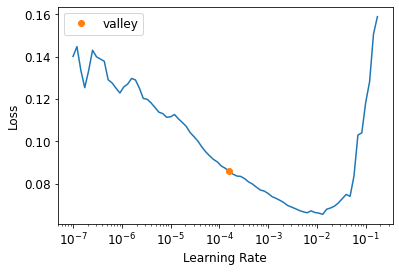

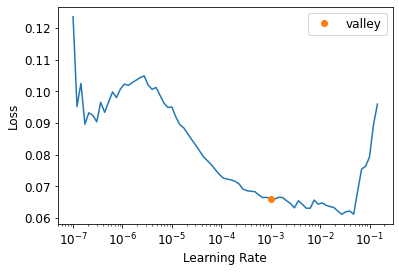

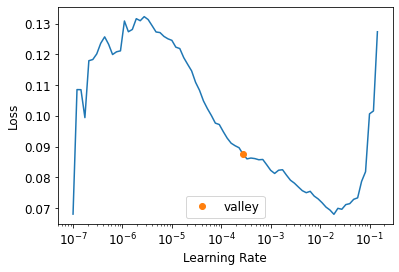

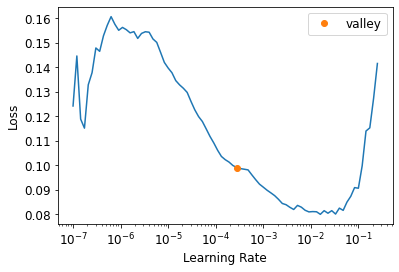

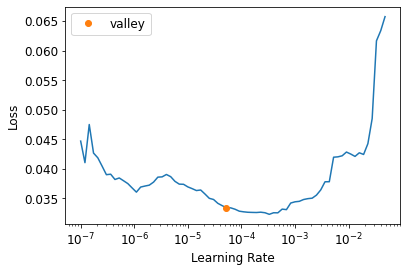

...

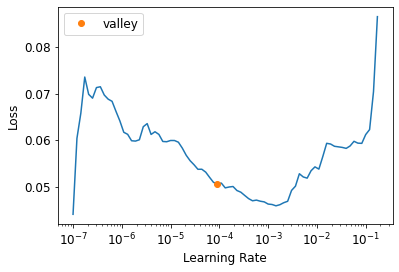

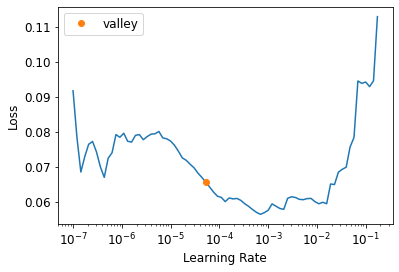

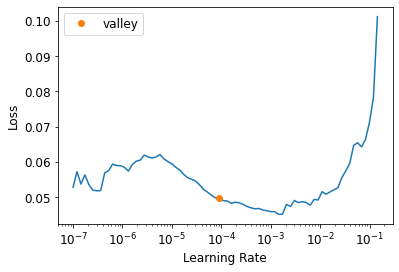

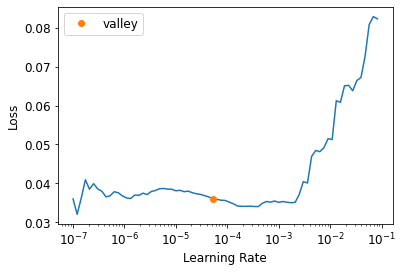

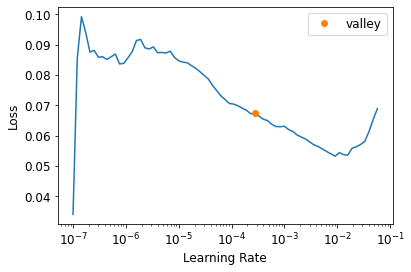

In [13]:
test_df = pd.read_csv(test_path, low_memory=False,skipinitialspace=True)
tensor_preds_list = np.zeros((len(test_df),n_train)) 
#tensor_preds_list = [None,None,None,None,None]
for i in range(0,n_train):
    learn = tabular_learner(list_dls[i],metrics=accuracy,layers=[500,250],loss_func=FocalLossFlat(gamma=5))
    learn.lr_find()
    learn.fit_one_cycle(10)
    #df.head()
    dl = learn.dls.test_dl(test_df)
    preds=learn.get_preds(dl=dl)    
    tensor_preds_list[:,i] = preds[0][:,1]
    tensor_preds_list[:,i] = tensor_preds_list[:,i].round()      

In [14]:
tensor_preds=tensor_preds_list.mean(axis=1).round()
tensor_preds

array([0., 0., 0., 0., 0., 0., 1., 0., 1., 0., 0., 0., 1., 0., 1., 1., 0., 0., 0., 0., 0., 0., 1., 0., 1., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 1., 0., 0., 0.,
       1., 0., 0., 0., 1., 1., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 1., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 1., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 1., 0., 1., 1., 0., 1., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0.,
       0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 1., 1., 0., 1., 0., 0., 0., 0., 0., 1., 0., 1., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 1., 0., 0., 0., 0., 0., 0., 0., 1., 1., 0., 0., 0., 0., 0., 0., 1., 0.,
     

In [15]:
gender_df = test_df.copy()
gender_df.drop([ 'Pclass', 'Name', 'Sex', 'Age', 'SibSp',
       'Parch', 'Ticket', 'Fare', 'Cabin', 'Embarked'], axis=1, inplace=True)
gender_df['Survived'] = tensor_preds
gender_df['Survived'] = gender_df['Survived'].astype('int64')
gender_df.head(10)

,PassengerId,Survived
0,892,0
1,893,0
2,894,0
3,895,0
4,896,0
5,897,0
6,898,1
7,899,0
8,900,1
9,901,0


In [16]:
gender_df.to_csv('./submission.csv',header=True,index=False)